In [3]:
import pandas as pd
import sqlite3
import datetime
import numpy as np
import matplotlib as mpl
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from matplotlib.ticker import PercentFormatter
import math
import Cdf
import Pmf
from urllib.parse import urlparse, parse_qs
mpl.rcParams['figure.dpi'] = 200
okabe_ito = ["#000000", "#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
sns.set_context('paper')
sns.set_palette(sns.color_palette(okabe_ito))
#https://stackoverflow.com/a/45846841
def human_format(num):
    num = float('{:.3g}'.format(num))
    magnitude = 0
    while abs(num) >= 1000:
        magnitude += 1
        num /= 1000.0
    return '{}{}'.format('{:f}'.format(num).rstrip('0').rstrip('.'), ['', 'K', 'M', 'B', 'T'][magnitude])
def make_cdf(series):
    return series.value_counts(normalize=True).sort_index().cumsum()
def make_pdf(series):
    return series.value_counts(normalize=True).sort_index()
from mpl_toolkits.axes_grid1 import make_axes_locatable
from datetime import datetime
mpl.rcParams['figure.dpi'] = 100
import pickle

In [594]:
vp_map_to_normal_names = {'Africa South': 'South Africa', 'Asia Pacific Northeast': 'Japan', 'Asia Pacific Southeast': 'Australia',
                         'Europe Central': 'Germany', 'US East':'US East', 'US West':'US West', 'South America East': 'Brazil'}

In [5]:
conn = sqlite3.connect('dataset/web-performance-youtube-merged.db')

#### remove measurements where googlevideo subdomain changed

In [6]:
#googlevideo_subdomains = pd.read_sql_query("SELECT msm_id, name FROM page_resources", conn)
#googlevideo_subdomains['googlevideo'] = googlevideo_subdomains.name.str.split('/').str[2]
#googlevideo_subdomains
all_subdomains = pd.read_sql_query("SELECT * FROM page_resources", conn)
googlevideo_subdomains = all_subdomains[all_subdomains.name.str.contains(".googlevideo.com/videoplayback")].copy()
googlevideo_subdomains.reset_index(drop=True, inplace=True)
googlevideo_subdomains['googlevideo'] = googlevideo_subdomains.name.str.split('/').str[2]
googlevideo_subdomains

,connectEnd,connectStart,decodedBodySize,domainLookupEnd,domainLookupStart,duration,encodedBodySize,entryType,fetchStart,initiatorType,name,nextHopProtocol,requestStart,responseEnd,responseStart,secureConnectionStart,startTime,transferSize,msm_id,googlevideo
0,6688.100000,6688.100000,66880,6688.100000,6688.100000,500.700000,66880.0,resource,6688.100000,xmlhttprequest,https://rr1---sn-woc7ln7y.googlevideo.com/vide...,h3,7133.200000,7188.800000,7156.8,6688.100000,6688.100000,67180,17915357-f2e4-81b4-acf7-b71255703ed8,rr1---sn-woc7ln7y.googlevideo.com
1,10747.000000,10747.000000,1632683,10747.000000,10747.000000,49.700000,1632683.0,resource,10747.000000,xmlhttprequest,https://rr1---sn-woc7ln7y.googlevideo.com/vide...,h3,10747.600000,10796.700000,10766.2,10747.000000,10747.000000,1632983,17915357-f2e4-81b4-acf7-b71255703ed8,rr1---sn-woc7ln7y.googlevideo.com
2,7267.300000,7267.300000,1339986,7267.300000,7267.300000,93.900000,1339986.0,resource,7267.300000,xmlhttprequest,https://rr1---sn-woc7ln7y.googlevideo.com/vide...,h3,7268.100000,7361.200000,7286.6,7267.300000,7267.300000,1340286,17915357-f2e4-81b4-acf7-b71255703ed8,rr1---sn-woc7ln7y.googlevideo.com
3,7210.800000,7210.800000,65536,7210.800000,7210.800000,22.599999,65536.0,resource,7210.800000,xmlhttprequest,https://rr1---sn-woc7ln7y.googlevideo.com/vide...,h3,7211.700000,7233.400000,7229.7,7210.800000,7210.800000,65836,17915357-f2e4-81b4-acf7-b71255703ed8,rr1---sn-woc7ln7y.googlevideo.com
4,7364.600000,7364.600000,146509,7364.600000,7364.600000,21.599999,146509.0,resource,7364.600000,xmlhttprequest,https://rr1---sn-woc7ln7y.googlevideo.com/vide...,h3,7365.400000,7386.200000,7383.4,7364.600000,7364.600000,146809,17915357-f2e4-81b4-acf7-b71255703ed8,rr1---sn-woc7ln7y.googlevideo.com
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
559512,3688.099999,3688.099999,5797,3688.099999,3688.099999,4.300000,5797.0,resource,3688.099999,xmlhttprequest,https://rr4---sn-o097znse.googlevideo.com/vide...,h3,3688.799999,3692.400000,3691.7,3688.099999,3688.099999,6097,d4f5957a-65ea-4b8c-86ad-2e494eebd37b,rr4---sn-o097znse.googlevideo.com
559513,3500.700000,3500.700000,191876,3500.700000,3500.700000,134.500000,191876.0,resource,3500.700000,xmlhttprequest,https://rr4---sn-o097znse.googlevideo.com/vide...,h3,3617.599999,3635.200000,3624.4,3500.700000,3500.700000,192176,d4f5957a-65ea-4b8c-86ad-2e494eebd37b,rr4---sn-o097znse.googlevideo.com
559514,3617.400000,3610.099999,66139,3610.099999,3503.700000,121.599999,66139.0,resource,3502.500000,xmlhttprequest,https://rr4---sn-o097znse.googlevideo.com/vide...,h3,3617.599999,3624.099999,3621.0,3610.299999,3502.500000,66439,d4f5957a-65ea-4b8c-86ad-2e494eebd37b,rr4---sn-o097znse.googlevideo.com
559515,3776.900000,3776.900000,155796,3776.900000,3776.900000,9.200000,155796.0,resource,3776.900000,xmlhttprequest,https://rr4---sn-o097znse.googlevideo.com/vide...,h3,3778.000000,3786.099999,3781.2,3776.900000,3776.900000,156096,d4f5957a-65ea-4b8c-86ad-2e494eebd37b,rr4---sn-o097znse.googlevideo.com


In [7]:
googlevideo_subdomains.groupby('msm_id', as_index=False).agg({'googlevideo':pd.Series.nunique}).sort_values('googlevideo').googlevideo.value_counts()

1    115389
2       824
3        37
4         1
Name: googlevideo, dtype: int64

In [897]:
pickle.dump(googlevideo_subdomains.groupby('msm_id', as_index=False).filter(lambda x: pd.Series.nunique(x['googlevideo']) > 1).msm_id.unique().tolist() , 
            open( "googlevideo_changed_during_msm.pickle", "wb" ) )

In [8]:
msm_ids_to_remove = googlevideo_subdomains.groupby('msm_id', as_index=False).filter(lambda x: pd.Series.nunique(x['googlevideo']) > 1).msm_id.unique().tolist()

#### remove measurement runs where resolution failed in the lookups table -- sadly the timestamps of dnsproxy are not reliable, so we cannot know from just looking at the lookups at which point of playback it failed -- in this run no googlevideo.com resolution failed, however removing them anyway in case it skews results -- also all errors happened over DoUDP

In [9]:
failed_lookups = pd.read_sql_query('SELECT measurement_id as msm_id FROM lookups WHERE status <> "NOERROR"', conn).msm_id.tolist()

In [10]:
len(failed_lookups)

17502

In [898]:
pickle.dump(failed_lookups, open( "servfail_during_msm.pickle", "wb" ) )

In [11]:
msm_ids_to_remove.extend(failed_lookups)

In [12]:
#conn = sqlite3.connect('web-performance-youtube-two-videos.db')
measurements = pd.read_sql_query("SELECT * FROM measurements", conn)
measurements
#conn.close()

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error
0,f3deb725-0a56-a6d8-71c1-fc134714f4c7,-1,-1.000000e+00,-1.000000e+00,tls,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:05.342675,auto,1280,720,0,5,aqz-KE-bpKQ,1,
1,17915357-f2e4-81b4-acf7-b71255703ed8,1650240030862687634,1.650240e+12,1.650240e+12,tls,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:15.296301,auto,1280,720,0,5,aqz-KE-bpKQ,0,
2,3da12ede-1a92-326c-d21e-ae3888de76fd,-1,-1.000000e+00,-1.000000e+00,https,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:35.554066,auto,1280,720,0,5,aqz-KE-bpKQ,1,
3,8297db7d-70e2-96ab-3824-ef58929e52d6,1650240061086062376,1.650240e+12,1.650240e+12,https,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:45.492315,auto,1280,720,0,5,aqz-KE-bpKQ,0,
4,df70a4fc-0544-d39f-c9cb-ead9f895746b,-1,-1.000000e+00,-1.000000e+00,quic,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:05.821507,auto,1280,720,0,5,aqz-KE-bpKQ,1,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253809,4d828157-98c1-20e7-ac56-0015c06a69c0,1650815779022777603,1.650816e+12,1.650816e+12,quic,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:08.580162,auto,1280,720,0,5,lqiN98z6Dak,0,
253810,b5334ee9-44f0-6567-9135-43114d62b032,-1,-1.000000e+00,-1.000000e+00,tcp,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:23.728047,auto,1280,720,0,5,lqiN98z6Dak,1,
253811,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,1650815799376591574,1.650816e+12,1.650816e+12,tcp,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:28.753468,auto,1280,720,0,5,lqiN98z6Dak,0,
253812,af3103fa-4ded-f577-770e-8dceab26598b,-1,-1.000000e+00,-1.000000e+00,udp,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:44.118970,auto,1280,720,0,5,lqiN98z6Dak,1,


In [10]:
#measurements = measurements[measurements.timestamp < '2022-03-11 17:30']

# data pre-processing

In [13]:
measurements.groupby(['cacheWarming', 'error']).agg({'msm_id':pd.Series.nunique})

msm_id
cacheWarming error                                                     
0                                                                118262
             failed driver.get() ### Message: timeout: Timed...       1
             failed driver.get() ### Message: timeout: Timed...       1
             failed driver.get() ### Message: timeout: Timed...       1
             failed driver.get() ### Message: timeout: Timed...       1
...                                                                 ...
1            failed driver.get() for cache warming ### Messa...       1
             failed driver.get() for cache warming ### Messa...       1
             failed driver.get() for cache warming ### Messa...       1
             failed driver.get() for cache warming ### Messa...       1
             failed loading player for cache warming ### Mes...   15316

[113 rows x 1 columns]

In [14]:
measurements = measurements[measurements.error == '']

remove cache warming runs early to reduce processing later on

In [15]:
measurements = measurements[measurements.cacheWarming == 0]

In [16]:
measurements.groupby('vantagePoint', as_index=False).agg({'msm_id':pd.Series.nunique})

,vantagePoint,msm_id
0,Africa South,16360
1,Asia Pacific Northeast,16915
2,Asia Pacific Southeast,16933
3,Europe Central,17007
4,South America East,17118
5,US East,16863
6,US West,17066


#### runs where the googlevideo subdomain changed -> no clear trend

In [17]:
measurements[measurements.msm_id.isin(msm_ids_to_remove)].groupby(['domain', 'player_width', 'player_height']).size()

domain       player_width  player_height
aqz-KE-bpKQ  1280          720              678
lqiN98z6Dak  1280          720              673
dtype: int64

In [18]:
measurements.msm_id.nunique()

118262

In [19]:
measurements = measurements[~measurements.msm_id.isin(msm_ids_to_remove)]

In [20]:
no_start_play_event_during_msm = pickle.load( open( "no_start_play_event_during_msm.pickle", "rb" ) )
no_quality_change_event_during_msm = pickle.load( open( "no_quality_change_event_during_msm.pickle", "rb" ) )

measurements = measurements[~measurements.msm_id.isin(no_start_play_event_during_msm)]
measurements = measurements[~measurements.msm_id.isin(no_quality_change_event_during_msm)]

In [21]:
measurements.msm_id.nunique()

116628

In [22]:
measurements['timestamp'] = pd.to_datetime(measurements['timestamp'])

In [23]:
measurements['player_width'] = measurements['player_width'].astype(str)
measurements['player_height'] = measurements['player_height'].astype(str)
measurements['player_dimensions'] = measurements['player_width']+"x"+measurements['player_height']

In [24]:
measurements[measurements.vantagePoint == 'Africa South'].groupby(['domain', 'player_dimensions', 'protocol']).agg({'msm_id':'count'})

msm_id
domain      player_dimensions protocol        
aqz-KE-bpKQ 1280x720          https       1608
                              quic        1601
                              tcp         1604
                              tls         1587
                              udp         1571
lqiN98z6Dak 1280x720          https       1591
                              quic        1596
                              tcp         1594
                              tls         1600
                              udp         1568

In [25]:
measurements[measurements.vantagePoint == 'Europe Central'].groupby(['domain', 'player_dimensions', 'protocol']).agg({'msm_id':'count'})

msm_id
domain      player_dimensions protocol        
aqz-KE-bpKQ 1280x720          https       1694
                              quic        1690
                              tcp         1673
                              tls         1692
                              udp         1630
lqiN98z6Dak 1280x720          https       1697
                              quic        1696
                              tcp         1677
                              tls         1702
                              udp         1644

In [26]:
measurements['protocol'] = measurements['protocol'].str.upper()

In [27]:
dns_proto_mapping = {'QUIC':'DoQ', 'HTTPS':'DoH', 'TLS':'DoT', 'TCP':'DoTCP', 'UDP':'DoUDP'}
def map_proto_to_dns(x):
    return dns_proto_mapping[x]
measurements['protocol'] = measurements['protocol'].map(map_proto_to_dns)

In [28]:
cache_warming_failed = pd.read_sql_query("SELECT msm_id as cw_msm_id, protocol, server, domain, vantagePoint, suggested_quality, (player_width || 'x' || player_height) as player_dimensions, timestamp, start_time, play_time, video_ids FROM measurements WHERE error <> '' AND cacheWarming = 1", conn)
cache_warming_failed['timestamp'] = pd.to_datetime(cache_warming_failed['timestamp'])
cache_warming_failed

,cw_msm_id,protocol,server,domain,vantagePoint,suggested_quality,player_dimensions,timestamp,start_time,play_time,video_ids
0,708db55e-38c6-9387-4dda-9fbc1f2aeb2b,tls,194.177.23.120,aqz-KE-bpKQ,Africa South,auto,1280x720,2022-04-18 00:14:13.657562,0,5,aqz-KE-bpKQ
1,a3255b2d-003d-d206-83df-d2c686ab24fc,https,194.177.23.120,aqz-KE-bpKQ,Africa South,auto,1280x720,2022-04-18 00:14:38.163219,0,5,aqz-KE-bpKQ
2,e91df07e-e808-7b99-e056-358cee5d9cd5,quic,194.177.23.120,aqz-KE-bpKQ,Africa South,auto,1280x720,2022-04-18 00:15:02.685426,0,5,aqz-KE-bpKQ
3,2c7e32c0-ac03-bf91-7c2a-e35da952f2c7,tcp,194.177.23.120,aqz-KE-bpKQ,Africa South,auto,1280x720,2022-04-18 00:15:27.225610,0,5,aqz-KE-bpKQ
4,35360251-f290-f3c9-25e1-8424bf05eb85,udp,194.177.23.120,aqz-KE-bpKQ,Africa South,auto,1280x720,2022-04-18 00:15:51.574293,0,5,aqz-KE-bpKQ
...,...,...,...,...,...,...,...,...,...,...,...
15395,1f131269-ba8d-7079-e403-91eeffe9c972,udp,198.244.209.255,lqiN98z6Dak,US West,auto,1280x720,2022-04-24 12:49:59.417704,0,5,lqiN98z6Dak
15396,0489cdcc-5dec-9983-3c8c-abaa5ee994f4,tcp,39.105.150.214,aqz-KE-bpKQ,US West,auto,1280x720,2022-04-24 14:27:33.078629,0,5,aqz-KE-bpKQ
15397,609eeeb6-13df-887b-d54d-27583de3de42,udp,39.105.150.214,aqz-KE-bpKQ,US West,auto,1280x720,2022-04-24 14:27:54.353807,0,5,aqz-KE-bpKQ
15398,dd788c30-1760-ba11-6ec2-7829b52adc0d,tcp,39.105.150.214,lqiN98z6Dak,US West,auto,1280x720,2022-04-24 14:29:41.651115,0,5,lqiN98z6Dak


In [26]:
#not necessary anymore, we cancel the measurement if something fails during cache warming
#measurements_to_remove_due_to_failed_cachewarming = pd.merge_asof(cache_warming_failed.sort_values('timestamp'), measurements.sort_values('timestamp'), by=['protocol', 'server', 'domain', 'vantagePoint', 'suggested_quality', 'player_dimensions', 'start_time', 'play_time', 'video_ids'], on='timestamp', direction='forward', tolerance=pd.Timedelta("30s")).dropna().msm_id.unique().tolist()
#if len(measurements_to_remove_due_to_failed_cachewarming) > 0:
#    measurements = measurements[~measurements.msm_id.isin(measurements_to_remove_due_to_failed_cachewarming)]

## find the optimal resolution as determined by the youtube player for each run

In [119]:
df_optimal_resolutions = pd.read_sql_query("""
SELECT msm_id, resolution, time FROM nerd_stats
""", conn)

In [120]:
df_optimal_resolutions['current_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[0]
df_optimal_resolutions['current_res'] = df_optimal_resolutions['current_res'].str.split('@').str[0]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['resolution'].str.split(' / ').str[1]
df_optimal_resolutions['optimal_res'] = df_optimal_resolutions['optimal_res'].str.split('@').str[0]
df_optimal_resolutions['time'] = pd.to_datetime(df_optimal_resolutions['time'], unit='ms', origin='unix')

In [121]:
df_optimal_resolutions = df_optimal_resolutions[['msm_id','optimal_res', 'time', 'current_res']]

In [122]:
df_optimal_resolutions.groupby('msm_id').optimal_res.nunique().sort_values()

msm_id
00012f1e-19ea-25bc-10c1-e6e364f48484    1
aa2e9d20-bb75-0436-91dd-9e40e568a9d4    1
aa2de387-49b6-2053-14b6-b1f1e8c172df    1
aa2d95e6-dee2-e409-eb5b-4903a28e8e02    1
aa2d6625-2d26-d787-1fe4-541de9fc2811    1
                                       ..
5533ac9f-9490-8f6d-4245-6c330acd0c7f    1
553316e7-2430-7169-3b59-a3722b65c3d2    1
55329a32-300d-6649-2876-0590a5499e22    1
5531aa4b-4d18-297f-dba8-52377fb57618    1
ffffa31f-f901-95b4-20b2-9bf91efb5e0c    1
Name: optimal_res, Length: 118262, dtype: int64

### filter out measurements where the player changes the optimal resolution within the run (mostly from 4k to 1440p)

In [123]:
s_filter_msm = df_optimal_resolutions.groupby('msm_id').optimal_res.nunique()

In [124]:
s_filter_msm[s_filter_msm > 1].index.tolist()

[]

In [125]:
df_optimal_resolutions[df_optimal_resolutions.msm_id.isin(s_filter_msm[s_filter_msm > 1].index.tolist())].sort_values('time').groupby(['msm_id', 'optimal_res']).agg({'time':'min'}).sort_values('time')

,,time
msm_id,optimal_res,


first idea: we take the nerd stats optimal res at the end of playback (i.e. the furthest in terms of video playback) as the "true" optimal res  ------ probably dumb idea, see example above, for now just filter out the ones with multiple optimal resolutions?

In [126]:
#assert set(df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.value_counts().values) == {1}
#assert df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].msm_id.nunique() == measurements.msm_id.nunique()
#df_optimal_resolutions = df_optimal_resolutions.loc[df_optimal_resolutions.groupby('msm_id').time.idxmax()].reset_index(drop=True)


In [127]:
df_msms_with_multiple_opt_res = df_optimal_resolutions.groupby('msm_id', as_index=False).agg(opt_res_num=('optimal_res',pd.Series.nunique), opt_res_list=('optimal_res',pd.Series.unique)).sort_values('opt_res_num')

In [128]:
df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1]

,msm_id,opt_res_num,opt_res_list


In [129]:
measurements_to_remove = df_msms_with_multiple_opt_res[df_msms_with_multiple_opt_res.opt_res_num > 1].msm_id.unique().tolist()

In [130]:
measurements_to_remove

[]

In [131]:
measurements[measurements.msm_id.isin(measurements_to_remove)].player_dimensions.value_counts()

Series([], Name: player_dimensions, dtype: int64)

In [132]:
measurements[measurements.msm_id.isin(measurements_to_remove)].protocol.value_counts()

Series([], Name: protocol, dtype: int64)

In [133]:
#measurements[measurements.player_dimensions == "3840x2160"].protocol.value_counts()

In [134]:
measurements[measurements.player_dimensions == "1280x720"].protocol.value_counts()

DoT      23517
DoQ      23509
DoH      23452
DoTCP    23291
DoUDP    22852
Name: protocol, dtype: int64

In [135]:
measurements = measurements[~measurements.msm_id.isin(measurements_to_remove)]

In [136]:
df_optimal_resolutions = df_optimal_resolutions[~df_optimal_resolutions.msm_id.isin(measurements_to_remove)][['msm_id', 'optimal_res']].drop_duplicates().reset_index().drop('index', axis=1)

In [137]:
df_optimal_resolutions

,msm_id,optimal_res
0,17915357-f2e4-81b4-acf7-b71255703ed8,1280x720
1,8297db7d-70e2-96ab-3824-ef58929e52d6,1280x720
2,fb06c88b-3fed-edba-5b29-27e4972a583a,1280x720
3,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,1280x720
4,d94c98d2-b7ae-30cf-1b77-0d03406c2669,1280x720
...,...,...
118257,08a2d00a-8951-9748-8dc7-ee34bdbf8923,1280x720
118258,4b735559-a6d4-b2cc-f612-cf9dca1c613d,1280x720
118259,4d828157-98c1-20e7-ac56-0015c06a69c0,1280x720
118260,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,1280x720


In [138]:
df_optimal_resolutions = pd.merge(df_optimal_resolutions, measurements[['msm_id', 'player_dimensions']], on='msm_id')
df_optimal_resolutions

,msm_id,optimal_res,player_dimensions
0,17915357-f2e4-81b4-acf7-b71255703ed8,1280x720,1280x720
1,8297db7d-70e2-96ab-3824-ef58929e52d6,1280x720,1280x720
2,fb06c88b-3fed-edba-5b29-27e4972a583a,1280x720,1280x720
3,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,1280x720,1280x720
4,d94c98d2-b7ae-30cf-1b77-0d03406c2669,1280x720,1280x720
...,...,...,...
116616,08a2d00a-8951-9748-8dc7-ee34bdbf8923,1280x720,1280x720
116617,4b735559-a6d4-b2cc-f612-cf9dca1c613d,1280x720,1280x720
116618,4d828157-98c1-20e7-ac56-0015c06a69c0,1280x720,1280x720
116619,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,1280x720,1280x720


### make sure the optimal resolutions match what we set as the player size

In [139]:
df_optimal_resolutions[df_optimal_resolutions.optimal_res != df_optimal_resolutions.player_dimensions]

,msm_id,optimal_res,player_dimensions


### make sure each run has a start playing event that fired before 1s of playtime passed (there seems to always be a little bit of playtime (i.e. the curr play time when the event fires is never zero) presumably due to the delay from javascript execution between getting the playback time within the callback)

In [140]:
df_player_state_playing = pd.read_sql_query("select time, msm_id, curr_play_time from iframe_api where event_type = 'PlayerStatePLAYING'", conn)

In [141]:
df_player_state_playing[df_player_state_playing.curr_play_time > 1].curr_play_time.describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: curr_play_time, dtype: float64

In [142]:
df_player_state_playing[df_player_state_playing.curr_play_time < 1].curr_play_time.describe()

count    117700.000000
mean          0.022080
std           0.010739
min           0.001005
25%           0.017115
50%           0.020716
75%           0.024097
max           0.546997
Name: curr_play_time, dtype: float64

In [143]:
df_player_state_intial_playback = df_player_state_playing[(df_player_state_playing.curr_play_time < 1) & 
                                    (df_player_state_playing.msm_id.isin(measurements.msm_id.unique()))]

make sure each measurement only has one corresponding initial playing state event and that all measurements have such an event

In [144]:
assert set(df_player_state_intial_playback.msm_id.value_counts().values) == {1}
assert pd.Series.nunique(df_player_state_intial_playback.msm_id.value_counts().index) == \
pd.Series.nunique(measurements['msm_id'])

## apparently some measurements didnt start playing but also did not errror out...

In [145]:
df_player_state_intial_playback[~df_player_state_intial_playback.msm_id.isin(measurements.msm_id.unique())]

,time,msm_id,curr_play_time


In [146]:
measurements[~measurements.msm_id.isin(df_player_state_intial_playback.msm_id.unique())]

,msm_id,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions


In [147]:
pd.read_sql_query("select * from iframe_api where msm_id = '65e58465-b21b-9e4b-0980-cb2799c29c32'", conn)

,time,event_type,buffer_perc,curr_play_time,video_dur,current_quality,available_qualities,msm_id
0,1.650243e+12,PlayerReady,-1.0,-1.0,-1.0,-1,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
1,1.650243e+12,PlayerStateCUED,0.0,0.0,-1.0,unknown,[],65e58465-b21b-9e4b-0980-cb2799c29c32
2,1.650243e+12,PlayStartedFromFunction,-1.0,-1.0,635.0,-1,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
3,1.650243e+12,PlayerStateBUFFERING,0.0,0.0,-1.0,unknown,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
4,1.650243e+12,BufferLogging,0.0,0.0,-1.0,unknown,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
5,1.650243e+12,QualityChangeLarge,0.0,0.0,-1.0,large,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
6,1.650243e+12,BufferLogging,0.0,0.0,-1.0,large,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
7,1.650243e+12,BufferLogging,0.0,0.0,-1.0,large,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
8,1.650243e+12,BufferLogging,0.0,0.0,-1.0,large,-1,65e58465-b21b-9e4b-0980-cb2799c29c32
9,1.650243e+12,BufferLogging,0.0,0.0,-1.0,large,-1,65e58465-b21b-9e4b-0980-cb2799c29c32


In [148]:
pd.Series.nunique(df_player_state_intial_playback.msm_id.value_counts().index)

116621

In [149]:
pd.Series.nunique(measurements['msm_id'])

116621

In [150]:
measurements[~measurements.msm_id.isin(df_player_state_intial_playback.msm_id.unique())].msm_id.unique().tolist()

[]

In [ ]:
pickle.dump(measurements[~measurements.msm_id.isin(df_player_state_intial_playback.msm_id.unique())].msm_id.unique().tolist(), 
            open( "no_start_play_event_during_msm.pickle", "wb" ) )

In [151]:
measurements = measurements[measurements.msm_id.isin(df_player_state_intial_playback.msm_id.unique())]
measurements.reset_index(drop=True, inplace=True)

## as below in the case that we do not have a quality change event, start again at finding optimal resolutions

In [152]:
assert set(df_player_state_intial_playback.msm_id.value_counts().values) == {1}
assert pd.Series.nunique(df_player_state_intial_playback.msm_id.value_counts().index) == \
pd.Series.nunique(measurements['msm_id'])

### if the 1s metric produced a unique start playing state event for each run, we can use it to calculate the startup delay between when we tell the player to start playing and when it actually plays

In [153]:
df_start_time = pd.read_sql_query("""
SELECT start_time, play_time, msm_id, current_quality AS initial_quality FROM
(SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction')
JOIN
(SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1)
USING (msm_id);
""", conn)
df_start_time = df_start_time[df_start_time.msm_id.isin(measurements.msm_id.unique())]

df_start_time['start_time'] = pd.to_datetime(df_start_time['start_time'], unit='ms', origin='unix')
df_start_time['play_time'] = pd.to_datetime(df_start_time['play_time'], unit='ms', origin='unix')

df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [154]:
df_start_time

,start_time,play_time,msm_id,initial_quality,startup_delay
0,2022-04-18 00:00:24.450100224,2022-04-18 00:00:25.683000064,17915357-f2e4-81b4-acf7-b71255703ed8,hd720,1.2329
1,2022-04-18 00:00:54.679099904,2022-04-18 00:00:55.919599872,8297db7d-70e2-96ab-3824-ef58929e52d6,hd720,1.2405
2,2022-04-18 00:01:24.561699840,2022-04-18 00:01:25.818100224,fb06c88b-3fed-edba-5b29-27e4972a583a,hd720,1.2564
3,2022-04-18 00:01:55.399300096,2022-04-18 00:01:56.977899776,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,hd720,1.5786
4,2022-04-18 00:02:23.891399936,2022-04-18 00:02:25.090200064,d94c98d2-b7ae-30cf-1b77-0d03406c2669,hd720,1.1988
...,...,...,...,...,...
117695,2022-04-24 15:55:31.871099904,2022-04-24 15:55:32.416499968,08a2d00a-8951-9748-8dc7-ee34bdbf8923,hd720,0.5454
117696,2022-04-24 15:55:52.322900224,2022-04-24 15:55:52.845600000,4b735559-a6d4-b2cc-f612-cf9dca1c613d,hd720,0.5227
117697,2022-04-24 15:56:12.684300032,2022-04-24 15:56:13.185600000,4d828157-98c1-20e7-ac56-0015c06a69c0,hd720,0.5013
117698,2022-04-24 15:56:32.984900096,2022-04-24 15:56:33.680800000,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,hd720,0.6959


### for each measurement we call getQuality when the player fires the start playing callback, however this seems to again be susceptible to some delay, some measurements have quality change events for that resolution fire __after__ the recorded timestamp for the playing event ---> thus we figure out the quality change event that happened closest to the timestamp of the start playing event but still happened before it

In [155]:
df_player_quality_change_event = pd.read_sql_query("select msm_id, time, curr_play_time, current_quality from iframe_api where event_type LIKE 'QualityChange%'", conn)
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.msm_id.isin(measurements.msm_id.unique())]

In [156]:
df_player_quality_change_event['time'] = pd.to_datetime(df_player_quality_change_event['time'], unit='ms', origin='unix')

In [157]:
df_player_quality_change_event.curr_play_time.value_counts().sort_index()

0.000000    220340
0.005297         1
0.005712         1
0.007294         1
0.007870         1
             ...  
3.056681         1
3.110200         1
3.159538         1
3.176259         1
5.372447         1
Name: curr_play_time, Length: 12419, dtype: int64

In [158]:
df_player_quality_change_event[df_player_quality_change_event.curr_play_time == 0].msm_id.value_counts()

17915357-f2e4-81b4-acf7-b71255703ed8    2
95b85d70-43ff-dad1-9b7f-aab14e35af20    2
a99993af-3920-39e1-13b7-18fd54771d96    2
98c2276a-8f54-53ac-01d8-b1b73e38e706    2
a4ac5bc8-b571-5809-11a2-5e917e03e236    2
                                       ..
d0a11f13-8d4f-8afa-e5b6-466ecffc4f88    1
142c79df-da12-c0cb-b11d-efea9dda667f    1
e23122ac-ea0e-41e9-518f-88f4fc65a48e    1
a8088fb6-91ff-8a34-661f-fb21261d0e9b    1
99621367-fd71-c59b-d0ce-c2cb1b4a9d62    1
Name: msm_id, Length: 116621, dtype: int64

In [159]:
df_true_initial_quality = pd.merge(df_start_time[['msm_id', 'play_time', 'initial_quality']], df_player_quality_change_event[df_player_quality_change_event.curr_play_time < 1][['time', 'current_quality', 'msm_id']], on='msm_id')


In [160]:
df_true_initial_quality['delay_to_play_time'] = (df_true_initial_quality['play_time'] - df_true_initial_quality['time']).dt.total_seconds()

In [161]:
df_true_initial_quality = df_true_initial_quality[df_true_initial_quality.delay_to_play_time > 0]

In [162]:
df_true_initial_quality = df_true_initial_quality.loc[df_true_initial_quality.groupby('msm_id').delay_to_play_time.idxmin()].reset_index(drop=True)

In [163]:
df_true_initial_quality[df_true_initial_quality.initial_quality != df_true_initial_quality.current_quality]

,msm_id,play_time,initial_quality,time,current_quality,delay_to_play_time
19,000fdb73-934d-af17-fa59-4092aeec540f,2022-04-20 06:33:12.132199936,hd720,2022-04-20 06:33:11.880599808,large,0.2516
43,001cc690-4d62-3272-3ac0-c10fcf9b5d60,2022-04-21 06:55:22.784899840,hd720,2022-04-21 06:55:22.319800064,large,0.4651
57,002b5692-a792-743c-2231-a5c520acf55e,2022-04-22 08:59:01.407000064,hd720,2022-04-22 08:59:00.722599936,large,0.6844
60,002dad8c-eb0e-c446-4450-523de7e81a67,2022-04-24 01:57:15.956999936,hd720,2022-04-24 01:57:15.470599936,large,0.4864
91,003fb8a8-b926-2e06-3c01-6db5ef4a1374,2022-04-21 12:17:08.716999936,hd720,2022-04-21 12:17:08.167400192,large,0.5496
...,...,...,...,...,...,...
116325,ff4a60be-c8ab-6ceb-9c51-af2c68ea9946,2022-04-21 07:24:01.564499968,hd720,2022-04-21 07:24:01.184600064,large,0.3799
116327,ff4bb27e-db8a-65a9-169b-e8ae3cb0752b,2022-04-24 10:53:11.932499968,hd720,2022-04-24 10:53:11.691099904,large,0.2414
116424,ff7ede81-e239-0e00-7dc9-af354a6df91d,2022-04-22 10:45:56.180499968,hd720,2022-04-22 10:45:55.554700032,large,0.6258
116535,ffc69018-f289-dfc1-bc8d-09594ae218f4,2022-04-19 03:36:59.486700032,hd720,2022-04-19 03:36:58.887500032,large,0.5992


In [164]:
df_true_initial_quality.rename(columns=lambda x: x.replace('current_quality', 'true_initial_quality'), inplace=True)

In [165]:
df_true_initial_quality

,msm_id,play_time,initial_quality,time,true_initial_quality,delay_to_play_time
0,00012f1e-19ea-25bc-10c1-e6e364f48484,2022-04-24 17:11:49.568499968,hd720,2022-04-24 17:11:49.524000000,hd720,0.0445
1,0001d55d-a608-3d7e-add2-3b061f3cfa5e,2022-04-18 15:49:36.719000064,hd720,2022-04-18 15:49:36.621799936,hd720,0.0972
2,00023eac-662a-c2a0-c9e6-652ab7565c72,2022-04-23 14:39:23.814700288,large,2022-04-23 14:39:22.438100224,large,1.3766
3,0002ca72-df82-4f3d-c0f7-a3f9deff7eeb,2022-04-20 15:57:49.516399872,hd720,2022-04-20 15:57:49.417799936,hd720,0.0986
4,00036907-810c-8a6d-3902-70a042f8ac85,2022-04-22 02:18:42.969899776,hd720,2022-04-22 02:18:42.889299968,hd720,0.0806
...,...,...,...,...,...,...
116616,ffff172a-57e8-010d-e1ff-9c9734ced527,2022-04-18 04:38:34.459200000,hd720,2022-04-18 04:38:34.368000000,hd720,0.0912
116617,ffff2229-1ec5-97e8-ef49-d64eec1d6d7f,2022-04-18 13:22:30.517700096,hd720,2022-04-18 13:22:30.423400192,hd720,0.0943
116618,ffff2b0f-7f18-8d09-67c6-6c1650d68253,2022-04-24 11:39:13.445600000,hd720,2022-04-24 11:39:13.354300160,hd720,0.0913
116619,ffff55d6-d430-228a-1682-37e7e451d8d2,2022-04-21 07:53:55.407100160,hd720,2022-04-21 07:53:55.382100224,hd720,0.0250


### helper functions

In [166]:
res_to_quality = {
    "unknown":"auto","256x144":"tiny", "426x240": "small", "640x360": "medium", "854x480": "large",
    "1280x720": "hd720", "1920x1080": "hd1080", "2560x1440": "hd1440", "3840x2160": "hd2160"
}

quality_to_res = {v: k for k, v in res_to_quality.items()}

def map_quality_to_res(quality):
    return quality_to_res[quality]
def map_res_to_quality(resolution):
    return res_to_quality[resolution]

def make_quality_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['auto', 'tiny', 'small', 'medium', 'large', 'hd720', 'hd1080', 'highres', 'hd1440', 'hd2160'])

def make_res_column_sortable(df_, col_name_):
    df_[col_name_] = pd.Categorical(df_[col_name_], ['256x144', '426x240', '640x360', '854x480', '1280x720', '1920x1080', '2560x1440', '3840x2160'])

In [167]:
quality_to_res

{'auto': 'unknown',
 'tiny': '256x144',
 'small': '426x240',
 'medium': '640x360',
 'large': '854x480',
 'hd720': '1280x720',
 'hd1080': '1920x1080',
 'hd1440': '2560x1440',
 'hd2160': '3840x2160'}

In [168]:
df_resource_timing = pd.read_sql_query("SELECT msm_id, name, nextHopProtocol, domainLookupStart, domainLookupEnd FROM page_resources", conn)
#df_resource_timing = df_resource_timing[df_resource_timing.msm_id.isin(measurements.msm_id.unique())]

In [169]:
df_resource_timing = df_resource_timing[df_resource_timing.name.str.contains(".googlevideo.com/videoplayback")]
df_resource_timing.reset_index(drop=True, inplace=True)
df_resource_timing['googlevideo'] = df_resource_timing.name.str.split('/').str[2]

In [170]:
df_resource_timing.googlevideo.unique()

array(['rr1---sn-woc7ln7y.googlevideo.com',
       'rr4---sn-woc7ln7y.googlevideo.com',
       'rr4---sn-q0cedn7s.googlevideo.com',
       'rr4---sn-5hnekn7k.googlevideo.com',
       'rr5---sn-5hnekn7k.googlevideo.com',
       'rr4---sn-q0c7rn76.googlevideo.com',
       'rr4---sn-h5qzen7y.googlevideo.com',
       'rr2---sn-h5qzen7y.googlevideo.com',
       'rr3---sn-q0c7rn76.googlevideo.com',
       'rr4---sn-h5q7knes.googlevideo.com',
       'rr4---sn-h5q7knez.googlevideo.com',
       'r3---sn-q0c7rn76.googlevideo.com', 'redirector.googlevideo.com',
       'rr3---sn-h5qzen7s.googlevideo.com',
       'r4---sn-q0cedn7s.googlevideo.com',
       'r4---sn-q0c7rn76.googlevideo.com',
       'rr1---sn-woc7lne7.googlevideo.com',
       'rr4---sn-woc7lne7.googlevideo.com',
       'r1---sn-woc7ln7y.googlevideo.com',
       'r4---sn-woc7ln7y.googlevideo.com',
       'rr5---sn-un57en7l.googlevideo.com',
       'rr3---sn-un57sn76.googlevideo.com',
       'rr4---sn-un57enel.googlevideo.com',
       

In [171]:
def find_initial_requests(url_):
    parse_res = urlparse(url_)
    opts = parse_qs(parse_res.query)
    if opts['range'][0][0] == '0':
        return True
    return False
df_resource_timing['first_request'] = df_resource_timing['name'].map(find_initial_requests)

In [172]:
df_resource_timing['h1_first_request'] = False
df_resource_timing['h1_first_request'] = np.where((df_resource_timing.nextHopProtocol == 'http/1.1') & (df_resource_timing.first_request == True), True, df_resource_timing['h1_first_request'])

In [173]:
df_resource_timing = pd.merge(df_resource_timing, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp, vantagePoint, protocol, server, domain FROM measurements", conn))

In [174]:
df_resource_timing[df_resource_timing.cacheWarming == 0].groupby('msm_id', as_index=False).agg({'googlevideo':pd.Series.nunique}).sort_values('googlevideo')

,msm_id,googlevideo
0,00012f1e-19ea-25bc-10c1-e6e364f48484,1
77354,a9d35f9f-a7f8-1d64-ba2c-eecd8f787c70,1
77353,a9d32997-6f6a-7675-cea3-8bda5230c0dd,1
77352,a9d308bb-a445-020c-31ae-a77c717c6372,1
77351,a9d2a742-2f72-1f5c-d111-80a7f479a7e0,1
...,...,...
5662,0ca28fa0-ec06-2a3b-d351-0c03fd4dc874,3
80862,b1a5afa6-0c44-bb09-3620-5cb843367d53,3
89922,c592dc57-332c-b9ab-e2ba-b0027233fc78,3
71772,9d93b0b4-0daa-94a7-ffd8-623417606736,3


In [175]:
df_caught_first_request = df_resource_timing.groupby('msm_id', as_index=False).agg({'first_request': lambda x: sum(x) > 0, 'h1_first_request': lambda x: sum(x) > 0})

In [176]:
print(df_caught_first_request[df_caught_first_request.first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == True].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.h1_first_request == False].msm_id.nunique())
print(df_caught_first_request.msm_id.nunique())

51432
64819
116251
0
116251
116251


In [177]:
df_caught_first_request = pd.merge(df_caught_first_request, pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn))

In [178]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 0)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 0].msm_id.nunique())

51432
64819
116251
0
116251
116251


In [179]:
print(df_caught_first_request[(df_caught_first_request.first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == True) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[(df_caught_first_request.h1_first_request == False) & (df_caught_first_request.cacheWarming == 1)].msm_id.nunique())
print(df_caught_first_request[df_caught_first_request.cacheWarming == 1].msm_id.nunique())

0
0
0
0
0
0


In [180]:
df_resource_timing.msm_id.nunique()

116251

In [181]:
df_resource_timing.domainLookupStart.describe()

count    559517.000000
mean       5816.128987
std        2353.198821
min           0.000000
25%        3976.800000
50%        5094.200000
75%        7682.500000
max       18482.599999
Name: domainLookupStart, dtype: float64

In [182]:
df_resource_timing.domainLookupEnd.describe()

count    559517.000000
mean       5836.851785
std        2343.056170
min           0.000000
25%        4014.800000
50%        5126.700000
75%        7691.100000
max       18482.599999
Name: domainLookupEnd, dtype: float64

In [183]:
df_resource_timing[df_resource_timing.domainLookupStart == 0]

,msm_id,name,nextHopProtocol,domainLookupStart,domainLookupEnd,googlevideo,first_request,h1_first_request,cacheWarming,player_dimensions,timestamp,vantagePoint,protocol,server,domain
5630,c6cb12f4-984a-477f-3053-048bca814582,https://rr4---sn-woc7ln7y.googlevideo.com/vide...,,0.0,0.0,rr4---sn-woc7ln7y.googlevideo.com,True,False,0,1280x720,2022-04-18 08:49:08.918572,Africa South,https,93.115.24.205,lqiN98z6Dak
5631,c6cb12f4-984a-477f-3053-048bca814582,https://rr4---sn-q0c7rn76.googlevideo.com/vide...,,0.0,0.0,rr4---sn-q0c7rn76.googlevideo.com,True,False,0,1280x720,2022-04-18 08:49:08.918572,Africa South,https,93.115.24.205,lqiN98z6Dak
5632,c6cb12f4-984a-477f-3053-048bca814582,https://rr4---sn-q0c7rn76.googlevideo.com/vide...,,0.0,0.0,rr4---sn-q0c7rn76.googlevideo.com,True,False,0,1280x720,2022-04-18 08:49:08.918572,Africa South,https,93.115.24.205,lqiN98z6Dak
5633,c6cb12f4-984a-477f-3053-048bca814582,https://rr4---sn-q0c7rn76.googlevideo.com/vide...,,0.0,0.0,rr4---sn-q0c7rn76.googlevideo.com,True,False,0,1280x720,2022-04-18 08:49:08.918572,Africa South,https,93.115.24.205,lqiN98z6Dak
5634,c6cb12f4-984a-477f-3053-048bca814582,https://rr4---sn-woc7ln7y.googlevideo.com/vide...,,0.0,0.0,rr4---sn-woc7ln7y.googlevideo.com,True,False,0,1280x720,2022-04-18 08:49:08.918572,Africa South,https,93.115.24.205,lqiN98z6Dak
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
558251,67c79b4f-54e7-41a0-cf2a-1111920812f6,https://rr4---sn-nx5s7n7y.googlevideo.com/vide...,,0.0,0.0,rr4---sn-nx5s7n7y.googlevideo.com,True,False,0,1280x720,2022-04-24 14:29:21.676520,US West,quic,39.105.150.214,lqiN98z6Dak
558252,67c79b4f-54e7-41a0-cf2a-1111920812f6,https://rr4---sn-nx5s7n7y.googlevideo.com/vide...,,0.0,0.0,rr4---sn-nx5s7n7y.googlevideo.com,True,False,0,1280x720,2022-04-24 14:29:21.676520,US West,quic,39.105.150.214,lqiN98z6Dak
558253,67c79b4f-54e7-41a0-cf2a-1111920812f6,https://rr4---sn-o097znse.googlevideo.com/vide...,,0.0,0.0,rr4---sn-o097znse.googlevideo.com,True,False,0,1280x720,2022-04-24 14:29:21.676520,US West,quic,39.105.150.214,lqiN98z6Dak
558254,67c79b4f-54e7-41a0-cf2a-1111920812f6,https://rr4---sn-o097znse.googlevideo.com/vide...,,0.0,0.0,rr4---sn-o097znse.googlevideo.com,True,False,0,1280x720,2022-04-24 14:29:21.676520,US West,quic,39.105.150.214,lqiN98z6Dak


In [184]:
all_measurements = pd.read_sql_query("SELECT msm_id, cacheWarming, (player_width || 'x' || player_height) as player_dimensions, timestamp FROM measurements", conn)

In [185]:
df_start_time = pd.merge(df_start_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']])

In [186]:
#df_start_time = df_start_time[df_start_time.cacheWarming == 0]

In [187]:
df_start_time.protocol.value_counts()

DoT      23517
DoQ      23509
DoH      23452
DoTCP    23291
DoUDP    22852
Name: protocol, dtype: int64

In [188]:
df_start_time = pd.merge(df_start_time, df_true_initial_quality[['msm_id', 'true_initial_quality']], on='msm_id')

In [189]:
df_start_time[df_start_time.initial_quality != df_start_time.true_initial_quality]

,start_time,play_time,msm_id,initial_quality,startup_delay,player_dimensions,protocol,vantagePoint,domain,true_initial_quality
18,2022-04-18 00:08:57.887099904,2022-04-18 00:08:59.121799936,f157ddd8-fd7b-b65e-9fca-c38ce6cce954,hd720,1.2347,1280x720,DoTCP,Africa South,lqiN98z6Dak,large
131,2022-04-18 01:14:13.831300096,2022-04-18 01:14:14.459800064,bf8c69be-c82a-a839-fa5b-f456a1150014,hd720,0.6285,1280x720,DoQ,Africa South,lqiN98z6Dak,large
160,2022-04-18 01:26:23.929499904,2022-04-18 01:26:24.678100224,4716abf8-75d9-8c60-e96d-30e1f7bdfc07,hd720,0.7486,1280x720,DoH,Africa South,lqiN98z6Dak,large
240,2022-04-18 02:13:51.473399808,2022-04-18 02:13:52.356099840,360f7777-4491-3cac-da8b-5f6228540dba,hd720,0.8827,1280x720,DoH,Africa South,lqiN98z6Dak,large
279,2022-04-18 02:28:38.550200064,2022-04-18 02:28:39.715300096,e5b1d72d-dd9b-7c7a-4915-6fb6642d5e12,hd720,1.1651,1280x720,DoT,Africa South,lqiN98z6Dak,large
...,...,...,...,...,...,...,...,...,...,...
116351,2022-04-24 14:18:05.908400128,2022-04-24 14:18:06.608700160,fe3e42b5-8783-e7b9-1478-637182bb320d,hd720,0.7003,1280x720,DoH,US West,lqiN98z6Dak,large
116362,2022-04-24 14:21:30.431000064,2022-04-24 14:21:31.025600000,b1083a6c-b798-3e7f-b028-6efeb2183dc0,hd720,0.5946,1280x720,DoQ,US West,lqiN98z6Dak,large
116521,2022-04-24 15:19:50.541100032,2022-04-24 15:19:51.098700288,f94ef839-0e5a-1c52-291f-0ec536fa0278,hd720,0.5576,1280x720,DoQ,US West,lqiN98z6Dak,large
116548,2022-04-24 15:30:19.690200064,2022-04-24 15:30:20.081399808,9030eb0b-fb7d-2e8e-dc54-c6f559862df1,hd720,0.3912,1280x720,DoT,US West,lqiN98z6Dak,large


In [190]:
make_quality_column_sortable(df_start_time, 'true_initial_quality')
make_quality_column_sortable(df_start_time, 'initial_quality')
make_res_column_sortable(df_start_time, 'player_dimensions')

In [191]:
df_start_time['player_dimensions_as_quality'] = df_start_time['player_dimensions'].map(map_res_to_quality)

In [192]:
pd.set_option('display.max_rows', 100)

In [193]:
df_start_time['suggested_with_initial_quality'] = df_start_time['player_dimensions_as_quality'].astype(str) +'<-'+ df_start_time['true_initial_quality'].astype(str)

In [194]:
df_start_time[df_start_time.domain == 'aqz-KE-bpKQ'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

msm_id
suggested_with_initial_quality protocol        
hd720<-hd720                   DoH        11159
                               DoQ        11195
                               DoT        11167
                               DoTCP      11095
                               DoUDP      10876
hd720<-large                   DoH          573
                               DoQ          566
                               DoT          571
                               DoTCP        554
                               DoUDP        551

In [195]:
df_start_time[df_start_time.domain == 'lqiN98z6Dak'].groupby(['suggested_with_initial_quality', 'protocol']).agg({'msm_id':pd.Series.nunique}).dropna()

msm_id
suggested_with_initial_quality protocol        
hd720<-hd720                   DoH         9849
                               DoQ         9915
                               DoT         9316
                               DoTCP       9904
                               DoUDP       9660
hd720<-large                   DoH         1871
                               DoQ         1833
                               DoT         2463
                               DoTCP       1738
                               DoUDP       1765

In [196]:
df_player_quality_change_event['curr_qual_as_res'] = df_player_quality_change_event['current_quality'].map(map_quality_to_res)

In [197]:
df_player_started = pd.read_sql_query("""
SELECT time AS start_time, msm_id FROM iframe_api WHERE event_type = 'PlayStartedFromFunction'
""", conn)
df_player_started = df_player_started[df_player_started.msm_id.isin(measurements.msm_id.unique())]

df_player_started['start_time'] = pd.to_datetime(df_player_started['start_time'], unit='ms', origin='unix')


#df_start_time['startup_delay'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds()

In [198]:
df_player_quality_change_event = pd.merge(df_player_quality_change_event, df_optimal_resolutions[['msm_id', 'optimal_res']], on='msm_id')
df_player_quality_change_event

,msm_id,time,curr_play_time,current_quality,curr_qual_as_res,optimal_res
0,17915357-f2e4-81b4-acf7-b71255703ed8,2022-04-18 00:00:25.053400064,0.000000,large,854x480,1280x720
1,17915357-f2e4-81b4-acf7-b71255703ed8,2022-04-18 00:00:25.596600064,0.000000,hd720,1280x720,1280x720
2,8297db7d-70e2-96ab-3824-ef58929e52d6,2022-04-18 00:00:55.289199872,0.000000,large,854x480,1280x720
3,8297db7d-70e2-96ab-3824-ef58929e52d6,2022-04-18 00:00:55.842800128,0.000000,hd720,1280x720,1280x720
4,fb06c88b-3fed-edba-5b29-27e4972a583a,2022-04-18 00:01:25.164199936,0.000000,large,854x480,1280x720
...,...,...,...,...,...,...
232771,4d828157-98c1-20e7-ac56-0015c06a69c0,2022-04-24 15:56:13.189900032,0.030178,hd720,1280x720,1280x720
232772,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,2022-04-24 15:56:33.310800128,0.000000,large,854x480,1280x720
232773,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,2022-04-24 15:56:33.626400256,0.000000,hd720,1280x720,1280x720
232774,d4f5957a-65ea-4b8c-86ad-2e494eebd37b,2022-04-24 15:56:53.249399808,0.000000,large,854x480,1280x720


In [199]:
df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res].msm_id.nunique()

116621

In [200]:
df_player_quality_change_event = df_player_quality_change_event[df_player_quality_change_event.curr_qual_as_res == df_player_quality_change_event.optimal_res]

In [201]:
df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].curr_play_time.value_counts()

0.000000    104194
0.027333         2
0.090333         2
0.077916         2
0.029047         2
             ...  
0.072503         1
0.039276         1
2.860505         1
0.098287         1
0.184943         1
Name: curr_play_time, Length: 12410, dtype: int64

In [202]:
df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.nunique()

116621

In [203]:
measurements.msm_id.nunique()

116621

In [204]:
measurements_without_any_quality_change_events = list(set(measurements.msm_id.unique()) - set(df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.unique()))


In [205]:
measurements[measurements.msm_id.isin(measurements_without_any_quality_change_events)].vantagePoint.value_counts()

Series([], Name: vantagePoint, dtype: int64)

In [206]:
measurements[measurements.msm_id.isin(measurements_without_any_quality_change_events)].domain.value_counts()

Series([], Name: domain, dtype: int64)

In [207]:
measurements[measurements.msm_id.isin(measurements_without_any_quality_change_events)].timestamp.value_counts()

Series([], Name: timestamp, dtype: int64)

In [208]:
measurements_without_any_quality_change_events

[]

In [ ]:
pickle.dump(measurements_without_any_quality_change_events, 
            open( "no_quality_change_event_during_msm.pickle", "wb" ) )

# if this assert fails, go back to the top to finding optimal resolutions

In [209]:
assert set(df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.value_counts().values) == {1}
assert df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].msm_id.nunique() == measurements.msm_id.nunique()
df_player_quality_change_event_to_opt = df_player_quality_change_event.loc[df_player_quality_change_event.groupby('msm_id').time.idxmin()].reset_index(drop=True)


In [118]:
measurements = measurements[~measurements.msm_id.isin(measurements_without_any_quality_change_events)]

In [210]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt[['msm_id', 'time', 'optimal_res']], df_player_started,on='msm_id')

In [211]:

df_player_quality_change_event_to_opt['optimal_quality_delay'] = (df_player_quality_change_event_to_opt['time'] - df_player_quality_change_event_to_opt['start_time']).dt.total_seconds()
df_player_quality_change_event_to_opt

,msm_id,time,optimal_res,start_time,optimal_quality_delay
0,00012f1e-19ea-25bc-10c1-e6e364f48484,2022-04-24 17:11:49.524000000,1280x720,2022-04-24 17:11:48.911899904,0.6121
1,0001d55d-a608-3d7e-add2-3b061f3cfa5e,2022-04-18 15:49:36.621799936,1280x720,2022-04-18 15:49:36.132000000,0.4898
2,00023eac-662a-c2a0-c9e6-652ab7565c72,2022-04-23 14:39:24.282300160,1280x720,2022-04-23 14:39:22.136800000,2.1455
3,0002ca72-df82-4f3d-c0f7-a3f9deff7eeb,2022-04-20 15:57:49.417799936,1280x720,2022-04-20 15:57:48.744999936,0.6728
4,00036907-810c-8a6d-3902-70a042f8ac85,2022-04-22 02:18:42.889299968,1280x720,2022-04-22 02:18:42.669299968,0.2200
...,...,...,...,...,...
116616,ffff172a-57e8-010d-e1ff-9c9734ced527,2022-04-18 04:38:34.368000000,1280x720,2022-04-18 04:38:33.864199936,0.5038
116617,ffff2229-1ec5-97e8-ef49-d64eec1d6d7f,2022-04-18 13:22:30.423400192,1280x720,2022-04-18 13:22:29.942900224,0.4805
116618,ffff2b0f-7f18-8d09-67c6-6c1650d68253,2022-04-24 11:39:13.354300160,1280x720,2022-04-24 11:39:12.623900160,0.7304
116619,ffff55d6-d430-228a-1682-37e7e451d8d2,2022-04-21 07:53:55.382100224,1280x720,2022-04-21 07:53:54.637899776,0.7442


In [212]:
df_player_quality_change_event_to_opt = pd.merge(df_player_quality_change_event_to_opt, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')

In [213]:
df_buffering_events = pd.read_sql_query("""
SELECT time, curr_play_time, current_quality, msm_id FROM iframe_api WHERE event_type = 'PlayerStateBUFFERING'
""", conn)

df_buffering_events = df_buffering_events[df_buffering_events.msm_id.isin(measurements.msm_id.unique())]

#df_buffering_events_time = pd.merge(df_buffering_events, measurements[measurements.cacheWarming == 0][['msm_id', 'player_dimensions', 'domain']], on='msm_id')

In [214]:
df_buffering_events['time'] = pd.to_datetime(df_buffering_events['time'], unit='ms', origin='unix')

In [189]:
#df_buffering_events_time['time'] = pd.to_datetime(df_buffering_events_time['time'], unit='ms', origin='unix')

In [190]:
#df_buffering_events_time = df_buffering_events_time[~df_buffering_events_time.msm_id.isin(measurements_to_remove)]

In [215]:
df_buffering_events[df_buffering_events.curr_play_time > 1].current_quality.unique()

array([], dtype=object)

filter out buffering events that happened before the player started playing

In [216]:
df_playback_started = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time < 1
""", conn)
df_playback_started = df_playback_started[df_playback_started.msm_id.isin(measurements.msm_id.unique())]

df_playback_started['play_time'] = pd.to_datetime(df_playback_started['play_time'], unit='ms', origin='unix')

In [217]:
#df_playback_started = df_playback_started[~df_playback_started.msm_id.isin(measurements_to_remove)]

In [218]:
df_playback_started

,play_time,msm_id,current_quality
0,2022-04-18 00:00:25.683000064,17915357-f2e4-81b4-acf7-b71255703ed8,hd720
1,2022-04-18 00:00:55.919599872,8297db7d-70e2-96ab-3824-ef58929e52d6,hd720
2,2022-04-18 00:01:25.818100224,fb06c88b-3fed-edba-5b29-27e4972a583a,hd720
3,2022-04-18 00:01:56.977899776,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,hd720
4,2022-04-18 00:02:25.090200064,d94c98d2-b7ae-30cf-1b77-0d03406c2669,hd720
...,...,...,...
117695,2022-04-24 15:55:32.416499968,08a2d00a-8951-9748-8dc7-ee34bdbf8923,hd720
117696,2022-04-24 15:55:52.845600000,4b735559-a6d4-b2cc-f612-cf9dca1c613d,hd720
117697,2022-04-24 15:56:13.185600000,4d828157-98c1-20e7-ac56-0015c06a69c0,hd720
117698,2022-04-24 15:56:33.680800000,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,hd720


In [219]:
df_buffering_events_time = pd.merge(df_buffering_events, df_playback_started[['msm_id', 'play_time']], on='msm_id')

In [220]:
df_buffering_events_time = df_buffering_events_time[df_buffering_events_time.time > df_buffering_events_time.play_time]

In [221]:
df_buffering_events_time = pd.merge(df_buffering_events_time, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_buffering_events_time


,time,curr_play_time,current_quality,play_time,msm_id,player_dimensions,protocol,vantagePoint,domain


In [222]:
df_buffering_events_time.domain.value_counts()

Series([], Name: domain, dtype: int64)

In [223]:
df_buffering_events_time.msm_id.value_counts().describe()

count    0.0
mean     NaN
std      NaN
min      NaN
25%      NaN
50%      NaN
75%      NaN
max      NaN
Name: msm_id, dtype: float64

In [224]:
df_buffering_events_time.msm_id.nunique()

0

In [225]:
df_buffering_events_time[df_buffering_events_time.domain == "aqz-KE-bpKQ"].groupby('player_dimensions').msm_id.nunique()

Series([], Name: msm_id, dtype: int64)

In [226]:
measurements[(measurements.player_dimensions == "3840x2160") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

0

In [227]:
measurements[(measurements.player_dimensions == "2560x1440") & (measurements.domain == "aqz-KE-bpKQ")].msm_id.nunique()

0

In [204]:
#df_buffering_events_time.rename(columns=lambda x: x.replace('domain_x', 'domain'), inplace=True)
#df_buffering_events_time.rename(columns=lambda x: x.replace('player_dimensions_x', 'player_dimensions'), inplace=True)

In [228]:
df_playback_restarted = pd.read_sql_query("""
SELECT time AS play_time, msm_id, current_quality FROM iframe_api WHERE event_type = 'PlayerStatePLAYING' AND curr_play_time >= 1
""", conn)
df_playback_restarted = df_playback_restarted[df_playback_restarted.msm_id.isin(measurements.msm_id.unique())]

df_playback_restarted['play_time'] = pd.to_datetime(df_playback_restarted['play_time'], unit='ms', origin='unix')
#df_playback_restarted = df_playback_restarted[~df_playback_restarted.msm_id.isin(measurements_to_remove)]

In [229]:
df_buffering_events.dtypes


time               datetime64[ns]
curr_play_time            float64
current_quality            object
msm_id                     object
dtype: object

In [230]:
df_stall_times = pd.merge_asof(df_playback_restarted.sort_values('play_time'), df_buffering_events.sort_values('time'), by='msm_id', left_on='play_time', right_on='time', direction='backward')

In [231]:
df_stall_times = pd.merge(df_stall_times, measurements[['msm_id', 'player_dimensions', 'protocol', 'vantagePoint', 'domain']], on='msm_id')
df_stall_times

,play_time,current_quality_x,time,curr_play_time,current_quality_y,msm_id,player_dimensions,protocol,vantagePoint,domain


In [232]:

df_stall_times['stall_time'] = (df_stall_times['play_time'] - df_stall_times['time']).dt.total_seconds()

In [233]:
df_stall_times

,play_time,current_quality_x,time,curr_play_time,current_quality_y,msm_id,player_dimensions,protocol,vantagePoint,domain,stall_time


In [606]:
def draw_cdf(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, draw_all=False):
    if col_name_ == 'protocol':
        line_order =['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in sorted(df_['vantagePoint'].unique().tolist()):
        print(vp)
        for video in sorted(df_['domain'].unique().tolist()):
            for log in log_list:
                for col_grp_ in df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].sort_values().unique():
                    lnwidth = .5
                    mrksize = 3
                    df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                    fig, ax = plt.subplots(figsize=(5,2))
                    for col_val_ in df_tmp[col_name_].sort_values().unique():
                        cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        print(vp)
                        print(video)
                        print(col_val_)
                        print(col_grp_)
                        print(df_tmp[df_tmp[col_name_] == col_val_][col_metric_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                        print('')
                        ax.plot(cdf.xs, cdf.ps, label=col_val_+'('+str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]))+')',
                                    linestyle='-', linewidth=lnwidth, 
                                    markersize=mrksize, fillstyle='none', 
                                    markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                    color=colors[col_val_], marker=markers[col_val_]
                                )
                        #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                    ax.spines['right'].set_color('none')
                    ax.spines['top'].set_color('none')
                    ax.yaxis.set_ticks_position('left')
                    ax.xaxis.set_ticks_position('bottom')
                    ax.spines['bottom'].set_position(('axes', -0.0))
                    ax.spines['left'].set_position(('axes', -0.0))

                    if not log:
                        #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                        ax.legend(loc='best', ncol=2, markerscale=2)
                    else:
                        ax.set_xscale('log')
                        #ax.set_xscale('symlog')
                        ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.5))

                    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.tick_params(axis='x', which='minor', labelsize=6)

                    
                    ax.set_title(vp_map_to_normal_names[vp]+' '+title+ ' ' + col_grp_ + ' ' + video)

                    ax.set_xlabel(xlabel)

                    ax.set_ylabel("CDF")
                    ax.set_ylim(-0.1,1.1)
                    if xlim != [0,0]:
                        ax.set_xlim(xlim)
                        
                    for line in ax.get_legend().get_lines():
                        line.set_linewidth(2.0)

                    if log:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    #plt.show()
    if draw_all:
        print('all vantage points')
        for video in sorted(df_['domain'].unique().tolist()):
            for log in log_list:
                for col_grp_ in df_[(df_['domain'] == video)][col_outer_groupby_].sort_values().unique():
                    lnwidth = .5
                    mrksize = 3
                    df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['domain'] == video)]
                    fig, ax = plt.subplots(figsize=(5,2))
                    for col_val_ in df_tmp[col_name_].sort_values().unique():
                        cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        print(vp)
                        print(video)
                        print(col_val_)
                        print(col_grp_)
                        print(df_tmp[df_tmp[col_name_] == col_val_][col_metric_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                        print('')
                        ax.plot(cdf.xs, cdf.ps, label=col_val_+'('+str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]))+')',
                                    linestyle='-', linewidth=lnwidth, 
                                    markersize=mrksize, fillstyle='none', 
                                    markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                    color=colors[col_val_], marker=markers[col_val_]
                                )
                        #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                        #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                    ax.spines['right'].set_color('none')
                    ax.spines['top'].set_color('none')
                    ax.yaxis.set_ticks_position('left')
                    ax.xaxis.set_ticks_position('bottom')
                    ax.spines['bottom'].set_position(('axes', -0.0))
                    ax.spines['left'].set_position(('axes', -0.0))

                    if not log:
                        #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                        ax.legend(loc='best', ncol=2, markerscale=2)
                    else:
                        ax.set_xscale('log')
                        #ax.set_xscale('symlog')
                        ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.5))

                    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                    ax.tick_params(axis='x', which='minor', labelsize=6)


                    ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                    ax.set_xlabel(xlabel)

                    ax.set_ylabel("CDF")
                    ax.set_ylim(-0.1,1.1)
                    if xlim != [0,0]:
                        ax.set_xlim(xlim)
                        
                    for line in ax.get_legend().get_lines():
                        line.set_linewidth(2.0)

                    if log:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+'-all-vps-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+col_grp_+video+'-all-vps.pdf', format='pdf', bbox_inches='tight')
                    #plt.show()

In [607]:
def draw_cdf_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, draw_all=False):
    if col_name_ == 'protocol':
        line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    else:
        line_order = sorted(df_[col_name_].unique().tolist())
    colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
    markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
    for vp in sorted(df_['vantagePoint'].unique().tolist()):
        print(vp)
        for video in sorted(df_['domain'].unique().tolist()):
            for log in log_list:
                num_rows = math.ceil(df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].nunique()/2)
                print(num_rows)
                #if col_outer_groupby_ == 'true_initial_quality':
                #    num_rows = 2
                if df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].nunique() > 1:
                    fig, axs = plt.subplots(num_rows, 2, sharex='all', sharey='all', figsize=(12,3*num_rows))
                    fig.subplots_adjust(hspace=.5)
                    #turn off all axis before plotting, then only turn back on the ones we plot in
                    #https://stackoverflow.com/a/66799199
                    for ax in axs.flat:
                        ax.set_axis_off()
                    sample_size = dict()
                    legend_labels = df_[col_name_].unique()
                    for legend_label in legend_labels:
                        sample_size[legend_label] = []
                    col_outer_groupby_values = df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].sort_values().unique()
                    #if col_outer_groupby_ == 'true_initial_quality':
                    #    col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                    for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        ax.set_axis_on()
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        
                        for col_val_ in legend_labels:#df_tmp[col_name_].sort_values().unique():
                            sample_size[col_val_].append(str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])))
                            if len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]) == 0:
                                continue
                            cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            print(vp)
                            print(video)
                            print(col_val_)
                            print(col_grp_)
                            print(df_tmp[df_tmp[col_name_] == col_val_][col_metric_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                            print('')
                            ax.plot(cdf.xs, cdf.ps, label=col_val_,
                                        linestyle='-', linewidth=lnwidth, 
                                        markersize=mrksize, fillstyle='none', 
                                        markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                        color=colors[col_val_], marker=markers[col_val_]
                                    )
                            #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                            ax.spines['right'].set_color('none')
                            ax.spines['top'].set_color('none')
                            ax.yaxis.set_ticks_position('left')
                            ax.xaxis.set_ticks_position('bottom')
                            ax.spines['bottom'].set_position(('axes', -0.0))
                            ax.spines['left'].set_position(('axes', -0.0))
                            if log:
                                ax.set_xscale('log')
                            #if not log:
                            #    #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                            #    ax.legend(loc='best', ncol=2, markerscale=2)
                            #else:
                            #    ax.set_xscale('log')
                            #    #ax.set_xscale('symlog')
                            #    ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.4))
                            #if i == df_[col_outer_groupby_].nunique()-1:
                            #    handles, labels = ax.get_legend_handles_labels()
                            #    fig.legend(handles, labels, loc='upper center')

                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(vp_map_to_normal_names[vp]+' '+title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel("CDF")
                            ax.set_ylim(-0.1,1.1)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)
                                
                        #for line in ax.get_legend().get_lines():
                            #    line.set_linewidth(2.0)
                    
                    legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]
                    #handles, labels = ax.get_legend_handles_labels()
                    plt.gca().legend(handles=legend_elements, loc='lower left', ncol=2, bbox_to_anchor=(-.3, (-.4-num_rows*.1)))

                    if log:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                    plt.show()
    if draw_all:
        print('all vantage points')
        for video in sorted(df_['domain'].unique().tolist()):
            for log in log_list:
                num_rows = math.ceil(df_[(df_['domain'] == video)][col_outer_groupby_].nunique()/2)
                #if col_outer_groupby_ == 'true_initial_quality':
                #    num_rows = 2
                if df_[(df_['domain'] == video)][col_outer_groupby_].nunique() > 1:
                    fig, axs = plt.subplots(num_rows, 2, sharex='all', sharey='all', figsize=(12,3*num_rows))
                    fig.subplots_adjust(hspace=.5)
                    #turn off all axis before plotting, then only turn back on the ones we plot in
                    #https://stackoverflow.com/a/66799199
                    for ax in axs.flat:
                        ax.set_axis_off()
                    sample_size = dict()
                    legend_labels = df_[col_name_].unique()
                    for legend_label in legend_labels:
                        sample_size[legend_label] = []
                    col_outer_groupby_values = df_[(df_['domain'] == video)][col_outer_groupby_].sort_values().unique()
                    #if col_outer_groupby_ == 'true_initial_quality':
                    #    col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                    for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        ax.set_axis_on()
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['domain'] == video)]
                        
                        for col_val_ in legend_labels:#df_tmp[col_name_].sort_values().unique():
                            sample_size[col_val_].append(str(len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])))
                            if len(df_tmp[df_tmp[col_name_] == col_val_][col_metric_]) == 0:
                                continue
                            cdf = Cdf.MakeCdfFromList(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            print(video)
                            print(col_val_)
                            print(col_grp_)
                            print(df_tmp[df_tmp[col_name_] == col_val_][col_metric_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
                            print('')
                            ax.plot(cdf.xs, cdf.ps, label=col_val_,
                                        linestyle='-', linewidth=lnwidth, 
                                        markersize=mrksize, fillstyle='none', 
                                        markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                                        color=colors[col_val_], marker=markers[col_val_]
                                    )
                            #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
                            #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

                            ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

                            ax.spines['right'].set_color('none')
                            ax.spines['top'].set_color('none')
                            ax.yaxis.set_ticks_position('left')
                            ax.xaxis.set_ticks_position('bottom')
                            ax.spines['bottom'].set_position(('axes', -0.0))
                            ax.spines['left'].set_position(('axes', -0.0))
                            if log:
                                ax.set_xscale('log')
                            #if not log:
                            #    #ax.legend(loc='center', ncol=1, markerscale=10, bbox_to_anchor=(0.5, -.6))
                            #    ax.legend(loc='best', ncol=2, markerscale=2)
                            #else:
                            #    ax.set_xscale('log')
                            #    #ax.set_xscale('symlog')
                            #    ax.legend(loc='center', ncol=2, markerscale=2, bbox_to_anchor=(.5, -.4))
                            #if i == df_[col_outer_groupby_].nunique()-1:
                            #    handles, labels = ax.get_legend_handles_labels()
                            #    fig.legend(handles, labels, loc='upper center')

                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel("CDF")
                            ax.set_ylim(-0.1,1.1)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)
                                
                        #for line in ax.get_legend().get_lines():
                            #    line.set_linewidth(2.0)
                    
                    legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]
                    #handles, labels = ax.get_legend_handles_labels()
                    plt.gca().legend(handles=legend_elements, loc='lower left', ncol=2, bbox_to_anchor=(-.3, (-.4-num_rows*.1)))

                    if log:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+'-all-vps-log.pdf', format='pdf', bbox_inches='tight')
                    else:
                        fig.savefig('figures/cdf-'+figname+'-grid-'+video+'-all-vps.pdf', format='pdf', bbox_inches='tight')
                    plt.show()

In [236]:
df_stall_times.vantagePoint.value_counts()

Series([], Name: vantagePoint, dtype: int64)

In [250]:
#draw_cdf_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], draw_all=True)

In [251]:
#draw_cdf(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0])

In [252]:
#draw_cdf_grid(df_stall_times, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-with-restart-events-by-player-size-and-proto', [0,0], draw_all=True)

In [253]:
#draw_cdf_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], draw_all=True)

In [254]:
#draw_cdf(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True,False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0])

In [237]:
df_start_time.groupby('domain').agg({'vantagePoint':'count'})

,vantagePoint
domain,
aqz-KE-bpKQ,58307
lqiN98z6Dak,58314


In [238]:
df_start_time.groupby('domain').agg({'vantagePoint':'count'})

,vantagePoint
domain,
aqz-KE-bpKQ,58307
lqiN98z6Dak,58314


In [256]:
#draw_cdf_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0])

Africa South
1
1
1
1
Asia Pacific Northeast
1
1
1
1
Asia Pacific Southeast
1
1
1
1
Europe Central
1
1
1
1
South America East
1
1
1
1
US East
1
1
1
1
US West
1
1
1
1


Africa South
Africa South
aqz-KE-bpKQ
DoH
1280x720
count    1608.000000
mean        1.247559
std         0.496634
min         0.641200
10%         0.733270
20%         0.781840
25%         0.815275
30%         0.865600
40%         0.984680
50%         1.137050
60%         1.226300
70%         1.502040
75%         1.586975
80%         1.696780
90%         1.937220
100%        3.829400
max         3.829400
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoQ
1280x720
count    1601.000000
mean        1.221502
std         0.461044
min         0.621000
10%         0.729100
20%         0.787600
25%         0.820700
30%         0.863500
40%         0.974400
50%         1.126600
60%         1.200900
70%         1.479800
75%         1.537200
80%         1.635500
90%         1.906200
100%        3.878500
max         3.878500
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoT
1280x720
count    1587.000000
mean        1.348691
std         0.486279
min         0.637800
1

Asia Pacific Southeast
Asia Pacific Southeast
aqz-KE-bpKQ
DoH
1280x720
count    1687.000000
mean        0.791675
std         0.220207
min         0.411500
10%         0.555100
20%         0.614360
25%         0.642350
30%         0.672120
40%         0.729680
50%         0.803400
60%         0.857220
70%         0.886820
75%         0.903900
80%         0.922480
90%         0.984020
100%        4.048000
max         4.048000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoQ
1280x720
count    1690.000000
mean        0.772028
std         0.202864
min         0.424800
10%         0.541280
20%         0.594200
25%         0.619400
30%         0.650290
40%         0.710200
50%         0.777800
60%         0.844540
70%         0.880580
75%         0.897300
80%         0.915180
90%         0.968250
100%        4.679100
max         4.679100
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoT
1280x720
count    1686.000000
mean        0.810611
std

South America East
South America East
aqz-KE-bpKQ
DoH
1280x720
count    1701.000000
mean        0.802965
std         0.256943
min         0.276500
10%         0.565800
20%         0.663300
25%         0.682900
30%         0.698500
40%         0.727900
50%         0.765900
60%         0.810800
70%         0.870900
75%         0.907500
80%         0.941800
90%         1.015200
100%        4.633400
max         4.633400
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoQ
1280x720
count    1711.000000
mean        0.778881
std         0.169552
min         0.334200
10%         0.565100
20%         0.652700
25%         0.679300
30%         0.692600
40%         0.720700
50%         0.759300
60%         0.811900
70%         0.866400
75%         0.889050
80%         0.915600
90%         0.989500
100%        2.179000
max         2.179000
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoT
1280x720
count    1699.000000
mean        0.837368
std         0.21423

US West
US West
aqz-KE-bpKQ
DoH
1280x720
count    1687.000000
mean        0.614476
std         0.179801
min         0.296000
10%         0.401120
20%         0.468560
25%         0.513150
30%         0.553780
40%         0.594400
50%         0.616700
60%         0.639700
70%         0.672660
75%         0.691500
80%         0.710720
90%         0.776440
100%        3.788600
max         3.788600
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
1280x720
count    1700.000000
mean        0.595854
std         0.140864
min         0.305200
10%         0.394840
20%         0.459900
25%         0.487700
30%         0.531840
40%         0.580500
50%         0.605550
60%         0.629660
70%         0.663930
75%         0.682600
80%         0.702040
90%         0.762510
100%        1.367200
max         1.367200
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoT
1280x720
count    1702.000000
mean        0.642343
std         0.173453
min         0.303600
10%         0.409310


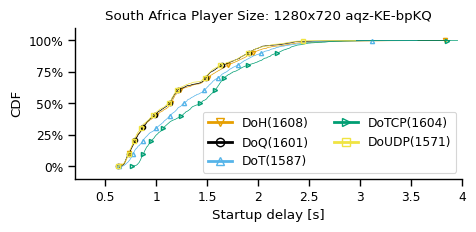

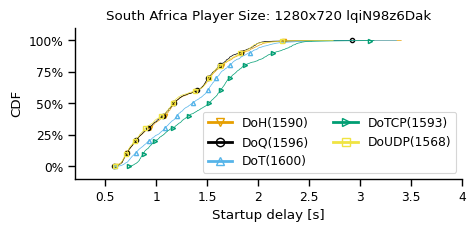

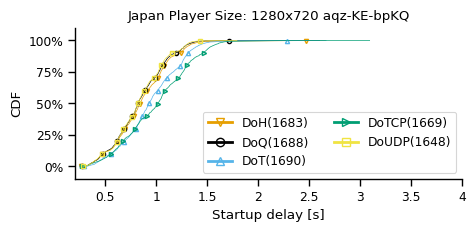

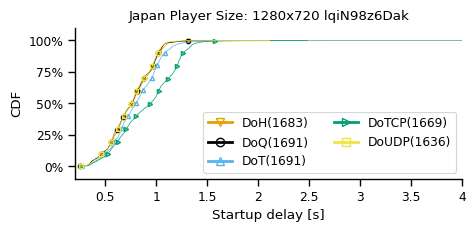

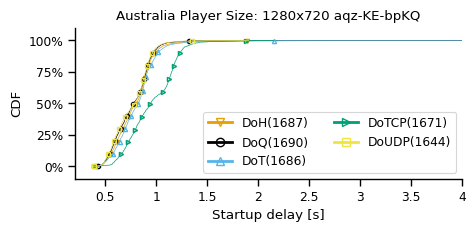

...

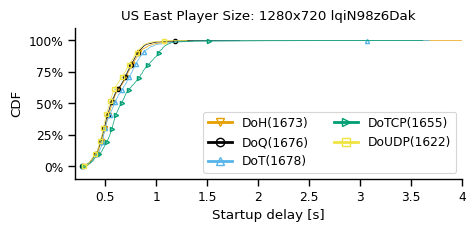

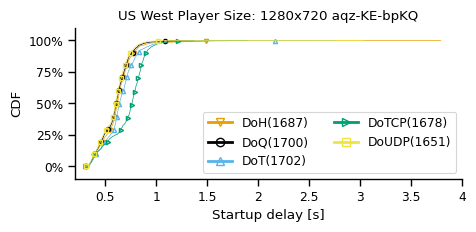

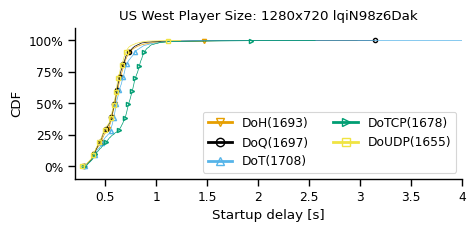

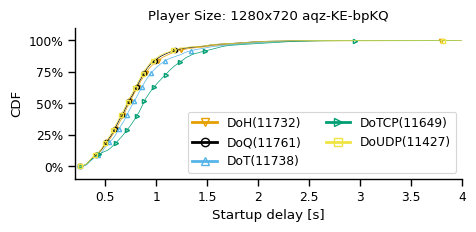

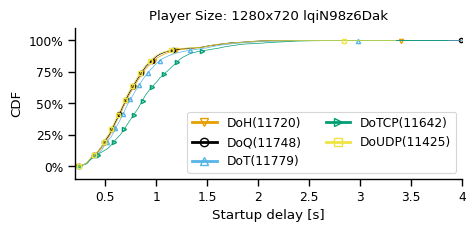

In [608]:
draw_cdf(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0.2,4], True)

Africa South
Africa South
aqz-KE-bpKQ
DoH
1280x720
count    1608.000000
mean        1.247559
std         0.496634
min         0.641200
10%         0.733270
20%         0.781840
25%         0.815275
30%         0.865600
40%         0.984680
50%         1.137050
60%         1.226300
70%         1.502040
75%         1.586975
80%         1.696780
90%         1.937220
100%        3.829400
max         3.829400
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoQ
1280x720
count    1601.000000
mean        1.221502
std         0.461044
min         0.621000
10%         0.729100
20%         0.787600
25%         0.820700
30%         0.863500
40%         0.974400
50%         1.126600
60%         1.200900
70%         1.479800
75%         1.537200
80%         1.635500
90%         1.906200
100%        3.878500
max         3.878500
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoT
1280x720
count    1587.000000
mean        1.348691
std         0.486279
min         0.637800
1

Asia Pacific Northeast
Asia Pacific Northeast
aqz-KE-bpKQ
DoH
1280x720
count    1683.000000
mean        0.854495
std         0.277874
min         0.265200
10%         0.470520
20%         0.619860
25%         0.657750
30%         0.697160
40%         0.779840
50%         0.840600
60%         0.912420
70%         1.016840
75%         1.042950
80%         1.079120
90%         1.232840
100%        2.657600
max         2.657600
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoQ
1280x720
count    1688.000000
mean        0.833505
std         0.258475
min         0.268100
10%         0.479350
20%         0.615340
25%         0.644025
30%         0.684210
40%         0.765080
50%         0.820050
60%         0.883980
70%         0.980070
75%         1.024125
80%         1.054920
90%         1.189010
100%        2.600800
max         2.600800
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoT
1280x720
count    1690.000000
mean        0.943981
std

Asia Pacific Southeast
Asia Pacific Southeast
aqz-KE-bpKQ
DoH
1280x720
count    1687.000000
mean        0.791675
std         0.220207
min         0.411500
10%         0.555100
20%         0.614360
25%         0.642350
30%         0.672120
40%         0.729680
50%         0.803400
60%         0.857220
70%         0.886820
75%         0.903900
80%         0.922480
90%         0.984020
100%        4.048000
max         4.048000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoQ
1280x720
count    1690.000000
mean        0.772028
std         0.202864
min         0.424800
10%         0.541280
20%         0.594200
25%         0.619400
30%         0.650290
40%         0.710200
50%         0.777800
60%         0.844540
70%         0.880580
75%         0.897300
80%         0.915180
90%         0.968250
100%        4.679100
max         4.679100
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoT
1280x720
count    1686.000000
mean        0.810611
std

Europe Central
Europe Central
aqz-KE-bpKQ
DoH
1280x720
count    1694.000000
mean        0.573773
std         0.276737
min         0.252900
10%         0.313530
20%         0.331860
25%         0.340125
30%         0.360600
40%         0.428800
50%         0.497050
60%         0.613880
70%         0.749730
75%         0.784775
80%         0.812940
90%         0.872790
100%        3.459400
max         3.459400
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoQ
1280x720
count    1690.000000
mean        0.549613
std         0.227305
min         0.254400
10%         0.313200
20%         0.333300
25%         0.342425
30%         0.359140
40%         0.411820
50%         0.478100
60%         0.571620
70%         0.735170
75%         0.780700
80%         0.799320
90%         0.848930
100%        1.946200
max         1.946200
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoT
1280x720
count    1692.000000
mean        0.589730
std         0.261024
min         0.

South America East
South America East
aqz-KE-bpKQ
DoH
1280x720
count    1701.000000
mean        0.802965
std         0.256943
min         0.276500
10%         0.565800
20%         0.663300
25%         0.682900
30%         0.698500
40%         0.727900
50%         0.765900
60%         0.810800
70%         0.870900
75%         0.907500
80%         0.941800
90%         1.015200
100%        4.633400
max         4.633400
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoQ
1280x720
count    1711.000000
mean        0.778881
std         0.169552
min         0.334200
10%         0.565100
20%         0.652700
25%         0.679300
30%         0.692600
40%         0.720700
50%         0.759300
60%         0.811900
70%         0.866400
75%         0.889050
80%         0.915600
90%         0.989500
100%        2.179000
max         2.179000
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoT
1280x720
count    1699.000000
mean        0.837368
std         0.21423

US East
US East
aqz-KE-bpKQ
DoH
1280x720
count    1672.000000
mean        0.647576
std         0.262527
min         0.294100
10%         0.433850
20%         0.477020
25%         0.492200
30%         0.506430
40%         0.545480
50%         0.589200
60%         0.659180
70%         0.733840
75%         0.773425
80%         0.804480
90%         0.895980
100%        4.217500
max         4.217500
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoQ
1280x720
count    1681.000000
mean        0.626860
std         0.185821
min         0.296100
10%         0.428800
20%         0.475900
25%         0.491100
30%         0.508300
40%         0.541200
50%         0.580500
60%         0.643500
70%         0.712500
75%         0.749400
80%         0.781600
90%         0.866600
100%        2.423900
max         2.423900
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoT
1280x720
count    1682.000000
mean        0.660068
std         0.205687
min         0.306500
10%         0.451610


/tmp/ipykernel_8335/1951434037.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(5,2))


US East
aqz-KE-bpKQ
DoH
1280x720
count    1672.000000
mean        0.647576
std         0.262527
min         0.294100
10%         0.433850
20%         0.477020
25%         0.492200
30%         0.506430
40%         0.545480
50%         0.589200
60%         0.659180
70%         0.733840
75%         0.773425
80%         0.804480
90%         0.895980
100%        4.217500
max         4.217500
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoQ
1280x720
count    1681.000000
mean        0.626860
std         0.185821
min         0.296100
10%         0.428800
20%         0.475900
25%         0.491100
30%         0.508300
40%         0.541200
50%         0.580500
60%         0.643500
70%         0.712500
75%         0.749400
80%         0.781600
90%         0.866600
100%        2.423900
max         2.423900
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoT
1280x720
count    1682.000000
mean        0.660068
std         0.205687
min         0.306500
10%         0.451610
20%     

US West
aqz-KE-bpKQ
DoH
1280x720
count    1687.000000
mean        0.614476
std         0.179801
min         0.296000
10%         0.401120
20%         0.468560
25%         0.513150
30%         0.553780
40%         0.594400
50%         0.616700
60%         0.639700
70%         0.672660
75%         0.691500
80%         0.710720
90%         0.776440
100%        3.788600
max         3.788600
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
1280x720
count    1700.000000
mean        0.595854
std         0.140864
min         0.305200
10%         0.394840
20%         0.459900
25%         0.487700
30%         0.531840
40%         0.580500
50%         0.605550
60%         0.629660
70%         0.663930
75%         0.682600
80%         0.702040
90%         0.762510
100%        1.367200
max         1.367200
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoT
1280x720
count    1702.000000
mean        0.642343
std         0.173453
min         0.303600
10%         0.409310
20%     

US West
aqz-KE-bpKQ
DoH
1280x720
count    11732.000000
mean         0.787328
std          0.360965
min          0.252900
10%          0.427700
20%          0.526860
25%          0.571500
30%          0.606030
40%          0.673740
50%          0.732600
60%          0.796160
70%          0.864500
75%          0.901825
80%          0.954400
90%          1.150270
100%         4.633400
max          4.633400
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
1280x720
count    11761.000000
mean         0.764860
std          0.326228
min          0.254400
10%          0.421100
20%          0.516600
25%          0.559500
30%          0.592100
40%          0.659900
50%          0.718900
60%          0.785700
70%          0.850100
75%          0.885200
80%          0.929200
90%          1.108500
100%         4.679100
max          4.679100
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoT
1280x720
count    11738.000000
mean         0.828625
std          0.367255
min          

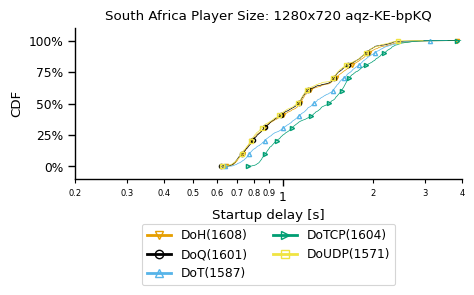

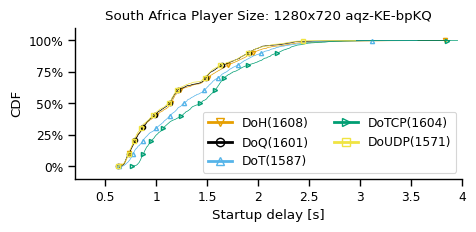

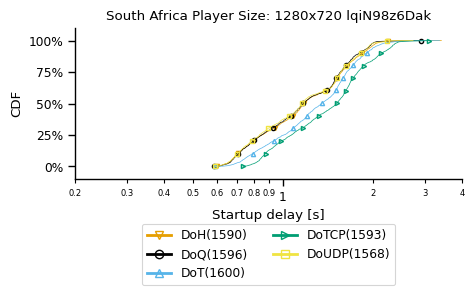

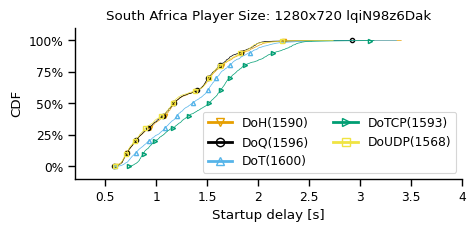

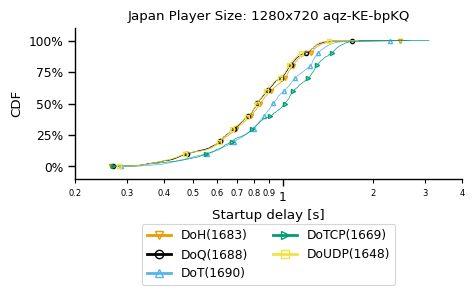

...

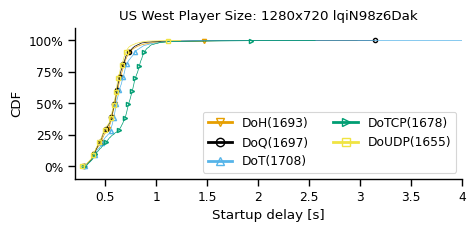

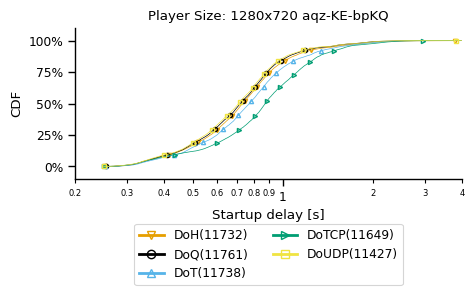

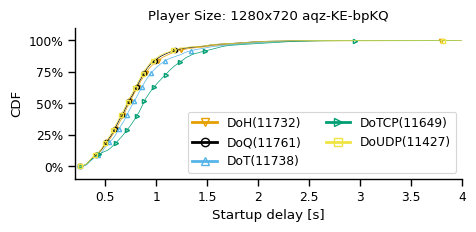

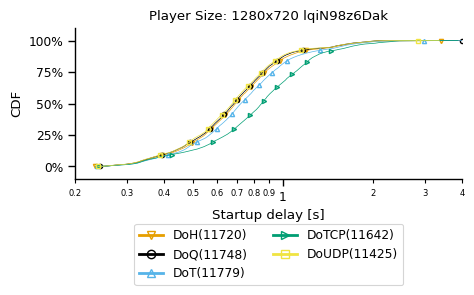

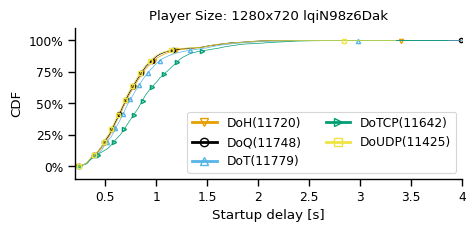

In [616]:
draw_cdf(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0.2,4], True)

Africa South
1
Africa South
aqz-KE-bpKQ
DoT
large
count    411.000000
mean       1.727590
std        0.289163
min        0.724000
10%        1.474500
20%        1.515500
25%        1.540100
30%        1.565500
40%        1.633200
50%        1.698800
60%        1.775600
70%        1.856700
75%        1.904450
80%        1.955800
90%        2.067300
100%       2.703000
max        2.703000
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoH
large
count    422.000000
mean       1.702008
std        0.281776
min        0.676000
10%        1.453090
20%        1.493460
25%        1.515975
30%        1.532840
40%        1.593860
50%        1.658600
60%        1.725820
70%        1.842410
75%        1.888250
80%        1.925280
90%        2.036420
100%       2.900900
max        2.900900
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoQ
large
count    434.000000
mean       1.654637
std        0.271696
min        0.621000
10%        1.448540
20%        1.480760
25%   

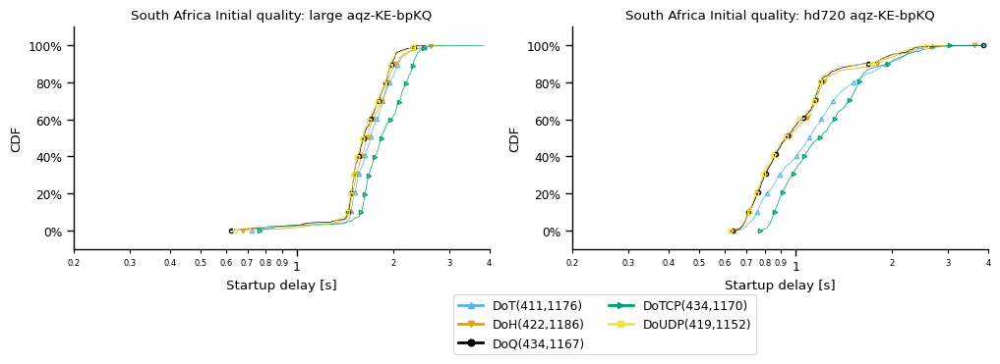

1
Africa South
aqz-KE-bpKQ
DoT
large
count    411.000000
mean       1.727590
std        0.289163
min        0.724000
10%        1.474500
20%        1.515500
25%        1.540100
30%        1.565500
40%        1.633200
50%        1.698800
60%        1.775600
70%        1.856700
75%        1.904450
80%        1.955800
90%        2.067300
100%       2.703000
max        2.703000
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoH
large
count    422.000000
mean       1.702008
std        0.281776
min        0.676000
10%        1.453090
20%        1.493460
25%        1.515975
30%        1.532840
40%        1.593860
50%        1.658600
60%        1.725820
70%        1.842410
75%        1.888250
80%        1.925280
90%        2.036420
100%       2.900900
max        2.900900
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoQ
large
count    434.000000
mean       1.654637
std        0.271696
min        0.621000
10%        1.448540
20%        1.480760
25%        1.496625

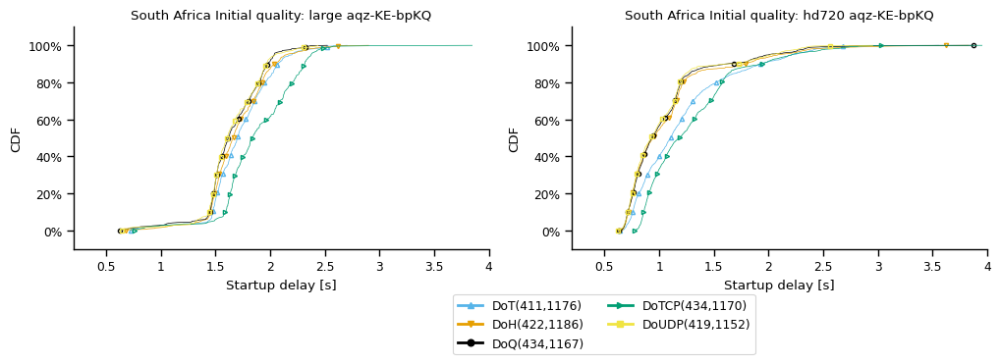

1
Africa South
lqiN98z6Dak
DoT
large
count    1136.000000
mean        1.434763
std         0.417261
min         0.591000
10%         0.810800
20%         1.037600
25%         1.115175
30%         1.198100
40%         1.358200
50%         1.500100
60%         1.566800
70%         1.654350
75%         1.714675
80%         1.779800
90%         1.960150
100%        3.353700
max         3.353700
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoH
large
count    843.000000
mean       1.461220
std        0.411208
min        0.601400
10%        0.800940
20%        1.045800
25%        1.145100
30%        1.299860
40%        1.469300
50%        1.528800
60%        1.595560
70%        1.685480
75%        1.744900
80%        1.808880
90%        1.949200
100%       3.401100
max        3.401100
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoQ
large
count    850.000000
mean       1.429221
std        0.400899
min        0.586200
10%        0.798940
20%        1.006480
25

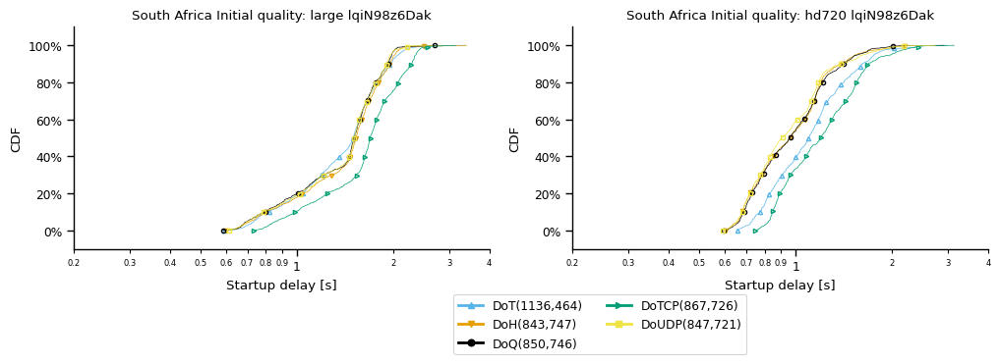

1
Africa South
lqiN98z6Dak
DoT
large
count    1136.000000
mean        1.434763
std         0.417261
min         0.591000
10%         0.810800
20%         1.037600
25%         1.115175
30%         1.198100
40%         1.358200
50%         1.500100
60%         1.566800
70%         1.654350
75%         1.714675
80%         1.779800
90%         1.960150
100%        3.353700
max         3.353700
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoH
large
count    843.000000
mean       1.461220
std        0.411208
min        0.601400
10%        0.800940
20%        1.045800
25%        1.145100
30%        1.299860
40%        1.469300
50%        1.528800
60%        1.595560
70%        1.685480
75%        1.744900
80%        1.808880
90%        1.949200
100%       3.401100
max        3.401100
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoQ
large
count    850.000000
mean       1.429221
std        0.400899
min        0.586200
10%        0.798940
20%        1.006480
25

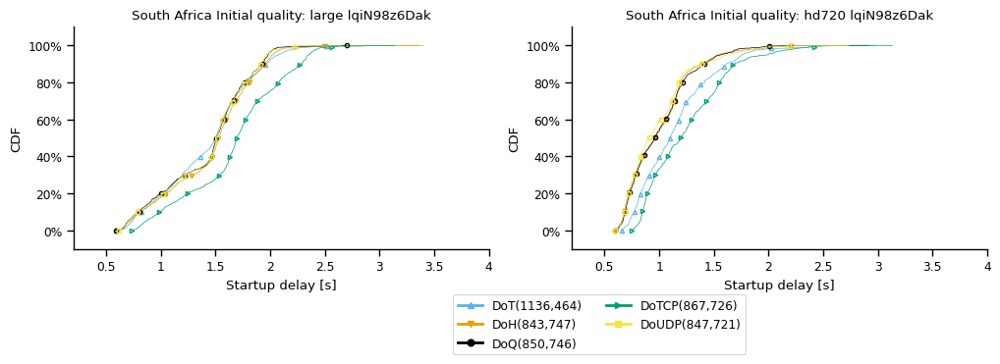

Asia Pacific Northeast
1
Asia Pacific Northeast
aqz-KE-bpKQ
DoT
large
count    71.000000
mean      0.800273
std       0.220605
min       0.356000
10%       0.556000
20%       0.622600
25%       0.649650
30%       0.688800
40%       0.764200
50%       0.811800
60%       0.843000
70%       0.877500
75%       0.908800
80%       0.927900
90%       1.015000
100%      1.757800
max       1.757800
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoH
large
count    57.000000
mean      0.723765
std       0.228987
min       0.328700
10%       0.501080
20%       0.565820
25%       0.576800
30%       0.585320
40%       0.639800
50%       0.692400
60%       0.727900
70%       0.789400
75%       0.817000
80%       0.863440
90%       0.946080
100%      1.656600
max       1.656600
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoQ
large
count    51.000000
mean      0.746076
std       0.188565
min       0.374600
10%       0.494600
20%       0.552800
25%   

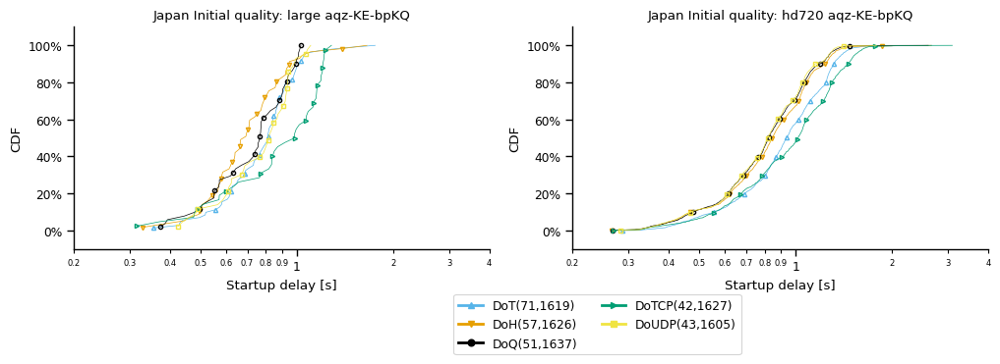

1
Asia Pacific Northeast
aqz-KE-bpKQ
DoT
large
count    71.000000
mean      0.800273
std       0.220605
min       0.356000
10%       0.556000
20%       0.622600
25%       0.649650
30%       0.688800
40%       0.764200
50%       0.811800
60%       0.843000
70%       0.877500
75%       0.908800
80%       0.927900
90%       1.015000
100%      1.757800
max       1.757800
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoH
large
count    57.000000
mean      0.723765
std       0.228987
min       0.328700
10%       0.501080
20%       0.565820
25%       0.576800
30%       0.585320
40%       0.639800
50%       0.692400
60%       0.727900
70%       0.789400
75%       0.817000
80%       0.863440
90%       0.946080
100%      1.656600
max       1.656600
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoQ
large
count    51.000000
mean      0.746076
std       0.188565
min       0.374600
10%       0.494600
20%       0.552800
25%       0.572000
30%       

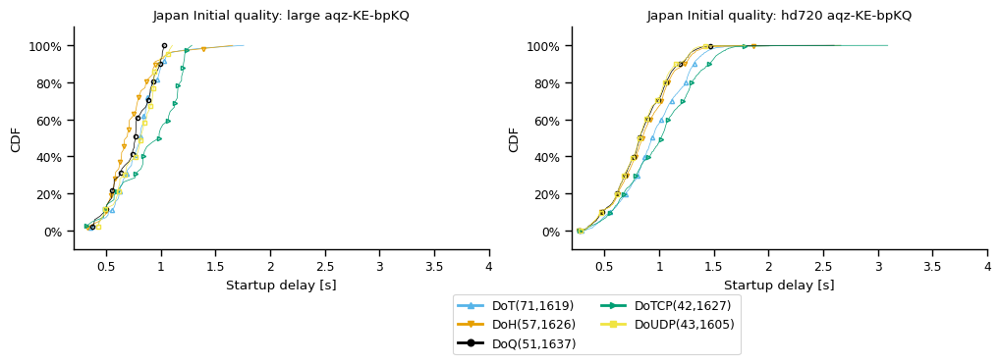

1
Asia Pacific Northeast
lqiN98z6Dak
DoT
large
count    989.000000
mean       0.844404
std        0.208234
min        0.267700
10%        0.581340
20%        0.647560
25%        0.667500
30%        0.689540
40%        0.759020
50%        0.854500
60%        0.934260
70%        0.985560
75%        1.004200
80%        1.029780
90%        1.103000
100%       1.562900
max        1.562900
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoH
large
count    765.000000
mean       0.822490
std        0.197315
min        0.309600
10%        0.567800
20%        0.632620
25%        0.655700
30%        0.678920
40%        0.762140
50%        0.839800
60%        0.902740
70%        0.968840
75%        0.984700
80%        1.000420
90%        1.051240
100%       2.064500
max        2.064500
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoQ
large
count    735.000000
mean       0.822744
std        0.191736
min        0.251300
10%        0.570200
20%      

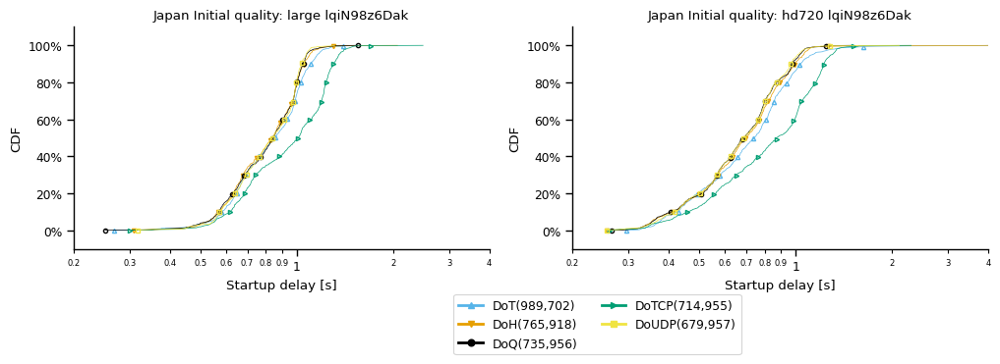

1
Asia Pacific Northeast
lqiN98z6Dak
DoT
large
count    989.000000
mean       0.844404
std        0.208234
min        0.267700
10%        0.581340
20%        0.647560
25%        0.667500
30%        0.689540
40%        0.759020
50%        0.854500
60%        0.934260
70%        0.985560
75%        1.004200
80%        1.029780
90%        1.103000
100%       1.562900
max        1.562900
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoH
large
count    765.000000
mean       0.822490
std        0.197315
min        0.309600
10%        0.567800
20%        0.632620
25%        0.655700
30%        0.678920
40%        0.762140
50%        0.839800
60%        0.902740
70%        0.968840
75%        0.984700
80%        1.000420
90%        1.051240
100%       2.064500
max        2.064500
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoQ
large
count    735.000000
mean       0.822744
std        0.191736
min        0.251300
10%        0.570200
20%      

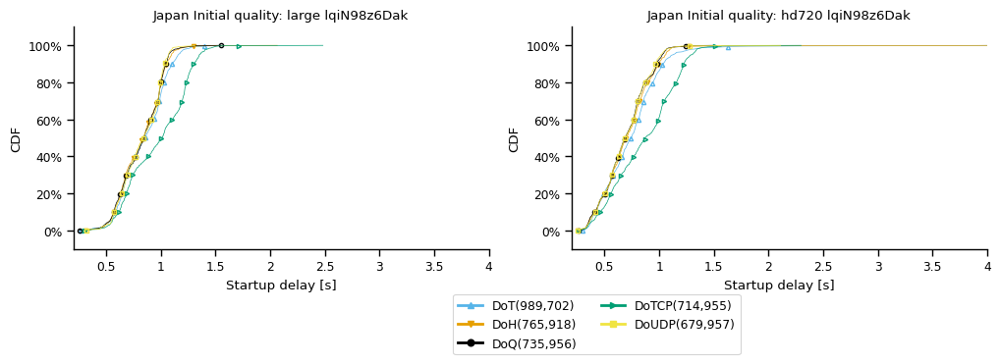

Asia Pacific Southeast
1
Asia Pacific Southeast
aqz-KE-bpKQ
DoT
large
count    11.000000
mean      0.846918
std       0.173739
min       0.463400
10%       0.725200
20%       0.729700
25%       0.756000
30%       0.782300
40%       0.800900
50%       0.852000
60%       0.896700
70%       0.978700
75%       0.996450
80%       1.014200
90%       1.027000
100%      1.046000
max       1.046000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoH
large
count    9.000000
mean     0.945778
std      0.369699
min      0.484800
10%      0.485200
20%      0.711080
25%      0.861600
30%      0.865200
40%      0.871040
50%      0.872800
60%      0.919360
70%      1.008520
75%      1.060200
80%      1.144320
90%      1.351440
100%     1.675200
max      1.675200
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoQ
large
count    13.000000
mean      0.754638
std       0.179240
min       0.502000
10%       0.543340
20%       0.575220
25%       0.617400
30% 

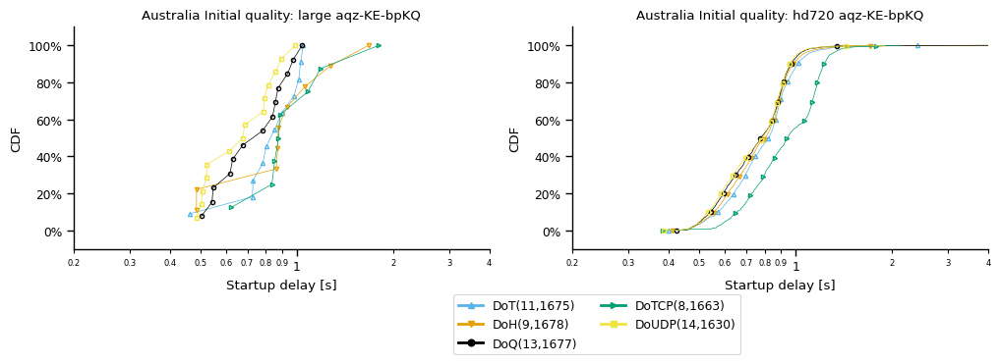

1
Asia Pacific Southeast
aqz-KE-bpKQ
DoT
large
count    11.000000
mean      0.846918
std       0.173739
min       0.463400
10%       0.725200
20%       0.729700
25%       0.756000
30%       0.782300
40%       0.800900
50%       0.852000
60%       0.896700
70%       0.978700
75%       0.996450
80%       1.014200
90%       1.027000
100%      1.046000
max       1.046000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoH
large
count    9.000000
mean     0.945778
std      0.369699
min      0.484800
10%      0.485200
20%      0.711080
25%      0.861600
30%      0.865200
40%      0.871040
50%      0.872800
60%      0.919360
70%      1.008520
75%      1.060200
80%      1.144320
90%      1.351440
100%     1.675200
max      1.675200
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoQ
large
count    13.000000
mean      0.754638
std       0.179240
min       0.502000
10%       0.543340
20%       0.575220
25%       0.617400
30%       0.624600
40%     

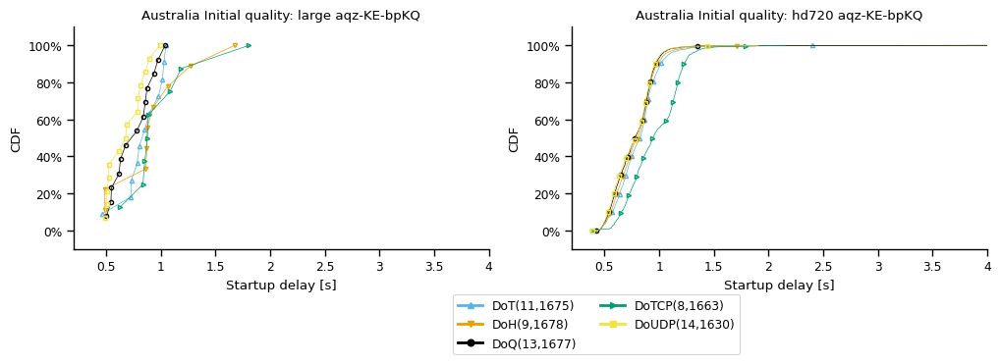

1
Asia Pacific Southeast
lqiN98z6Dak
DoT
large
count    60.000000
mean      0.711382
std       0.243279
min       0.450900
10%       0.490470
20%       0.518180
25%       0.537650
30%       0.572390
40%       0.644600
50%       0.685500
60%       0.754060
70%       0.789950
75%       0.812275
80%       0.825480
90%       0.882340
100%      2.155000
max       2.155000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoH
large
count    37.000000
mean      0.685551
std       0.231572
min       0.423400
10%       0.501400
20%       0.516420
25%       0.526400
30%       0.539220
40%       0.586260
50%       0.638400
60%       0.715740
70%       0.752840
75%       0.784600
80%       0.820720
90%       0.863780
100%      1.760700
max       1.760700
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoQ
large
count    36.000000
mean      0.646975
std       0.153656
min       0.440000
10%       0.485850
20%       0.497200
25%       0.508650
30%       

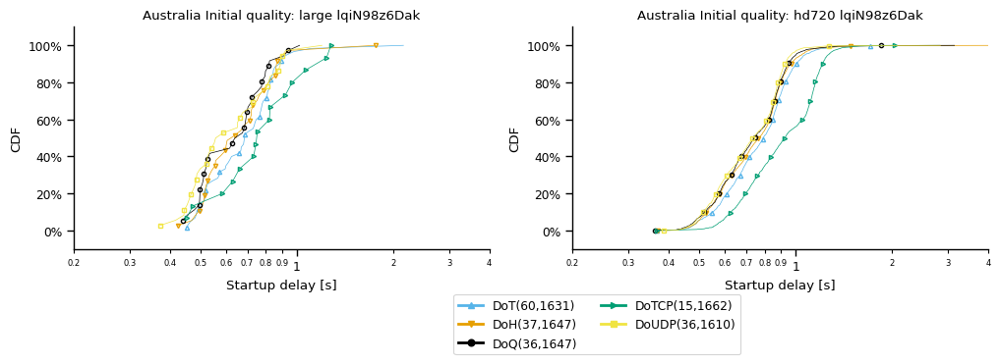

1
Asia Pacific Southeast
lqiN98z6Dak
DoT
large
count    60.000000
mean      0.711382
std       0.243279
min       0.450900
10%       0.490470
20%       0.518180
25%       0.537650
30%       0.572390
40%       0.644600
50%       0.685500
60%       0.754060
70%       0.789950
75%       0.812275
80%       0.825480
90%       0.882340
100%      2.155000
max       2.155000
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoH
large
count    37.000000
mean      0.685551
std       0.231572
min       0.423400
10%       0.501400
20%       0.516420
25%       0.526400
30%       0.539220
40%       0.586260
50%       0.638400
60%       0.715740
70%       0.752840
75%       0.784600
80%       0.820720
90%       0.863780
100%      1.760700
max       1.760700
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoQ
large
count    36.000000
mean      0.646975
std       0.153656
min       0.440000
10%       0.485850
20%       0.497200
25%       0.508650
30%       

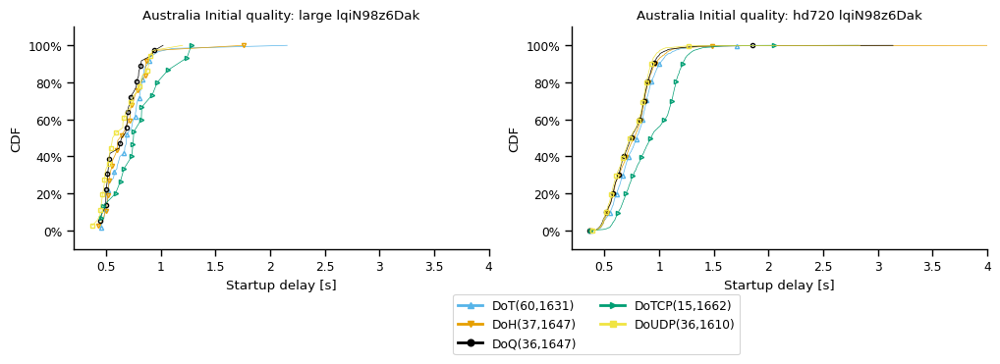

Europe Central
1
Europe Central
aqz-KE-bpKQ
DoT
large
count    14.000000
mean      0.771214
std       0.358519
min       0.258600
10%       0.328870
20%       0.392360
25%       0.453300
30%       0.507640
40%       0.655260
50%       0.854850
60%       0.902200
70%       0.923670
75%       1.016425
80%       1.112260
90%       1.235260
100%      1.287900
max       1.287900
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoH
large
count    21.000000
mean      0.573505
std       0.221649
min       0.286900
10%       0.320500
20%       0.342600
25%       0.349800
30%       0.385700
40%       0.465200
50%       0.516300
60%       0.711700
70%       0.778700
75%       0.780800
80%       0.789700
90%       0.806700
100%      1.012000
max       1.012000
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoQ
large
count    17.000000
mean      0.635600
std       0.428328
min       0.275800
10%       0.312740
20%       0.343700
25%       0.388900
30%       0.392980


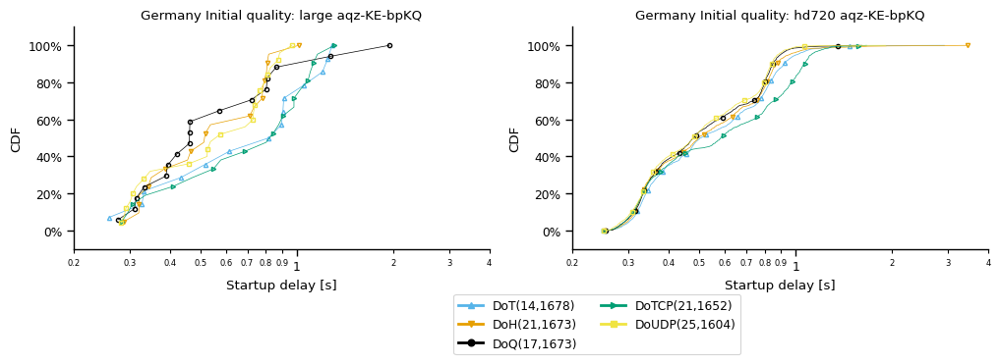

1
Europe Central
aqz-KE-bpKQ
DoT
large
count    14.000000
mean      0.771214
std       0.358519
min       0.258600
10%       0.328870
20%       0.392360
25%       0.453300
30%       0.507640
40%       0.655260
50%       0.854850
60%       0.902200
70%       0.923670
75%       1.016425
80%       1.112260
90%       1.235260
100%      1.287900
max       1.287900
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoH
large
count    21.000000
mean      0.573505
std       0.221649
min       0.286900
10%       0.320500
20%       0.342600
25%       0.349800
30%       0.385700
40%       0.465200
50%       0.516300
60%       0.711700
70%       0.778700
75%       0.780800
80%       0.789700
90%       0.806700
100%      1.012000
max       1.012000
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoQ
large
count    17.000000
mean      0.635600
std       0.428328
min       0.275800
10%       0.312740
20%       0.343700
25%       0.388900
30%       0.392980
40%       0.436

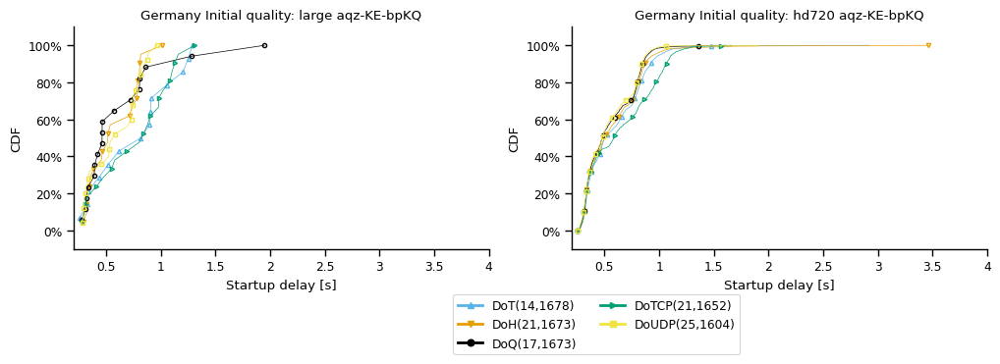

1
Europe Central
lqiN98z6Dak
DoT
large
count    64.000000
mean      0.567561
std       0.319634
min       0.240000
10%       0.253540
20%       0.269700
25%       0.285800
30%       0.303520
40%       0.371620
50%       0.486350
60%       0.655040
70%       0.728710
75%       0.754575
80%       0.781780
90%       0.979860
100%      1.607800
max       1.607800
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoH
large
count    40.000000
mean      0.449998
std       0.238441
min       0.241500
10%       0.253650
20%       0.274420
25%       0.277525
30%       0.285030
40%       0.306200
50%       0.320750
60%       0.397620
70%       0.486080
75%       0.551950
80%       0.612080
90%       0.820560
100%      1.078100
max       1.078100
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoQ
large
count    27.000000
mean      0.565296
std       0.504032
min       0.245000
10%       0.256480
20%       0.266460
25%       0.270350
30%       0.276160
40%       0.399

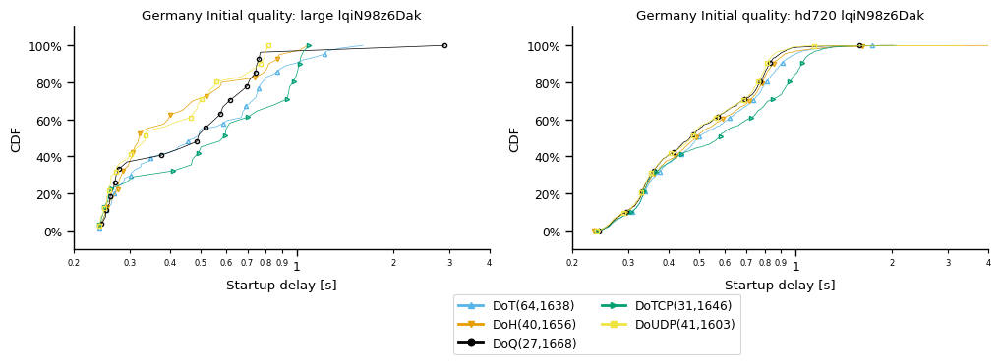

1
Europe Central
lqiN98z6Dak
DoT
large
count    64.000000
mean      0.567561
std       0.319634
min       0.240000
10%       0.253540
20%       0.269700
25%       0.285800
30%       0.303520
40%       0.371620
50%       0.486350
60%       0.655040
70%       0.728710
75%       0.754575
80%       0.781780
90%       0.979860
100%      1.607800
max       1.607800
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoH
large
count    40.000000
mean      0.449998
std       0.238441
min       0.241500
10%       0.253650
20%       0.274420
25%       0.277525
30%       0.285030
40%       0.306200
50%       0.320750
60%       0.397620
70%       0.486080
75%       0.551950
80%       0.612080
90%       0.820560
100%      1.078100
max       1.078100
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoQ
large
count    27.000000
mean      0.565296
std       0.504032
min       0.245000
10%       0.256480
20%       0.266460
25%       0.270350
30%       0.276160
40%       0.399

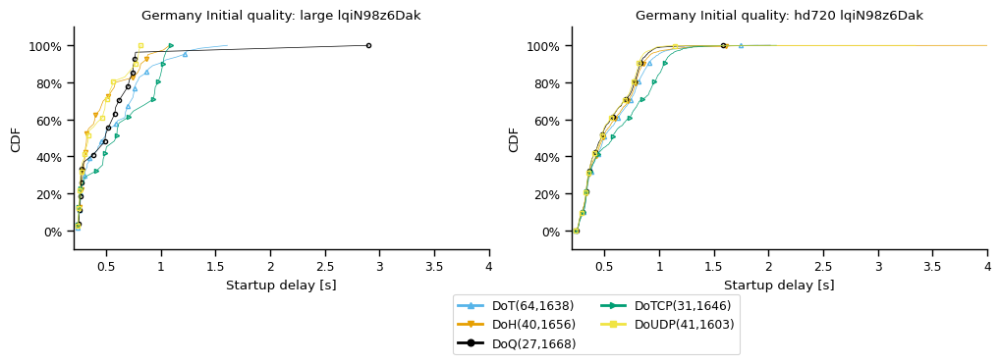

South America East
1
South America East
aqz-KE-bpKQ
DoT
large
count    48.000000
mean      0.806613
std       0.218046
min       0.447300
10%       0.574180
20%       0.650360
25%       0.667675
30%       0.677090
40%       0.732320
50%       0.760950
60%       0.792300
70%       0.875810
75%       0.925425
80%       0.954160
90%       1.097130
100%      1.504900
max       1.504900
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoH
large
count    41.000000
mean      0.886888
std       0.461167
min       0.489100
10%       0.553400
20%       0.630000
25%       0.653100
30%       0.669500
40%       0.713400
50%       0.767000
60%       0.817500
70%       0.897500
75%       0.964700
80%       0.985700
90%       1.030000
100%      2.894000
max       2.894000
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoQ
large
count    24.000000
mean      0.824979
std       0.182687
min       0.410800
10%       0.646910
20%       0.686600
25%       0.692100
30%

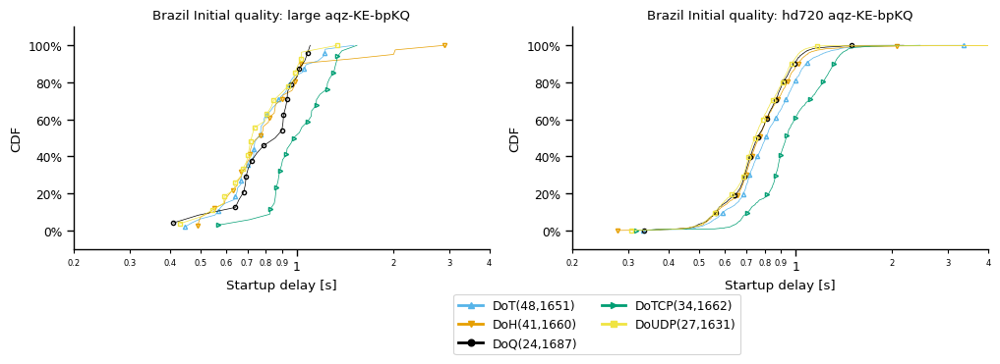

1
South America East
aqz-KE-bpKQ
DoT
large
count    48.000000
mean      0.806613
std       0.218046
min       0.447300
10%       0.574180
20%       0.650360
25%       0.667675
30%       0.677090
40%       0.732320
50%       0.760950
60%       0.792300
70%       0.875810
75%       0.925425
80%       0.954160
90%       1.097130
100%      1.504900
max       1.504900
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoH
large
count    41.000000
mean      0.886888
std       0.461167
min       0.489100
10%       0.553400
20%       0.630000
25%       0.653100
30%       0.669500
40%       0.713400
50%       0.767000
60%       0.817500
70%       0.897500
75%       0.964700
80%       0.985700
90%       1.030000
100%      2.894000
max       2.894000
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoQ
large
count    24.000000
mean      0.824979
std       0.182687
min       0.410800
10%       0.646910
20%       0.686600
25%       0.692100
30%       0.702430
40%

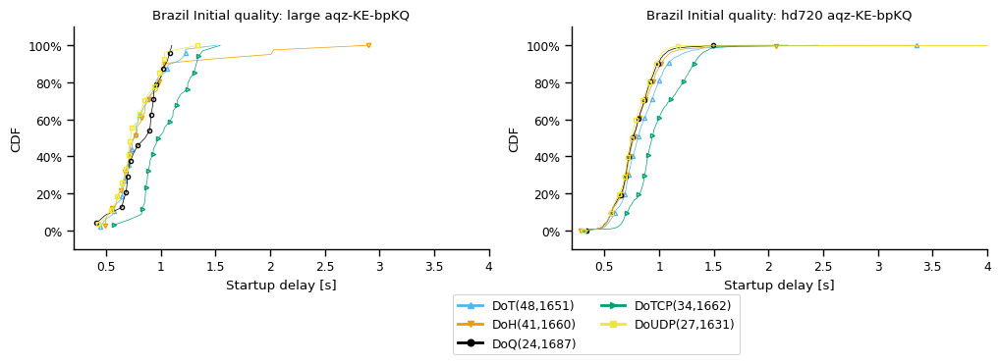

1
South America East
lqiN98z6Dak
DoT
large
count    52.000000
mean      0.858021
std       0.253234
min       0.333800
10%       0.598860
20%       0.671720
25%       0.697250
30%       0.702980
40%       0.743660
50%       0.792800
60%       0.887180
70%       1.015170
75%       1.022975
80%       1.061740
90%       1.201640
100%      1.517300
max       1.517300
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoH
large
count    47.000000
mean      0.870913
std       0.417145
min       0.290600
10%       0.509700
20%       0.606180
25%       0.634700
30%       0.649900
40%       0.673060
50%       0.754600
60%       0.815620
70%       0.913060
75%       0.947050
80%       0.998940
90%       1.368660
100%      2.517100
max       2.517100
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoQ
large
count    35.000000
mean      0.724620
std       0.218642
min       0.316000
10%       0.487760
20%       0.534500
25%       0.633950
30%       0.636580
40%

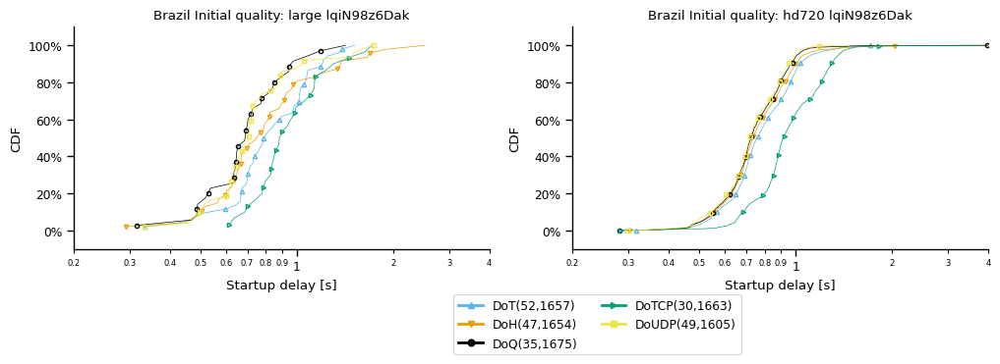

1
South America East
lqiN98z6Dak
DoT
large
count    52.000000
mean      0.858021
std       0.253234
min       0.333800
10%       0.598860
20%       0.671720
25%       0.697250
30%       0.702980
40%       0.743660
50%       0.792800
60%       0.887180
70%       1.015170
75%       1.022975
80%       1.061740
90%       1.201640
100%      1.517300
max       1.517300
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoH
large
count    47.000000
mean      0.870913
std       0.417145
min       0.290600
10%       0.509700
20%       0.606180
25%       0.634700
30%       0.649900
40%       0.673060
50%       0.754600
60%       0.815620
70%       0.913060
75%       0.947050
80%       0.998940
90%       1.368660
100%      2.517100
max       2.517100
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoQ
large
count    35.000000
mean      0.724620
std       0.218642
min       0.316000
10%       0.487760
20%       0.534500
25%       0.633950
30%       0.636580
40%

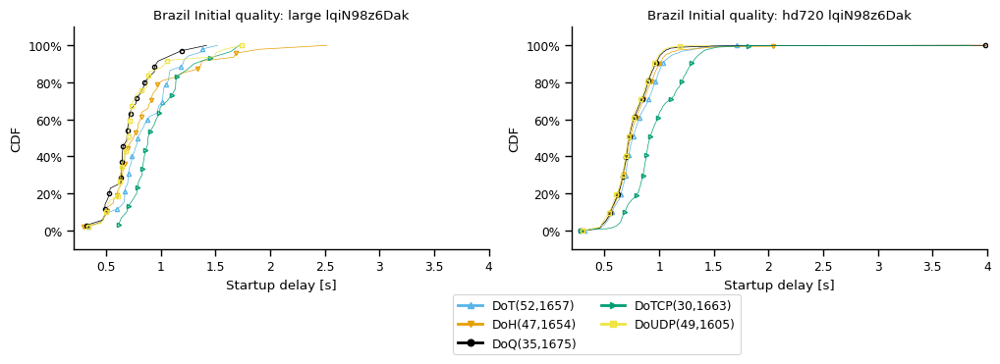

US East
1
US East
aqz-KE-bpKQ
DoT
large
count    13.000000
mean      0.713262
std       0.334966
min       0.424100
10%       0.500800
20%       0.516000
25%       0.520200
30%       0.531660
40%       0.545860
50%       0.599800
60%       0.695640
70%       0.750640
75%       0.765100
80%       0.817300
90%       0.861460
100%      1.724300
max       1.724300
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoH
large
count    18.000000
mean      1.167822
std       1.131787
min       0.469600
10%       0.497330
20%       0.587200
25%       0.632000
30%       0.653670
40%       0.682380
50%       0.739700
60%       0.838400
70%       0.945160
75%       1.163100
80%       1.281980
90%       2.174220
100%      4.217500
max       4.217500
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoQ
large
count    23.000000
mean      0.639813
std       0.281525
min       0.337800
10%       0.367640
20%       0.442280
25%       0.461350
30%       0.477540
40%       0.522140
50%      

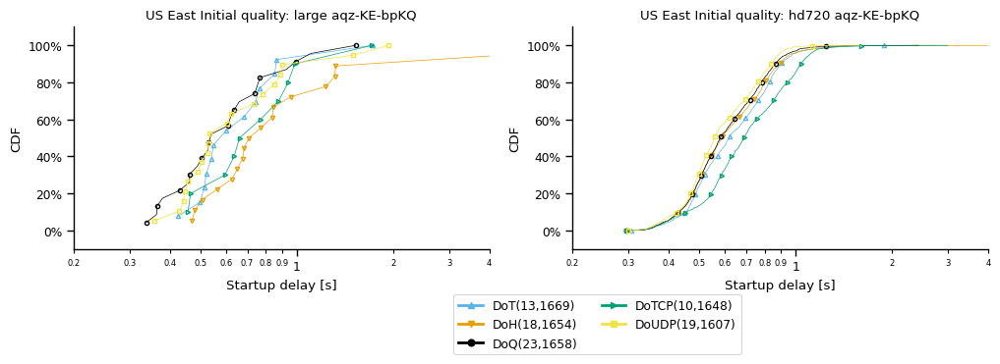

1
US East
aqz-KE-bpKQ
DoT
large
count    13.000000
mean      0.713262
std       0.334966
min       0.424100
10%       0.500800
20%       0.516000
25%       0.520200
30%       0.531660
40%       0.545860
50%       0.599800
60%       0.695640
70%       0.750640
75%       0.765100
80%       0.817300
90%       0.861460
100%      1.724300
max       1.724300
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoH
large
count    18.000000
mean      1.167822
std       1.131787
min       0.469600
10%       0.497330
20%       0.587200
25%       0.632000
30%       0.653670
40%       0.682380
50%       0.739700
60%       0.838400
70%       0.945160
75%       1.163100
80%       1.281980
90%       2.174220
100%      4.217500
max       4.217500
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoQ
large
count    23.000000
mean      0.639813
std       0.281525
min       0.337800
10%       0.367640
20%       0.442280
25%       0.461350
30%       0.477540
40%       0.522140
50%       0.53980

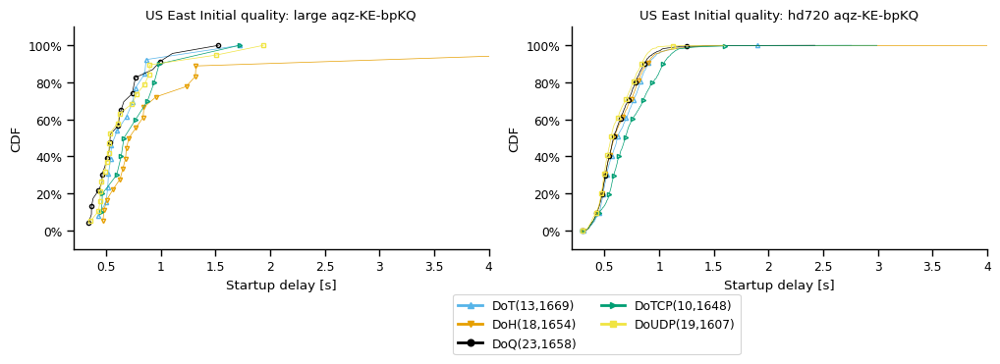

1
US East
lqiN98z6Dak
DoT
large
count    40.000000
mean      0.571647
std       0.243771
min       0.298900
10%       0.403650
20%       0.446020
25%       0.464450
30%       0.483170
40%       0.500320
50%       0.528050
60%       0.532660
70%       0.601710
75%       0.604375
80%       0.645340
90%       0.731740
100%      1.841700
max       1.841700
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoH
large
count    43.000000
mean      0.539542
std       0.144026
min       0.327300
10%       0.356820
20%       0.425720
25%       0.442200
30%       0.471740
40%       0.493840
50%       0.522600
60%       0.563580
70%       0.572800
75%       0.593600
80%       0.613780
90%       0.741860
100%      0.947200
max       0.947200
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoQ
large
count    65.000000
mean      0.542534
std       0.149180
min       0.277200
10%       0.406980
20%       0.434740
25%       0.443400
30%       0.460080
40%       0.478120
50%       0.50650

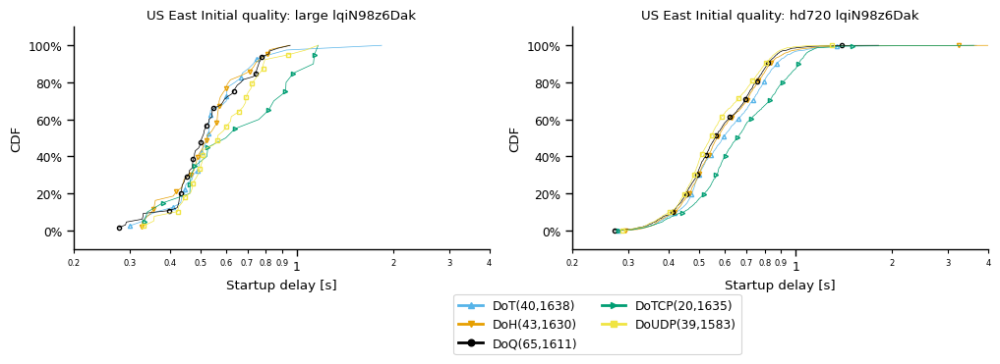

1
US East
lqiN98z6Dak
DoT
large
count    40.000000
mean      0.571647
std       0.243771
min       0.298900
10%       0.403650
20%       0.446020
25%       0.464450
30%       0.483170
40%       0.500320
50%       0.528050
60%       0.532660
70%       0.601710
75%       0.604375
80%       0.645340
90%       0.731740
100%      1.841700
max       1.841700
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoH
large
count    43.000000
mean      0.539542
std       0.144026
min       0.327300
10%       0.356820
20%       0.425720
25%       0.442200
30%       0.471740
40%       0.493840
50%       0.522600
60%       0.563580
70%       0.572800
75%       0.593600
80%       0.613780
90%       0.741860
100%      0.947200
max       0.947200
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoQ
large
count    65.000000
mean      0.542534
std       0.149180
min       0.277200
10%       0.406980
20%       0.434740
25%       0.443400
30%       0.460080
40%       0.478120
50%       0.50650

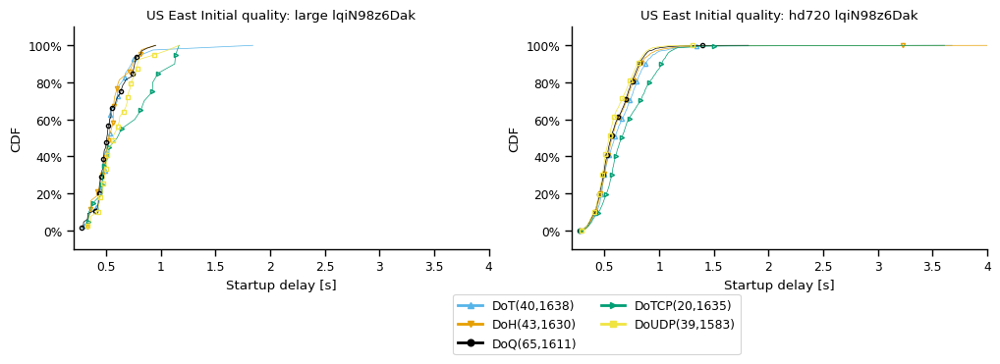

US West
1
US West
aqz-KE-bpKQ
DoT
large
count    3.000000
mean     0.513267
std      0.150689
min      0.341600
10%      0.388180
20%      0.434760
25%      0.458050
30%      0.481340
40%      0.527920
50%      0.574500
60%      0.584340
70%      0.594180
75%      0.599100
80%      0.604020
90%      0.613860
100%     0.623700
max      0.623700
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoH
large
count    5.000000
mean     0.547740
std      0.156081
min      0.339300
10%      0.414420
20%      0.489540
25%      0.527100
30%      0.529680
40%      0.534840
50%      0.540000
60%      0.545320
70%      0.550640
75%      0.553300
80%      0.598440
90%      0.688720
100%     0.779000
max      0.779000
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
large
count    4.000000
mean     0.524875
std      0.195737
min      0.318300
10%      0.369510
20%      0.420720
25%      0.446325
30%      0.471930
40%      0.491580
50%      0.495450
60%      0.499320
70%      0.53074

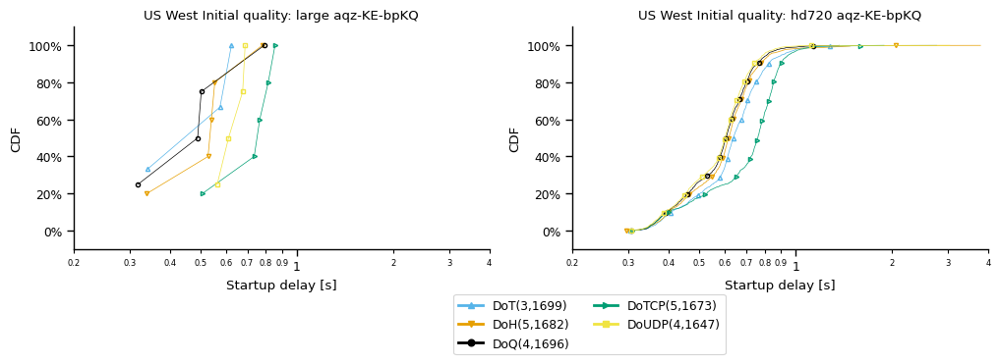

1
US West
aqz-KE-bpKQ
DoT
large
count    3.000000
mean     0.513267
std      0.150689
min      0.341600
10%      0.388180
20%      0.434760
25%      0.458050
30%      0.481340
40%      0.527920
50%      0.574500
60%      0.584340
70%      0.594180
75%      0.599100
80%      0.604020
90%      0.613860
100%     0.623700
max      0.623700
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoH
large
count    5.000000
mean     0.547740
std      0.156081
min      0.339300
10%      0.414420
20%      0.489540
25%      0.527100
30%      0.529680
40%      0.534840
50%      0.540000
60%      0.545320
70%      0.550640
75%      0.553300
80%      0.598440
90%      0.688720
100%     0.779000
max      0.779000
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
large
count    4.000000
mean     0.524875
std      0.195737
min      0.318300
10%      0.369510
20%      0.420720
25%      0.446325
30%      0.471930
40%      0.491580
50%      0.495450
60%      0.499320
70%      0.530740
75%   

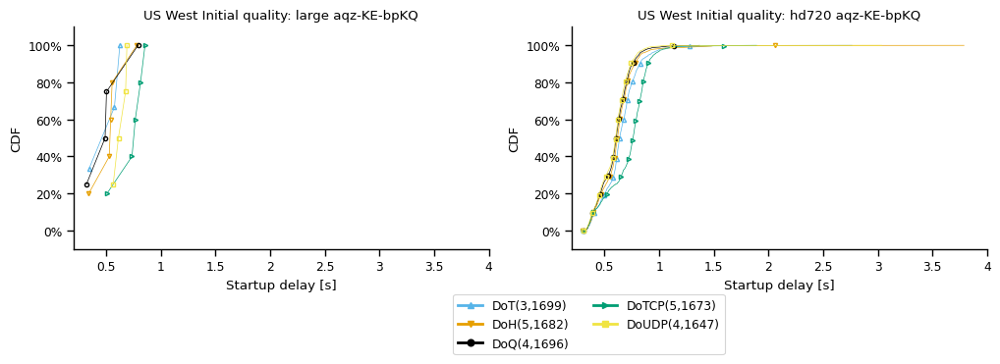

1
US West
lqiN98z6Dak
DoT
large
count    122.000000
mean       0.586522
std        0.168737
min        0.304100
10%        0.379270
20%        0.427120
25%        0.499675
30%        0.522960
40%        0.563540
50%        0.583050
60%        0.609460
70%        0.636240
75%        0.661700
80%        0.684820
90%        0.764520
100%       1.292400
max        1.292400
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoH
large
count    96.000000
mean      0.580602
std       0.201473
min       0.289700
10%       0.367450
20%       0.464700
25%       0.486675
30%       0.508800
40%       0.534700
50%       0.563850
60%       0.592500
70%       0.634550
75%       0.659025
80%       0.668100
90%       0.732850
100%      1.863400
max       1.863400
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoQ
large
count    85.000000
mean      0.629351
std       0.341115
min       0.305200
10%       0.420160
20%       0.491780
25%       0.509500
30%       0.534340
40%       0.553260


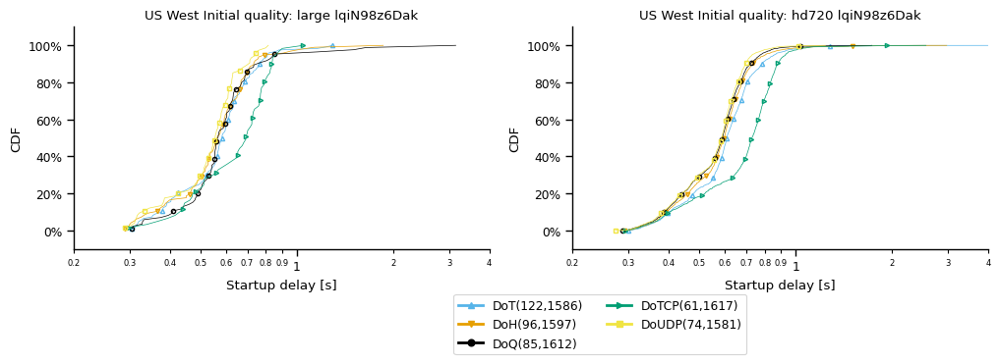

1
US West
lqiN98z6Dak
DoT
large
count    122.000000
mean       0.586522
std        0.168737
min        0.304100
10%        0.379270
20%        0.427120
25%        0.499675
30%        0.522960
40%        0.563540
50%        0.583050
60%        0.609460
70%        0.636240
75%        0.661700
80%        0.684820
90%        0.764520
100%       1.292400
max        1.292400
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoH
large
count    96.000000
mean      0.580602
std       0.201473
min       0.289700
10%       0.367450
20%       0.464700
25%       0.486675
30%       0.508800
40%       0.534700
50%       0.563850
60%       0.592500
70%       0.634550
75%       0.659025
80%       0.668100
90%       0.732850
100%      1.863400
max       1.863400
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoQ
large
count    85.000000
mean      0.629351
std       0.341115
min       0.305200
10%       0.420160
20%       0.491780
25%       0.509500
30%       0.534340
40%       0.553260


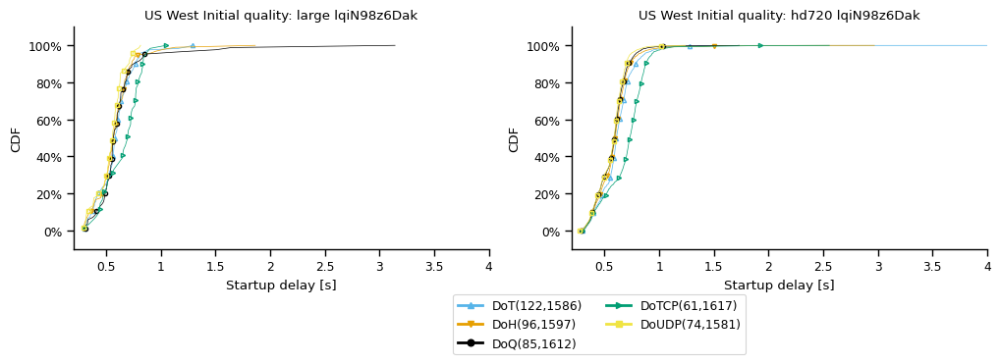

all vantage points
aqz-KE-bpKQ
DoT
large
count    571.000000
mean       1.464977
std        0.504040
min        0.258600
10%        0.702700
20%        0.865700
25%        0.986250
30%        1.358400
40%        1.503000
50%        1.571500
60%        1.669200
70%        1.761200
75%        1.825300
80%        1.876300
90%        2.032400
100%       2.703000
max        2.703000
Name: startup_delay, dtype: float64

aqz-KE-bpKQ
DoH
large
count    573.000000
mean       1.466281
std        0.532930
min        0.286900
10%        0.651580
20%        0.862680
25%        1.041900
30%        1.434060
40%        1.493640
50%        1.555400
60%        1.642460
70%        1.728280
75%        1.813600
80%        1.881780
90%        2.001080
100%       4.217500
max        4.217500
Name: startup_delay, dtype: float64

aqz-KE-bpKQ
DoQ
large
count    566.000000
mean       1.437090
std        0.476894
min        0.275800
10%        0.659250
20%        0.917600
25%        1.061625
30%        1.444600
4

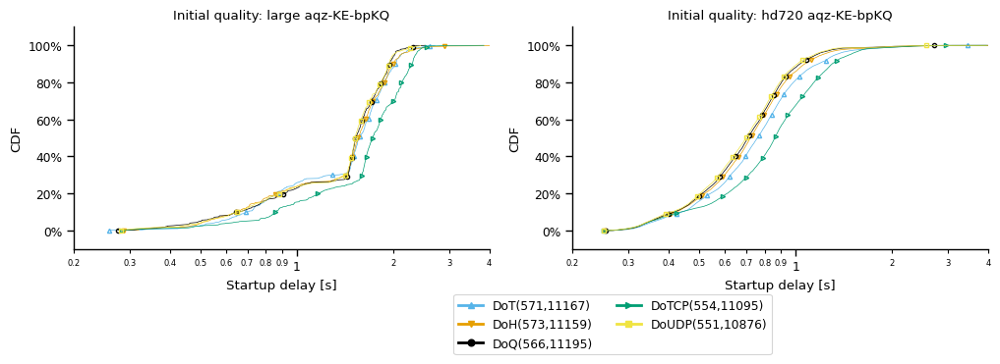

aqz-KE-bpKQ
DoT
large
count    571.000000
mean       1.464977
std        0.504040
min        0.258600
10%        0.702700
20%        0.865700
25%        0.986250
30%        1.358400
40%        1.503000
50%        1.571500
60%        1.669200
70%        1.761200
75%        1.825300
80%        1.876300
90%        2.032400
100%       2.703000
max        2.703000
Name: startup_delay, dtype: float64

aqz-KE-bpKQ
DoH
large
count    573.000000
mean       1.466281
std        0.532930
min        0.286900
10%        0.651580
20%        0.862680
25%        1.041900
30%        1.434060
40%        1.493640
50%        1.555400
60%        1.642460
70%        1.728280
75%        1.813600
80%        1.881780
90%        2.001080
100%       4.217500
max        4.217500
Name: startup_delay, dtype: float64

aqz-KE-bpKQ
DoQ
large
count    566.000000
mean       1.437090
std        0.476894
min        0.275800
10%        0.659250
20%        0.917600
25%        1.061625
30%        1.444600
40%        1.490700


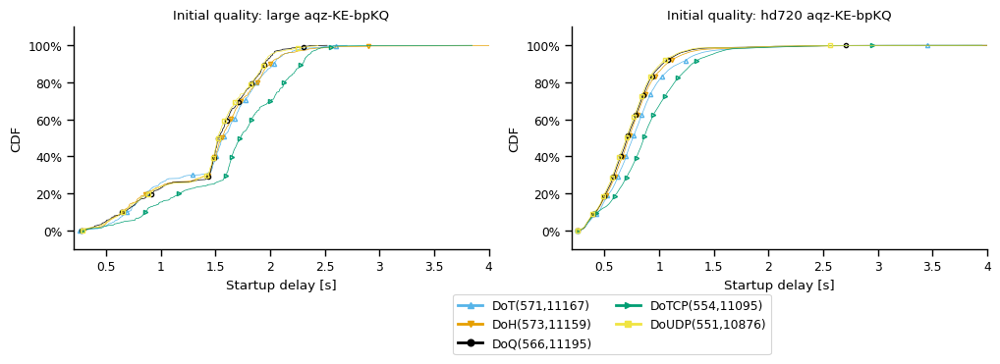

lqiN98z6Dak
DoT
large
count    2463.000000
mean        1.089343
std         0.461620
min         0.240000
10%         0.581720
20%         0.676280
25%         0.721500
30%         0.762760
40%         0.891200
50%         0.993600
60%         1.097660
70%         1.292480
75%         1.465550
80%         1.547160
90%         1.755020
100%        3.353700
max         3.353700
Name: startup_delay, dtype: float64

lqiN98z6Dak
DoH
large
count    1871.000000
mean        1.081908
std         0.475284
min         0.241500
10%         0.557200
20%         0.656600
25%         0.690950
30%         0.745400
40%         0.862700
50%         0.976100
60%         1.062100
70%         1.407600
75%         1.502750
80%         1.569800
90%         1.781700
100%        3.401100
max         3.401100
Name: startup_delay, dtype: float64

lqiN98z6Dak
DoQ
large
count    1833.000000
mean        1.075957
std         0.461586
min         0.245000
10%         0.559820
20%         0.658700
25%         0.697300

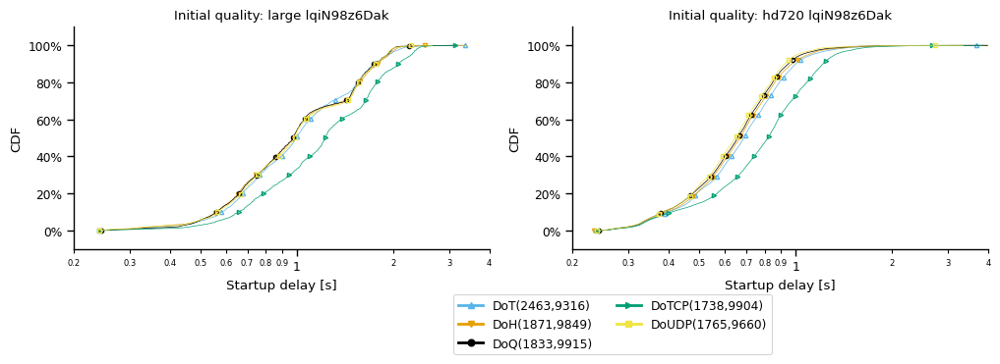

lqiN98z6Dak
DoT
large
count    2463.000000
mean        1.089343
std         0.461620
min         0.240000
10%         0.581720
20%         0.676280
25%         0.721500
30%         0.762760
40%         0.891200
50%         0.993600
60%         1.097660
70%         1.292480
75%         1.465550
80%         1.547160
90%         1.755020
100%        3.353700
max         3.353700
Name: startup_delay, dtype: float64

lqiN98z6Dak
DoH
large
count    1871.000000
mean        1.081908
std         0.475284
min         0.241500
10%         0.557200
20%         0.656600
25%         0.690950
30%         0.745400
40%         0.862700
50%         0.976100
60%         1.062100
70%         1.407600
75%         1.502750
80%         1.569800
90%         1.781700
100%        3.401100
max         3.401100
Name: startup_delay, dtype: float64

lqiN98z6Dak
DoQ
large
count    1833.000000
mean        1.075957
std         0.461586
min         0.245000
10%         0.559820
20%         0.658700
25%         0.697300

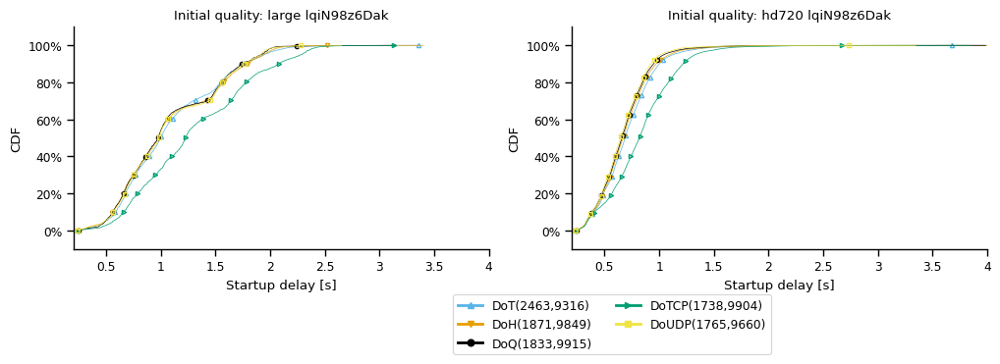

In [609]:
draw_cdf_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0.2,4], draw_all=True)

Africa South
Africa South
aqz-KE-bpKQ
DoH
large
count    422.000000
mean       1.702008
std        0.281776
min        0.676000
10%        1.453090
20%        1.493460
25%        1.515975
30%        1.532840
40%        1.593860
50%        1.658600
60%        1.725820
70%        1.842410
75%        1.888250
80%        1.925280
90%        2.036420
100%       2.900900
max        2.900900
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoQ
large
count    434.000000
mean       1.654637
std        0.271696
min        0.621000
10%        1.448540
20%        1.480760
25%        1.496625
30%        1.511590
40%        1.562720
50%        1.616700
60%        1.706640
70%        1.800520
75%        1.845850
80%        1.898160
90%        1.980550
100%       2.521100
max        2.521100
Name: startup_delay, dtype: float64

Africa South
aqz-KE-bpKQ
DoT
large
count    411.000000
mean       1.727590
std        0.289163
min        0.724000
10%        1.474500
20%        1.515500
25%     

Africa South
lqiN98z6Dak
DoH
large
count    843.000000
mean       1.461220
std        0.411208
min        0.601400
10%        0.800940
20%        1.045800
25%        1.145100
30%        1.299860
40%        1.469300
50%        1.528800
60%        1.595560
70%        1.685480
75%        1.744900
80%        1.808880
90%        1.949200
100%       3.401100
max        3.401100
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoQ
large
count    850.000000
mean       1.429221
std        0.400899
min        0.586200
10%        0.798940
20%        1.006480
25%        1.102700
30%        1.219690
40%        1.460400
50%        1.509750
60%        1.577980
70%        1.659890
75%        1.707725
80%        1.755460
90%        1.923780
100%       2.703700
max        2.703700
Name: startup_delay, dtype: float64

Africa South
lqiN98z6Dak
DoT
large
count    1136.000000
mean        1.434763
std         0.417261
min         0.591000
10%         0.810800
20%         1.037600
25%         1.1

Asia Pacific Northeast
Asia Pacific Northeast
aqz-KE-bpKQ
DoH
large
count    57.000000
mean      0.723765
std       0.228987
min       0.328700
10%       0.501080
20%       0.565820
25%       0.576800
30%       0.585320
40%       0.639800
50%       0.692400
60%       0.727900
70%       0.789400
75%       0.817000
80%       0.863440
90%       0.946080
100%      1.656600
max       1.656600
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoQ
large
count    51.000000
mean      0.746076
std       0.188565
min       0.374600
10%       0.494600
20%       0.552800
25%       0.572000
30%       0.632500
40%       0.739200
50%       0.765500
60%       0.785100
70%       0.882700
75%       0.902400
80%       0.932300
90%       0.995700
100%      1.028900
max       1.028900
Name: startup_delay, dtype: float64

Asia Pacific Northeast
aqz-KE-bpKQ
DoT
large
count    71.000000
mean      0.800273
std       0.220605
min       0.356000
10%       0.556000
20%       0.622600
25%     

Asia Pacific Northeast
lqiN98z6Dak
DoH
large
count    765.000000
mean       0.822490
std        0.197315
min        0.309600
10%        0.567800
20%        0.632620
25%        0.655700
30%        0.678920
40%        0.762140
50%        0.839800
60%        0.902740
70%        0.968840
75%        0.984700
80%        1.000420
90%        1.051240
100%       2.064500
max        2.064500
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoQ
large
count    735.000000
mean       0.822744
std        0.191736
min        0.251300
10%        0.570200
20%        0.630200
25%        0.658750
30%        0.684100
40%        0.775660
50%        0.843800
60%        0.900040
70%        0.971980
75%        0.986400
80%        1.000800
90%        1.046920
100%       1.549300
max        1.549300
Name: startup_delay, dtype: float64

Asia Pacific Northeast
lqiN98z6Dak
DoT
large
count    989.000000
mean       0.844404
std        0.208234
min        0.267700
10%        0.581340
20%        

Asia Pacific Southeast
Asia Pacific Southeast
aqz-KE-bpKQ
DoH
large
count    9.000000
mean     0.945778
std      0.369699
min      0.484800
10%      0.485200
20%      0.711080
25%      0.861600
30%      0.865200
40%      0.871040
50%      0.872800
60%      0.919360
70%      1.008520
75%      1.060200
80%      1.144320
90%      1.351440
100%     1.675200
max      1.675200
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoQ
large
count    13.000000
mean      0.754638
std       0.179240
min       0.502000
10%       0.543340
20%       0.575220
25%       0.617400
30%       0.624600
40%       0.667480
50%       0.780300
60%       0.842360
70%       0.862760
75%       0.872600
80%       0.909860
90%       0.965900
100%      1.038600
max       1.038600
Name: startup_delay, dtype: float64

Asia Pacific Southeast
aqz-KE-bpKQ
DoT
large
count    11.000000
mean      0.846918
std       0.173739
min       0.463400
10%       0.725200
20%       0.729700
25%       0.756000
30%   

/tmp/ipykernel_8335/1951434037.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(5,2))


Asia Pacific Southeast
lqiN98z6Dak
DoH
large
count    37.000000
mean      0.685551
std       0.231572
min       0.423400
10%       0.501400
20%       0.516420
25%       0.526400
30%       0.539220
40%       0.586260
50%       0.638400
60%       0.715740
70%       0.752840
75%       0.784600
80%       0.820720
90%       0.863780
100%      1.760700
max       1.760700
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoQ
large
count    36.000000
mean      0.646975
std       0.153656
min       0.440000
10%       0.485850
20%       0.497200
25%       0.508650
30%       0.514700
40%       0.533500
50%       0.657600
60%       0.693300
70%       0.721200
75%       0.757475
80%       0.776300
90%       0.818800
100%      1.019400
max       1.019400
Name: startup_delay, dtype: float64

Asia Pacific Southeast
lqiN98z6Dak
DoT
large
count    60.000000
mean      0.711382
std       0.243279
min       0.450900
10%       0.490470
20%       0.518180
25%       0.537650
30%       0.

Europe Central
Europe Central
aqz-KE-bpKQ
DoH
large
count    21.000000
mean      0.573505
std       0.221649
min       0.286900
10%       0.320500
20%       0.342600
25%       0.349800
30%       0.385700
40%       0.465200
50%       0.516300
60%       0.711700
70%       0.778700
75%       0.780800
80%       0.789700
90%       0.806700
100%      1.012000
max       1.012000
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoQ
large
count    17.000000
mean      0.635600
std       0.428328
min       0.275800
10%       0.312740
20%       0.343700
25%       0.388900
30%       0.392980
40%       0.436280
50%       0.461500
60%       0.527660
70%       0.736500
75%       0.802500
80%       0.806100
90%       1.027480
100%      1.946200
max       1.946200
Name: startup_delay, dtype: float64

Europe Central
aqz-KE-bpKQ
DoT
large
count    14.000000
mean      0.771214
std       0.358519
min       0.258600
10%       0.328870
20%       0.392360
25%       0.453300
30%       0.507640
40

Europe Central
lqiN98z6Dak
DoH
large
count    40.000000
mean      0.449998
std       0.238441
min       0.241500
10%       0.253650
20%       0.274420
25%       0.277525
30%       0.285030
40%       0.306200
50%       0.320750
60%       0.397620
70%       0.486080
75%       0.551950
80%       0.612080
90%       0.820560
100%      1.078100
max       1.078100
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoQ
large
count    27.000000
mean      0.565296
std       0.504032
min       0.245000
10%       0.256480
20%       0.266460
25%       0.270350
30%       0.276160
40%       0.399200
50%       0.493500
60%       0.564680
70%       0.625340
75%       0.677500
80%       0.709260
90%       0.752160
100%      2.897300
max       2.897300
Name: startup_delay, dtype: float64

Europe Central
lqiN98z6Dak
DoT
large
count    64.000000
mean      0.567561
std       0.319634
min       0.240000
10%       0.253540
20%       0.269700
25%       0.285800
30%       0.303520
40%       0.37162

South America East
South America East
aqz-KE-bpKQ
DoH
large
count    41.000000
mean      0.886888
std       0.461167
min       0.489100
10%       0.553400
20%       0.630000
25%       0.653100
30%       0.669500
40%       0.713400
50%       0.767000
60%       0.817500
70%       0.897500
75%       0.964700
80%       0.985700
90%       1.030000
100%      2.894000
max       2.894000
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoQ
large
count    24.000000
mean      0.824979
std       0.182687
min       0.410800
10%       0.646910
20%       0.686600
25%       0.692100
30%       0.702430
40%       0.755680
50%       0.876200
60%       0.907680
70%       0.932190
75%       0.941000
80%       0.977200
90%       1.046170
100%      1.099700
max       1.099700
Name: startup_delay, dtype: float64

South America East
aqz-KE-bpKQ
DoT
large
count    48.000000
mean      0.806613
std       0.218046
min       0.447300
10%       0.574180
20%       0.650360
25%       0.667675
30%  

South America East
lqiN98z6Dak
DoH
large
count    47.000000
mean      0.870913
std       0.417145
min       0.290600
10%       0.509700
20%       0.606180
25%       0.634700
30%       0.649900
40%       0.673060
50%       0.754600
60%       0.815620
70%       0.913060
75%       0.947050
80%       0.998940
90%       1.368660
100%      2.517100
max       2.517100
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoQ
large
count    35.000000
mean      0.724620
std       0.218642
min       0.316000
10%       0.487760
20%       0.534500
25%       0.633950
30%       0.636580
40%       0.647800
50%       0.689800
60%       0.709040
70%       0.774160
75%       0.827150
80%       0.858180
90%       0.960020
100%      1.417800
max       1.417800
Name: startup_delay, dtype: float64

South America East
lqiN98z6Dak
DoT
large
count    52.000000
mean      0.858021
std       0.253234
min       0.333800
10%       0.598860
20%       0.671720
25%       0.697250
30%       0.702980
40%  

US East
US East
aqz-KE-bpKQ
DoH
large
count    18.000000
mean      1.167822
std       1.131787
min       0.469600
10%       0.497330
20%       0.587200
25%       0.632000
30%       0.653670
40%       0.682380
50%       0.739700
60%       0.838400
70%       0.945160
75%       1.163100
80%       1.281980
90%       2.174220
100%      4.217500
max       4.217500
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoQ
large
count    23.000000
mean      0.639813
std       0.281525
min       0.337800
10%       0.367640
20%       0.442280
25%       0.461350
30%       0.477540
40%       0.522140
50%       0.539800
60%       0.622560
70%       0.690820
75%       0.744500
80%       0.760620
90%       0.978960
100%      1.526200
max       1.526200
Name: startup_delay, dtype: float64

US East
aqz-KE-bpKQ
DoT
large
count    13.000000
mean      0.713262
std       0.334966
min       0.424100
10%       0.500800
20%       0.516000
25%       0.520200
30%       0.531660
40%       0.545860
50%       0

US East
lqiN98z6Dak
DoH
hd720
count    1630.000000
mean        0.613384
std         0.213703
min         0.293200
10%         0.417730
20%         0.462580
25%         0.481925
30%         0.497170
40%         0.530080
50%         0.566600
60%         0.620140
70%         0.700750
75%         0.727075
80%         0.757160
90%         0.828030
100%        4.108600
max         4.108600
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoQ
hd720
count    1611.000000
mean        0.596721
std         0.168042
min         0.270500
10%         0.412900
20%         0.453900
25%         0.471750
30%         0.490400
40%         0.522900
50%         0.559600
60%         0.613800
70%         0.691700
75%         0.717750
80%         0.746900
90%         0.818100
100%        1.817600
max         1.817600
Name: startup_delay, dtype: float64

US East
lqiN98z6Dak
DoT
hd720
count    1638.000000
mean        0.634296
std         0.218010
min         0.279000
10%         0.423770
20%         0.473

US West
aqz-KE-bpKQ
DoH
large
count    5.000000
mean     0.547740
std      0.156081
min      0.339300
10%      0.414420
20%      0.489540
25%      0.527100
30%      0.529680
40%      0.534840
50%      0.540000
60%      0.545320
70%      0.550640
75%      0.553300
80%      0.598440
90%      0.688720
100%     0.779000
max      0.779000
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
large
count    4.000000
mean     0.524875
std      0.195737
min      0.318300
10%      0.369510
20%      0.420720
25%      0.446325
30%      0.471930
40%      0.491580
50%      0.495450
60%      0.499320
70%      0.530740
75%      0.574000
80%      0.617260
90%      0.703780
100%     0.790300
max      0.790300
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoT
large
count    3.000000
mean     0.513267
std      0.150689
min      0.341600
10%      0.388180
20%      0.434760
25%      0.458050
30%      0.481340
40%      0.527920
50%      0.574500
60%      0.584340
70%      0.594180
75%     

US West
lqiN98z6Dak
DoH
hd720
count    1597.000000
mean        0.589659
std         0.163397
min         0.291100
10%         0.392520
20%         0.460720
25%         0.488800
30%         0.529500
40%         0.567380
50%         0.597300
60%         0.618580
70%         0.643900
75%         0.662800
80%         0.680060
90%         0.732480
100%        2.969100
max         2.969100
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoQ
hd720
count    1612.000000
mean        0.574191
std         0.139394
min         0.286600
10%         0.387440
20%         0.444140
25%         0.471050
30%         0.507190
40%         0.560800
50%         0.588950
60%         0.610900
70%         0.635910
75%         0.649925
80%         0.668780
90%         0.720380
100%        1.732000
max         1.732000
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoT
hd720
count    1586.000000
mean        0.614739
std         0.198247
min         0.298800
10%         0.401550
20%         0.479

US West
aqz-KE-bpKQ
DoH
hd720
count    11159.000000
mean         0.752464
std          0.312312
min          0.252900
10%          0.420740
20%          0.519480
25%          0.563400
30%          0.599240
40%          0.664700
50%          0.720800
60%          0.782300
70%          0.845360
75%          0.881250
80%          0.923020
90%          1.066020
100%         4.633400
max          4.633400
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoQ
hd720
count    11195.000000
mean         0.730874
std          0.276265
min          0.254400
10%          0.416000
20%          0.509880
25%          0.552900
30%          0.584600
40%          0.648080
50%          0.708600
60%          0.772500
70%          0.833000
75%          0.867000
80%          0.902220
90%          1.031500
100%         4.679100
max          4.679100
Name: startup_delay, dtype: float64

US West
aqz-KE-bpKQ
DoT
hd720
count    11167.000000
mean         0.796087
std          0.327166
min          0.251900


US West
lqiN98z6Dak
DoH
hd720
count    9849.000000
mean        0.690617
std         0.261784
min         0.234300
10%         0.391840
20%         0.488400
25%         0.524200
30%         0.556100
40%         0.610700
50%         0.668500
60%         0.720900
70%         0.788660
75%         0.823100
80%         0.859940
90%         0.973100
100%        4.517300
max         4.517300
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoQ
hd720
count    9915.000000
mean        0.674294
std         0.236905
min         0.242500
10%         0.383300
20%         0.475400
25%         0.512400
30%         0.549000
40%         0.601260
50%         0.657700
60%         0.710700
70%         0.774900
75%         0.809400
80%         0.847100
90%         0.948260
100%        3.985200
max         3.985200
Name: startup_delay, dtype: float64

US West
lqiN98z6Dak
DoT
hd720
count    9316.000000
mean        0.709748
std         0.266865
min         0.238000
10%         0.398500
20%         0.490

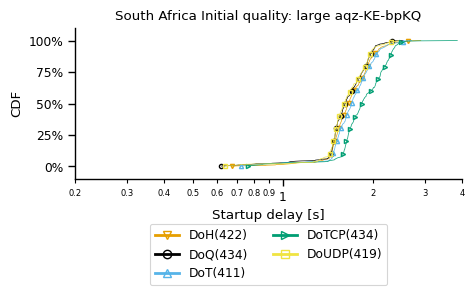

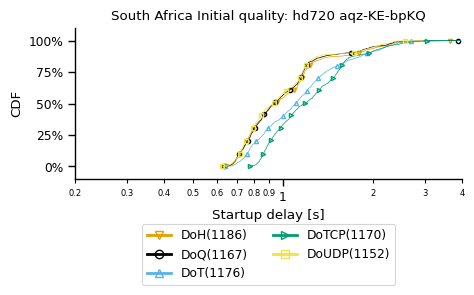

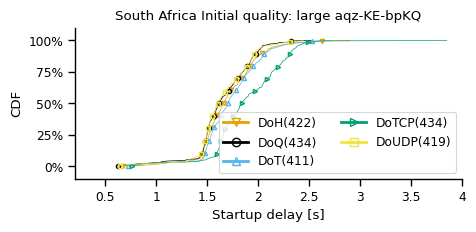

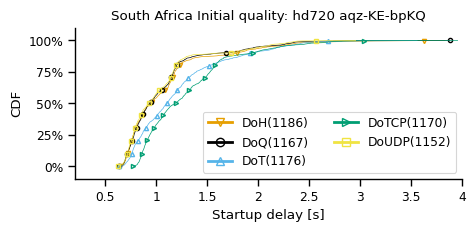

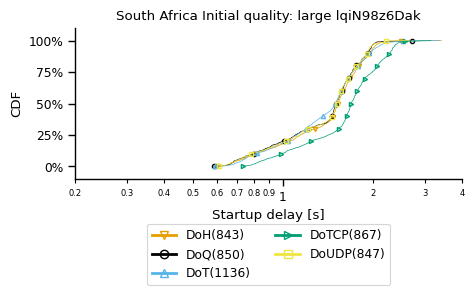

...

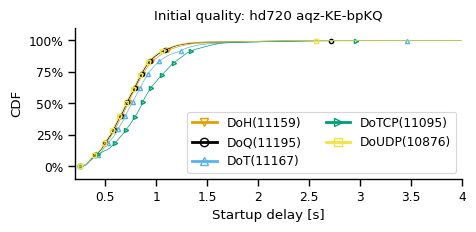

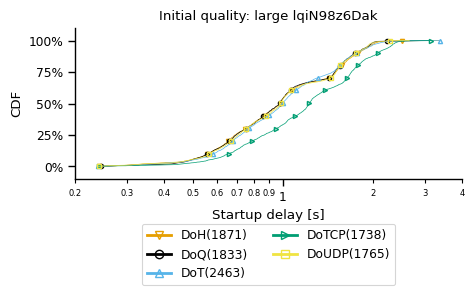

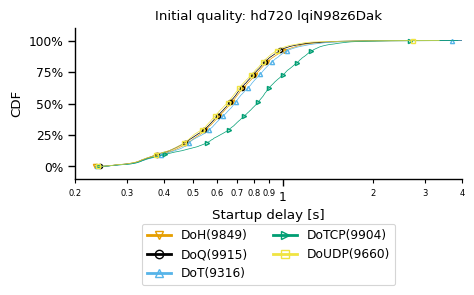

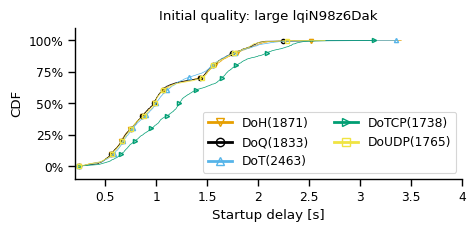

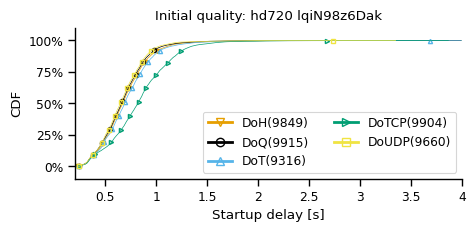

In [610]:
draw_cdf(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [True,False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0.2,4], True)

In [ ]:
#df_player_quality_change_event_to_opt.groupby(['vantagePoint','optimal_res', 'domain']).agg({'msm_id':pd.Series.nunique})

In [258]:
#draw_cdf_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], draw_all=True)

In [259]:
#draw_cdf(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True,False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0])

DoT
count    23517.000000
mean         0.808839
std          0.360782
min          0.238000
10%          0.435800
20%          0.534900
25%          0.581600
30%          0.615300
40%          0.684240
50%          0.746600
60%          0.817360
70%          0.893600
75%          0.939900
80%          0.997600
90%          1.247200
100%         6.276200
max          6.276200
Name: startup_delay, dtype: float64
DoH
count    23452.000000
mean         0.770214
std          0.350041
min          0.234300
10%          0.419210
20%          0.515400
25%          0.556400
30%          0.589930
40%          0.653000
50%          0.712250
60%          0.778200
70%          0.848170
75%          0.887900
80%          0.940480
90%          1.127480
100%         4.633400
max          4.633400
Name: startup_delay, dtype: float64
DoQ
count    23509.000000
mean         0.750920
std          0.322992
min          0.242500
10%          0.411960
20%          0.505100
25%          0.547600
30%          0

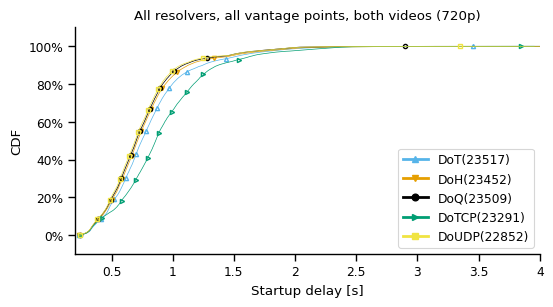

In [405]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_start_time['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = .5
mrksize = 3
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay'])))
    if len(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay']) == 0:
        continue
    cdf = Cdf.MakeCdfFromList(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay'])
    print(col_val_)
    print(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    ax.plot(cdf.xs, cdf.ps, label=col_val_,
                linestyle='-', linewidth=lnwidth, 
                markersize=mrksize, fillstyle='none', 
                markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                color=colors[col_val_], marker=markers[col_val_]
            )
    #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
    #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('All resolvers, all vantage points, both videos (720p)')

    ax.set_xlabel('Startup delay [s]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim([0.2,4])



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-startup-delay-all-rslv-both-videos-all-vps-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-startup-delay-all-rslv-both-videos-all-vps.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [467]:
df_tmp_plt = df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('protocol')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['protocol', 'true_initial_quality']).unstack()

rel_num_msm          
true_initial_quality       hd720     large
protocol                                  
DoH                     0.895787  0.104213
DoQ                     0.897954  0.102046
DoT                     0.870987  0.129013
DoTCP                   0.901593  0.098407
DoUDP                   0.898652  0.101348

In [462]:
df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack()

num_msm      
true_initial_quality   hd720 large
protocol                          
DoH                    21008  2444
DoQ                    21110  2399
DoT                    20483  3034
DoTCP                  20999  2292
DoUDP                  20536  2316

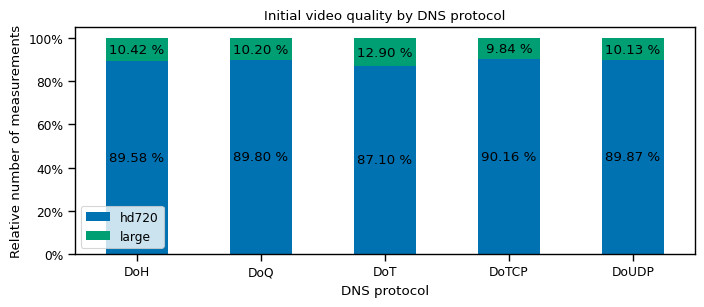

In [494]:
fig, ax = plt.subplots(1, 1, figsize=(8,3))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('protocol')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['protocol', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('DNS protocol')
ax.set_title('Initial video quality by DNS protocol')
ax.legend(handles=label_list[0], labels=new_labels)
fig.savefig('figures/start_initial_quality_by_protocol.pdf', format='pdf', bbox_inches='tight')
plt.show()

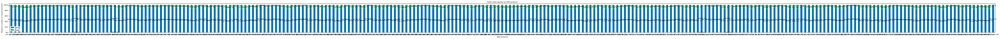

In [516]:
fig, ax = plt.subplots(1, 1, figsize=(100,3))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time.groupby(['server', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('server')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['server', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('DNS protocol')
ax.set_title('Initial video quality by DNS protocol')
ax.legend(handles=label_list[0], labels=new_labels)
#fig.savefig('figures/start_initial_quality_by_protocol.pdf', format='pdf', bbox_inches='tight')
plt.show()

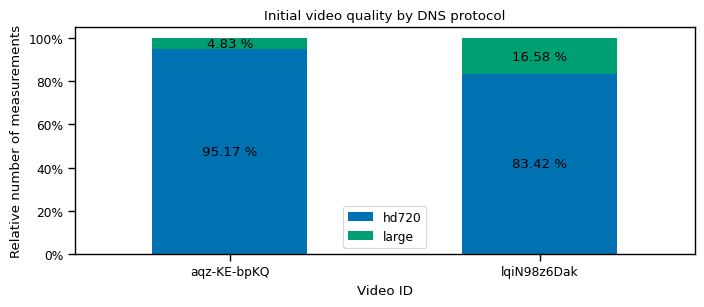

In [515]:
fig, ax = plt.subplots(1, 1, figsize=(8,3))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time.groupby(['domain', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('domain')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['domain', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('Video ID')
ax.set_title('Initial video quality by DNS protocol')
ax.legend(handles=label_list[0], labels=new_labels)
#fig.savefig('figures/start_initial_quality_by_protocol.pdf', format='pdf', bbox_inches='tight')
plt.show()

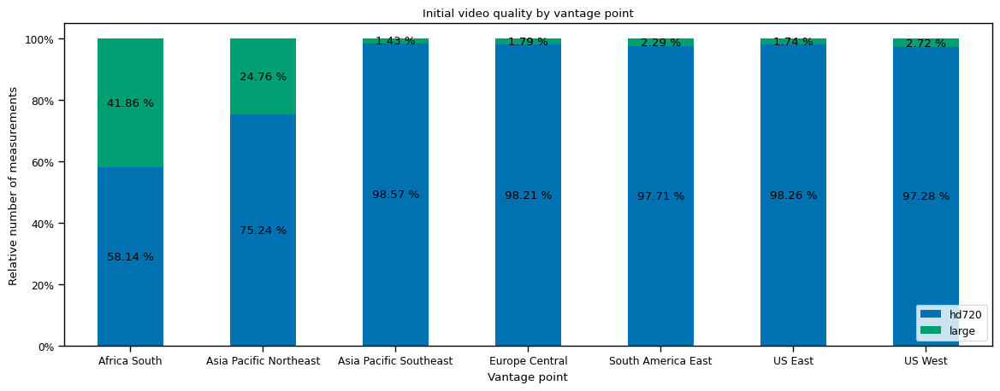

In [492]:
fig, ax = plt.subplots(1, 1, figsize=(14,5))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time.groupby(['vantagePoint', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('vantagePoint')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['vantagePoint', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('Vantage point')
ax.set_title('Initial video quality by vantage point')
ax.legend(handles=label_list[0], labels=new_labels, loc='lower right')
fig.savefig('figures/start_initial_quality.pdf', format='pdf', bbox_inches='tight')
plt.show()

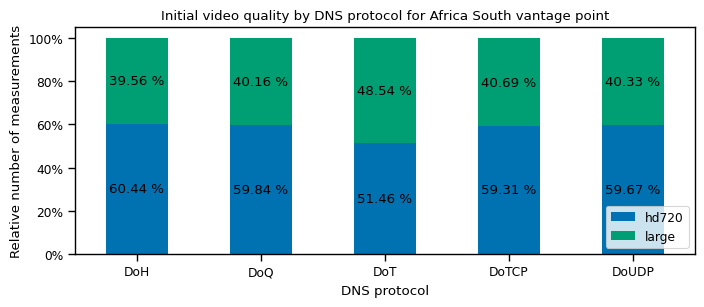

In [498]:
fig, ax = plt.subplots(1, 1, figsize=(8,3))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time[df_start_time.vantagePoint == 'Africa South'].groupby(['protocol', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('protocol')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['protocol', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('DNS protocol')
ax.set_title('Initial video quality by DNS protocol for Africa South vantage point')
ax.legend(handles=label_list[0], labels=new_labels, loc='lower right')
fig.savefig('figures/start_initial_quality_by_protocol_africa_south.pdf', format='pdf', bbox_inches='tight')
plt.show()

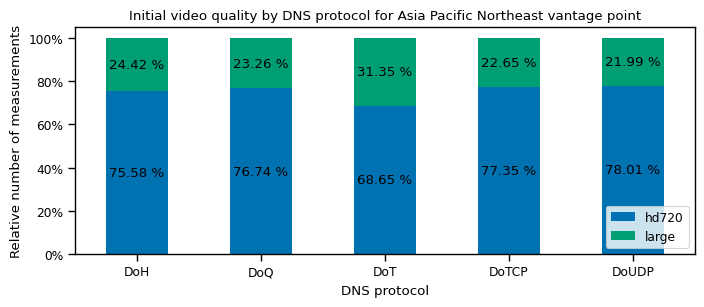

In [499]:
fig, ax = plt.subplots(1, 1, figsize=(8,3))
#df_start_time.groupby(['protocol', 'true_initial_quality'], observed=True).agg(num_msm=('msm_id', pd.Series.nunique)).unstack().plot(ax=ax, kind='bar', stacked=True)
df_tmp_plt = df_start_time[df_start_time.vantagePoint == 'Asia Pacific Northeast'].groupby(['protocol', 'true_initial_quality'], observed=True, as_index=False).agg(num_msm=('msm_id', pd.Series.nunique))
df_tmp_plt['rel_num_msm'] = df_tmp_plt['num_msm'] / df_tmp_plt.groupby('protocol')['num_msm'].transform('sum')
df_tmp_plt = df_tmp_plt.drop('num_msm', axis=1)
df_tmp_plt.set_index(['protocol', 'true_initial_quality']).unstack().plot(ax=ax, kind='bar', stacked=True, rot=0, color=['C5', 'C3'])

#https://stackoverflow.com/a/50161387
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy() 
    ax.text(x+width/2, 
            y+height/2, 
            '{:.2f} %'.format(height*100), 
            horizontalalignment='center', 
            verticalalignment='center')
    
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))
#https://stackoverflow.com/a/58822839
label_list = []
for t in ax.get_legend_handles_labels():
    label_list.append(t)
new_labels = []
for label in label_list[1]:
    if 'hd720' in label:
        new_labels.append('hd720')
    elif 'large' in label:
        new_labels.append('large')
ax.set_ylabel('Relative number of measurements')
ax.set_xlabel('DNS protocol')
ax.set_title('Initial video quality by DNS protocol for Asia Pacific Northeast vantage point')
ax.legend(handles=label_list[0], labels=new_labels, loc='lower right')
fig.savefig('figures/start_initial_quality_by_protocol_japan.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [257]:
df_start_time = pd.merge(df_start_time, measurements[['msm_id', 'server']], on='msm_id')

In [258]:
df_start_time.groupby(['server', 'protocol'], as_index=False).agg(startup_delay=('startup_delay', 'median')).pivot(index='server', columns='protocol', values='startup_delay').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

protocol,DoH,DoQ,DoT,DoTCP,DoUDP
server,,,,,
103.105.98.141,0.78,0.78,0.79,0.94,0.78
103.123.108.197,0.69,0.67,0.70,0.89,0.66
103.124.95.99,0.80,0.81,0.82,0.99,0.79
103.172.17.225,0.83,0.82,0.85,1.04,0.83
103.172.17.226,0.90,0.96,1.01,1.16,0.98
103.176.79.211,0.88,0.84,0.89,1.06,0.85
103.179.44.88,0.78,0.78,0.83,0.99,0.78
103.179.45.33,0.76,0.72,0.80,0.88,0.69
103.227.141.70,0.83,0.64,0.97,0.87,0.60


In [420]:
median_doh_better = 0
median_dot_better = 0
doh_better = []
dot_better = []
for idx, row in df_start_time.groupby(['server', 'protocol']).agg(startup_delay=('startup_delay', 'median')).unstack().reset_index().iterrows():
    row_ = row.droplevel(0)
    #if row_['DoT'] > row_['DoH']:
    if row_['DoT']-row_['DoH'] > 0.01 :
        median_doh_better = median_doh_better+1
        doh_better.append(row['server'].values[0])
    else:
        median_dot_better = median_dot_better+1
        dot_better.append(row['server'].values[0])
print(median_doh_better)
print(median_dot_better)
print(median_dot_better+median_doh_better)
print(doh_better)

164
93
257
['103.124.95.99', '103.172.17.225', '103.172.17.226', '103.176.79.211', '103.179.44.88', '103.179.45.33', '103.227.141.70', '103.232.207.2', '103.237.147.61', '103.78.123.211', '104.199.26.56', '104.238.154.123', '104.244.72.39', '104.244.79.105', '106.12.119.30', '112.213.39.133', '116.118.44.237', '123.195.161.145', '128.199.66.193', '13.124.186.64', '130.61.24.160', '132.226.232.79', '134.209.81.226', '135.125.181.234', '135.125.236.23', '138.2.79.62', '138.3.219.11', '139.162.70.69', '140.238.36.23', '140.238.42.214', '140.83.39.110', '141.95.140.195', '144.22.147.217', '146.56.112.4', '146.56.160.153', '146.56.176.39', '146.56.177.76', '146.56.184.134', '146.59.226.118', '146.59.23.151', '146.59.32.198', '147.182.195.29', '147.189.137.154', '149.56.45.165', '15.165.113.96', '150.230.103.62', '150.230.197.114', '150.230.99.64', '152.67.223.117', '152.69.204.173', '152.70.189.89', '152.70.210.231', '152.70.232.216', '152.70.54.34', '152.70.70.91', '154.49.211.118', '157.1

In [260]:
dot_better

['103.105.98.141',
 '103.123.108.197',
 '103.232.207.3',
 '107.172.103.160',
 '107.172.30.115',
 '107.191.51.151',
 '108.166.219.158',
 '109.205.178.178',
 '118.163.170.2',
 '120.55.44.44',
 '128.199.115.141',
 '129.154.226.9',
 '13.250.108.212',
 '138.2.72.170',
 '138.2.84.109',
 '138.2.91.167',
 '139.59.106.60',
 '140.238.10.79',
 '16.162.44.250',
 '164.92.136.119',
 '167.99.236.104',
 '167.99.37.126',
 '168.138.163.222',
 '168.138.50.5',
 '176.103.130.130',
 '176.103.130.132',
 '176.103.130.136',
 '176.103.130.137',
 '176.103.130.149',
 '176.103.134.134',
 '176.103.134.150',
 '176.103.134.35',
 '176.103.134.5',
 '180.93.137.1',
 '182.234.39.52',
 '185.175.57.120',
 '185.200.34.171',
 '185.254.18.242',
 '188.116.27.94',
 '188.166.209.249',
 '188.227.86.112',
 '188.68.59.46',
 '192.3.127.219',
 '194.67.121.139',
 '199.115.228.98',
 '20.24.142.152',
 '203.160.55.187',
 '204.44.76.45',
 '212.86.101.213',
 '217.160.68.68',
 '220.77.190.228',
 '23.239.29.136',
 '23.95.209.33',
 '3.9.78.39

In [1024]:
# from https://github.com/vbajpai/ripe69-python3-toolset/blob/master/ripe69-python3-toolset.ipynb
import requests
def get_json_resource_from_absolute_uri(url, query_params):
    try:
        res = requests.get(url, params = query_params)
    except Exception as e:
        print(e, file=sys.stderr)
    else:
        try:
            res_json = res.json()
        except Exception as e:
            print(e, file=sys.stderr)
        else: 
            return res_json
def get_asn_from_endpoint(endpoint):
    asn = holder = None
    base_uri = 'https://stat.ripe.net'; url = '%s/data/prefix-overview/data.json'%base_uri
    params = {'resource' : endpoint}
    try:
        res = get_json_resource_from_absolute_uri(url, params)
    except Exception as e:
        print(e, file=sys.stderr); return None
    try:
        asns_holders = []
        for item in res['data']['asns']:
            asn = item['asn']
            holder = item['holder']
            asns_holders.append((asn, holder))
    except Exception as e:
        print(e, file=sys.stderr)
    return asns_holders

resolvers_to_asn_map_dot_better = dict()
for ip in dot_better:
    resolvers_to_asn_map_dot_better[ip] = str(get_asn_from_endpoint(ip))
resolvers_to_asn_map_doh_better = dict()
for ip in doh_better:
    resolvers_to_asn_map_doh_better[ip] = str(get_asn_from_endpoint(ip))

In [1025]:
df_asn_dot_better = pd.DataFrame.from_dict(resolvers_to_asn_map_dot_better, orient='index', columns=['asn'])
df_asn_doh_better = pd.DataFrame.from_dict(resolvers_to_asn_map_doh_better, orient='index', columns=['asn'])

In [1026]:
df_asn_dot_better.asn.value_counts()

[(199274, 'MNGTNET - Serveroid, LLC')]                                            9
[(31898, 'ORACLE-BMC-31898')]                                                     8
[(14061, 'DIGITALOCEAN-ASN')]                                                     7
[(212772, 'ADGUARD - AdGuard Software Limited')]                                  6
[(16509, 'AMAZON-02')]                                                            6
[(36352, 'AS-COLOCROSSING')]                                                      4
[(197540, 'NETCUP-AS - netcup GmbH')]                                             4
[(16276, 'OVH - OVH SAS')]                                                        3
[(204601, 'ON-LINE-DATA - Zomro B.V.')]                                           2
[(197695, 'AS-REGRU - "Domain names registrar REG.RU", Ltd')]                     2
[(208951, 'AS-ITGLOBALCOM - IT-GRAD NL B.V.')]                                    2
[(45102, 'ALIBABA-CN-NET Alibaba US Technology Co.')]                       

In [1027]:
dot_vs_doh_asn_intersection = set(df_asn_dot_better.asn.unique()).intersection(set(df_asn_doh_better.asn.unique()))

In [1028]:
len(dot_vs_doh_asn_intersection)

25

In [1029]:
len(set(df_asn_dot_better.asn.value_counts().index.to_list()[:11]).intersection(dot_vs_doh_asn_intersection))

8

In [1030]:
#all the ones with more than one resolver are also in the intersection...
df_asn_dot_better[df_asn_dot_better.asn.isin(dot_vs_doh_asn_intersection)].asn.value_counts()

[(199274, 'MNGTNET - Serveroid, LLC')]                                            9
[(31898, 'ORACLE-BMC-31898')]                                                     8
[(14061, 'DIGITALOCEAN-ASN')]                                                     7
[(212772, 'ADGUARD - AdGuard Software Limited')]                                  6
[(16509, 'AMAZON-02')]                                                            6
[(197540, 'NETCUP-AS - netcup GmbH')]                                             4
[(36352, 'AS-COLOCROSSING')]                                                      4
[(16276, 'OVH - OVH SAS')]                                                        3
[(45102, 'ALIBABA-CN-NET Alibaba US Technology Co.')]                             2
[(37963, 'ALIBABA-CN-NET Hangzhou Alibaba Advertising Co.')]                      2
[(396982, 'GOOGLE-CLOUD-PLATFORM')]                                               2
[(49581, 'FERDINANDZINK - Ferdinand Zink trading as Tube-Hosting')]         

In [1031]:
df_asn_doh_better.asn.value_counts()

[(31898, 'ORACLE-BMC-31898')]                                                     27
[(16276, 'OVH - OVH SAS')]                                                        12
[(63949, 'LINODE-AP Linode')]                                                      8
[(14061, 'DIGITALOCEAN-ASN')]                                                      8
[(199274, 'MNGTNET - Serveroid, LLC')]                                             8
[(35916, 'MULTA-ASN1')]                                                            4
[(132203, 'TENCENT-NET-AP-CN Tencent Building')]                                   4
[(16509, 'AMAZON-02')]                                                             3
[(16125, 'CHERRYSERVERS1-AS - UAB Cherry Servers')]                                3
[(25820, 'IT7NET')]                                                                3
[(197540, 'NETCUP-AS - netcup GmbH')]                                              3
[(36352, 'AS-COLOCROSSING')]                                     

DoT
count    8485.000000
mean        0.754303
std         0.340043
min         0.240000
10%         0.392300
20%         0.486900
25%         0.523900
30%         0.568220
40%         0.632000
50%         0.696000
60%         0.761600
70%         0.838400
75%         0.879100
80%         0.932420
90%         1.149200
100%        3.679100
max         3.679100
Name: startup_delay, dtype: float64
DoH
count    8473.000000
mean        0.760294
std         0.376485
min         0.236800
10%         0.396060
20%         0.489340
25%         0.529500
30%         0.567800
40%         0.634100
50%         0.694700
60%         0.757820
70%         0.833200
75%         0.872000
80%         0.920060
90%         1.138820
100%        4.633400
max         4.633400
Name: startup_delay, dtype: float64
DoQ
count    8439.000000
mean        0.733529
std         0.319727
min         0.242500
10%         0.390300
20%         0.483200
25%         0.523250
30%         0.563100
40%         0.626000
50%         0

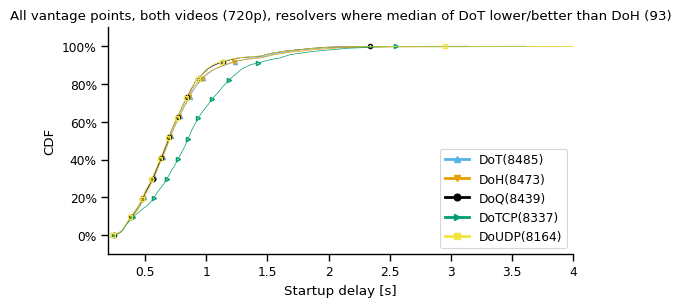

In [423]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_start_time['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = .5
mrksize = 3
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(dot_better))]['startup_delay'])))
    if len(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(dot_better))]['startup_delay']) == 0:
        continue
    cdf = Cdf.MakeCdfFromList(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(dot_better))]['startup_delay'])
    print(col_val_)
    print(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(dot_better))]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    ax.plot(cdf.xs, cdf.ps, label=col_val_,
                linestyle='-', linewidth=lnwidth, 
                markersize=mrksize, fillstyle='none', 
                markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                color=colors[col_val_], marker=markers[col_val_]
            )
    #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
    #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('All vantage points, both videos (720p), resolvers where median of DoT lower/better than DoH ('+str(median_dot_better)+')')

    ax.set_xlabel('Startup delay [s]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim([0.2,4])



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-dot-better-than-doh-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-dot-better-than-doh.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    15032.000000
mean         0.839622
std          0.368442
min          0.238000
10%          0.464500
20%          0.571700
25%          0.608975
30%          0.646130
40%          0.710440
50%          0.778700
60%          0.847000
70%          0.924100
75%          0.972300
80%          1.029000
90%          1.278000
100%         6.276200
max          6.276200
Name: startup_delay, dtype: float64
DoH
count    14979.000000
mean         0.775826
std          0.334040
min          0.234300
10%          0.433600
20%          0.532860
25%          0.568400
30%          0.600780
40%          0.665000
50%          0.721000
60%          0.788300
70%          0.857560
75%          0.898600
80%          0.948780
90%          1.120100
100%         4.349900
max          4.349900
Name: startup_delay, dtype: float64
DoQ
count    15070.000000
mean         0.760659
std          0.324410
min          0.245000
10%          0.428000
20%          0.519500
25%          0.558200
30%          0

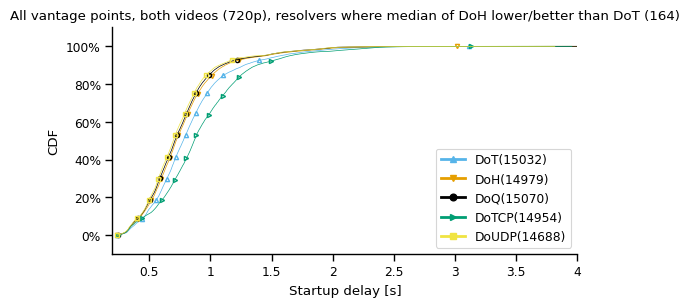

In [422]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_start_time['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = .5
mrksize = 3
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(doh_better))]['startup_delay'])))
    if len(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(doh_better))]['startup_delay']) == 0:
        continue
    cdf = Cdf.MakeCdfFromList(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(doh_better))]['startup_delay'])
    print(col_val_)
    print(df_start_time[(df_start_time['protocol'] == col_val_) & (df_start_time.server.isin(doh_better))]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    ax.plot(cdf.xs, cdf.ps, label=col_val_,
                linestyle='-', linewidth=lnwidth, 
                markersize=mrksize, fillstyle='none', 
                markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                color=colors[col_val_], marker=markers[col_val_]
            )
    #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
    #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('All vantage points, both videos (720p), resolvers where median of DoH lower/better than DoT ('+str(median_doh_better)+')')

    ax.set_xlabel('Startup delay [s]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim([0.2,4])



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-doh-better-than-dot-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-doh-better-than-dot.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [611]:
def draw_boxplot_grid(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel, showmean=True, draw_all=False):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in sorted(df_['vantagePoint'].unique().tolist()):
            print(vp)
            for video in sorted(df_['domain'].unique().tolist()):
                for log in log_list:
                    num_rows = math.ceil(df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].nunique()/2)
                    #if col_outer_groupby_ == 'true_initial_quality':
                    #    num_rows = 2
                    if df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].nunique() > 1:
                        fig, axs = plt.subplots(num_rows, 2, sharex='all', figsize=(12,6*num_rows))#, sharey='all')
                        fig.subplots_adjust(hspace=.2, wspace=.3)
                        #turn off all axis before plotting, then only turn back on the ones we plot in
                        #https://stackoverflow.com/a/66799199
                        for ax in axs.flat:
                            ax.set_axis_off()
                        col_outer_groupby_values = df_[(df_['vantagePoint'] == vp) & (df_['domain'] == video)][col_outer_groupby_].sort_values().unique()
                        #if col_outer_groupby_ == 'true_initial_quality':
                        #    col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                        for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        #for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                            ax.set_axis_on()
                            lnwidth = .5
                            mrksize = 3
                            df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                            #hue=
                            
                            boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                            showfliers=False, order=y_order,
                            color='white',
                            meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                            #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                            
                            if log:
                                ax.set_xscale('log')
                            
                            
                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(vp_map_to_normal_names[vp]+' '+title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel(ylabel)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)

                            ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                            ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        plt.show()
        if draw_all:
            print('all vantage points')
            for video in sorted(df_['domain'].unique().tolist()):
                for log in log_list:
                    num_rows = math.ceil(df_[(df_['domain'] == video)][col_outer_groupby_].nunique()/2)
                    if col_outer_groupby_ == 'true_initial_quality':
                        num_rows = 2
                    if df_[(df_['domain'] == video)][col_outer_groupby_].nunique() > 1:
                        fig, axs = plt.subplots(num_rows, 2, sharex='all', figsize=(12,6*num_rows))#, sharey='all')
                        fig.subplots_adjust(hspace=.2, wspace=.3)
                        #turn off all axis before plotting, then only turn back on the ones we plot in
                        #https://stackoverflow.com/a/66799199
                        for ax in axs.flat:
                            ax.set_axis_off()
                        col_outer_groupby_values = df_[(df_['domain'] == video)][col_outer_groupby_].sort_values().unique()
                        #if col_outer_groupby_ == 'true_initial_quality':
                        #    col_outer_groupby_values = ['hd720', 'hd1080', 'hd1440', 'hd2160']
                        for col_grp_, ax in zip(col_outer_groupby_values, axs.flat):
                        #for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                            ax.set_axis_on()
                            lnwidth = .5
                            mrksize = 3
                            df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['domain'] == video)]
                            #hue=
                            
                            boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                            showfliers=False, order=y_order,
                            color='white',
                            meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                            #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                            
                            if log:
                                ax.set_xscale('log')
                            
                            
                            ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
                            ax.tick_params(axis='x', which='minor', labelsize=6)
                            ax.xaxis.set_tick_params(labelbottom=True, which='both')


                            ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                            ax.set_xlabel(xlabel)

                            ax.set_ylabel(ylabel)
                            if xlim != [0,0]:
                                ax.set_xlim(xlim)

                            ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                            ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+'-all-vps-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+'-grid-'+video+'-all-vps.pdf', format='pdf', bbox_inches='tight')
                        plt.show()

In [612]:
def draw_boxplot(df_, col_outer_groupby_, col_name_, col_metric_, log_list, xlabel, title, figname, xlim, ylabel, showmean=True, draw_all=False):
    proto_order=['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
    if col_name_ == 'protocol':
        y_order = proto_order
    else:
        y_order = sorted(df_[col_name_].unique().tolist())
    with plt.style.context('seaborn-whitegrid'):
        for vp in sorted(df_['vantagePoint'].unique().tolist()):
            print(vp)
            for video in sorted(df_['domain'].unique().tolist()):
                for log in log_list:
                    for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['vantagePoint'] == vp) & (df_['domain'] == video)]
                        fig, ax = plt.subplots(figsize=(6,8))
                        #hue=
                        boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                        showfliers=False, order=y_order,
                        color='white',
                        meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                        #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                        
                        if log:
                            ax.set_xscale('log')
                        
                        
                        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


                        ax.set_title(vp_map_to_normal_names[vp]+' '+title+ ' ' + col_grp_ + ' ' + video)

                        ax.set_xlabel(xlabel)

                        ax.set_ylabel(ylabel)
                        if xlim != [0,0]:
                            ax.set_xlim(xlim)

                        ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                        ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+vp+'.pdf', format='pdf', bbox_inches='tight')
                        #plt.show()
        if draw_all:
            print('all vantage points')
            for video in sorted(df_['domain'].unique().tolist()):
                for log in log_list:
                    for col_grp_ in df_[col_outer_groupby_].sort_values().unique():
                        lnwidth = .5
                        mrksize = 3
                        df_tmp = df_[(df_[col_outer_groupby_]==col_grp_)&(df_['domain'] == video)]
                        fig, ax = plt.subplots(figsize=(6,8))
                        #hue=
                        boxplt = sns.boxplot(x=col_metric_, y=col_name_ , data=df_tmp, orient='h', linewidth=1, ax=ax, 
                        showfliers=False, order=y_order,
                        color='white',
                        meanline = True, showmeans = showmean, meanprops=dict(color='darkgoldenrod'), medianprops=dict(color='blue'))
                        #sw = sns.swarmplot(x=col_metric_, y=col_name_, data=df_tmp, color=".25", ax=ax, orient='h', size=1.5, order=y_order)
                        
                        if log:
                            ax.set_xscale('log')
                        
                        
                        ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
                        #ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))


                        ax.set_title(title+ ' ' + col_grp_ + ' ' + video)

                        ax.set_xlabel(xlabel)

                        ax.set_ylabel(ylabel)
                        if xlim != [0,0]:
                            ax.set_xlim(xlim)

                        ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.5))
                        ax.grid(b=True, which='both')


                        if log:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+'-all-vps-log.pdf', format='pdf', bbox_inches='tight')
                        else:
                            fig.savefig('figures/boxplot-'+figname+col_grp_+video+'-all-vps.pdf', format='pdf', bbox_inches='tight')
                        #plt.show()

In [262]:
#draw_boxplot_grid(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [True,False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol", draw_all=True)

In [263]:
#draw_boxplot(df_stall_times, 'player_dimensions', 'protocol', 'stall_time', [False], 'Stall duration [s]', 'Player Size:', 'stall-durations-by-player-size-and-proto', [0,0], "DNS protocol")

In [264]:
#draw_boxplot_grid(df_stall_times, 'player_dimensions', 'protocol', 'curr_play_time', [True, False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-with-restart-events-by-player-size-and-proto', [0,0], "DNS protocol", draw_all=True)

In [265]:
#draw_boxplot_grid(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [True, False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol", draw_all=True)

In [266]:
#draw_boxplot(df_buffering_events_time, 'player_dimensions', 'protocol', 'curr_play_time', [False], 'Playback time when player stalled [s]', 'Player Size:', 'buffer-events-by-player-size-and-proto', [0,0], "DNS protocol")

In [267]:
draw_boxplot_grid(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [True, False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol")

Africa South
Asia Pacific Northeast
Asia Pacific Southeast
Europe Central
South America East
US East
US West


Africa South
Asia Pacific Northeast
Asia Pacific Southeast
Europe Central
South America East
US East
US West


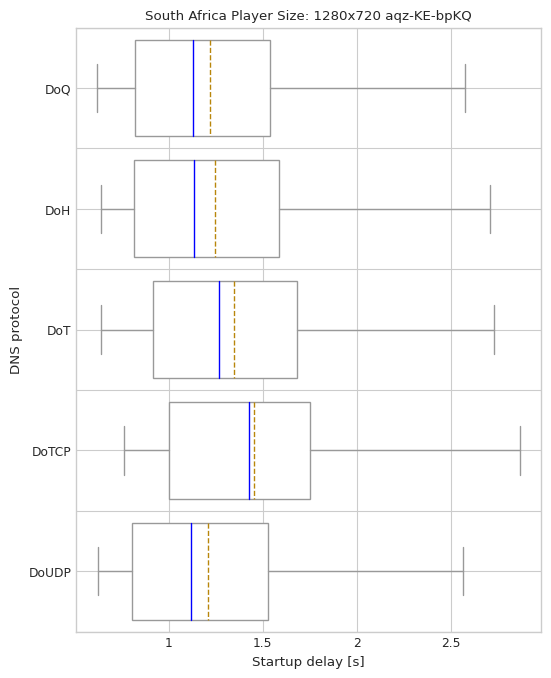

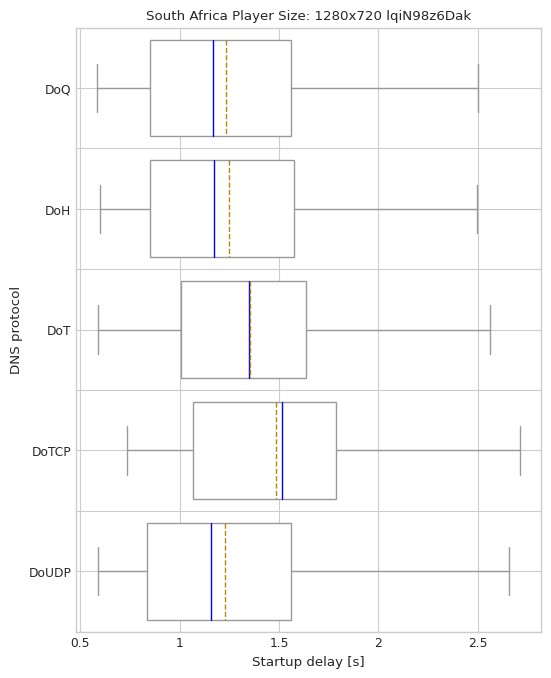

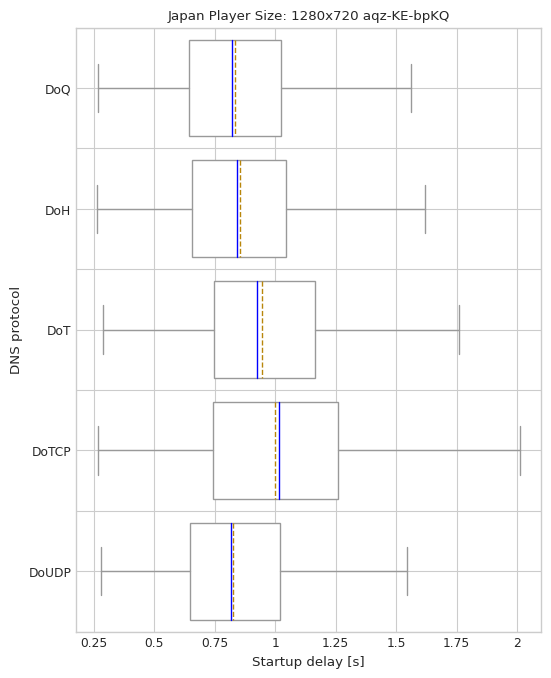

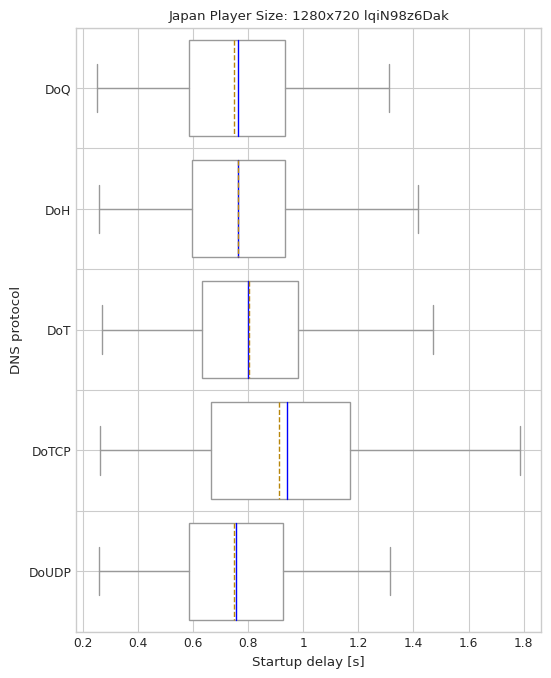

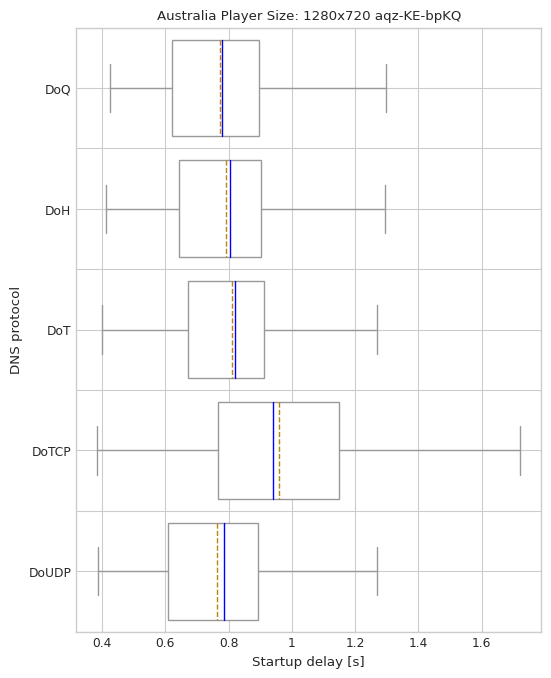

...

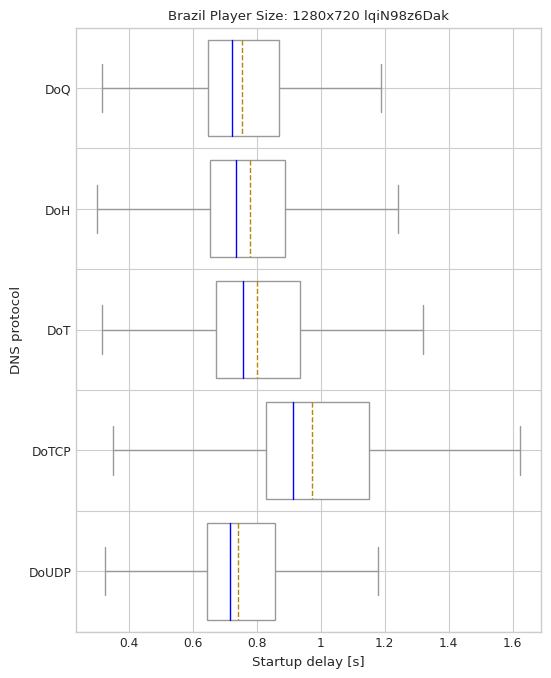

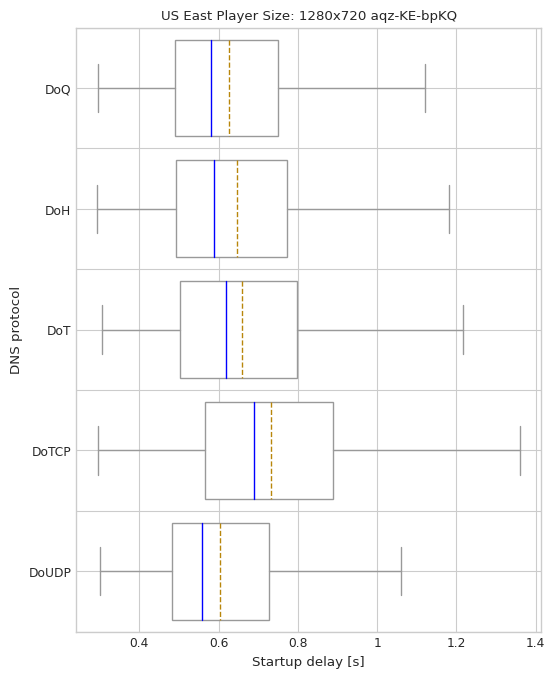

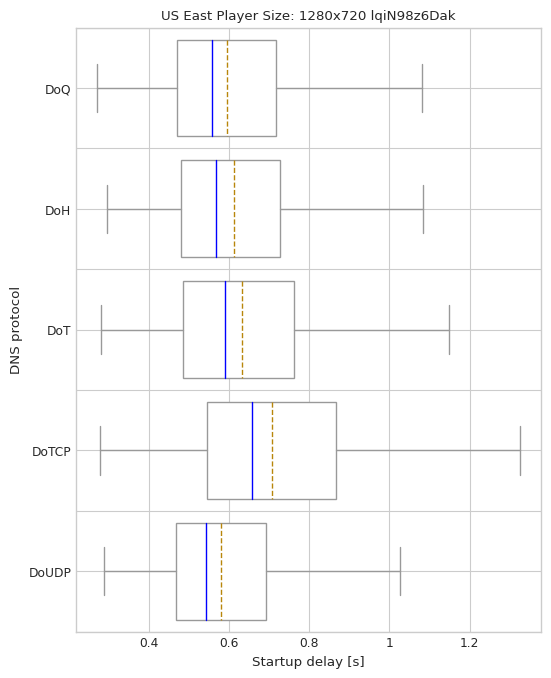

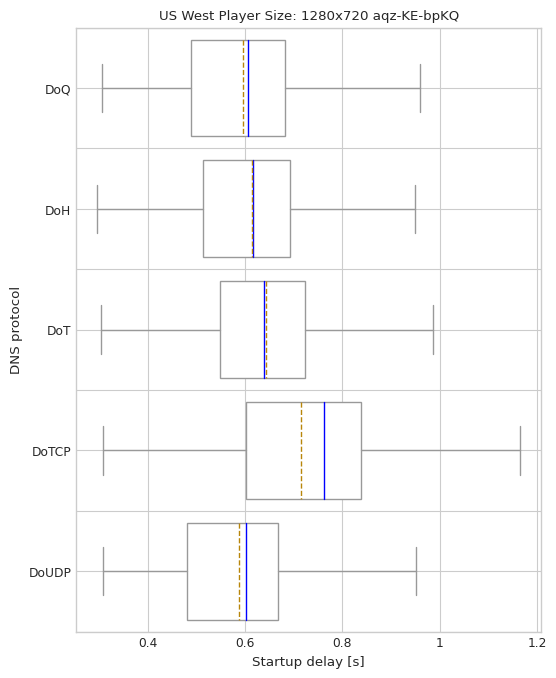

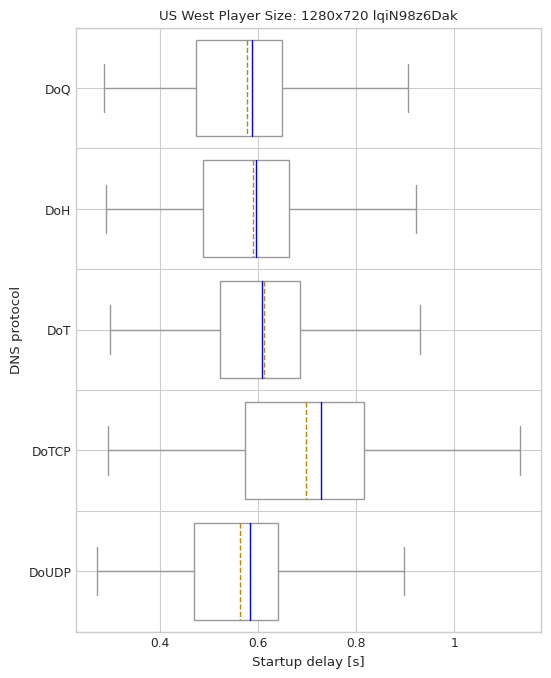

In [613]:
draw_boxplot(df_start_time, 'player_dimensions', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Player Size:', 'startup-delay-by-player-size-and-proto', [0,0], "DNS protocol", True)

Africa South


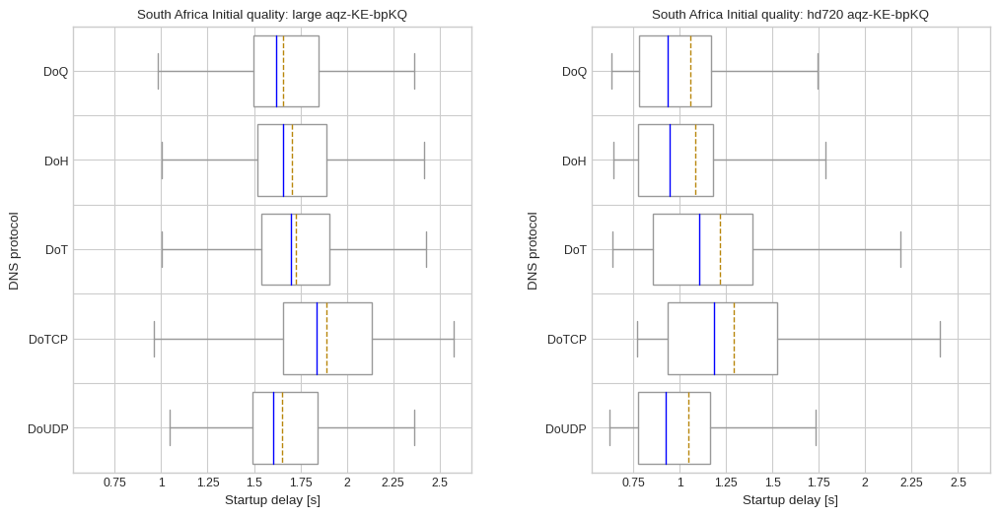

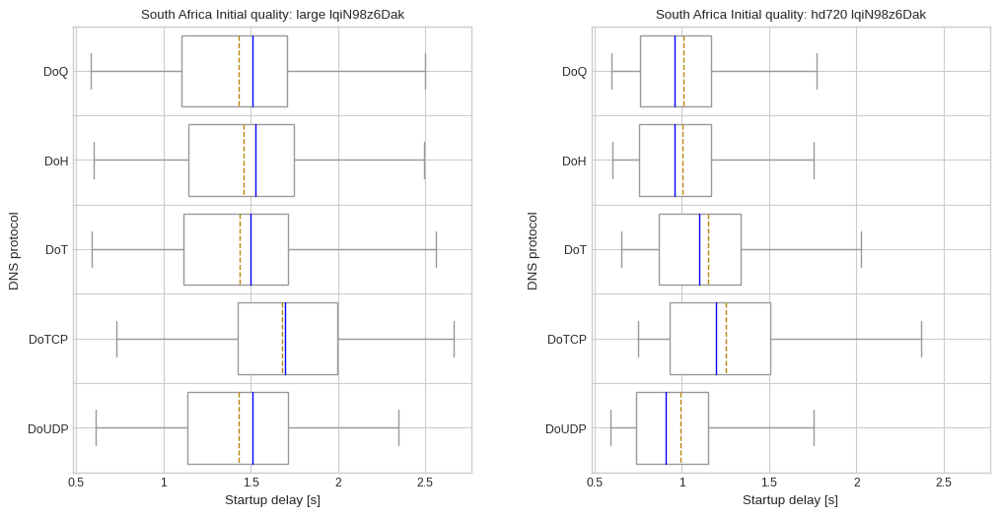

Asia Pacific Northeast


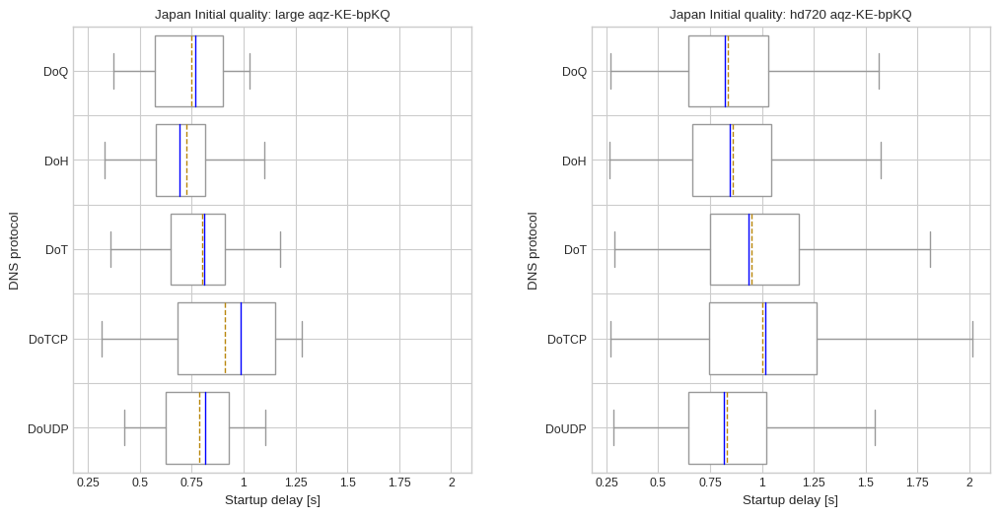

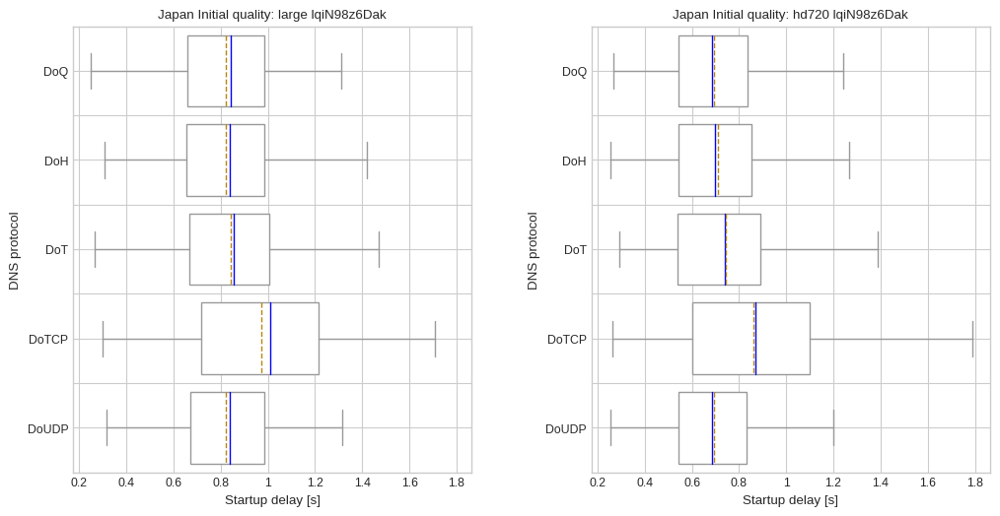

Asia Pacific Southeast


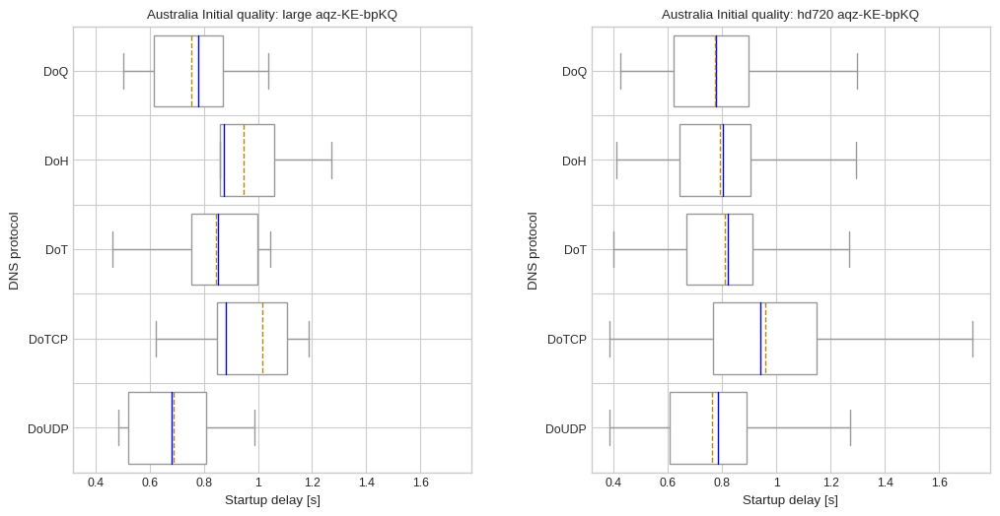

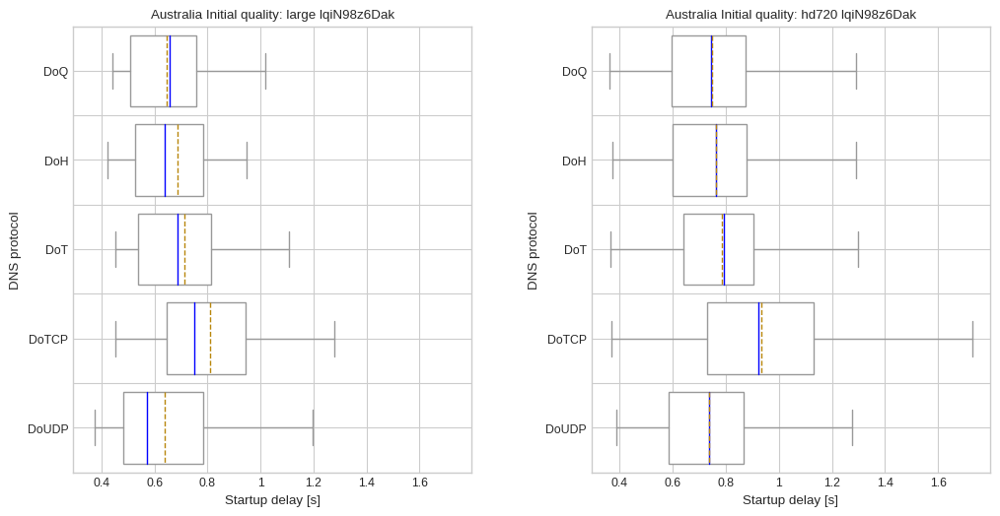

Europe Central


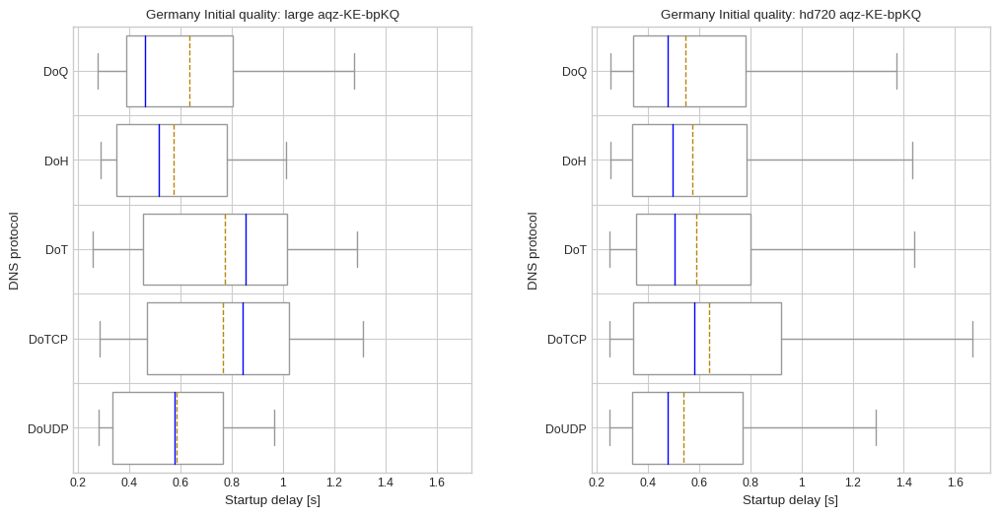

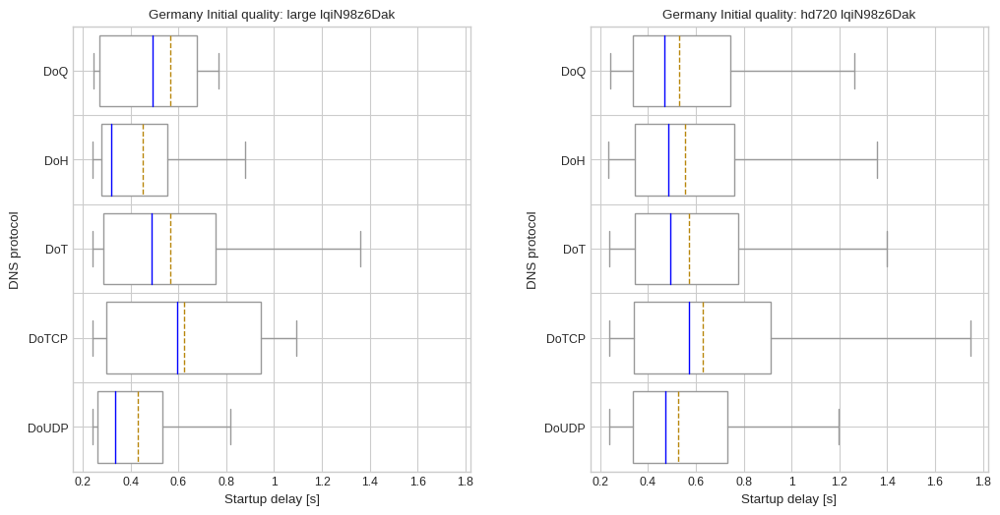

South America East


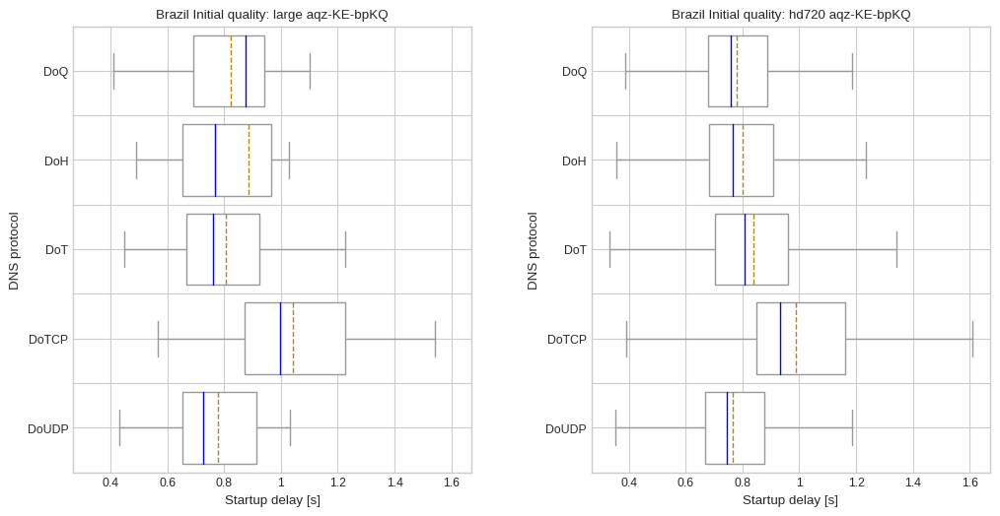

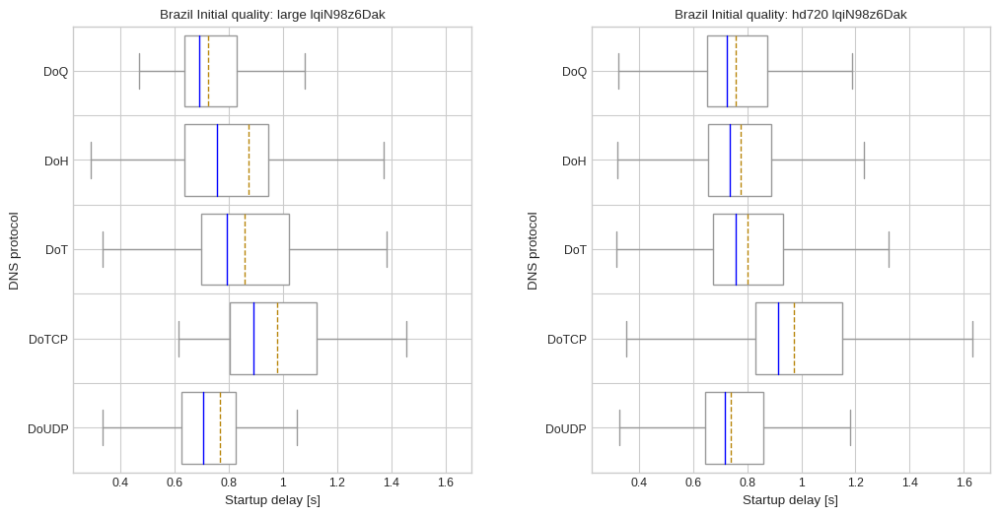

US East


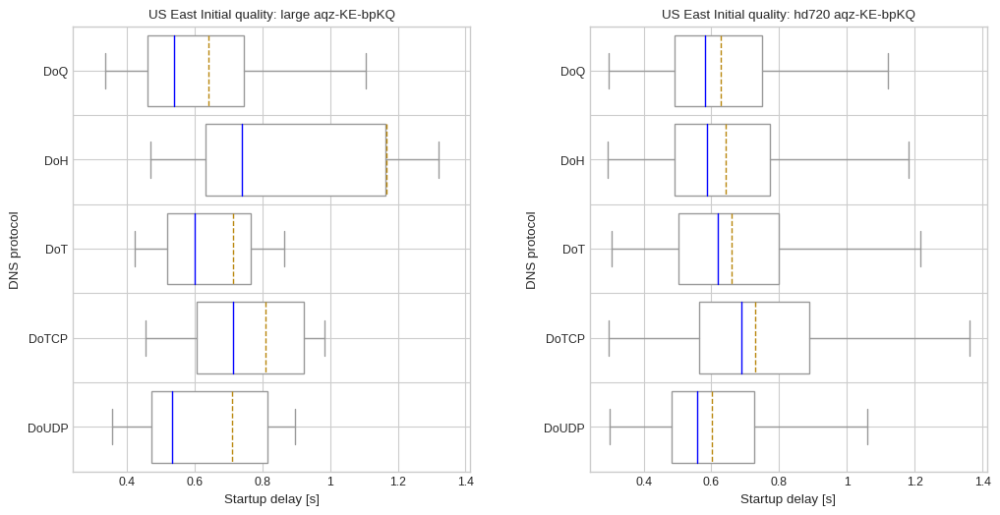

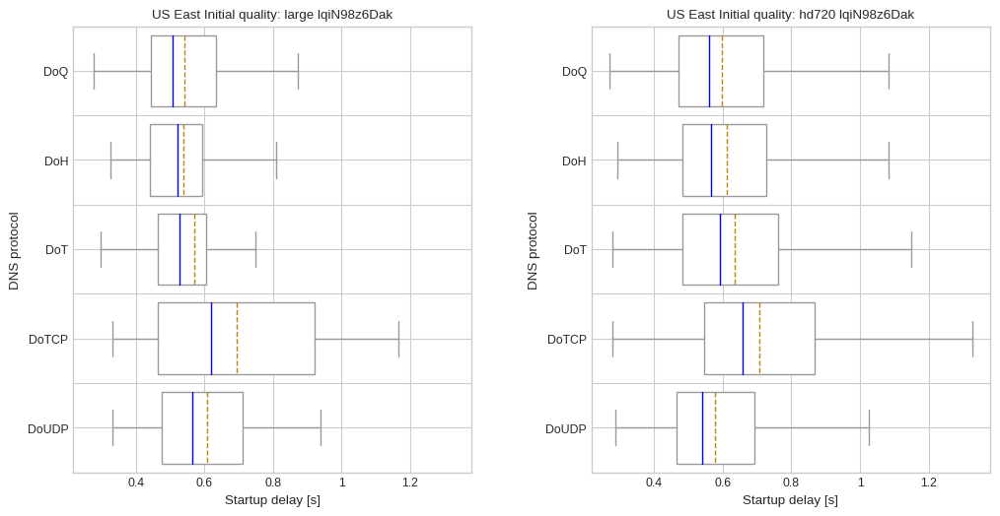

US West


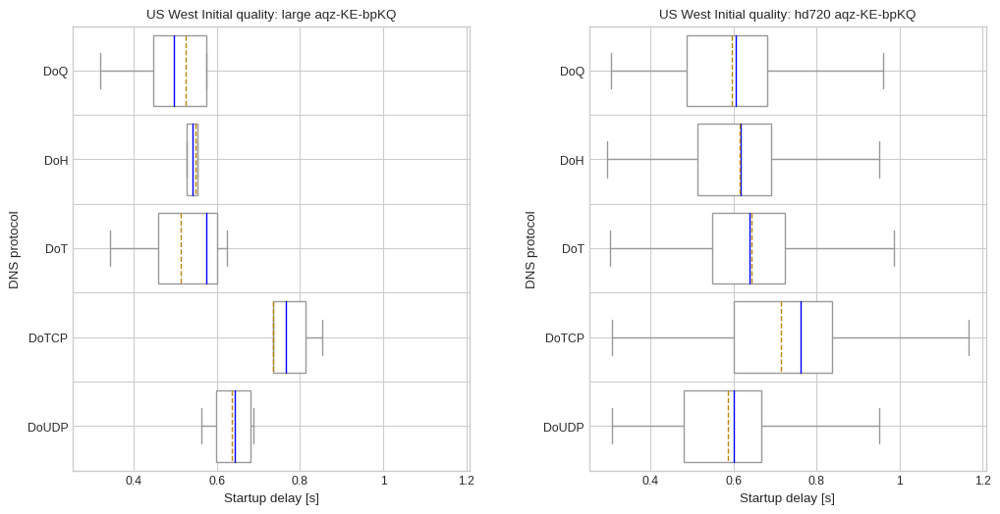

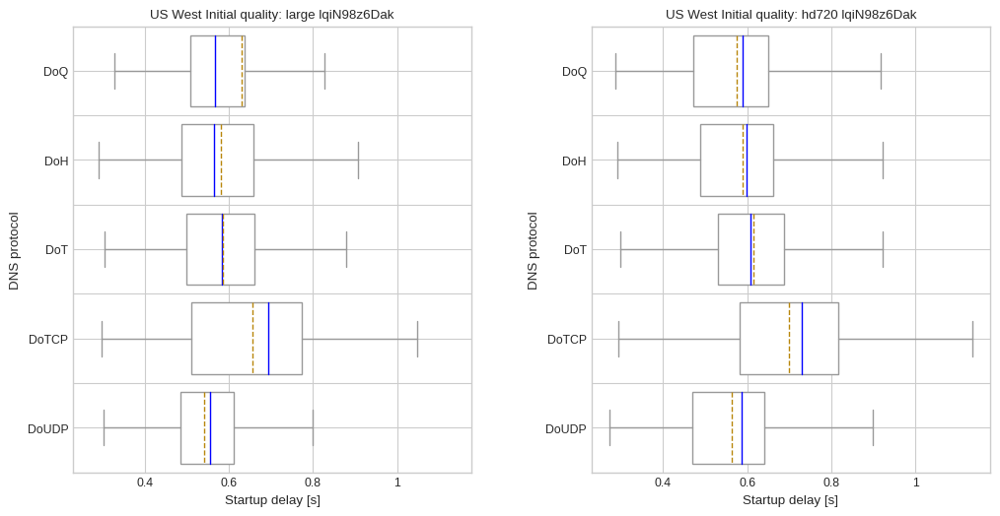

all vantage points


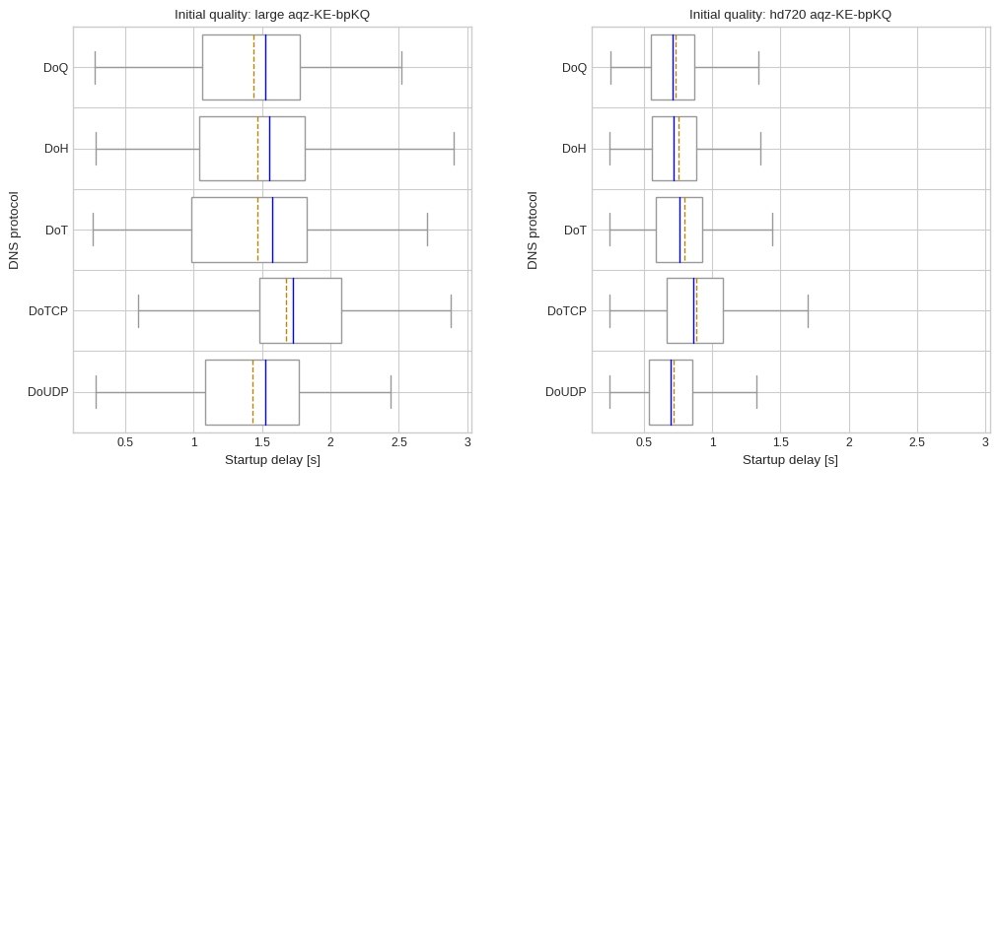

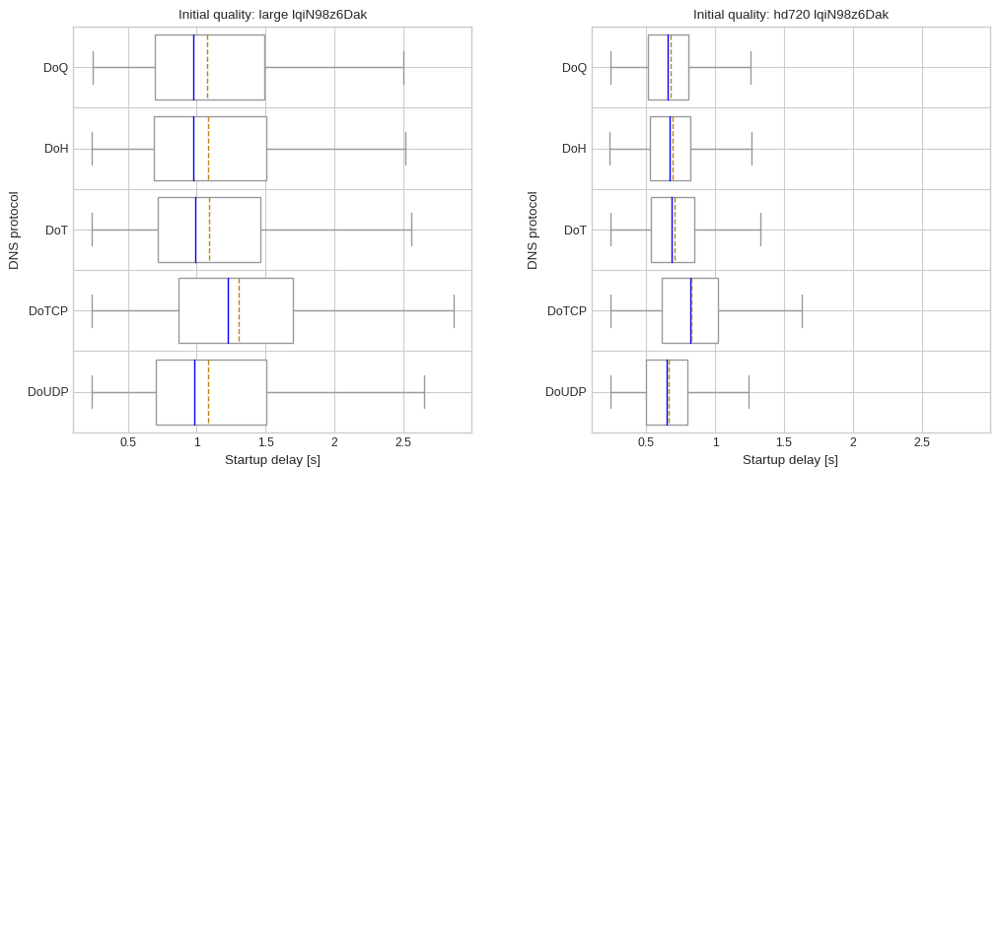

In [614]:
draw_boxplot_grid(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol", draw_all=True)

Africa South
Asia Pacific Northeast
Asia Pacific Southeast
Europe Central
South America East
US East


/tmp/ipykernel_8335/2497370415.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(6,8))


US West


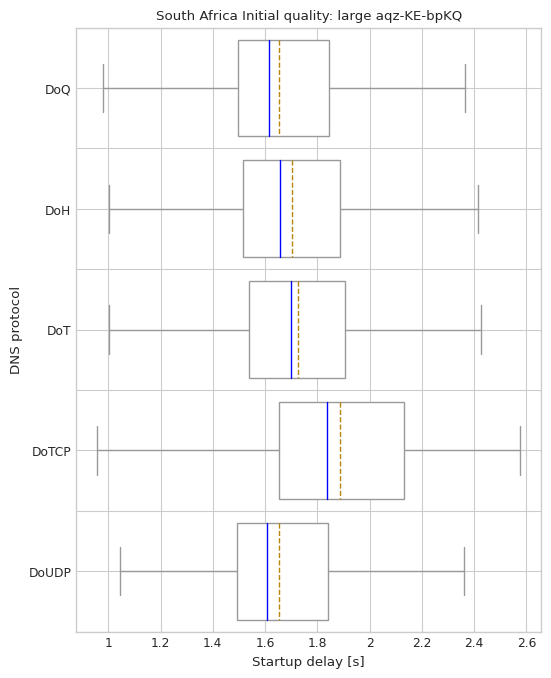

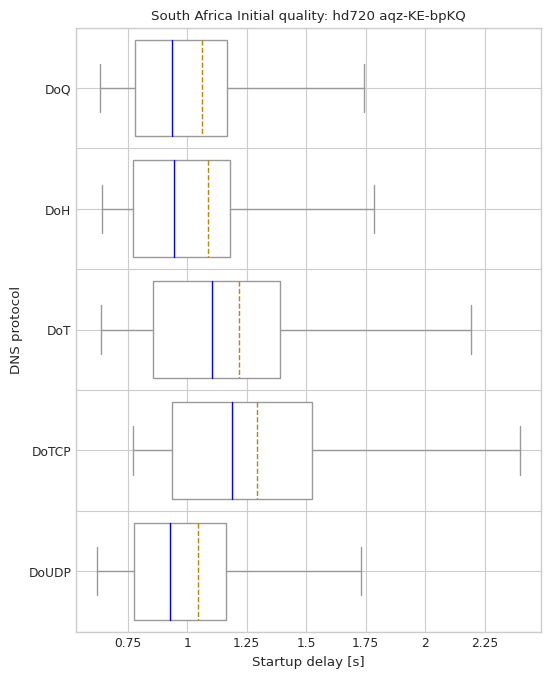

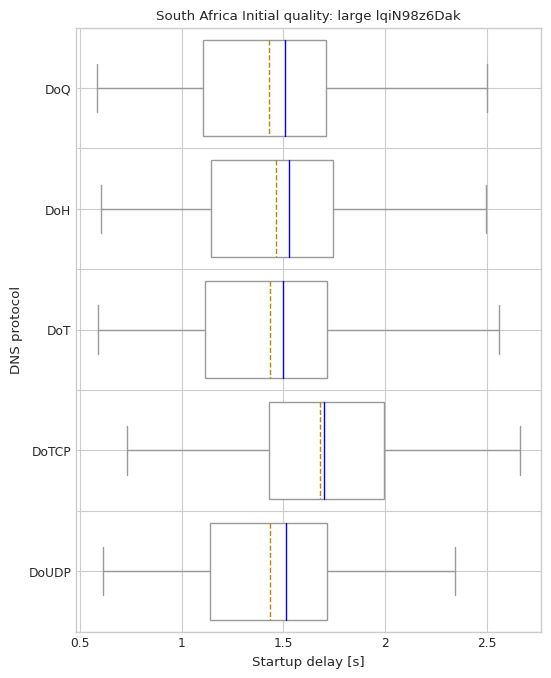

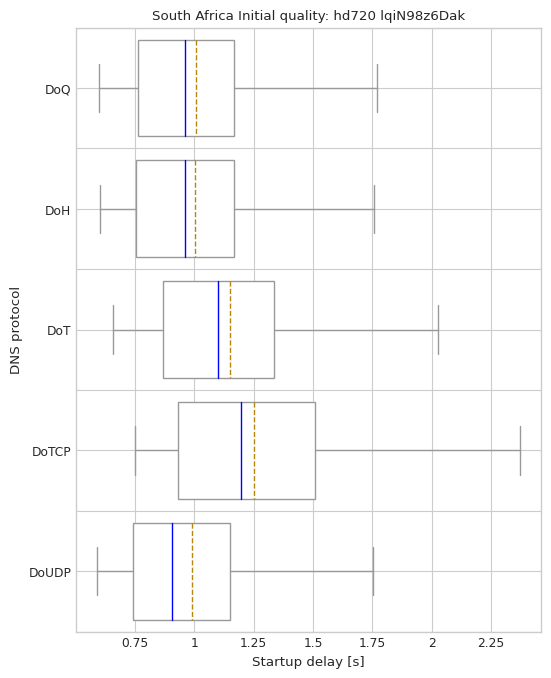

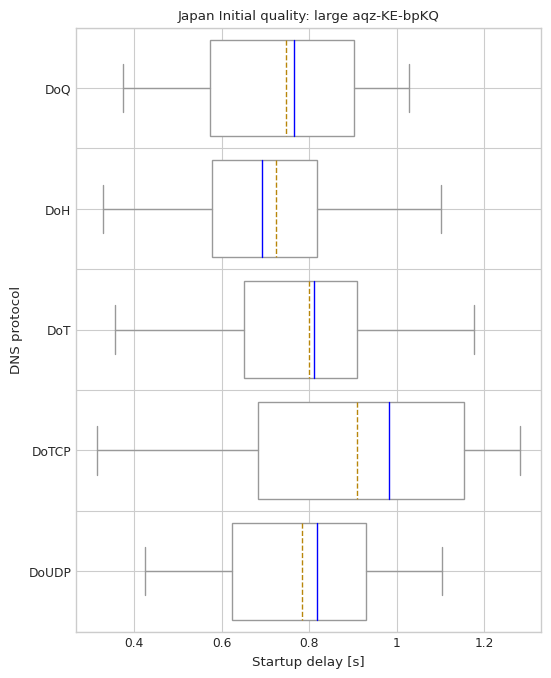

...

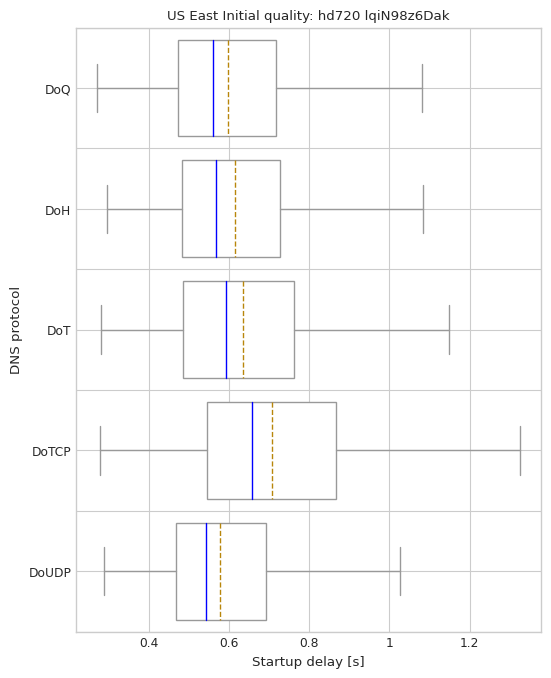

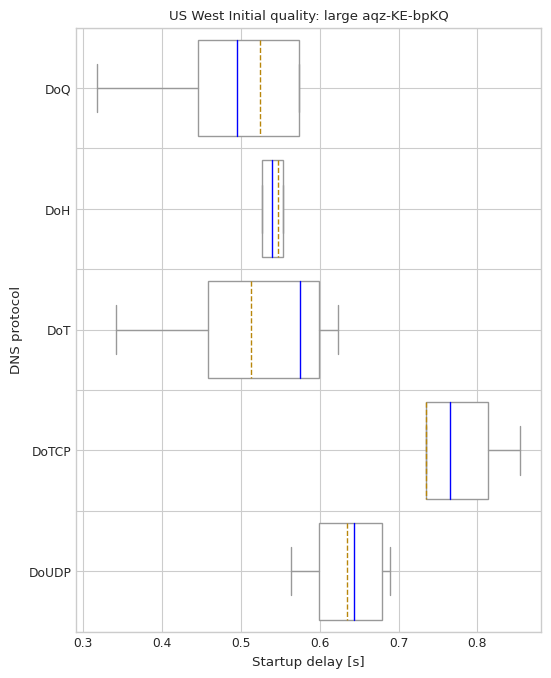

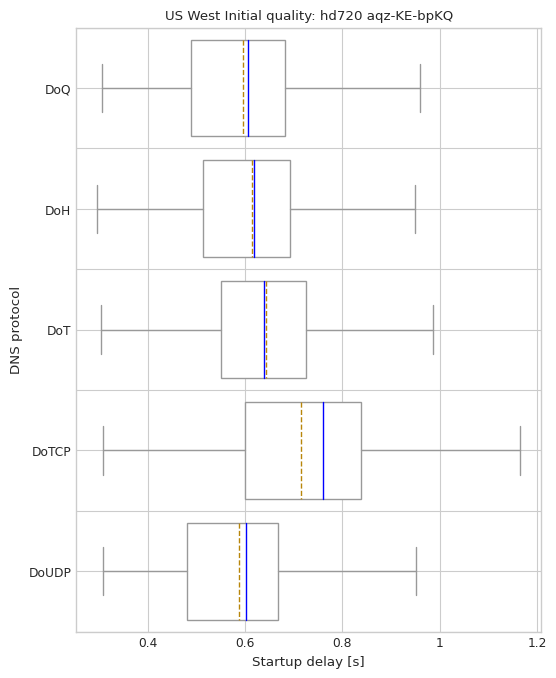

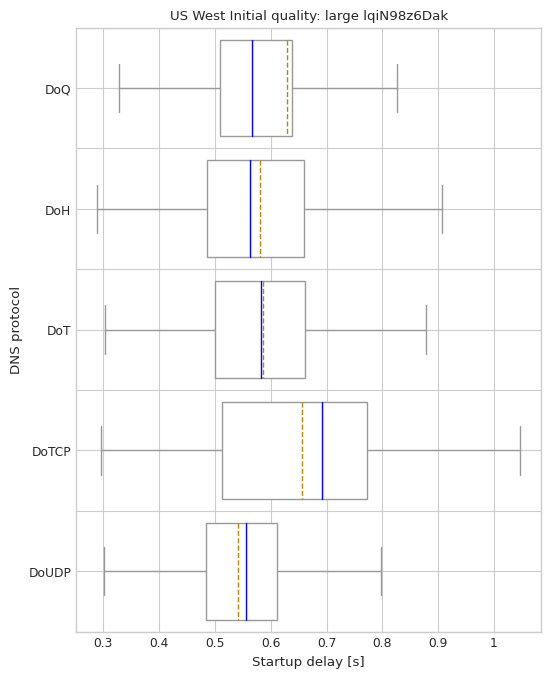

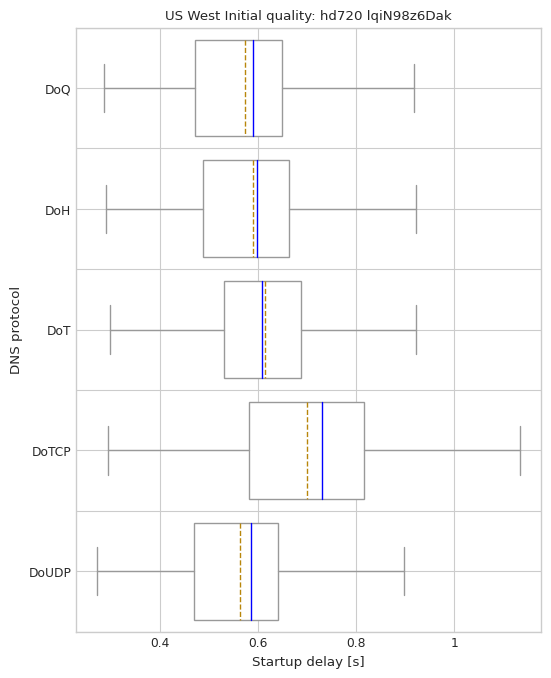

In [615]:
draw_boxplot(df_start_time, 'true_initial_quality', 'protocol', 'startup_delay', [False], 'Startup delay [s]', 'Initial quality:', 'startup-delay-by-initial-quality-and-proto', [0,0], "DNS protocol", True)


In [ ]:
#draw_boxplot_grid(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True, False], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol", draw_all=True)

In [ ]:
#draw_boxplot(df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay', [True], 'Delay to optimal quality change event [s]', 'Optimal quality:', 'optimal-quality-delay-by-optimal-quality-and-proto', [0,0], "DNS protocol")

## Lookup times

In [519]:
df_resolution_lookups = pd.read_sql_query("SELECT measurement_id as msm_id, elapsed, status, answer, domain as queried_domain FROM lookups", conn)

In [520]:
df_resolution_lookups = df_resolution_lookups[df_resolution_lookups.msm_id.isin(measurements.msm_id.unique())]

In [521]:
df_resolution_lookups.groupby('msm_id', as_index=False).size().sort_values('size')

,msm_id,size
68455,95b96e82-d7c0-85cb-2a8e-9d1324acd5f5,6
37072,512720ca-44db-d578-eaf6-be544d10e6b6,6
10702,1769a1b8-797d-6e27-69e2-c3fc00e2b73f,6
74676,a35ccca9-ea4c-7396-bcc2-93d214b7c957,6
104807,e5d8a0c4-1305-9470-0792-8aeb97fa57ad,6
...,...,...
94764,cf964e96-a50e-d930-398a-a6c4997452bc,18
102690,e124def6-be0e-19ab-9d8e-5d48de5f4b2a,18
96948,d4937175-6255-275a-8604-232c99769a76,18
81256,b1f1fc74-608a-4c74-b5c4-7361c2b147fc,18


In [522]:
df_resolution_lookups[(df_resolution_lookups.status == 'NOERROR')].queried_domain.value_counts()

www.youtube.com.                     118597
i.ytimg.com.                         118127
jnn-pa.googleapis.com.               116694
www.gstatic.com.                     116621
www.google.com.                      116597
                                      ...  
r2---sn-3u-bh2sy.googlevideo.com.         1
r3---sn-vgqsrnes.googlevideo.com.         1
r4---sn-ogul7n76.googlevideo.com.         1
r1---sn-npoe7nl6.googlevideo.com.         1
r5---sn-4g5lzned.googlevideo.com.         1
Name: queried_domain, Length: 2874, dtype: int64

In [523]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].queried_domain.value_counts()

Series([], Name: queried_domain, dtype: int64)

In [524]:
df_resolution_lookups.elapsed.describe()

count    1.162780e+06
mean     2.501338e+02
std      2.300579e+02
min      8.309880e-01
25%      1.258990e+02
50%      2.039255e+02
75%      3.148357e+02
max      2.616433e+04
Name: elapsed, dtype: float64

In [525]:
df_resolution_lookups = pd.merge(measurements[['msm_id', 'protocol', 'server', 'vantagePoint', 'domain', 'player_dimensions']], df_resolution_lookups, on='msm_id')

In [526]:
df_resolution_lookups = pd.merge(df_true_initial_quality[['msm_id', 'true_initial_quality']], df_resolution_lookups, on='msm_id')

In [527]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].groupby('server', as_index=False).agg({'queried_domain':pd.Series.unique})

,server,queried_domain


In [528]:
df_resolution_lookups[df_resolution_lookups.status != 'NOERROR'].groupby('msm_id', as_index=False).agg({'queried_domain':pd.Series.unique})

,msm_id,queried_domain


In [529]:
df_resolution_lookups[df_resolution_lookups.status == 'SERVFAIL']['answer'].tolist()

[]

In [530]:
df_resolution_lookups[df_resolution_lookups.status == 'SERVFAIL'].protocol.value_counts()

Series([], Name: protocol, dtype: int64)

In [531]:
df_googlevideo_lookup_time = df_resolution_lookups[(df_resolution_lookups.queried_domain.str.endswith('.googlevideo.com.')) & (df_resolution_lookups.true_initial_quality == 'hd720')].groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'elapsed':'median'}).reset_index().copy().dropna()
df_overall_lookup_time = df_resolution_lookups[(df_resolution_lookups.true_initial_quality == 'hd720')].groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'elapsed':'median'}).reset_index().copy().dropna()

In [532]:
df_googlevideo_lookup_time.rename(columns=lambda x: x.replace('elapsed', 'metric'), inplace=True)
df_googlevideo_lookup_time.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)
df_overall_lookup_time.rename(columns=lambda x: x.replace('elapsed', 'metric'), inplace=True)
df_overall_lookup_time.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)

In [533]:
df_googlevideo_lookup_time['protocol'] = pd.Categorical(df_googlevideo_lookup_time['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])
df_overall_lookup_time['protocol'] = pd.Categorical(df_overall_lookup_time['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

df_start_time, 'player_dimensions', 'protocol', 'startup_delay'

In [423]:
#startup_delay_medians = df_start_time[df_start_time.true_initial_quality.isin(['hd720', 'hd1080', 'hd1440', 'hd2160'])].groupby(['vantagePoint', 'domain', 'true_initial_quality', 'protocol']).agg({'startup_delay':'median'}).reset_index().copy().dropna()
#startup_delay_medians['true_initial_quality'] = startup_delay_medians['true_initial_quality'].map(map_quality_to_res)
#startup_delay_medians.rename(columns=lambda x: x.replace('startup_delay', 'metric'), inplace=True)
#startup_delay_medians.rename(columns=lambda x: x.replace('true_initial_quality', 'resolution'), inplace=True)

In [535]:
startup_delay_medians = df_start_time[(df_start_time.true_initial_quality == 'hd720')].groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'startup_delay':'median'}).reset_index().copy().dropna()
startup_delay_medians.rename(columns=lambda x: x.replace('startup_delay', 'metric'), inplace=True)
startup_delay_medians.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)

In [536]:
startup_delay_medians['protocol'] = pd.Categorical(startup_delay_medians['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

In [537]:
#make_quality_column_sortable(startup_delay_medians, 'true_initial_quality')

In [538]:
startup_delay_medians.sort_values(['domain', 'resolution', 'protocol'], inplace=True)

In [539]:
startup_delay_medians['metric'] = startup_delay_medians['metric'] * 1000

In [540]:
startup_delay_medians['resolution'].cat.remove_unused_categories(inplace=True)

/home/quic_net01/.pyenv/versions/3.8.12/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2630: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


df_player_quality_change_event_to_opt, 'optimal_res', 'protocol', 'optimal_quality_delay'

In [290]:
delay_to_opt_medians = df_player_quality_change_event_to_opt.groupby(['vantagePoint', 'domain', 'optimal_res', 'protocol']).agg({'optimal_quality_delay':'median'}).reset_index().copy().dropna()

In [291]:
#make_res_column_sortable(delay_to_opt_medians, 'optimal_res')

In [292]:
delay_to_opt_medians['protocol'] = pd.Categorical(delay_to_opt_medians['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

In [293]:
delay_to_opt_medians.sort_values(['domain', 'optimal_res', 'protocol'], inplace=True)

In [294]:
delay_to_opt_medians['optimal_quality_delay'] = delay_to_opt_medians['optimal_quality_delay'] * 1000

In [295]:
delay_to_opt_medians.rename(columns=lambda x: x.replace('optimal_quality_delay', 'metric'), inplace=True)
delay_to_opt_medians.rename(columns=lambda x: x.replace('optimal_res', 'resolution'), inplace=True)

In [436]:
#delay_to_opt_medians[(delay_to_opt_medians.vantagePoint == "") & (delay_to_opt_medians.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

In [437]:
#startup_delay_medians[(startup_delay_medians.vantagePoint == "") & (startup_delay_medians.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

In [438]:
#df_googlevideo_lookup_time[(df_googlevideo_lookup_time.vantagePoint == "") & (df_googlevideo_lookup_time.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

In [439]:
#df_overall_lookup_time[(df_overall_lookup_time.vantagePoint == "") & (df_overall_lookup_time.domain == 'aqz-KE-bpKQ')].pivot(index='resolution', columns='protocol', values='metric').style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

In [543]:
df_web_performance_metrics = pd.read_sql_query("SELECT msm_id, loadEventStart, firstContentfulPaint FROM web_performance_metrics", conn)


In [646]:
df_web_performance_metrics_plt = df_web_performance_metrics[df_web_performance_metrics.msm_id.isin(measurements.msm_id.unique())].copy()
df_web_performance_metrics_plt = pd.merge(measurements[['msm_id', 'protocol', 'server', 'vantagePoint', 'domain', 'player_dimensions']], df_web_performance_metrics_plt, on='msm_id')
df_web_performance_metrics_plt = pd.merge(df_true_initial_quality[['msm_id', 'true_initial_quality']], df_web_performance_metrics_plt, on='msm_id')
df_web_performance_metrics_median = df_web_performance_metrics_plt[(df_web_performance_metrics_plt.true_initial_quality == 'hd720')].groupby(['vantagePoint', 'domain', 'player_dimensions', 'protocol']).agg({'loadEventStart':'median'}).reset_index().copy().dropna()
df_web_performance_metrics_median.rename(columns=lambda x: x.replace('loadEventStart', 'metric'), inplace=True)
df_web_performance_metrics_median.rename(columns=lambda x: x.replace('player_dimensions', 'resolution'), inplace=True)
df_web_performance_metrics_median['protocol'] = pd.Categorical(df_web_performance_metrics_median['protocol'], ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP'])

Africa South


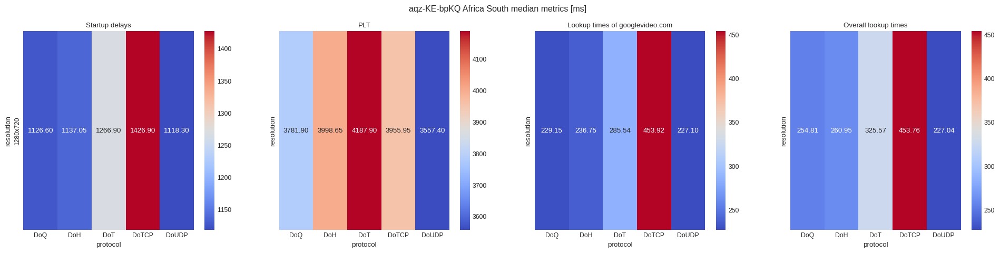

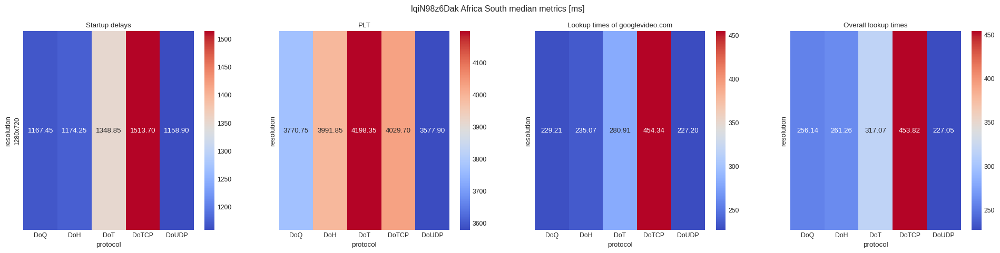

Asia Pacific Northeast


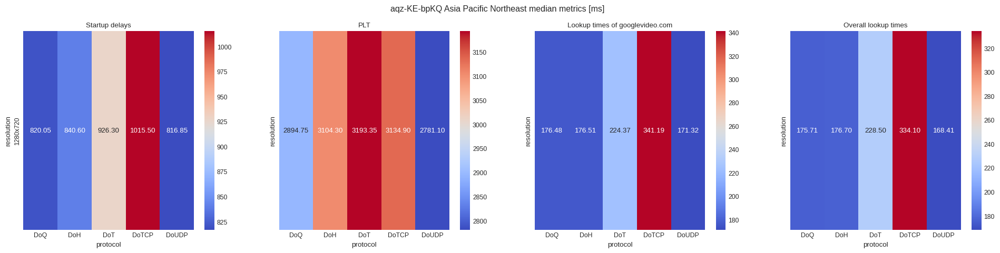

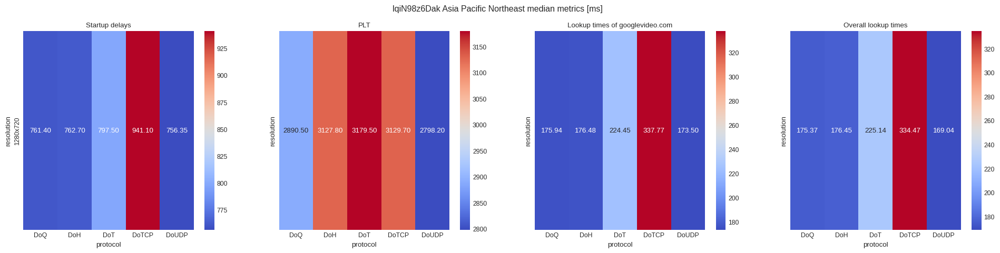

Asia Pacific Southeast


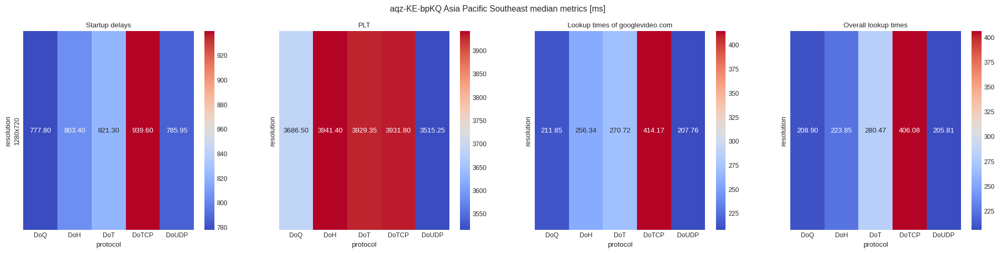

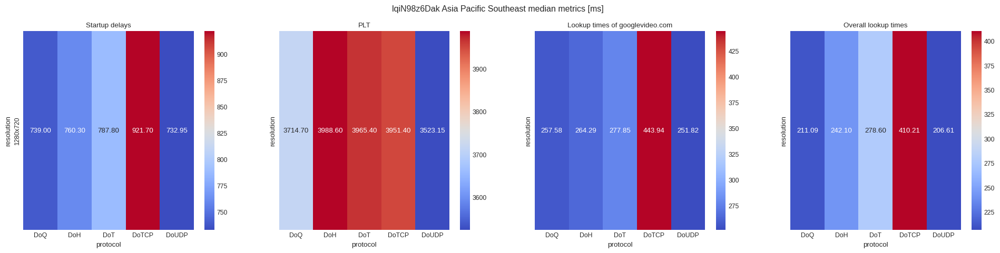

Europe Central


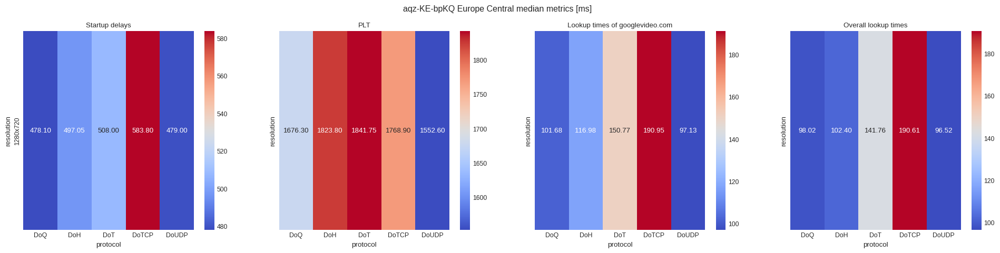

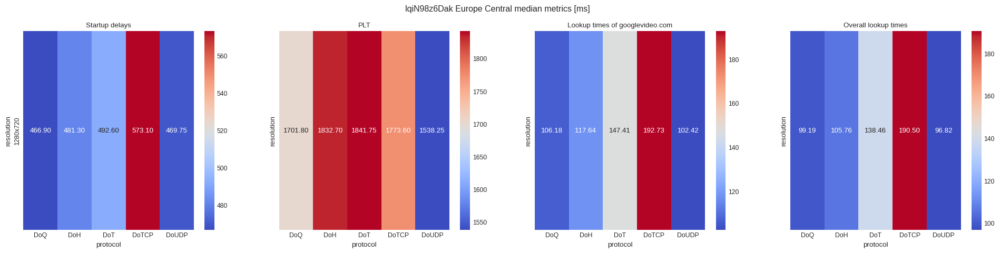

South America East


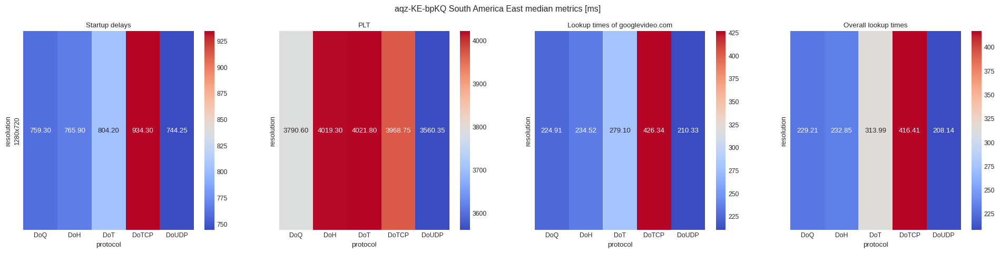

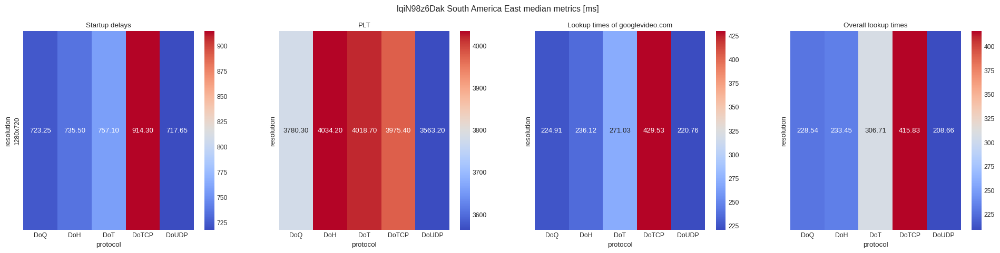

US East


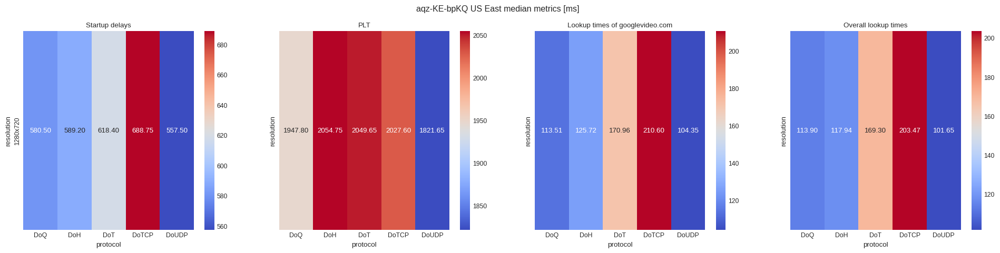

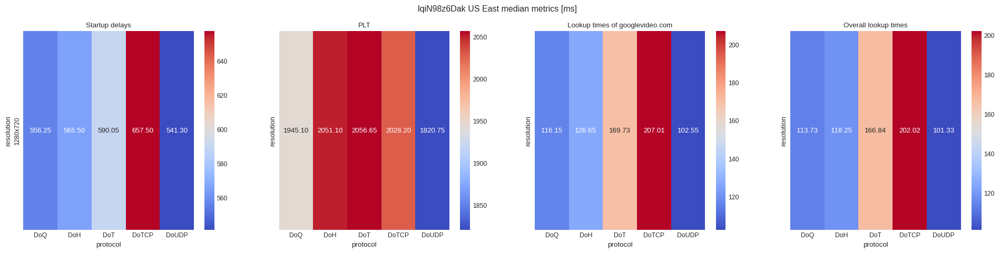

US West


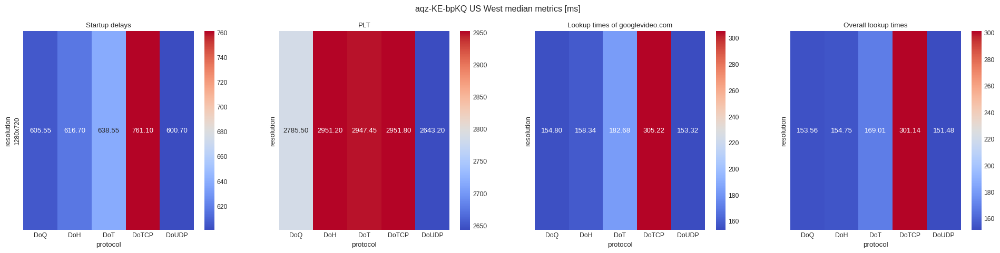

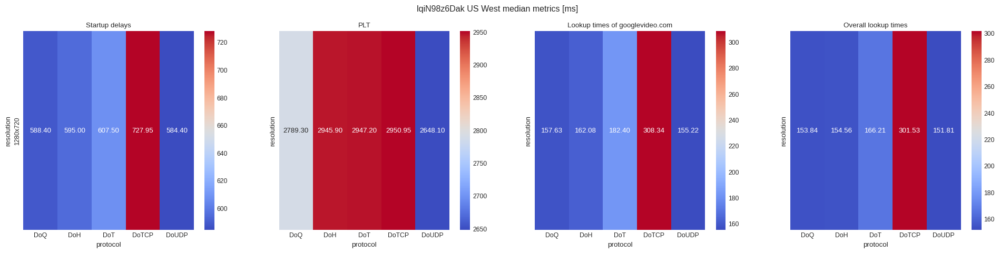

In [304]:
with plt.style.context('seaborn-whitegrid'):
    for vp in sorted(measurements['vantagePoint'].unique().tolist()):
        print(vp)
        for video in measurements['domain'].unique():
            fig, axs = plt.subplots(1, 4, sharex='all', figsize=(24,5), sharey='all')
            #fig.subplots_adjust(hspace=.2, wspace=.3)
            fig.suptitle(video+' '+vp+' median metrics [ms]')
            df_tmp_1 = startup_delay_medians[(startup_delay_medians.vantagePoint == vp) & (startup_delay_medians.domain == video)]
            #df_tmp_2 = delay_to_opt_medians[(delay_to_opt_medians.vantagePoint == vp) & (delay_to_opt_medians.domain == video)]
            df_tmp_2 = df_web_performance_metrics_median[(df_web_performance_metrics_median.vantagePoint == vp) & (df_web_performance_metrics_median.domain == video)]
            df_tmp_3 = df_googlevideo_lookup_time[(df_googlevideo_lookup_time.vantagePoint == vp) & (df_googlevideo_lookup_time.domain == video)]
            df_tmp_4 = df_overall_lookup_time[(df_overall_lookup_time.vantagePoint == vp) & (df_overall_lookup_time.domain == video)]

            for df, ax, title in zip(
                [df_tmp_1, df_tmp_2, df_tmp_3, df_tmp_4],
                axs.flat, ['Startup delays', 'PLT', 'Lookup times of googlevideo.com', 'Overall lookup times']):
                sns.heatmap(df.pivot(index='resolution', columns='protocol', values='metric'), ax=ax, cmap="coolwarm", annot=True, fmt='.2f')
                ax.set_title(title)

            plt.show()

In [417]:
measurements['vantagePoint'].unique().tolist()

['Africa South',
 'Asia Pacific Northeast',
 'Asia Pacific Southeast',
 'Europe Central',
 'South America East',
 'US East',
 'US West']

In [550]:
df.pivot(index='resolution', columns='protocol', values='metric')

protocol,DoQ,DoH,DoT,DoTCP,DoUDP
resolution,,,,,
1280x720,153.959634,154.619297,166.850947,302.044776,151.945325


In [558]:
df[['protocol', 'metric']].set_index('protocol').T.reset_index().drop('index', axis=1)

protocol,DoH,DoQ,DoT,DoTCP,DoUDP
0,154.619297,153.959634,166.850947,302.044776,151.945325


Africa South
Asia Pacific Northeast
Asia Pacific Southeast
Europe Central
South America East
US East
US West


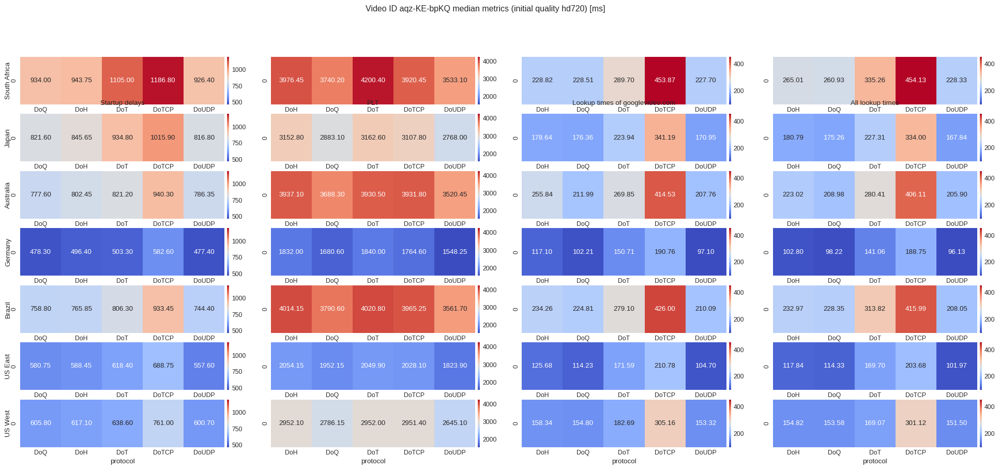

Africa South
Asia Pacific Northeast
Asia Pacific Southeast
Europe Central
South America East
US East
US West


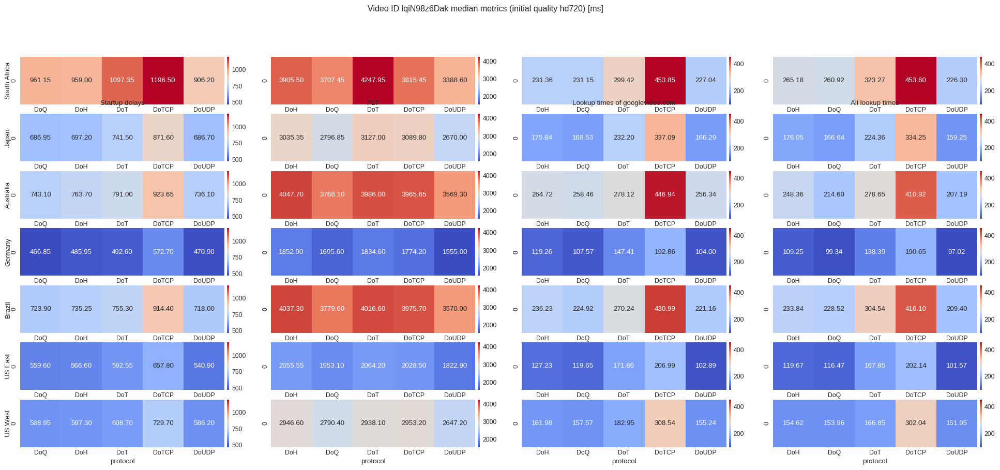

In [569]:
vp_map_to_normal_names = {'Africa South': 'South Africa', 'Asia Pacific Northeast': 'Japan', 'Asia Pacific Southeast': 'Australia',
                         'Europe Central': 'Germany', 'US East':'US East', 'US West':'US West', 'South America East': 'Brazil'}
with plt.style.context('seaborn-whitegrid'):
    for video in measurements['domain'].unique():
        fig, axs_all = plt.subplots(measurements['vantagePoint'].nunique(), 4, figsize=(24,10))#, sharey='all', sharex='all')
        fig.suptitle('Video ID '+video+' median metrics (initial quality hd720) [ms]')
        for vp_idx in range(measurements['vantagePoint'].nunique()):
            vp = sorted(measurements['vantagePoint'].unique().tolist())[vp_idx]
            axs = axs_all[vp_idx]
            print(vp)
            #fig, axs = plt.subplots(1, 4, sharex='all', figsize=(24,5), sharey='all')
            #fig.subplots_adjust(hspace=.2, wspace=.3)
            #fig.suptitle(video+' '+vp+' median metrics [ms]')
            df_tmp_1 = startup_delay_medians[(startup_delay_medians.vantagePoint == vp) & (startup_delay_medians.domain == video)]
            #df_tmp_2 = delay_to_opt_medians[(delay_to_opt_medians.vantagePoint == vp) & (delay_to_opt_medians.domain == video)]
            df_tmp_2 = df_web_performance_metrics_median[(df_web_performance_metrics_median.vantagePoint == vp) & (df_web_performance_metrics_median.domain == video)]
            df_tmp_3 = df_googlevideo_lookup_time[(df_googlevideo_lookup_time.vantagePoint == vp) & (df_googlevideo_lookup_time.domain == video)]
            df_tmp_4 = df_overall_lookup_time[(df_overall_lookup_time.vantagePoint == vp) & (df_overall_lookup_time.domain == video)]

            for df, ax, title, idx in zip(
                [df_tmp_1, df_tmp_2, df_tmp_3, df_tmp_4],
                axs, ['Startup delays', 'PLT', 'Lookup times of googlevideo.com', 'All lookup times'], range(4)):
                #if vp_idx == 0:
                divider = make_axes_locatable(ax)
                cax = divider.append_axes("right", size="1%", pad=0.05)
                if title == 'Startup delays':
                    vmax = startup_delay_medians.metric.max()
                    vmin = startup_delay_medians.metric.min()
                elif title == 'PLT':
                    vmax = df_web_performance_metrics_median.metric.max()
                    vmin = df_web_performance_metrics_median.metric.min()
                elif title == 'Lookup times of googlevideo.com':
                    vmax = df_googlevideo_lookup_time.metric.max()
                    vmin = df_googlevideo_lookup_time.metric.min()
                elif title == 'All lookup times':
                    vmax = df_overall_lookup_time.metric.max()
                    vmin = df_overall_lookup_time.metric.min()
                #sns.heatmap(df.pivot(index='resolution', columns='protocol', values='metric'), ax=ax, cbar_ax=cax, cmap="coolwarm", annot=True, fmt='.2f', vmax=vmax, vmin=vmin)
                sns_plt = sns.heatmap(df[['protocol', 'metric']].set_index('protocol').T.reset_index().drop('index', axis=1), ax=ax, cbar_ax=cax, cmap="coolwarm", annot=True, fmt='.2f', vmax=vmax, vmin=vmin)
                sns_plt.set_ylabel('', labelpad=0)
                if idx == 0:
                    ax.set_ylabel(vp_map_to_normal_names[vp])
                else:
                    ax.set_ylabel('')
                if vp_idx == 0:
                    ax.set_title(title, y=-0.1)
        fig.savefig('figures/heatmap-overview-over-different-metric-medians-'+video+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [620]:
df_resolution_lookups[(df_resolution_lookups.true_initial_quality == 'hd720')].groupby(['vantagePoint']).agg({'elapsed':'median'}).sort_values('elapsed', ascending=False).index.to_list()

['Africa South',
 'South America East',
 'Asia Pacific Southeast',
 'Asia Pacific Northeast',
 'US West',
 'US East',
 'Europe Central']

In [648]:
df_web_performance_metrics_plt[(df_web_performance_metrics_plt.true_initial_quality == 'hd720')].groupby(['vantagePoint']).agg({'loadEventStart':'median'}).sort_values('loadEventStart', ascending=False).index.to_list()

['Africa South',
 'South America East',
 'Asia Pacific Southeast',
 'Asia Pacific Northeast',
 'US West',
 'US East',
 'Europe Central']

In [592]:
cross_protocl_median_startup_delay_vp_order = df_start_time[(df_start_time.true_initial_quality == 'hd720')].groupby(['vantagePoint']).agg({'startup_delay':'median'}).sort_values('startup_delay', ascending=False).index.to_list()
cross_protocl_median_startup_delay_vp_order = [vp_map_to_normal_names[vp] for vp in cross_protocl_median_startup_delay_vp_order]

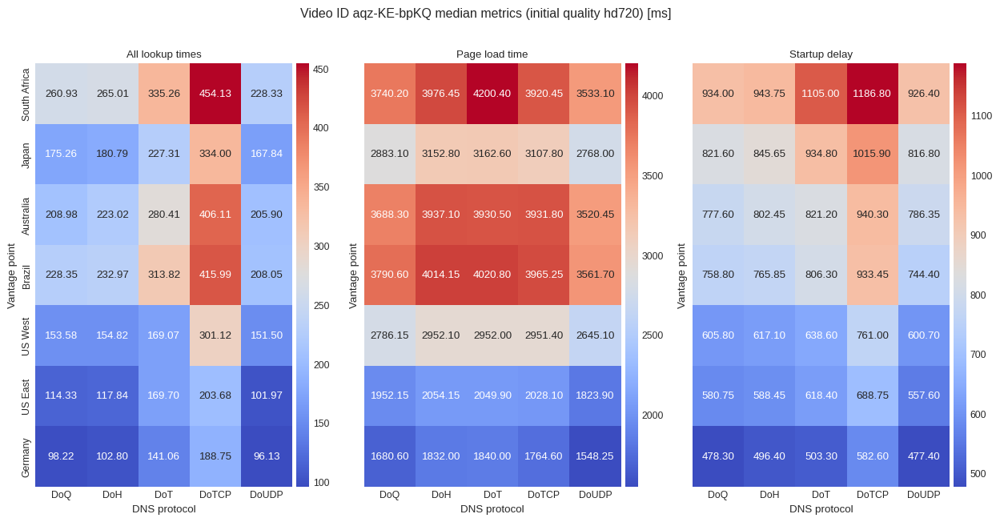

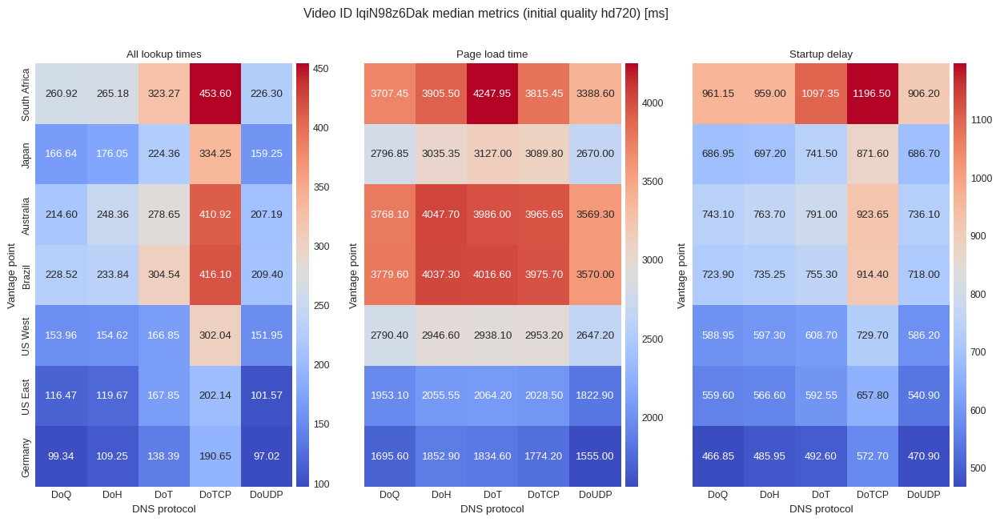

In [643]:
with plt.style.context('seaborn-whitegrid'):
    for video in measurements['domain'].unique():
        fig, axs = plt.subplots(1, 3, figsize=(15,7), sharey='all')
        fig.suptitle('Video ID '+video+' median metrics (initial quality hd720) [ms]')
        df_tmp_3 = startup_delay_medians[(startup_delay_medians.domain == video)].copy()
        df_tmp_2 = df_web_performance_metrics_median[(df_web_performance_metrics_median.domain == video)].copy()
        df_tmp_1 = df_overall_lookup_time[(df_overall_lookup_time.domain == video)].copy()
        
        df_tmp_1['vantagePoint'] = df_tmp_1['vantagePoint'].map(vp_map_to_normal_names)
        df_tmp_2['vantagePoint'] = df_tmp_2['vantagePoint'].map(vp_map_to_normal_names)
        df_tmp_3['vantagePoint'] = df_tmp_3['vantagePoint'].map(vp_map_to_normal_names)
        
        for idx in range(3):
            if idx == 0:
                df_tmp = df_tmp_1.pivot(index='vantagePoint', columns='protocol', values='metric').reindex(cross_protocl_median_startup_delay_vp_order)
                title_str = 'All lookup times'
                vmax = df_tmp_1.metric.max()
                vmin = df_tmp_1.metric.min()
            if idx == 1:
                df_tmp = df_tmp_2.pivot(index='vantagePoint', columns='protocol', values='metric').reindex(cross_protocl_median_startup_delay_vp_order)
                title_str = 'Page load time'
                vmax = df_tmp_2.metric.max()
                vmin = df_tmp_2.metric.min()
            if idx == 2:
                df_tmp = df_tmp_3.pivot(index='vantagePoint', columns='protocol', values='metric').reindex(cross_protocl_median_startup_delay_vp_order)
                title_str = 'Startup delay'
                vmax = df_tmp_3.metric.max()
                vmin = df_tmp_3.metric.min()
            ax = axs[idx]
            divider = make_axes_locatable(ax)
            cax = divider.append_axes("right", size="5%", pad=0.05)
            
            sns.heatmap(df_tmp, ax=ax, cbar_ax=cax, cmap="coolwarm", annot=True, fmt='.2f', vmax=vmax, vmin=vmin)
            
            ax.set_title(title_str)#, y=1.0, pad=-30)
            ax.set_ylabel('Vantage point')
            ax.set_xlabel('DNS protocol')
            

        fig.savefig('figures/heatmap-overview-over-different-metric-medians-'+video+'.pdf', format='pdf', bbox_inches='tight')
        plt.show()

In [325]:
#dbs = ['web-performance-youtube-afsouth.db', 'web-performance-youtube-apnorth.db', 'web-performance-youtube-apsouth.db', 'web-performance-youtube-eucentral.db', 'web-performance-youtube-saeast.db', 'web-performance-youtube-useast.db', 'web-performance-youtube-uswest.db']


#for db in dbs:
#    vp_conn = sqlite3.connect("dataset/"+db)
#    pd.read_sql_query("SELECT * from web_performance_metrics", vp_conn).to_sql(name='web_performance_metrics', con=conn, if_exists='append', index=False)
#    vp_conn.close()


#pd.read_sql_query("SELECT * FROM web_performance_metrics", conn)

In [316]:
df_web_performance_metrics = pd.merge(df_web_performance_metrics, measurements, on='msm_id')
df_web_performance_metrics

,msm_id,loadEventStart,firstContentfulPaint,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions
0,17915357-f2e4-81b4-acf7-b71255703ed8,7585.000000,0.0,1650240030862687634,1.650240e+12,1.650240e+12,DoT,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:15.296301,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
1,8297db7d-70e2-96ab-3824-ef58929e52d6,7621.100000,0.0,1650240061086062376,1.650240e+12,1.650240e+12,DoH,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:45.492315,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
2,fb06c88b-3fed-edba-5b29-27e4972a583a,7210.700001,0.0,1650240090999008606,1.650240e+12,1.650240e+12,DoQ,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:15.785073,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
3,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,7907.500000,0.0,1650240121703082035,1.650240e+12,1.650240e+12,DoTCP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:45.926083,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
4,d94c98d2-b7ae-30cf-1b77-0d03406c2669,6790.100000,0.0,1650240150290185710,1.650240e+12,1.650240e+12,DoUDP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:02:15.537097,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116616,08a2d00a-8951-9748-8dc7-ee34bdbf8923,2644.400001,0.0,1650815738212318454,1.650816e+12,1.650816e+12,DoT,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:55:27.652604,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
116617,4b735559-a6d4-b2cc-f612-cf9dca1c613d,2680.800000,0.0,1650815758657742448,1.650816e+12,1.650816e+12,DoH,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:55:48.020216,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
116618,4d828157-98c1-20e7-ac56-0015c06a69c0,2476.300000,0.0,1650815779022777603,1.650816e+12,1.650816e+12,DoQ,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:08.580162,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
116619,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,2610.200001,0.0,1650815799376591574,1.650816e+12,1.650816e+12,DoTCP,168.138.50.5,lqiN98z6Dak,US West,2022-04-24 15:56:28.753468,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720


In [317]:
# normalize data
normalized_df = pd.DataFrame()
for vp in df_web_performance_metrics.vantagePoint.unique():
    df_vp = df_web_performance_metrics[df_web_performance_metrics['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_domain['loadEventStart']=(df_domain['loadEventStart']-df_domain['loadEventStart'].mean())/df_domain['loadEventStart'].std()
            normalized_df = pd.concat([normalized_df, df_domain])
normalized_df

,msm_id,loadEventStart,firstContentfulPaint,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions
0,17915357-f2e4-81b4-acf7-b71255703ed8,-0.221208,0.0,1650240030862687634,1.650240e+12,1.650240e+12,DoT,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:15.296301,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
1,8297db7d-70e2-96ab-3824-ef58929e52d6,-0.161909,0.0,1650240061086062376,1.650240e+12,1.650240e+12,DoH,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:45.492315,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
2,fb06c88b-3fed-edba-5b29-27e4972a583a,-0.836051,0.0,1650240090999008606,1.650240e+12,1.650240e+12,DoQ,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:15.785073,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
3,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,0.308546,0.0,1650240121703082035,1.650240e+12,1.650240e+12,DoTCP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:45.926083,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
4,d94c98d2-b7ae-30cf-1b77-0d03406c2669,-1.526949,0.0,1650240150290185710,1.650240e+12,1.650240e+12,DoUDP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:02:15.537097,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115969,352f7942-fab8-23a5-a486-19c6908e8de6,0.481406,0.0,1650801572113123068,1.650802e+12,1.650802e+12,DoT,103.172.17.226,lqiN98z6Dak,US West,2022-04-24 11:59:20.479846,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
115970,f6f1c14e-b47c-2d1c-5b36-59cf872ff668,0.767798,0.0,1650801594700032218,1.650802e+12,1.650802e+12,DoH,103.172.17.226,lqiN98z6Dak,US West,2022-04-24 11:59:43.014308,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
115971,bfe62e54-8908-7b84-07de-ce219e223c58,-0.348466,0.0,1650801617569665443,1.650802e+12,1.650802e+12,DoQ,103.172.17.226,lqiN98z6Dak,US West,2022-04-24 12:00:05.977963,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720
115972,049c668b-89b6-9e50-32ce-fced2a5123bd,1.010899,0.0,1650801640157083198,1.650802e+12,1.650802e+12,DoTCP,103.172.17.226,lqiN98z6Dak,US West,2022-04-24 12:00:28.463051,auto,1280,720,0,5,lqiN98z6Dak,0,,1280x720


DoT
count    23515.000000
mean         0.407232
std          0.875389
min         -4.712865
10%         -0.495269
20%         -0.299684
25%         -0.220556
30%         -0.130798
40%          0.069577
50%          0.300031
60%          0.534900
70%          0.785824
75%          0.921569
80%          1.055281
90%          1.415055
100%         5.736653
max          5.736653
Name: loadEventStart, dtype: float64
DoH
count    23451.000000
mean         0.334314
std          0.837516
min         -4.886033
10%         -0.510045
20%         -0.320802
25%         -0.245146
30%         -0.168271
40%          0.012932
50%          0.217841
60%          0.435675
70%          0.674775
75%          0.803364
80%          0.946288
90%          1.274455
100%         5.719708
max          5.719708
Name: loadEventStart, dtype: float64
DoQ
count    23509.000000
mean        -0.273594
std          0.820341
min         -5.405968
10%         -1.135376
20%         -0.915521
25%         -0.809523
30%         

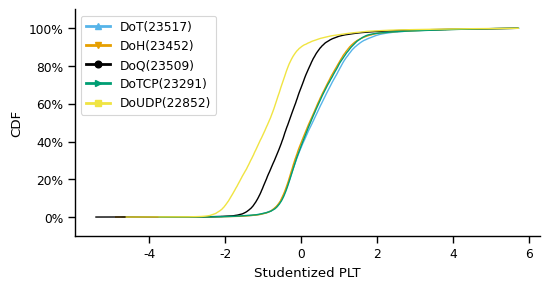

In [318]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_df['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])))
    if len(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_df[normalized_df.protocol == col_val_]['loadEventStart'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized PLT')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-PLT-studentized-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-PLT-studentized.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    23517.000000
mean      3433.562712
std       1937.376562
min        464.100000
10%        873.200000
20%       1739.020000
25%       1981.300000
30%       2240.760000
40%       2824.840000
50%       3271.700000
60%       3708.560000
70%       4276.020000
75%       4597.200000
80%       4948.300000
90%       5826.320000
100%     14733.900000
max      14733.900000
Name: loadEventStart, dtype: float64
DoH
count    23452.000000
mean      3400.395774
std       1896.717996
min        473.500000
10%        871.820000
20%       1692.220000
25%       1951.100000
30%       2196.760001
40%       2800.099999
50%       3256.550000
60%       3676.280000
70%       4253.700000
75%       4594.225001
80%       4943.860000
90%       5844.200000
100%     13856.599999
max      13856.599999
Name: loadEventStart, dtype: float64
DoQ
count    23509.000000
mean      3195.472028
std       1785.440337
min        472.200000
10%        850.200000
20%       1589.860000
25%       1814.599999
30%       20

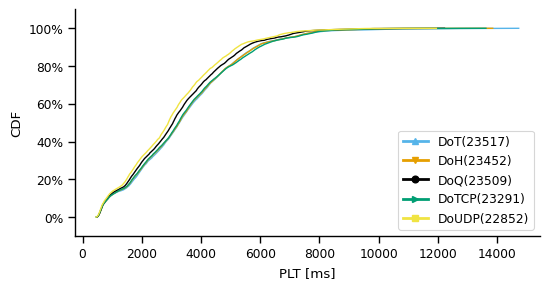

In [319]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_web_performance_metrics['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_web_performance_metrics[df_web_performance_metrics['protocol'] == col_val_]['loadEventStart'])))
    if len(df_web_performance_metrics[df_web_performance_metrics['protocol'] == col_val_]['loadEventStart']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(df_web_performance_metrics[df_web_performance_metrics['protocol'] == col_val_]['loadEventStart'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_web_performance_metrics[df_web_performance_metrics.protocol == col_val_]['loadEventStart'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('PLT [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-PLT-all-vp-all-rslv-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-PLT-all-vp-all-rslv.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [320]:
# normalize data
normalized_df_startup_delay = pd.DataFrame()
for vp in df_start_time.vantagePoint.unique():
    df_vp = df_start_time[df_start_time['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_domain['startup_delay']=(df_domain['startup_delay']-df_domain['startup_delay'].mean())/df_domain['startup_delay'].std()
            normalized_df_startup_delay = pd.concat([normalized_df_startup_delay, df_domain])
normalized_df_startup_delay

,start_time,play_time,msm_id,initial_quality,startup_delay,player_dimensions,protocol,vantagePoint,domain,true_initial_quality,player_dimensions_as_quality,suggested_with_initial_quality,server
0,2022-04-18 00:00:24.450100224,2022-04-18 00:00:25.683000064,17915357-f2e4-81b4-acf7-b71255703ed8,hd720,-0.540616,1280x720,DoT,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158
1,2022-04-18 00:00:54.679099904,2022-04-18 00:00:55.919599872,8297db7d-70e2-96ab-3824-ef58929e52d6,hd720,-0.495840,1280x720,DoH,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158
2,2022-04-18 00:01:24.561699840,2022-04-18 00:01:25.818100224,fb06c88b-3fed-edba-5b29-27e4972a583a,hd720,-0.402164,1280x720,DoQ,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158
3,2022-04-18 00:01:55.399300096,2022-04-18 00:01:56.977899776,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,hd720,1.496052,1280x720,DoTCP,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158
4,2022-04-18 00:02:23.891399936,2022-04-18 00:02:25.090200064,d94c98d2-b7ae-30cf-1b77-0d03406c2669,hd720,-0.741512,1280x720,DoUDP,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158
...,...,...,...,...,...,...,...,...,...,...,...,...,...
115969,2022-04-24 11:59:25.722800128,2022-04-24 11:59:26.398599936,352f7942-fab8-23a5-a486-19c6908e8de6,hd720,-0.573790,1280x720,DoT,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,103.172.17.226
115970,2022-04-24 11:59:48.333199872,2022-04-24 11:59:49.002200064,f6f1c14e-b47c-2d1c-5b36-59cf872ff668,hd720,-0.642455,1280x720,DoH,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,103.172.17.226
115971,2022-04-24 12:00:11.176299776,2022-04-24 12:00:11.843299840,bfe62e54-8908-7b84-07de-ce219e223c58,hd720,-0.662653,1280x720,DoQ,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,103.172.17.226
115972,2022-04-24 12:00:33.786700288,2022-04-24 12:00:34.740700160,049c668b-89b6-9e50-32ce-fced2a5123bd,hd720,2.235571,1280x720,DoTCP,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,103.172.17.226


DoT
count    23515.000000
mean         0.031783
std          0.882779
min         -3.388633
10%         -0.901736
20%         -0.649025
25%         -0.554548
30%         -0.471375
40%         -0.307314
50%         -0.128555
60%          0.078596
70%          0.342827
75%          0.503699
80%          0.677203
90%          1.150803
100%         5.727827
max          5.727827
Name: startup_delay, dtype: float64
DoH
count    23451.000000
mean        -0.232854
std          0.857512
min         -3.737891
10%         -1.111793
20%         -0.881450
25%         -0.788684
30%         -0.701345
40%         -0.545424
50%         -0.385065
60%         -0.200716
70%          0.027530
75%          0.172515
80%          0.340364
90%          0.818397
100%         5.726053
max          5.726053
Name: startup_delay, dtype: float64
DoQ
count    23509.000000
mean        -0.331287
std          0.799510
min         -3.158166
10%         -1.159530
20%         -0.933195
25%         -0.847985
30%         -0

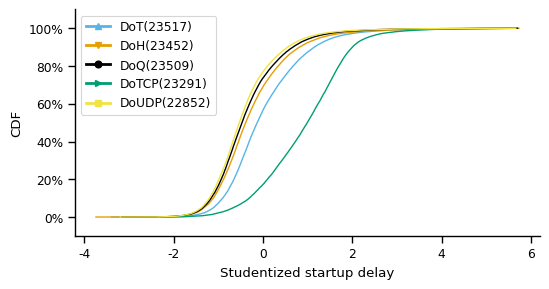

In [321]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_df_startup_delay['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_df_startup_delay[normalized_df_startup_delay['protocol'] == col_val_]['startup_delay'])))
    if len(normalized_df_startup_delay[normalized_df_startup_delay['protocol'] == col_val_]['startup_delay']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_df_startup_delay[normalized_df_startup_delay['protocol'] == col_val_]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_df_startup_delay[normalized_df_startup_delay.protocol == col_val_]['startup_delay'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized startup delay')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-startup-delay-studentized-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-startup-delay-studentized.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    23517.000000
mean         0.808839
std          0.360782
min          0.238000
10%          0.435800
20%          0.534900
25%          0.581600
30%          0.615300
40%          0.684240
50%          0.746600
60%          0.817360
70%          0.893600
75%          0.939900
80%          0.997600
90%          1.247200
100%         6.276200
max          6.276200
Name: startup_delay, dtype: float64
DoH
count    23452.000000
mean         0.770214
std          0.350041
min          0.234300
10%          0.419210
20%          0.515400
25%          0.556400
30%          0.589930
40%          0.653000
50%          0.712250
60%          0.778200
70%          0.848170
75%          0.887900
80%          0.940480
90%          1.127480
100%         4.633400
max          4.633400
Name: startup_delay, dtype: float64
DoQ
count    23509.000000
mean         0.750920
std          0.322992
min          0.242500
10%          0.411960
20%          0.505100
25%          0.547600
30%          0

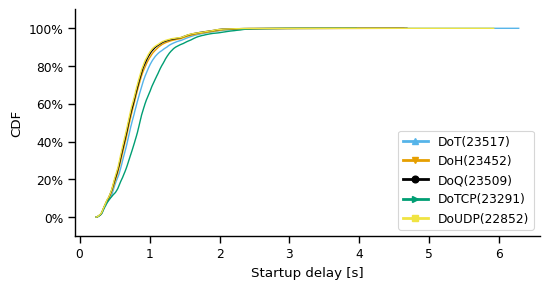

In [322]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_start_time['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay'])))
    if len(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(df_start_time[df_start_time['protocol'] == col_val_]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_start_time[df_start_time.protocol == col_val_]['startup_delay'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Startup delay [s]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-startup-delay-all-vps-all-rslv-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-startup-delay-all-vps-all-rslv.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [323]:
df_dns_perf_metrics = pd.read_sql_query("SELECT * FROM dns_metrics", conn)

In [324]:
df_dns_perf_metrics = df_dns_perf_metrics[df_dns_perf_metrics.msm_id.isin(measurements.msm_id.unique())].copy()

In [325]:
df_dns_perf_metrics_googlevideo = df_dns_perf_metrics[df_dns_perf_metrics.metric.str.contains('.googlevideo.com')]

In [326]:
df_dns_perf_metrics_googlevideo_exchange = df_dns_perf_metrics_googlevideo[df_dns_perf_metrics_googlevideo.metric.str.contains('exchange duration')].copy()

In [327]:
df_dns_perf_metrics_googlevideo_exchange['duration'] = df_dns_perf_metrics_googlevideo_exchange.metric.str.split(' ').str[-1]

In [328]:
df_dns_perf_metrics_googlevideo_exchange['duration'] = df_dns_perf_metrics_googlevideo_exchange['duration'].str[:-2]

In [329]:
df_dns_perf_metrics_googlevideo_exchange['base'] = 1000
df_dns_perf_metrics_googlevideo_exchange['base'] = np.where(df_dns_perf_metrics_googlevideo_exchange.duration.str[-1] == 'm', 1, df_dns_perf_metrics_googlevideo_exchange['base'])
df_dns_perf_metrics_googlevideo_exchange['base'] = np.where(df_dns_perf_metrics_googlevideo_exchange.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics_googlevideo_exchange['base'])
#df_dns_perf_metrics_googlevideo_exchange['base'].value_counts()

In [330]:
df_dns_perf_metrics_googlevideo_exchange['duration'] = np.where((df_dns_perf_metrics_googlevideo_exchange.duration.str[-1] != 'm') & (df_dns_perf_metrics_googlevideo_exchange.duration.str[-1] != 'µ'), df_dns_perf_metrics_googlevideo_exchange['duration']+'s', df_dns_perf_metrics_googlevideo_exchange['duration'])
#df_dns_perf_metrics_googlevideo_exchange.duration.str[-1].value_counts()

In [331]:
df_dns_perf_metrics_googlevideo_exchange['duration'] = df_dns_perf_metrics_googlevideo_exchange['duration'].str[:-1]

In [332]:
df_dns_perf_metrics_googlevideo_exchange['duration'] = df_dns_perf_metrics_googlevideo_exchange['duration'].astype(float) * df_dns_perf_metrics_googlevideo_exchange['base']

In [333]:
df_dns_perf_metrics_googlevideo_exchange.duration.median()

208.23841299999998

In [334]:
df_dns_perf_metrics_googlevideo_exchange = pd.merge(df_dns_perf_metrics_googlevideo_exchange, measurements, on='msm_id')

In [335]:
len(df_dns_perf_metrics_googlevideo_exchange)

126122

In [336]:
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_dns_perf_metrics_googlevideo_exchange.vantagePoint.unique():
    df_vp = df_dns_perf_metrics_googlevideo_exchange[df_dns_perf_metrics_googlevideo_exchange['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_domain['duration']=(df_domain['duration']-df_domain['duration'].mean())/df_domain['duration'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])


DoT
count    25511.000000
mean        -0.008203
std          0.745546
min         -1.978310
10%         -0.566003
20%         -0.496685
25%         -0.468940
30%         -0.437441
40%         -0.361768
50%         -0.265657
60%         -0.132220
70%          0.066539
75%          0.200183
80%          0.383931
90%          0.889649
100%         6.966569
max          6.966569
Name: duration, dtype: float64
DoH
count    25378.000000
mean        -0.359396
std          0.633151
min         -2.166203
10%         -0.858738
20%         -0.720770
25%         -0.674970
30%         -0.635064
40%         -0.571466
50%         -0.519042
60%         -0.460516
70%         -0.350872
75%         -0.265982
80%         -0.155625
90%          0.346922
100%         6.786245
max          6.786245
Name: duration, dtype: float64
DoQ
count    25410.000000
mean        -0.485473
std          0.541282
min         -3.106196
10%         -0.924190
20%         -0.789047
25%         -0.740532
30%         -0.699611
40

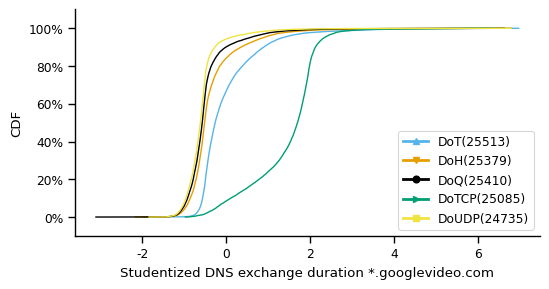

In [337]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized DNS exchange duration *.googlevideo.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-studentized-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-studentized-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    25513.000000
mean       240.597468
std        172.268649
min          0.895529
10%         62.262927
20%        119.909741
25%        145.678390
30%        161.583359
40%        191.661255
50%        218.316892
60%        251.715080
70%        289.448429
75%        308.512014
80%        327.693816
90%        407.982958
100%      5785.848802
max       5785.848802
Name: duration, dtype: float64
DoH
count    25379.000000
mean       209.524339
std        170.978870
min          0.948437
10%         44.413542
20%         98.808496
25%        120.155657
30%        143.246839
40%        166.046894
50%        193.286022
60%        222.155063
70%        253.990449
75%        273.586143
80%        291.100815
90%        354.138947
100%      4124.752996
max       4124.752996
Name: duration, dtype: float64
DoQ
count    25410.000000
mean       193.167359
std        126.104244
min          0.907278
10%         39.735966
20%         94.168160
25%        113.283231
30%        137.121844
40

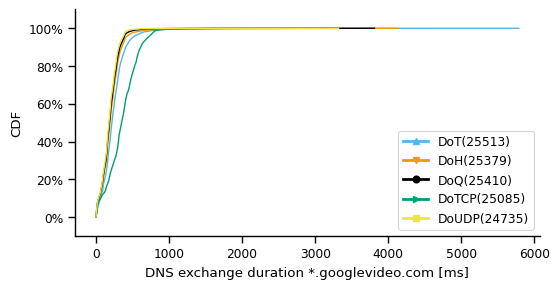

In [338]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_dns_perf_metrics_googlevideo_exchange['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_dns_perf_metrics_googlevideo_exchange[df_dns_perf_metrics_googlevideo_exchange['protocol'] == col_val_]['duration'])))
    if len(df_dns_perf_metrics_googlevideo_exchange[df_dns_perf_metrics_googlevideo_exchange['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(df_dns_perf_metrics_googlevideo_exchange[df_dns_perf_metrics_googlevideo_exchange['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_dns_perf_metrics_googlevideo_exchange[df_dns_perf_metrics_googlevideo_exchange.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('DNS exchange duration *.googlevideo.com [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rslv-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rslv-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [339]:
df_dns_perf_metrics_googlevideo_exchange.groupby('msm_id', as_index=False).agg(num_lookups=('duration', 'count')).sort_values('num_lookups')

,msm_id,num_lookups
0,00012f1e-19ea-25bc-10c1-e6e364f48484,1
76184,a6c4fe4d-de54-4387-6ec5-ee592136e990,1
76182,a6c449e3-2a8b-0532-8122-5fa465d83b1d,1
76181,a6c332d4-ec16-e013-f5ab-242974a9a3d8,1
76180,a6c32369-5a74-f5bb-baf6-70fe71eac480,1
...,...,...
50187,6df3f6d0-b004-2d57-44a9-c8b6f887ad91,4
92125,c9d66458-63fa-6017-ddee-07751b659d77,5
89459,c3dc20d1-0276-3a1e-25c2-5c3b88829372,5
30329,4269606d-acf4-cf53-e9c6-d20b02a82d82,5


In [340]:
df_dns_perf_metrics_googlevideo_exchange.groupby('msm_id', as_index=False).agg(num_lookups=('duration', 'count')).sort_values('num_lookups').num_lookups.value_counts()

1    107667
2      8431
3       503
4        16
5         4
Name: num_lookups, dtype: int64

In [774]:
#df_dns_perf_metrics_googlevideo[df_dns_perf_metrics_googlevideo.msm_id == 'c3dc20d1-0276-3a1e-25c2-5c3b88829372']

In [775]:
#df_dns_perf_metrics_googlevideo[df_dns_perf_metrics_googlevideo.msm_id == 'c3dc20d1-0276-3a1e-25c2-5c3b88829372'].metric.values[0]

In [776]:
#googlevideo_subdomains[googlevideo_subdomains.msm_id == 'c3dc20d1-0276-3a1e-25c2-5c3b88829372']

In [341]:
df_dns_perf_metrics_youtube = df_dns_perf_metrics[df_dns_perf_metrics.metric.str.contains('www.youtube.com')]

In [342]:
df_dns_perf_metrics_youtube = df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube.metric.str.contains('exchange duration')].copy()
df_dns_perf_metrics_youtube['duration'] = df_dns_perf_metrics_youtube.metric.str.split(' ').str[-1]
df_dns_perf_metrics_youtube['duration'] = df_dns_perf_metrics_youtube['duration'].str[:-2]
df_dns_perf_metrics_youtube['base'] = 1000
df_dns_perf_metrics_youtube['base'] = np.where(df_dns_perf_metrics_youtube.duration.str[-1] == 'm', 1, df_dns_perf_metrics_youtube['base'])
df_dns_perf_metrics_youtube['base'] = np.where(df_dns_perf_metrics_youtube.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics_youtube['base'])
df_dns_perf_metrics_youtube['duration'] = np.where((df_dns_perf_metrics_youtube.duration.str[-1] != 'm') & (df_dns_perf_metrics_youtube.duration.str[-1] != 'µ'), df_dns_perf_metrics_youtube['duration']+'s', df_dns_perf_metrics_youtube['duration'])
df_dns_perf_metrics_youtube['duration'] = df_dns_perf_metrics_youtube['duration'].str[:-1]
df_dns_perf_metrics_youtube['duration'] = df_dns_perf_metrics_youtube['duration'].astype(float) * df_dns_perf_metrics_youtube['base']
df_dns_perf_metrics_youtube = pd.merge(df_dns_perf_metrics_youtube, measurements, on='msm_id')

In [343]:
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_dns_perf_metrics_youtube.vantagePoint.unique():
    df_vp = df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_domain['duration']=(df_domain['duration']-df_domain['duration'].mean())/df_domain['duration'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])


DoT
count    24003.000000
mean         0.947412
std          0.471102
min         -1.531821
10%          0.541114
20%          0.835763
25%          0.903215
30%          0.943882
40%          0.994347
50%          1.023190
60%          1.044438
70%          1.065739
75%          1.082344
80%          1.104196
90%          1.189953
100%         5.739050
max          5.739050
Name: duration, dtype: float64
DoH
count    23833.000000
mean         0.962200
std          0.475307
min         -1.784047
10%          0.576288
20%          0.862861
25%          0.922692
30%          0.959963
40%          1.005376
50%          1.032576
60%          1.051660
70%          1.074869
75%          1.092196
80%          1.113344
90%          1.209381
100%         5.695997
max          5.695997
Name: duration, dtype: float64
DoQ
count    23879.000000
mean        -0.212702
std          0.359653
min         -2.044941
10%         -0.368764
20%         -0.310464
25%         -0.294649
30%         -0.281515
40

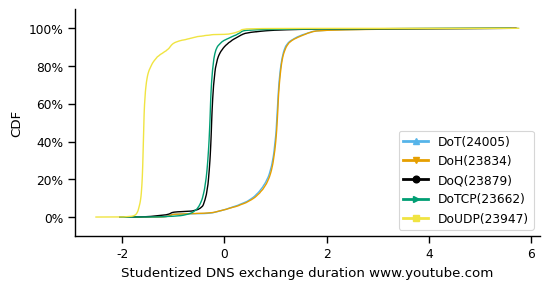

In [780]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized DNS exchange duration www.youtube.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-studentized-youtube-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-studentized-youtube.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    24005.000000
mean       555.749614
std        553.047540
min          2.744118
10%         85.792998
20%        255.013669
25%        301.121996
30%        357.875650
40%        453.000760
50%        514.349331
60%        585.605100
70%        679.683023
75%        721.630649
80%        780.201432
90%        902.977483
100%     10723.874380
max      10723.874380
Name: duration, dtype: float64
DoH
count    23834.000000
mean       529.039164
std        341.241155
min          2.866617
10%         86.711003
20%        259.274021
25%        303.679106
30%        360.712555
40%        453.817703
50%        516.794480
60%        587.283945
70%        681.019978
75%        724.313884
80%        781.362326
90%        901.269352
100%      9434.828870
max       9434.828870
Name: duration, dtype: float64
DoQ
count    23879.000000
mean       353.161806
std        205.793993
min          3.478503
10%         60.474424
20%        178.343594
25%        205.705396
30%        244.981005
40

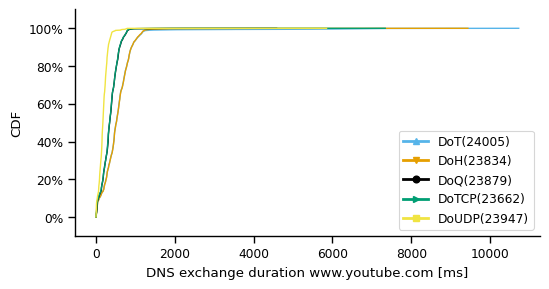

In [781]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_dns_perf_metrics_youtube['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube['protocol'] == col_val_]['duration'])))
    if len(df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_dns_perf_metrics_youtube[df_dns_perf_metrics_youtube.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('DNS exchange duration www.youtube.com [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rslv-youtube-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rslv-youtube.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [344]:
df_dns_perf_metrics_ytimg = df_dns_perf_metrics[df_dns_perf_metrics.metric.str.contains('i.ytimg.com')]
#df_dns_perf_metrics_ytimg

In [345]:
df_dns_perf_metrics_ytimg = df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg.metric.str.contains('exchange duration')].copy()
df_dns_perf_metrics_ytimg['duration'] = df_dns_perf_metrics_ytimg.metric.str.split(' ').str[-1]
df_dns_perf_metrics_ytimg['duration'] = df_dns_perf_metrics_ytimg['duration'].str[:-2]
df_dns_perf_metrics_ytimg['base'] = 1000
df_dns_perf_metrics_ytimg['base'] = np.where(df_dns_perf_metrics_ytimg.duration.str[-1] == 'm', 1, df_dns_perf_metrics_ytimg['base'])
df_dns_perf_metrics_ytimg['base'] = np.where(df_dns_perf_metrics_ytimg.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics_ytimg['base'])
df_dns_perf_metrics_ytimg['duration'] = np.where((df_dns_perf_metrics_ytimg.duration.str[-1] != 'm') & (df_dns_perf_metrics_ytimg.duration.str[-1] != 'µ'), df_dns_perf_metrics_ytimg['duration']+'s', df_dns_perf_metrics_ytimg['duration'])
df_dns_perf_metrics_ytimg['duration'] = df_dns_perf_metrics_ytimg['duration'].str[:-1]
df_dns_perf_metrics_ytimg['duration'] = df_dns_perf_metrics_ytimg['duration'].astype(float) * df_dns_perf_metrics_ytimg['base']
df_dns_perf_metrics_ytimg = pd.merge(df_dns_perf_metrics_ytimg, measurements, on='msm_id')

In [346]:
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_dns_perf_metrics_ytimg.vantagePoint.unique():
    df_vp = df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_domain['duration']=(df_domain['duration']-df_domain['duration'].mean())/df_domain['duration'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])


DoT
count    23835.000000
mean        -0.373372
std          0.555730
min         -2.100645
10%         -0.647826
20%         -0.572625
25%         -0.552144
30%         -0.536956
40%         -0.513690
50%         -0.496735
60%         -0.477919
70%         -0.444297
75%         -0.418187
80%         -0.373513
90%         -0.156895
100%         5.745281
max          5.745281
Name: duration, dtype: float64
DoH
count    23762.000000
mean        -0.398281
std          0.499550
min         -2.838036
10%         -0.643603
20%         -0.575762
25%         -0.557091
30%         -0.541979
40%         -0.519389
50%         -0.501879
60%         -0.487182
70%         -0.462057
75%         -0.443824
80%         -0.414913
90%         -0.257920
100%         5.746621
max          5.746621
Name: duration, dtype: float64
DoQ
count    23825.000000
mean        -0.482700
std          0.333036
min         -2.348265
10%         -0.671876
20%         -0.590735
25%         -0.569471
30%         -0.552535
40

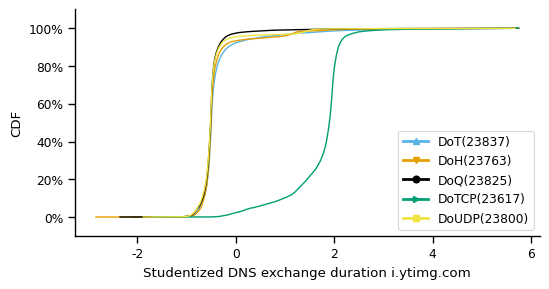

In [785]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized DNS exchange duration i.ytimg.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-studentized-ytimg-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-studentized-ytimg.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    23837.000000
mean       185.023689
std        120.614087
min          0.828453
10%         35.530425
20%         92.243944
25%        107.956481
30%        128.931075
40%        155.409064
50%        178.201953
60%        201.731412
70%        234.060739
75%        248.746053
80%        267.949283
90%        315.086091
100%      3854.909872
max       3854.909872
Name: duration, dtype: float64
DoH
count    23763.000000
mean       188.526571
std        135.947164
min          0.868537
10%         33.230474
20%         91.943915
25%        107.880957
30%        127.217016
40%        154.923525
50%        177.618440
60%        201.880917
70%        235.499550
75%        251.003077
80%        271.887375
90%        318.626836
100%      4789.988784
max       4789.988784
Name: duration, dtype: float64
DoQ
count    23825.000000
mean       178.250308
std        104.176404
min          0.900688
10%         31.542216
20%         89.944381
25%        106.206996
30%        124.294272
40

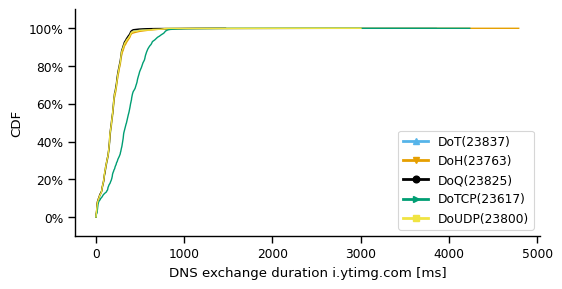

In [786]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_dns_perf_metrics_ytimg['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg['protocol'] == col_val_]['duration'])))
    if len(df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_dns_perf_metrics_ytimg[df_dns_perf_metrics_ytimg.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('DNS exchange duration i.ytimg.com [ms]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rlsv-ytimg-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-all-vps-all-rslv-ytimg.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [787]:
gb_sum = 0
for var in dir():
    if isinstance(locals()[var], pd.core.frame.DataFrame) and var[0]!='_':
        gb_sum = gb_sum+locals()[var].memory_usage(deep=True).sum()/1E9
        print(var+': '+str(locals()[var].memory_usage(deep=True).sum()/1E9))
print(gb_sum)

all_measurements: 0.063199814
all_subdomains: 3.018269477
cache_warming_failed: 0.008953063
delay_to_opt_medians: 1.5986e-05
df: 1.546e-06
df_buffering_events: 0.021108401
df_buffering_events_time: 0.0
df_caught_first_request: 0.030109009
df_dns_perf_metrics: 0.827188528
df_dns_perf_metrics_googlevideo: 0.075473491
df_dns_perf_metrics_googlevideo_exchange: 0.127766087
df_dns_perf_metrics_youtube: 0.118756695
df_dns_perf_metrics_ytimg: 0.117787273
df_domain: 9.843e-06
df_exchange: 1.008394523
df_exchange_googlevideo: 0.06292005
df_googlevideo_lookup_time: 1.5986e-05
df_handshake_and_query: 0.863761558
df_handshake_and_query_first: 0.0580418
df_msms_with_multiple_opt_res: 0.020577588
df_optimal_resolutions: 0.026939451
df_overall_lookup_time: 1.5986e-05
df_play_button_to_first_chunk_request: 0.0147055
df_playback_restarted: 0.0
df_playback_started: 0.019942191
df_player_quality_change_event: 0.040263001
df_player_quality_change_event_to_opt: 0.053107864
df_player_started: 0.012711689
df_

In [347]:
df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].replace({'metrics:DoUDP UDP setup duration from': 'metrics:DoUDP UDP setup duration from '}, regex=True)
#df_dns_perf_metrics[df_dns_perf_metrics.metric.str.startswith('metrics:DoUDP')]

In [348]:
df_dns_perf_metrics['metric_type'] = "none"
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("setup duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("exchange duration"), "exchange", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("query duration"), "query", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("handshake duration"), "handshake", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'] = np.where(df_dns_perf_metrics.metric.str.contains("DoH query"), "lazy-init-handshake-and-query", df_dns_perf_metrics['metric_type'])
df_dns_perf_metrics['metric_type'].value_counts()

exchange                         1189644
query                             950787
handshake                         566065
lazy-init-handshake-and-query     238880
Name: metric_type, dtype: int64

In [349]:
df_dns_perf_metrics['duration'] = df_dns_perf_metrics.metric.str.split(' ').str[-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-2]


In [350]:
df_dns_perf_metrics.duration.str[-1].value_counts()

m    2697615
µ     236012
8       1376
9       1344
3       1344
4       1306
7       1302
5       1293
1       1268
2       1260
6       1256
Name: duration, dtype: int64

In [351]:
df_dns_perf_metrics['base'] = 1000
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'm', 1, df_dns_perf_metrics['base'])
df_dns_perf_metrics['base'] = np.where(df_dns_perf_metrics.duration.str[-1] == 'µ', 1/1000, df_dns_perf_metrics['base'])
df_dns_perf_metrics['base'].value_counts()

1.000       2697615
0.001        236012
1000.000      11749
Name: base, dtype: int64

In [352]:
df_dns_perf_metrics['duration'] = np.where((df_dns_perf_metrics.duration.str[-1] != 'm') & (df_dns_perf_metrics.duration.str[-1] != 'µ'), df_dns_perf_metrics['duration']+'s', df_dns_perf_metrics['duration'])
df_dns_perf_metrics.duration.str[-1].value_counts()

m    2697615
µ     236012
s      11749
Name: duration, dtype: int64

In [353]:
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].str[:-1]
df_dns_perf_metrics['duration'] = df_dns_perf_metrics['duration'].astype(float) * df_dns_perf_metrics['base']
#df_dns_perf_metrics = pd.merge(df_dns_perf_metrics, measurements, on='msm_id')

In [354]:
#df_dns_perf_metrics['metric'].str[8:9].value_counts()

In [355]:
df_dns_perf_metrics['metric'] = df_dns_perf_metrics['metric'].str[8:]

In [356]:
df_dns_perf_metrics['metric_start'] = df_dns_perf_metrics['metric'].str.extract(r'\sfrom\s(.*?)\sto\s')

In [357]:
df_dns_perf_metrics['metric_end'] = df_dns_perf_metrics['metric'].str.extract(r'\sto\s(.*?)\:\s')

In [358]:
df_dns_perf_metrics['protocol'] = df_dns_perf_metrics.metric.str.split(' ').str[0]

In [359]:
df_dns_perf_metrics['domain'] = df_dns_perf_metrics['metric'].str.extract(r'\sfor\s\[\;(.*?)\]\s')

In [360]:
#have to add the year otherwise pandas thinks we are in 1900
df_dns_perf_metrics.metric_start = "2022 "+df_dns_perf_metrics.metric_start
df_dns_perf_metrics.metric_end = "2022 "+df_dns_perf_metrics.metric_end

In [361]:
df_dns_perf_metrics.metric_start = pd.to_datetime(df_dns_perf_metrics.metric_start, format="%Y %b %d %H:%M:%S.%f")

In [362]:
df_dns_perf_metrics.metric_end = pd.to_datetime(df_dns_perf_metrics.metric_end, format="%Y %b %d %H:%M:%S.%f")

In [363]:
df_dns_perf_metrics.domain = df_dns_perf_metrics.domain.str[:-7]

In [364]:
df_dns_perf_metrics.domain.value_counts()

static.doubleclick.net              240877
googleads.g.doubleclick.net         240740
www.youtube.com                     238656
i.ytimg.com                         237684
yt3.ggpht.com                       234348
                                     ...  
r4---sn-hpa7znsz.googlevideo.com         2
r5---sn-nv47lnly.googlevideo.com         2
r1---sn-ab5l6n6l.googlevideo.com         2
r4---sn-f5f7lne7.googlevideo.com         2
r5---sn-4g5lzned.googlevideo.com         2
Name: domain, Length: 2883, dtype: int64

In [365]:
df_dns_perf_metrics.msm_id.nunique()

116621

In [751]:
#df_dns_perf_metrics = df_dns_perf_metrics[df_dns_perf_metrics.msm_id.isin(measurements.msm_id.unique())].copy()

In [366]:
df_dns_perf_metrics.metric_type.value_counts()

exchange                         1189644
query                             950787
handshake                         566065
lazy-init-handshake-and-query     238880
Name: metric_type, dtype: int64

In [367]:
df_handshake_and_query = df_dns_perf_metrics[df_dns_perf_metrics.metric_type != 'exchange'].copy()


In [809]:
#df_handshake_and_query_first = df_handshake_and_query.loc[df_handshake_and_query.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)
df_handshake_and_query_first = df_handshake_and_query[df_handshake_and_query.domain == 'www.youtube.com']
df_handshake_and_query_first = df_handshake_and_query_first.loc[df_handshake_and_query_first.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)


DoTCP query
count    23291.000000
mean       175.756483
std        113.516317
min          0.573023
10%         28.501567
20%         88.484398
25%        102.147154
30%        121.957371
40%        152.515270
50%        173.703954
60%        196.266328
70%        227.044702
75%        241.541967
80%        259.488375
90%        298.299342
100%      6948.860125
max       6948.860125
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    23452.000000
mean       532.758856
std        334.034704
min          2.660590
10%         88.030216
20%        266.738824
25%        309.986379
30%        368.656088
40%        458.660324
50%        524.340721
60%        590.748215
70%        685.094335
75%        727.453617
80%        784.436211
90%        903.775056
100%      9434.630556
max       9434.630556
Name: duration, dtype: float64
DoT query
count    23517.000000
mean       176.611078
std        131.021768
min          0.571108
10%         28.739660
20%         88.797494
25

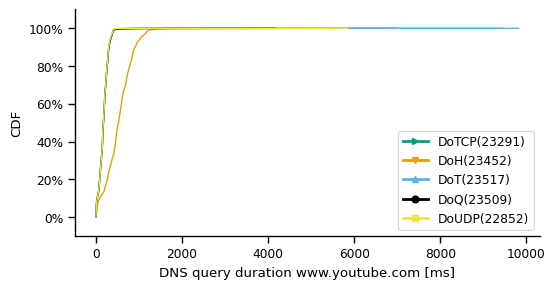

In [810]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_handshake_and_query_first['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    for metric_type in df_handshake_and_query_first.metric_type.unique():
        if len(df_handshake_and_query_first[(df_handshake_and_query_first.protocol == col_val_) & (df_handshake_and_query_first.metric_type == metric_type)]['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_handshake_and_query_first[(df_handshake_and_query_first.protocol == col_val_) & (df_handshake_and_query_first.metric_type == metric_type)]['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_handshake_and_query_first[(df_handshake_and_query_first.protocol == col_val_) & (df_handshake_and_query_first.metric_type == metric_type)]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_handshake_and_query_first[(df_handshake_and_query_first.protocol == col_val_) & (df_handshake_and_query_first.metric_type == metric_type)]['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('')

ax.set_xlabel('DNS query duration www.youtube.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-and-handshake-all-vps-all-rlsv-youtube-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-and-handshake-all-vps-all-rlsv-youtube.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [811]:
df_handshake_and_query_first[(df_handshake_and_query_first.protocol == 'DoUDP') & (df_handshake_and_query_first.duration > 1000)]

,msm_id,metric,metric_type,duration,base,metric_start,metric_end,protocol,domain
3292,0765c83e-e956-d8f2-38a6-685bf313c63c,DoUDP query duration for [;www.youtube.com.\tI...,query,1202.876322,1000.0,2022-04-19 07:25:53.022,2022-04-19 07:25:54.225,DoUDP,www.youtube.com
42269,5cb52107-b68e-2ece-6327-b518584e9a94,DoUDP query duration for [;www.youtube.com.\tI...,query,1285.238284,1000.0,2022-04-24 11:52:35.527,2022-04-24 11:52:36.812,DoUDP,www.youtube.com
54488,77560dc8-c1ab-1880-8584-4e375f15b3f7,DoUDP query duration for [;www.youtube.com.\tI...,query,3709.267579,1000.0,2022-04-22 12:11:06.854,2022-04-22 12:11:10.563,DoUDP,www.youtube.com
60369,84112190-9c39-3be2-5bcf-5231f169d178,DoUDP query duration for [;www.youtube.com.\tI...,query,1295.030889,1000.0,2022-04-22 13:27:47.546,2022-04-22 13:27:48.841,DoUDP,www.youtube.com
75342,a4d0b170-00d7-9774-955f-d2c80e3ba230,DoUDP query duration for [;www.youtube.com.\tI...,query,2505.235912,1000.0,2022-04-19 07:25:27.898,2022-04-19 07:25:30.403,DoUDP,www.youtube.com
103626,e34959b3-b63a-176f-788b-9eef87583ea8,DoUDP query duration for [;www.youtube.com.\tI...,query,5849.196227,1000.0,2022-04-22 11:08:13.309,2022-04-22 11:08:19.158,DoUDP,www.youtube.com


In [812]:
df_handshake_and_query_first.metric_type.unique()

array(['query', 'lazy-init-handshake-and-query'], dtype=object)

In [407]:
#df_handshake_and_query_first = df_handshake_and_query.loc[df_handshake_and_query.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)
df_query_googlevideo = df_handshake_and_query[~df_handshake_and_query.domain.isnull()]
df_query_googlevideo = df_query_googlevideo[df_query_googlevideo.domain.str.endswith('.googlevideo.com')]



DoT query
count    25519.000000
mean       238.839837
std        170.057773
min          0.604537
10%         61.728790
20%        119.394020
25%        144.960097
30%        160.986611
40%        190.748620
50%        217.447075
60%        250.801751
70%        288.046988
75%        307.121974
80%        325.929627
90%        405.567985
100%      5785.545493
max       5785.545493
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    25379.000000
mean       209.248023
std        170.994248
min          0.757622
10%         44.163791
20%         98.445205
25%        119.830175
30%        142.987577
40%        165.742448
50%        193.000261
60%        221.880482
70%        253.728003
75%        273.322042
80%        290.815588
90%        353.874982
100%      4124.334013
max       4124.334013
Name: duration, dtype: float64
DoQ query
count    25410.000000
mean       192.978968
std        126.121253
min          0.753320
10%         39.582784
20%         93.975529
25% 

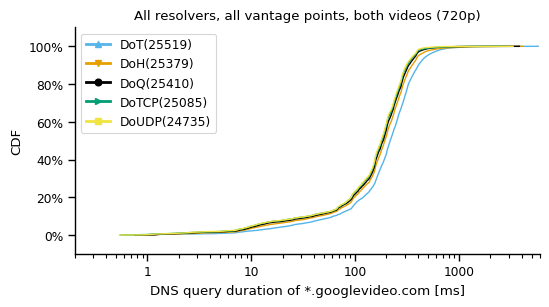

In [408]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_query_googlevideo.metric_type.unique():
        if len(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All resolvers, all vantage points, both videos (720p)')

ax.set_xlabel('DNS query duration of *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-any-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-any-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [409]:
df_query_googlevideo = df_query_googlevideo.loc[df_query_googlevideo.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)

DoTCP query
count    23291.000000
mean       184.168499
std        116.579302
min          0.548054
10%         33.903317
20%         90.753872
25%        106.932564
30%        127.168084
40%        154.781498
50%        177.906447
60%        201.344093
70%        234.345160
75%        249.673019
80%        268.892577
90%        313.877898
100%      2765.919096
max       2765.919096
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    23452.000000
mean       207.773346
std        172.975704
min          0.757622
10%         43.360754
20%         97.829126
25%        118.322843
30%        141.576444
40%        164.682647
50%        191.431308
60%        218.980313
70%        250.735367
75%        269.417072
80%        287.314276
90%        350.767243
100%      4124.334013
max       4124.334013
Name: duration, dtype: float64
DoT query
count    23517.000000
mean       240.277914
std        172.298303
min          0.604537
10%         63.755763
20%        119.513902
25

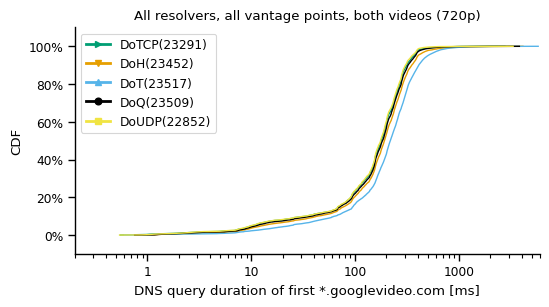

In [410]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_query_googlevideo.metric_type.unique():
        if len(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_query_googlevideo[(df_query_googlevideo.protocol == col_val_) & (df_query_googlevideo.metric_type == metric_type)]['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All resolvers, all vantage points, both videos (720p)')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    8337.000000
mean      170.361244
std       104.409119
min         0.563785
10%        23.843885
20%        78.717804
25%        94.187747
30%       113.304397
40%       149.479704
50%       167.432131
60%       191.928896
70%       217.979150
75%       234.252037
80%       249.751340
90%       291.260072
100%     1351.208522
max      1351.208522
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    8473.000000
mean      195.449088
std       210.592745
min         0.757622
10%        28.322070
20%        88.130477
25%       100.477364
30%       121.360418
40%       155.929131
50%       176.179005
60%       201.743264
70%       230.618013
75%       245.320382
80%       266.009800
90%       317.882333
100%     4124.334013
max      4124.334013
Name: duration, dtype: float64
DoT query
count    8485.000000
mean      187.888792
std       119.819016
min         0.604537
10%        35.709499
20%        93.488238
25%       104.929368
30%       130.447634


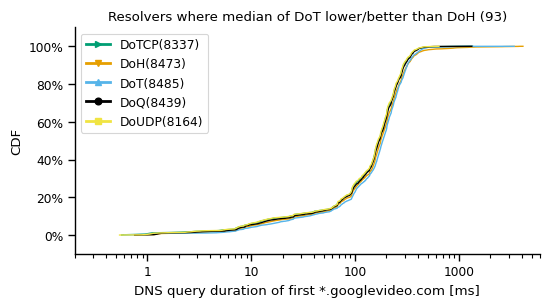

In [370]:
df_plt = pd.merge(df_query_googlevideo, measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type) & (df_plt.server.isin(dot_better))]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median of DoT lower/better than DoH ('+str(median_dot_better)+')')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-better-than-doh-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-better-than-doh.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    14954.000000
mean       191.866178
std        122.169632
min          0.548054
10%         39.481415
20%         94.983607
25%        114.968433
30%        136.747265
40%        157.233013
50%        185.402958
60%        207.278068
70%        242.611614
75%        259.132374
80%        277.136033
90%        322.794276
100%      2765.919096
max       2765.919096
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    14979.000000
mean       214.744669
std        147.060402
min          0.760959
10%         54.634195
20%        108.385680
25%        130.465854
30%        148.910213
40%        173.780276
50%        199.761122
60%        231.534009
70%        263.629098
75%        280.630991
80%        298.454679
90%        371.314774
100%      3457.507077
max       3457.507077
Name: duration, dtype: float64
DoT query
count    15032.000000
mean       269.849608
std        189.519460
min          0.647283
10%         84.868719
20%        144.310983
25

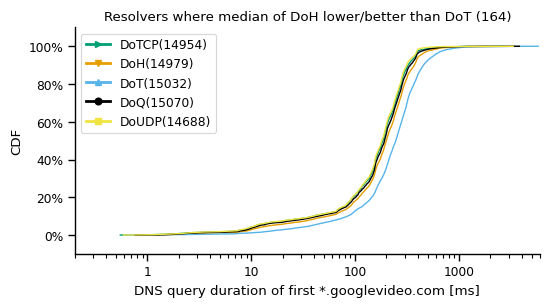

In [371]:
df_plt = pd.merge(df_query_googlevideo, measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type) & (df_plt.server.isin(doh_better))]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median of DoH lower/better than DoT ('+str(median_doh_better)+')')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-doh-better-than-dot-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-doh-better-than-dot.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [879]:
#df_handshake_and_query_first = df_handshake_and_query.loc[df_handshake_and_query.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)
df_query_ytimg = df_handshake_and_query[~df_handshake_and_query.domain.isnull()]
df_query_ytimg = df_query_ytimg[df_query_ytimg.domain == 'i.ytimg.com']
df_query_ytimg = df_query_ytimg.loc[df_query_ytimg.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)


DoTCP query
count    23291.000000
mean       176.842781
std        106.146442
min          0.541869
10%         28.337572
20%         88.951760
25%        102.696692
30%        122.582231
40%        152.672604
50%        174.395991
60%        196.920071
70%        228.555365
75%        242.253132
80%        260.574447
90%        300.561834
100%      2177.461430
max       2177.461430
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    23451.000000
mean       187.978697
std        136.174072
min          0.688580
10%         31.382971
20%         91.580797
25%        107.363692
30%        126.179118
40%        154.717409
50%        177.141124
60%        201.530643
70%        234.893270
75%        250.397879
80%        270.693894
90%        317.167986
100%      4789.774498
max       4789.774498
Name: duration, dtype: float64
DoT query
count    23517.000000
mean       184.321772
std        120.734064
min          0.578279
10%         34.694621
20%         91.655266
25

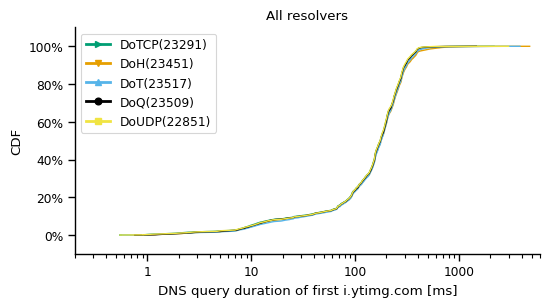

In [880]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_ytimg['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_query_ytimg.metric_type.unique():
        if len(df_query_ytimg[(df_query_ytimg.protocol == col_val_) & (df_query_ytimg.metric_type == metric_type)]['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_query_ytimg[(df_query_ytimg.protocol == col_val_) & (df_query_ytimg.metric_type == metric_type)]['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_query_ytimg[(df_query_ytimg.protocol == col_val_) & (df_query_ytimg.metric_type == metric_type)]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_query_ytimg[(df_query_ytimg.protocol == col_val_) & (df_query_ytimg.metric_type == metric_type)]['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('All resolvers')

ax.set_xlabel('DNS query duration of first i.ytimg.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    8337.000000
mean      169.158514
std       108.746217
min         0.541869
10%        21.888028
20%        76.096885
25%        93.295520
30%       109.297433
40%       147.875478
50%       164.891481
60%       189.883955
70%       213.600652
75%       233.117608
80%       246.913961
90%       289.854391
100%     2177.461430
max      2177.461430
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    8473.000000
mean      185.703961
std       152.372148
min         0.688580
10%        25.666192
20%        79.497474
25%        95.503936
30%       116.569914
40%       151.518148
50%       172.127758
60%       196.159412
70%       226.351958
75%       239.325034
80%       262.822235
90%       314.924451
100%     4723.708344
max      4723.708344
Name: duration, dtype: float64
DoT query
count    8485.000000
mean      169.671676
std       107.777478
min         0.578279
10%        25.415756
20%        77.977490
25%        94.046505
30%       113.988422


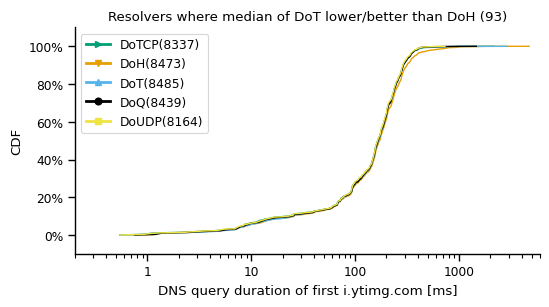

In [1037]:
df_plt = pd.merge(df_query_ytimg, measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type) & (df_plt.server.isin(dot_better))]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median of DoT lower/better than DoH ('+str(median_dot_better)+')')

ax.set_xlabel('DNS query duration of first i.ytimg.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg-dot-better-than-doh-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg-dot-better-than-doh.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    14954.000000
mean       181.126834
std        104.427465
min          0.576738
10%         35.040744
20%         92.467142
25%        109.194653
30%        127.735811
40%        154.678050
50%        178.222695
60%        200.853470
70%        234.304683
75%        248.058597
80%        265.420896
90%        306.073492
100%      1561.093448
max       1561.093448
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    14978.000000
mean       189.265506
std        126.079990
min          0.698702
10%         35.621251
20%         94.341172
25%        112.743887
30%        131.476435
40%        155.942281
50%        181.367398
60%        204.504365
70%        239.440588
75%        255.808143
80%        274.830724
90%        317.835072
100%      4789.774498
max       4789.774498
Name: duration, dtype: float64
DoT query
count    15032.000000
mean       192.591202
std        126.725193
min          0.592899
10%         40.676725
20%         96.120618
25

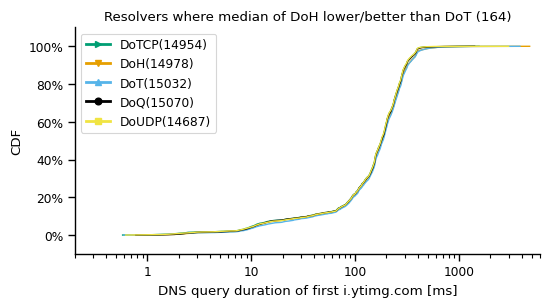

In [1038]:
df_plt = pd.merge(df_query_ytimg, measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type) & (df_plt.server.isin(doh_better))]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median of DoH lower/better than DoT ('+str(median_doh_better)+')')

ax.set_xlabel('DNS query duration of first i.ytimg.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg-doh-better-than-dot-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-ytimg-doh-better-than-dot.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [372]:
#df_handshake_and_query_first = df_handshake_and_query.loc[df_handshake_and_query.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)
df_exchange = df_dns_perf_metrics[df_dns_perf_metrics.metric_type == 'exchange'].copy()
df_exchange_googlevideo = df_exchange[df_exchange.domain.str.endswith('.googlevideo.com')]
df_exchange_googlevideo = df_exchange_googlevideo.loc[df_exchange_googlevideo.groupby('msm_id').metric_start.idxmin()].reset_index(drop=True)


DoTCP exchange
count    23291.000000
mean       357.920154
std        209.019976
min          1.508887
10%         62.432058
20%        179.788827
25%        210.977153
30%        249.524785
40%        307.597326
50%        351.631858
60%        398.357373
70%        462.604879
75%        490.546994
80%        528.630960
90%        610.431625
100%      3184.364838
max       3184.364838
Name: duration, dtype: float64
DoH exchange
count    23452.000000
mean       208.051051
std        172.958526
min          0.948437
10%         43.548541
20%         98.236919
25%        118.632910
30%        141.860354
40%        164.936566
50%        191.690461
60%        219.250138
70%        250.987650
75%        269.676734
80%        287.554004
90%        350.997170
100%      4124.752996
max       4124.752996
Name: duration, dtype: float64
DoT exchange
count    23517.000000
mean       242.168854
std        174.635907
min          0.934961
10%         64.260559
20%        120.066193
25%        146.10

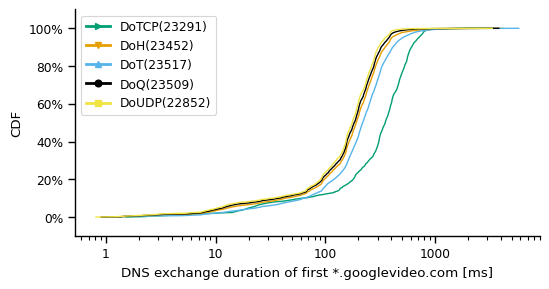

In [1040]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_exchange_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_exchange_googlevideo.metric_type.unique():
        if len(df_exchange_googlevideo[(df_exchange_googlevideo.protocol == col_val_) & (df_exchange_googlevideo.metric_type == metric_type)]['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_exchange_googlevideo[(df_exchange_googlevideo.protocol == col_val_) & (df_exchange_googlevideo.metric_type == metric_type)]['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_exchange_googlevideo[(df_exchange_googlevideo.protocol == col_val_) & (df_exchange_googlevideo.metric_type == metric_type)]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_exchange_googlevideo[(df_exchange_googlevideo.protocol == col_val_) & (df_exchange_googlevideo.metric_type == metric_type)]['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('')

ax.set_xlabel('DNS exchange duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-all-vps-all-rlsv-first-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-all-vps-all-rlsv-first-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP
count    23291.000000
mean         1.452885
std          0.786166
min         -0.914252
10%          0.159375
20%          0.823795
25%          1.082029
30%          1.293987
40%          1.564820
50%          1.729203
60%          1.832733
70%          1.907692
75%          1.939079
80%          1.967475
90%          2.074495
100%         5.746660
max          5.746660
Name: duration, dtype: float64
DoH
count    23451.000000
mean        -0.366387
std          0.621508
min         -1.807520
10%         -0.844170
20%         -0.718227
25%         -0.672654
30%         -0.635361
40%         -0.571120
50%         -0.522224
60%         -0.474555
70%         -0.381487
75%         -0.299614
80%         -0.189671
90%          0.318180
100%         5.746541
max          5.746541
Name: duration, dtype: float64
DoT
count    23515.000000
mean         0.023894
std          0.763430
min         -1.920491
10%         -0.546773
20%         -0.490771
25%         -0.463132
30%         -0.432094


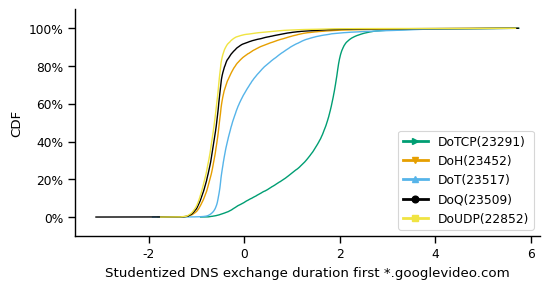

In [818]:
df_to_normalize = pd.merge(df_exchange_googlevideo, measurements[['msm_id', 'vantagePoint', 'server', 'video_ids']], on='msm_id')
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_to_normalize.vantagePoint.unique():
    df_vp = df_to_normalize[df_to_normalize['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.video_ids.unique():
            df_domain = df_server[df_server['video_ids'] == domain].copy()
            df_domain['duration']=(df_domain['duration']-df_domain['duration'].mean())/df_domain['duration'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])

fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized DNS exchange duration first *.googlevideo.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-exchange-duration-studentized-first-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-exchange-duration-studentized-first-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP
count    23291.000000
mean        -0.318325
std          0.787308
min         -2.760698
10%         -0.879733
20%         -0.771440
25%         -0.733014
30%         -0.695814
40%         -0.618947
50%         -0.531019
60%         -0.425739
70%         -0.295581
75%         -0.220971
80%         -0.093233
90%          0.664391
100%         5.746941
max          5.746941
Name: duration, dtype: float64
DoH
count    23451.000000
mean         0.080126
std          0.999626
min         -2.433016
10%         -0.783307
20%         -0.663578
25%         -0.611964
30%         -0.558419
40%         -0.428600
50%         -0.271997
60%         -0.080946
70%          0.350038
75%          0.645457
80%          0.922181
90%          1.402305
100%         5.746965
max          5.746965
Name: duration, dtype: float64
DoT
count    23515.000000
mean         0.794914
std          1.063946
min         -4.492057
10%         -0.374285
20%         -0.159602
25%         -0.038920
30%          0.098671


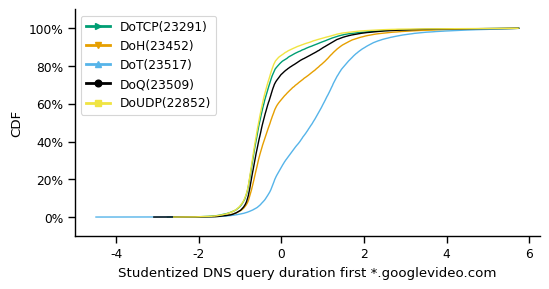

In [819]:
df_to_normalize = pd.merge(df_query_googlevideo, measurements[['msm_id', 'vantagePoint', 'server', 'video_ids']], on='msm_id')
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_to_normalize.vantagePoint.unique():
    df_vp = df_to_normalize[df_to_normalize['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.video_ids.unique():
            df_domain = df_server[df_server['video_ids'] == domain].copy()
            df_domain['duration']=(df_domain['duration']-df_domain['duration'].mean())/df_domain['duration'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])

fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['duration'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized DNS query duration first *.googlevideo.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-duration-studentized-first-googlevideo-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-duration-studentized-first-googlevideo.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [373]:
df_play_button_to_first_chunk_request = pd.read_sql_query("select time, msm_id from iframe_api where event_type = 'PlayStartedFromFunction'", conn)

In [374]:
df_play_button_to_first_chunk_request['time'] = pd.to_datetime(df_play_button_to_first_chunk_request['time'], unit='ms', origin='unix')

In [375]:
df_play_button_to_first_chunk_request = pd.merge(df_play_button_to_first_chunk_request, df_exchange_googlevideo[['msm_id', 'metric_start']], on='msm_id')
#df_play_button_to_first_chunk_request

In [376]:
#not sure what causes this
df_play_button_to_first_chunk_request[df_play_button_to_first_chunk_request.time > df_play_button_to_first_chunk_request.metric_start]

,time,msm_id,metric_start
125,2022-04-18 01:12:06.647700224,a499247c-67f2-e4e6-e7f1-2cf01ff30498,2022-04-18 01:12:04.230
3887,2022-04-19 13:25:12.648499968,40120525-a7bf-9979-29dc-78cb9e08f01b,2022-04-19 13:25:08.121
3906,2022-04-19 13:33:40.114700288,cdb0b837-2482-8f62-ba61-6837571ee016,2022-04-19 13:33:37.685
5979,2022-04-20 12:16:37.777399808,782b8a11-05f9-1390-af83-e9805a8b17da,2022-04-20 12:16:32.947
6467,2022-04-20 16:23:01.788499968,8384ac22-d245-04b0-95da-9352311f0b5b,2022-04-20 16:22:59.510
...,...,...,...
116029,2022-04-24 12:23:25.336099840,4111f64f-9370-b099-1b7d-8d23453abd08,2022-04-24 12:23:22.695
116115,2022-04-24 12:56:58.631599872,6bc25dc1-6783-1d27-9925-4bb11c399877,2022-04-24 12:56:56.093
116148,2022-04-24 13:08:11.080099840,7dc25d70-6070-d764-a69e-a98fb6c44465,2022-04-24 13:08:08.442
116229,2022-04-24 13:34:57.999899904,55223c30-fdd2-53b9-c404-17221f4afad6,2022-04-24 13:34:55.991


In [377]:
df_play_button_to_first_chunk_request = df_play_button_to_first_chunk_request[df_play_button_to_first_chunk_request.time < df_play_button_to_first_chunk_request.metric_start].copy()

In [378]:
df_play_button_to_first_chunk_request['delay_to_first_chunk_request'] = (df_play_button_to_first_chunk_request.metric_start - df_play_button_to_first_chunk_request.time).dt.total_seconds() * 1e3

DoT
count    23418.000000
mean       293.255261
std        114.046562
min         96.299776
10%        148.100205
20%        187.699840
25%        210.225216
30%        232.600128
40%        262.579814
50%        286.900096
60%        313.899968
70%        344.000064
75%        363.399936
80%        387.100224
90%        434.399846
100%      5164.799872
max       5164.799872
Name: delay_to_first_chunk_request, dtype: float64
DoH
count    23350.000000
mean       293.941923
std        110.793867
min         95.300096
10%        147.499904
20%        188.399872
25%        211.299984
30%        233.399917
40%        263.999872
50%        288.600000
60%        314.900224
70%        345.430035
75%        364.799840
80%        388.100173
90%        435.400141
100%      1987.599744
max       1987.599744
Name: delay_to_first_chunk_request, dtype: float64
DoQ
count    23408.000000
mean       293.487050
std        110.930413
min         95.000064
10%        147.000064
20%        186.439987
25%   

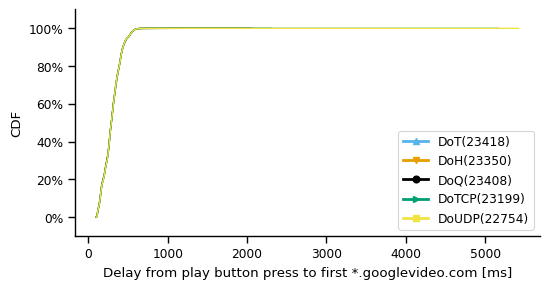

In [883]:
df_to_normalize = pd.merge(df_play_button_to_first_chunk_request, measurements[['msm_id', 'vantagePoint', 'server', 'video_ids', 'protocol']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_to_normalize['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    if len(df_to_normalize[(df_to_normalize.protocol == col_val_)]['delay_to_first_chunk_request']) == 0:
        continue
    sample_size[col_val_].append(str(len(df_to_normalize[(df_to_normalize.protocol == col_val_)]['delay_to_first_chunk_request'])))
    print(col_val_)
    print(df_to_normalize[(df_to_normalize.protocol == col_val_)]['delay_to_first_chunk_request'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

    dfplt = make_cdf(df_to_normalize[(df_to_normalize.protocol == col_val_)]['delay_to_first_chunk_request'])
    dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('')

ax.set_xlabel('Delay from play button press to first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-play-to-first-googlevideo-resolution-all-vps-all-rlsv-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-play-to-first-googlevideo-resolution-all-vps-all-rlsv.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    23416.000000
mean         0.002766
std          0.982657
min         -5.365954
10%         -0.963450
20%         -0.724905
25%         -0.636616
30%         -0.551645
40%         -0.384342
50%         -0.209158
60%         -0.005076
70%          0.257827
75%          0.418210
80%          0.613415
90%          1.252234
100%         5.687570
max          5.687570
Name: delay_to_first_chunk_request, dtype: float64
DoH
count    23349.000000
mean        -0.002641
std          0.974208
min         -5.131233
10%         -0.968263
20%         -0.728993
25%         -0.640146
30%         -0.552943
40%         -0.386436
50%         -0.222543
60%         -0.024781
70%          0.235237
75%          0.409236
80%          0.620003
90%          1.255768
100%         5.733384
max          5.733384
Name: delay_to_first_chunk_request, dtype: float64
DoQ
count    23408.000000
mean         0.004414
std          0.988775
min         -4.212036
10%         -0.970031
20%         -0.731057
25%   

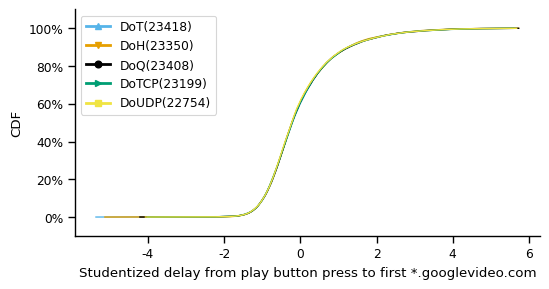

In [827]:
# normalize data
normalized_exchange_duration = pd.DataFrame()
for vp in df_to_normalize.vantagePoint.unique():
    df_vp = df_to_normalize[df_to_normalize['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_web_performance_metrics.video_ids.unique():
            df_domain = df_server[df_server['video_ids'] == domain].copy()
            df_domain['delay_to_first_chunk_request']=(df_domain['delay_to_first_chunk_request']-df_domain['delay_to_first_chunk_request'].mean())/df_domain['delay_to_first_chunk_request'].std()
            normalized_exchange_duration = pd.concat([normalized_exchange_duration, df_domain])

fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = normalized_exchange_duration['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['delay_to_first_chunk_request'])))
    if len(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['delay_to_first_chunk_request']) == 0:
        continue
    #cdf = Cdf.MakeCdfFromList(normalized_df[normalized_df['protocol'] == col_val_]['loadEventStart'])
    print(col_val_)
    print(normalized_exchange_duration[normalized_exchange_duration['protocol'] == col_val_]['delay_to_first_chunk_request'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(normalized_exchange_duration[normalized_exchange_duration.protocol == col_val_]['delay_to_first_chunk_request'])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('')

    ax.set_xlabel('Studentized delay from play button press to first *.googlevideo.com')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-play-to-first-googlevideo-resolution-studentized-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-play-to-first-googlevideo-resolution-studentized.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [379]:
df_start_time['startup_delay_ms'] = (df_start_time['play_time'] - df_start_time['start_time']).dt.total_seconds() * 1e3

In [740]:
#takes ages to run
for index, row in df_start_time.iterrows():
    df_tmp = df_exchange[df_exchange.msm_id == row['msm_id']]
    for domain in df_tmp[(df_tmp.metric_start > row['start_time']) & (df_tmp.metric_end < row['play_time'])].domain.unique():
        if "googlevideo.com" not in domain:
            print(row['msm_id'] + " " +domain)

e1a5c87b-f01e-f607-bd36-4e2f6c3e4387 i.ytimg.com
d6bc9dac-7af8-983c-a78e-ab4a88cfbec5 i.ytimg.com
ea1255a1-5c83-3ec7-5051-0050f9b55d14 i.ytimg.com
a4647789-96b6-4790-63d7-e32ad4bc3ea4 i.ytimg.com
445d3e0c-2584-b29e-9626-0eaa07e0837d i.ytimg.com
34729d6c-0274-af89-6efe-3bb2bac7db9b i.ytimg.com
932d1979-bf5a-6373-ed5a-ed3bfcd2328b i.ytimg.com
93e88ed5-1e00-9e8c-03a6-8e9742831a73 i.ytimg.com
1a830ae1-25f9-f9f1-ef34-f614a65ebb75 yt3.ggpht.com
f67b2137-51d8-29a6-531d-913c705e4edf yt3.ggpht.com
951d4570-addf-c1dd-bd54-55ed9c541d0f i.ytimg.com
1d4ae8b0-6393-c680-4406-492c661c257b i.ytimg.com
ee925d49-4cde-4269-bdfc-7b94328f87a4 i.ytimg.com
c4fad980-0f13-1705-e789-182de5fe4a95 i.ytimg.com
fdb50a91-e1cb-3e41-5a7c-05fe996bfd39 i.ytimg.com
f420cc2c-b020-5ca5-c3fe-357aed3e4756 i.ytimg.com
7c08dfb7-8c3e-94da-7fd5-b481f60a20ac i.ytimg.com
7a28479f-dc07-c962-a49a-1e2283de6fb2 i.ytimg.com
2734f1ac-7ec1-65ca-82d2-c2de7b9e3a41 i.ytimg.com
111c60bd-2806-dd22-fc94-14f7e13bfff4 i.ytimg.com
7ff17584-cc49-3f

KeyboardInterrupt: 

In [742]:
#takes ages to run...
for index, row in df_start_time.iterrows():
    print('.', end='')
    df_tmp = df_exchange[df_exchange.msm_id == row['msm_id']]
    for inner_idx, inner_row in df_tmp[(df_tmp.metric_start > row['start_time']) & (df_tmp.metric_end < row['play_time'])].iterrows():
        print(',', end='')
        if ".googlevideo.com" in inner_row['domain']:
            print('*', end='')
            df_start_time.loc[index, 'startup_delay_ms'] = df_start_time.loc[index, 'startup_delay_ms'] - inner_row['duration']

.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,

.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,,*.,,*.,,*.,*,.,*,.,,*.,,*.,,*.,*,.,*,.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,,*.,*.,*.,*.,*.,,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.

,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,.,,*.,,*.,,*.,*,.,*,.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,.

,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.

,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,

,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*

,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,,*.,*.,,*.,,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,.,*,.,*,.,*.,*,.,*,.,*.,*,.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.

,*.,*.,,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*,.,*,.,*.,*.,*,.,*,.,*,.,*,.,*.,*,.,*.,*.,*,.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.,*.

KeyboardInterrupt: 

In [380]:
df_start_time

,start_time,play_time,msm_id,initial_quality,startup_delay,player_dimensions,protocol,vantagePoint,domain,true_initial_quality,player_dimensions_as_quality,suggested_with_initial_quality,server,startup_delay_ms
0,2022-04-18 00:00:24.450100224,2022-04-18 00:00:25.683000064,17915357-f2e4-81b4-acf7-b71255703ed8,hd720,1.2329,1280x720,DoT,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158,1232.899840
1,2022-04-18 00:00:54.679099904,2022-04-18 00:00:55.919599872,8297db7d-70e2-96ab-3824-ef58929e52d6,hd720,1.2405,1280x720,DoH,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158,1240.499968
2,2022-04-18 00:01:24.561699840,2022-04-18 00:01:25.818100224,fb06c88b-3fed-edba-5b29-27e4972a583a,hd720,1.2564,1280x720,DoQ,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158,1256.400384
3,2022-04-18 00:01:55.399300096,2022-04-18 00:01:56.977899776,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,hd720,1.5786,1280x720,DoTCP,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158,1578.599680
4,2022-04-18 00:02:23.891399936,2022-04-18 00:02:25.090200064,d94c98d2-b7ae-30cf-1b77-0d03406c2669,hd720,1.1988,1280x720,DoUDP,Africa South,aqz-KE-bpKQ,hd720,hd720,hd720<-hd720,34.101.136.158,1198.800128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
116616,2022-04-24 15:55:31.871099904,2022-04-24 15:55:32.416499968,08a2d00a-8951-9748-8dc7-ee34bdbf8923,hd720,0.5454,1280x720,DoT,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,168.138.50.5,545.400064
116617,2022-04-24 15:55:52.322900224,2022-04-24 15:55:52.845600000,4b735559-a6d4-b2cc-f612-cf9dca1c613d,hd720,0.5227,1280x720,DoH,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,168.138.50.5,522.699776
116618,2022-04-24 15:56:12.684300032,2022-04-24 15:56:13.185600000,4d828157-98c1-20e7-ac56-0015c06a69c0,hd720,0.5013,1280x720,DoQ,US West,lqiN98z6Dak,large,hd720,hd720<-large,168.138.50.5,501.299968
116619,2022-04-24 15:56:32.984900096,2022-04-24 15:56:33.680800000,1bd2d12f-81cf-c509-c55b-a4cd2cd743ea,hd720,0.6959,1280x720,DoTCP,US West,lqiN98z6Dak,hd720,hd720,hd720<-hd720,168.138.50.5,695.899904


In [886]:
import pickle

In [889]:
msm_ids_where_only_dot_is_uncached = pickle.load( open( "msm_ids_where_only_dot_is_uncached.pickle", "rb" ) )

In [893]:
msm_ids_where_all_are_uncached = pickle.load( open( "msm_ids_where_all_are_uncached.pickle", "rb" ) )

DoTCP query
count    5274.000000
mean      200.986991
std       106.160369
min         0.826908
10%        67.829653
20%       123.494357
25%       146.383729
30%       153.959322
40%       168.767216
50%       191.172481
60%       222.446383
70%       245.466756
75%       264.523637
80%       281.969985
90%       337.301747
100%     2765.919096
max      2765.919096
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    5278.000000
mean      207.013725
std       136.580219
min         0.766919
10%        68.511324
20%       123.820175
25%       147.983795
30%       155.048857
40%       171.434493
50%       192.529001
60%       223.966600
70%       247.796260
75%       266.573491
80%       282.909507
90%       344.719296
100%     3095.465388
max      3095.465388
Name: duration, dtype: float64
DoT query
count    5277.000000
mean      264.830613
std       165.794453
min         0.987455
10%        94.485088
20%       157.560471
25%       169.456049
30%       181.013975


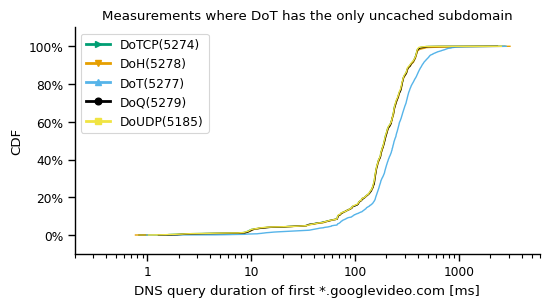

In [891]:
df_plt = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_only_dot_is_uncached)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where DoT has the only uncached subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-only-uncached-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-only-uncached.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    18017.000000
mean       179.245331
std        119.011257
min          0.548054
10%         24.254737
20%         85.068148
25%         98.026315
30%        116.483425
40%        149.935857
50%        174.264983
60%        198.178183
70%        229.905699
75%        246.079853
80%        264.227347
90%        305.906824
100%      2207.421703
max       2207.421703
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    18174.000000
mean       207.993951
std        182.190904
min          0.757622
10%         36.000047
20%         94.223950
25%        111.633732
30%        135.250253
40%        162.595633
50%        190.721420
60%        216.936006
70%        251.321146
75%        270.531128
80%        289.742509
90%        353.067690
100%      4124.334013
max       4124.334013
Name: duration, dtype: float64
DoT query
count    18240.000000
mean       233.174592
std        173.492176
min          0.604537
10%         52.747868
20%        107.202101
25

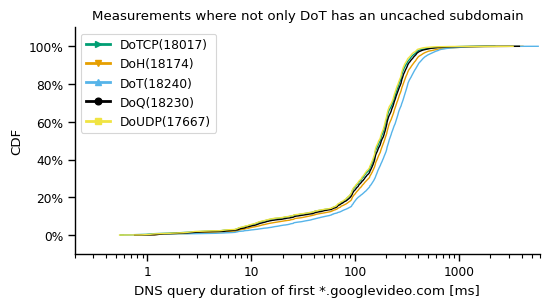

In [892]:
df_plt = pd.merge(df_query_googlevideo[~df_query_googlevideo.msm_id.isin(msm_ids_where_only_dot_is_uncached)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where not only DoT has an uncached subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-not-only-uncached-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-not-only-uncached.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count     931.000000
mean      176.346521
std       103.076845
min         0.567100
10%        40.820074
20%        88.234118
25%        98.674192
30%       115.066668
40%       147.398548
50%       171.052996
60%       198.591479
70%       229.654175
75%       245.857564
80%       260.903954
90%       294.917360
100%     1150.612118
max      1150.612118
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count     928.000000
mean      240.485945
std       199.424503
min         0.786735
10%        73.137231
20%       114.184566
25%       138.262171
30%       155.633135
40%       187.923039
50%       213.785486
60%       251.930993
70%       287.132524
75%       306.794464
80%       323.577840
90%       401.344924
100%     3695.770252
max      3695.770252
Name: duration, dtype: float64
DoT query
count     937.000000
mean      240.138204
std       175.222193
min         0.611301
10%        77.626861
20%       116.351541
25%       138.301488
30%       157.203537


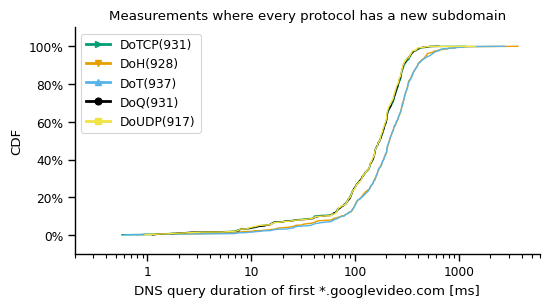

In [894]:
df_plt = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_all_are_uncached)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where every protocol has a new subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [411]:
msm_ids_where_only_dot_is_uncached_set_based = pickle.load( open( "msm_ids_where_only_dot_is_uncached_set_based.pickle", "rb" ) )

DoTCP query
count    5305.000000
mean      201.310915
std       106.111568
min         0.826908
10%        68.037724
20%       124.327263
25%       146.712330
30%       154.018974
40%       169.197031
50%       191.293675
60%       222.465000
70%       245.551216
75%       264.839058
80%       282.506905
90%       338.281528
100%     2765.919096
max      2765.919096
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    5307.000000
mean      207.472131
std       136.539215
min         0.766919
10%        68.758914
20%       125.377082
25%       148.712635
30%       155.238919
40%       172.079410
50%       192.658410
60%       224.006036
70%       247.844602
75%       267.049799
80%       283.129900
90%       345.017132
100%     3095.465388
max      3095.465388
Name: duration, dtype: float64
DoT query
count    5248.000000
mean      264.771492
std       165.962798
min         0.987455
10%        94.269486
20%       157.506323
25%       169.409991
30%       180.938484


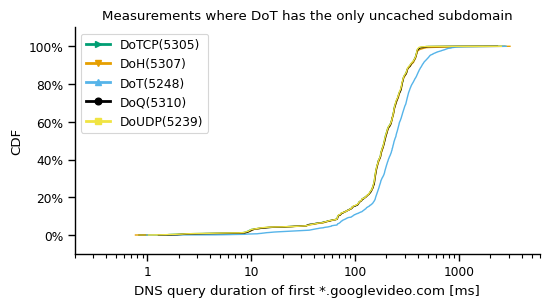

In [412]:
df_plt = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where DoT has the only uncached subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [413]:
msm_ids_where_not_only_dot_is_uncached_set_based = pickle.load( open( "msm_ids_where_not_only_dot_is_uncached_set_based.pickle", "rb" ) )

DoTCP query
count    6902.000000
mean      181.499414
std       127.920424
min         0.548054
10%        11.734686
20%        65.249251
25%        90.559828
30%       120.961602
40%       155.124923
50%       176.223529
60%       202.045876
70%       236.519890
75%       256.686518
80%       278.451254
90%       334.200417
100%     2765.919096
max      2765.919096
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    7082.000000
mean      194.002300
std       157.653252
min         0.757622
10%        14.974432
20%        69.218179
25%       100.516671
30%       130.050883
40%       158.275549
50%       182.473175
60%       211.611567
70%       242.930191
75%       263.923242
80%       283.119584
90%       360.856275
100%     3095.465388
max      3095.465388
Name: duration, dtype: float64
DoT query
count    7104.000000
mean      243.659217
std       199.209776
min         0.619309
10%        34.315957
20%        96.940991
25%       135.961812
30%       158.959174


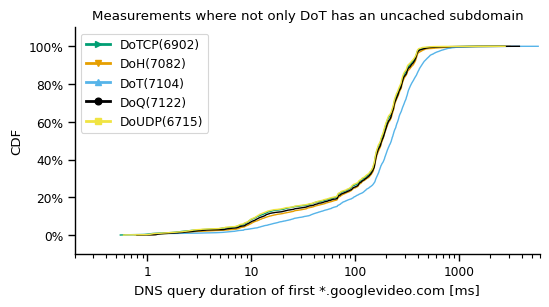

In [414]:
df_plt = pd.merge(df_query_googlevideo[~df_query_googlevideo.msm_id.isin(msm_ids_where_not_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where not only DoT has an uncached subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-not-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-dot-not-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

## measurements in msm_ids_where_all_are_uncached have DoT and DoH overlapping and worse than other protocols -> check vantage point+resolver(+video_id) tuples in overall data to see whether they cause this.

In [912]:
df_query_googlevideo['date'] = df_query_googlevideo['metric_start'].dt.date

In [915]:
df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_all_are_uncached)].date.value_counts().sort_index()

2022-04-18    674
2022-04-19    585
2022-04-20    728
2022-04-21    696
2022-04-22    612
2022-04-23    632
2022-04-24    717
Name: date, dtype: int64

In [919]:
df_dot_doh_worse = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_all_are_uncached)], measurements[['msm_id', 'server', 'vantagePoint', 'video_ids']], on='msm_id')

In [270]:
pd.set_option('display.max_rows', 100)
pd.set_option('display.min_rows', 50)

In [978]:
pd.DataFrame(df_dot_doh_worse[['vantagePoint', 'server']].value_counts()).reset_index()

,vantagePoint,server,0
0,Asia Pacific Southeast,176.103.130.149,20
1,Europe Central,220.77.190.228,20
2,Europe Central,185.177.218.107,20
3,Asia Pacific Southeast,123.195.161.145,15
4,South America East,45.147.54.7,15
5,Asia Pacific Northeast,45.129.2.32,15
6,US East,31.31.202.109,15
7,US East,199.115.228.98,15
8,US West,45.147.54.7,15
9,Europe Central,192.26.105.29,15


In [981]:
df_dot_doh_worse[['vantagePoint', 'server']].server.nunique()

239

In [980]:
df_dot_doh_worse[['vantagePoint', 'server']].server.value_counts()

168.138.53.111     51
45.147.54.7        50
138.2.91.167       45
176.103.130.149    45
167.99.236.104     45
176.103.134.5      45
31.31.202.109      40
220.77.190.228     40
146.56.177.76      39
34.159.55.202      38
172.105.101.43     35
104.244.79.105     35
192.26.105.29      35
103.172.17.225     35
176.103.134.150    35
94.140.14.59       35
176.103.130.130    35
45.129.2.32        35
45.136.245.220     33
103.124.95.99      32
103.176.79.211     31
138.2.84.109       30
45.117.81.204      30
140.238.10.79      30
35.243.221.111     30
                   ..
51.38.176.180       9
103.172.17.226      8
140.238.36.23       7
176.103.134.35      7
173.82.68.70        5
94.140.14.140       5
45.146.255.31       5
152.70.210.231      5
103.123.108.197     5
47.91.45.44         5
141.95.140.195      5
20.24.142.152       5
37.235.49.163       5
188.166.209.249     5
135.125.181.234     5
91.239.27.199       5
94.140.14.141       5
51.15.75.165        5
77.73.71.58         5
37.114.32.

In [979]:
df_dot_doh_worse[['vantagePoint', 'server']].vantagePoint.value_counts()

US East                   990
Asia Pacific Southeast    875
Europe Central            754
South America East        662
US West                   628
Asia Pacific Northeast    459
Africa South              276
Name: vantagePoint, dtype: int64

In [983]:
df_dot_doh_worse.groupby('server').agg(num_vp=('vantagePoint', pd.Series.nunique)).sort_values('num_vp')

,num_vp
server,
123.195.161.145,1
20.24.142.152,1
45.79.151.58,1
45.146.255.31,1
43.132.147.94,1
37.235.49.163,1
188.166.209.249,1
47.91.45.44,1
135.125.181.234,1


In [944]:
df_dot_doh_worse.groupby(['vantagePoint', 'server']).agg(msm_id_count=('msm_id', 'count')).unstack()

msm_id_count                                \
server                 103.105.98.141 103.123.108.197 103.124.95.99   
vantagePoint                                                          
Africa South                      NaN             NaN           NaN   
Asia Pacific Northeast            NaN             NaN           5.0   
Asia Pacific Southeast            5.0             NaN           5.0   
Europe Central                    NaN             NaN           NaN   
South America East                5.0             5.0          10.0   
US East                           NaN             NaN           7.0   
US West                           NaN             NaN           5.0   

                                                                     \
server                 103.172.17.225 103.172.17.226 103.176.79.211   
vantagePoint                                                          
Africa South                      5.0            3.0            NaN   
Asia Pacific Northeast            5.0            NaN            NaN   
Asia Pacific Southeast            5.0            5.0           13.0   
Europe Central                    5.0            NaN            5.0   
South America East                5.0            NaN            NaN   
US East                          10.0            NaN           13.0   
US West                           NaN            NaN            NaN   

                                                                   \
server                 103.179.45.33 103.227.141.70 103.232.207.2   
vantagePoint                                                        
Africa South                     NaN            NaN           NaN   
Asia Pacific Northeast           NaN            5.0           5.0   
Asia Pacific Southeast           5.0            NaN           5.0   
Europe Central                   NaN            NaN           NaN   
South America East               5.0            5.0           NaN   
US East                          5.0            NaN           NaN   
US West                          NaN            5.0           5.0   

                                      ...                             \
server                 103.232.207.3  ... 93.115.24.204 94.140.14.14   
vantagePoint                          ...                              
Africa South                     NaN  ...           NaN          1.0   
Asia Pacific Northeast           NaN  ...           NaN          5.0   
Asia Pacific Southeast           4.0  ...           NaN          5.0   
Europe Central                   5.0  ...           5.0          5.0   
South America East               4.0  ...           NaN          NaN   
US East                          5.0  ...           NaN          NaN   
US West                          NaN  ...           5.0          NaN   

                                                                              \
server                 94.140.14.140 94.140.14.141 94.140.14.15 94.140.14.49   
vantagePoint                                                                   
Africa South                     NaN           NaN          NaN          NaN   
Asia Pacific Northeast           NaN           NaN          NaN          NaN   
Asia Pacific Southeast           5.0           NaN          5.0          NaN   
Europe Central                   NaN           NaN          NaN          NaN   
South America East               NaN           NaN          5.0          NaN   
US East                          NaN           5.0         10.0          5.0   
US West                          NaN           NaN          NaN          5.0   

                                                                             
server                 94.140.14.59 94.140.15.15 94.140.15.16 98.154.23.186  
vantagePoint                                                                 
Africa South                   10.0          NaN          NaN           NaN  
Asia Pacific Northeast         15.0          NaN          NaN           5.0  


In [954]:
df_dot_doh_worse.groupby(['vantagePoint', 'server'], as_index=False).agg(msm_id_count=('msm_id', 'count')).pivot_table(index='server', columns='vantagePoint', values='msm_id_count', fill_value=0).style.format(precision=2).background_gradient(cmap='coolwarm', axis=1)

vantagePoint,Africa South,Asia Pacific Northeast,Asia Pacific Southeast,Europe Central,South America East,US East,US West
server,,,,,,,
103.105.98.141,0,0,5,0,5,0,0
103.123.108.197,0,0,0,0,5,0,0
103.124.95.99,0,5,5,0,10,7,5
103.172.17.225,5,5,5,5,5,10,0
103.172.17.226,3,0,5,0,0,0,0
103.176.79.211,0,0,13,5,0,13,0
103.179.45.33,0,0,5,0,5,5,0
103.227.141.70,0,5,0,0,5,0,5
103.232.207.2,0,5,5,0,0,0,5


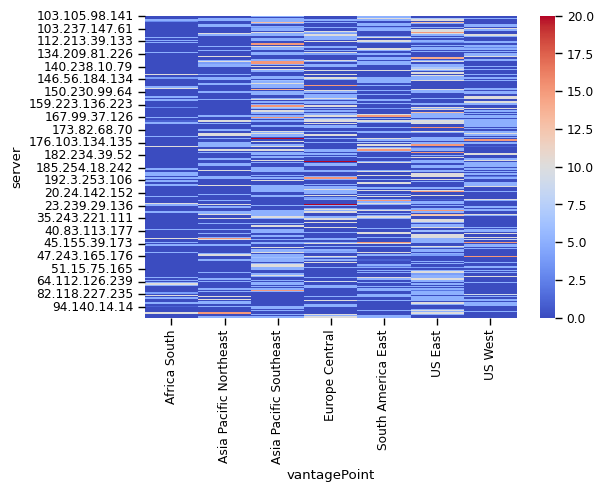

In [1003]:
sns.heatmap(df_dot_doh_worse.groupby(['vantagePoint', 'server'], as_index=False).agg(msm_id_count=('msm_id', 'count')).pivot_table(index='server', columns='vantagePoint', values='msm_id_count', fill_value=0),cmap="coolwarm")
plt.savefig('figures/heatmap-vp-server-dot-and-doh-outlier.pdf', format='pdf', bbox_inches='tight')

In [1185]:
df_dot_doh_worse.groupby(['vantagePoint', 'server'], as_index=False).agg(msm_id_count=('msm_id', 'count')).groupby('vantagePoint').agg(num_servers=('server', 'count'), num_msm=('msm_id_count', 'sum')).sort_values('num_servers')

,num_servers,num_msm
vantagePoint,,
Africa South,50,276
Asia Pacific Northeast,72,459
South America East,101,662
US West,104,628
Europe Central,111,754
Asia Pacific Southeast,135,875
US East,144,990


In [960]:
df_dot_doh_worse.video_ids.value_counts()

aqz-KE-bpKQ    2353
lqiN98z6Dak    2291
Name: video_ids, dtype: int64

<AxesSubplot:xlabel='vantagePoint', ylabel='server'>

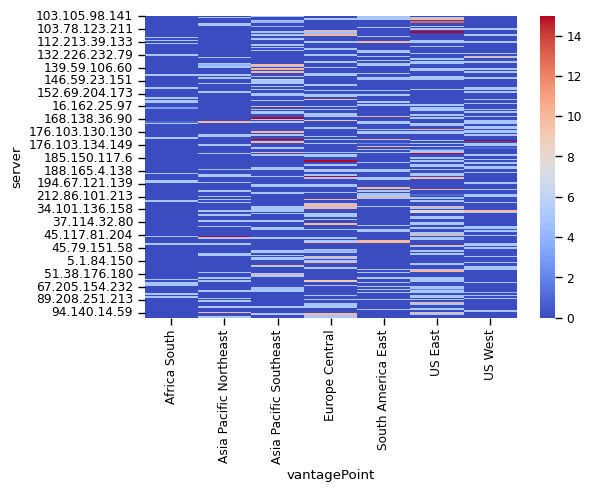

In [961]:
sns.heatmap(df_dot_doh_worse[df_dot_doh_worse.video_ids == 'aqz-KE-bpKQ'].groupby(['vantagePoint', 'server'], as_index=False).agg(msm_id_count=('msm_id', 'count')).pivot_table(index='server', columns='vantagePoint', values='msm_id_count', fill_value=0),cmap="coolwarm")

<AxesSubplot:xlabel='vantagePoint', ylabel='server'>

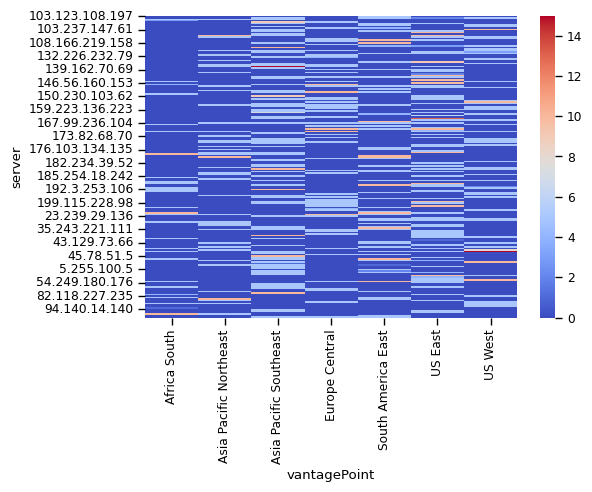

In [962]:
sns.heatmap(df_dot_doh_worse[df_dot_doh_worse.video_ids == 'lqiN98z6Dak'].groupby(['vantagePoint', 'server'], as_index=False).agg(msm_id_count=('msm_id', 'count')).pivot_table(index='server', columns='vantagePoint', values='msm_id_count', fill_value=0),cmap="coolwarm")

In [910]:
df_filter

,vantagePoint,server
0,Asia Pacific Northeast,94.140.14.59
1,Asia Pacific Southeast,31.44.0.4
2,Europe Central,176.103.130.149
3,Asia Pacific Northeast,34.159.55.202
4,US East,103.78.123.211
...,...,...
3221,Europe Central,104.238.154.123
3224,Africa South,94.140.14.14
3403,US West,188.68.59.46
3515,Asia Pacific Southeast,50.116.59.251


DoTCP query
count    9903.000000
mean      182.203975
std       115.169569
min         0.567100
10%        43.509617
20%        91.656318
25%       103.386784
30%       121.013657
40%       150.840979
50%       174.781027
60%       200.333227
70%       233.115411
75%       247.475589
80%       265.477573
90%       305.252574
100%     2207.421703
max      2207.421703
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    9895.000000
mean      212.742868
std       190.101586
min         0.760959
10%        59.590650
20%       100.403883
25%       116.852561
30%       138.135616
40%       163.128246
50%       191.511316
60%       216.140982
70%       254.414483
75%       274.353562
80%       289.980676
90%       353.766781
100%     3797.045469
max      3797.045469
Name: duration, dtype: float64
DoT query
count    9896.000000
mean      240.379581
std       180.483357
min         0.611301
10%        72.567110
20%       119.349723
25%       141.592310
30%       157.776159


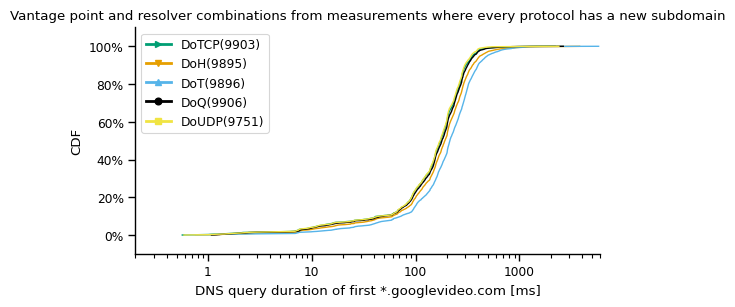

In [921]:
df_filter = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_all_are_uncached)], measurements[['msm_id', 'server', 'vantagePoint', 'video_ids']], on='msm_id')[['vantagePoint', 'server']].drop_duplicates()

df_plt = pd.merge(df_query_googlevideo, measurements[['msm_id', 'server', 'vantagePoint']], on='msm_id')
df_plt = pd.merge(df_plt, df_filter, on=['vantagePoint', 'server'])

fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Vantage point and resolver combinations from measurements where every protocol has a new subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    5725.000000
mean      184.048740
std       116.653256
min         0.567100
10%        59.130236
20%        92.751918
25%       104.086696
30%       122.143322
40%       152.595157
50%       176.040155
60%       201.256291
70%       233.556723
75%       248.103193
80%       266.456303
90%       306.324931
100%     2207.421703
max      2207.421703
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    5716.000000
mean      215.431295
std       191.710791
min         0.760959
10%        64.198268
20%       101.871026
25%       118.393002
30%       140.013372
40%       165.447810
50%       194.908476
60%       218.415253
70%       258.588165
75%       276.654342
80%       292.326669
90%       359.756463
100%     3797.045469
max      3797.045469
Name: duration, dtype: float64
DoT query
count    5731.000000
mean      241.298241
std       165.481078
min         0.611301
10%        74.769357
20%       120.772605
25%       143.075176
30%       159.534308


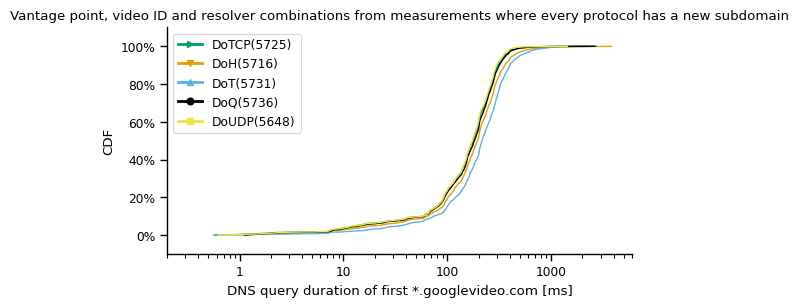

In [922]:
df_filter = pd.merge(df_query_googlevideo[df_query_googlevideo.msm_id.isin(msm_ids_where_all_are_uncached)], measurements[['msm_id', 'server', 'vantagePoint', 'video_ids']], on='msm_id')[['vantagePoint', 'server', 'video_ids']].drop_duplicates()

df_plt = pd.merge(df_query_googlevideo, measurements[['msm_id', 'server', 'vantagePoint', 'video_ids']], on='msm_id')
df_plt = pd.merge(df_plt, df_filter, on=['vantagePoint', 'server', 'video_ids'])

fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Vantage point, video ID and resolver combinations from measurements where every protocol has a new subdomain')

ax.set_xlabel('DNS query duration of first *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-first-googlevideo-no-cached.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [930]:
df_dns_perf_metrics[(df_dns_perf_metrics.msm_id.isin(msm_ids_where_all_are_uncached)) & (df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT')].groupby('msm_id').size().value_counts(normalize=True)

3    0.783351
4    0.105656
2    0.077908
5    0.017076
1    0.014941
7    0.001067
dtype: float64

In [931]:
df_dns_perf_metrics[~(df_dns_perf_metrics.msm_id.isin(msm_ids_where_all_are_uncached)) & (df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT')].groupby('msm_id').size().value_counts(normalize=True)

3    0.766962
4    0.097210
2    0.096856
5    0.021789
1    0.016342
6    0.000487
7    0.000310
8    0.000044
dtype: float64

In [932]:
df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT')].groupby('msm_id').size().value_counts(normalize=True)

3    0.767615
4    0.097546
2    0.096101
5    0.021601
1    0.016286
6    0.000468
7    0.000340
8    0.000043
dtype: float64

In [937]:
df_num_dot_handshakes = df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT')].groupby('msm_id', as_index=False).size()

In [940]:
df_num_dot_handshakes[df_num_dot_handshakes['size'] == 3]

,msm_id,size
1,0005747c-f270-5e76-c22e-aa8df98f2d6a,3
2,0006208e-e61b-e2ab-bb38-78fe1b50d09f,3
3,0011b452-1735-b999-755d-44454e3780a6,3
4,00170f4d-c33c-efbc-4ff3-f4065d566685,3
5,00189662-e10d-21c8-d6f5-0791f4d7f691,3
...,...,...
23512,ffefc980-4701-5b31-5ac3-9c8dcf79f79f,3
23513,fff682e2-fc19-c515-c808-1490a13e9f3c,3
23514,fffb19cd-d76d-48d9-5916-3ed3630ca2c8,3
23515,fffe857d-3600-8df0-78f1-278e88326bfa,3


In [984]:
df_query_googlevideo_all = df_handshake_and_query[~df_handshake_and_query.domain.isnull()]
df_query_googlevideo_all = df_query_googlevideo_all[df_query_googlevideo_all.domain.str.endswith('.googlevideo.com')]

DoT query
count    5479.000000
mean      263.831536
std       164.015933
min         0.987455
10%        95.283874
20%       157.625231
25%       169.476956
30%       180.860697
40%       208.554914
50%       238.257217
60%       267.960249
70%       308.218188
75%       324.573924
80%       351.128499
90%       437.965079
100%     2844.057035
max      2844.057035
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    5544.000000
mean      209.148828
std       136.917493
min         0.766919
10%        69.634015
20%       128.555605
25%       149.749180
30%       156.001939
40%       173.134037
50%       193.667719
60%       224.612425
70%       249.211485
75%       267.970240
80%       284.449976
90%       346.064092
100%     3095.465388
max      3095.465388
Name: duration, dtype: float64
DoQ query
count    5528.000000
mean      204.106845
std       105.812182
min         1.276794
10%        69.158194
20%       128.874477
25%       148.816612
30%       155.388009
40

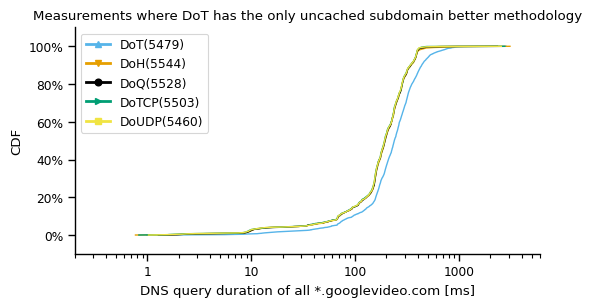

In [988]:
df_plt = pd.merge(df_query_googlevideo_all[df_query_googlevideo_all.msm_id.isin(msm_ids_where_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where DoT has the only uncached subdomain better methodology')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-dot-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-dot-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT query
count    7700.000000
mean      237.944508
std       197.736386
min         0.619309
10%        30.433491
20%        85.557623
25%       123.846840
30%       155.041713
40%       183.851307
50%       217.763326
60%       251.302897
70%       292.541849
75%       316.151151
80%       341.396807
90%       431.030000
100%     5785.545493
max      5785.545493
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    7657.000000
mean      192.038160
std       157.286302
min         0.757622
10%        15.552770
20%        67.389625
25%        92.654170
30%       121.516260
40%       157.059110
50%       180.144710
60%       208.804911
70%       241.623848
75%       263.059535
80%       282.858228
90%       358.230311
100%     3095.465388
max      3095.465388
Name: duration, dtype: float64
DoQ query
count    7671.000000
mean      185.643541
std       139.032913
min         0.791809
10%        13.153781
20%        64.072966
25%        91.231365
30%       119.765065
40

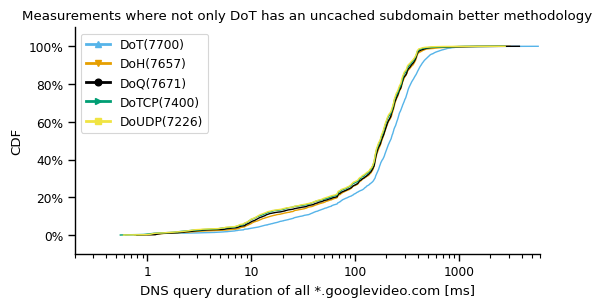

In [987]:
df_plt = pd.merge(df_query_googlevideo_all[~df_query_googlevideo_all.msm_id.isin(msm_ids_where_not_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where not only DoT has an uncached subdomain better methodology')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-dot-not-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-dot-not-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoTCP query
count    1030.000000
mean      183.400917
std       106.615650
min         0.567100
10%        58.805856
20%        91.064593
25%       103.062277
30%       123.156542
40%       154.043333
50%       178.217317
60%       202.510540
70%       238.085519
75%       253.125021
80%       272.871518
90%       307.583801
100%     1150.612118
max      1150.612118
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    1018.000000
mean      242.125752
std       195.378613
min         0.786735
10%        78.826874
20%       115.485550
25%       141.447292
30%       157.506168
40%       189.790026
50%       216.607214
60%       255.565215
70%       290.716377
75%       307.285365
80%       323.982283
90%       402.338792
100%     3695.770252
max      3695.770252
Name: duration, dtype: float64
DoT query
count    1020.000000
mean      240.466297
std       170.124978
min         0.611301
10%        79.663734
20%       122.101673
25%       142.224418
30%       158.572125


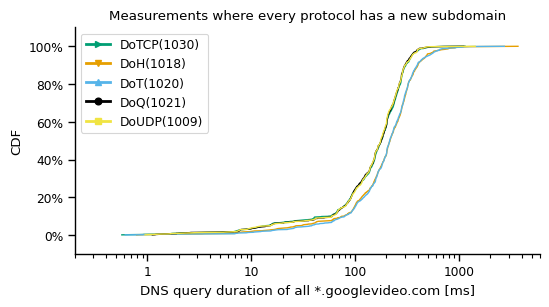

In [989]:
df_plt = pd.merge(df_query_googlevideo_all[df_query_googlevideo_all.msm_id.isin(msm_ids_where_all_are_uncached)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_query_googlevideo['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where every protocol has a new subdomain')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-no-cached-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-no-cached.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [990]:
df_query_non_googlevideo_all = df_handshake_and_query[~df_handshake_and_query.domain.isnull()]
df_query_non_googlevideo_all = df_query_non_googlevideo_all[~df_query_non_googlevideo_all.domain.str.endswith('.googlevideo.com')]

DoT query
count    47850.000000
mean       203.221630
std        120.331277
min          0.066549
10%         68.360067
20%        124.073459
25%        146.969313
30%        154.300202
40%        170.971716
50%        192.239583
60%        223.238187
70%        246.700856
75%        265.754798
80%        282.875460
90%        341.271765
100%     10000.195225
max      10000.195225
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    48340.000000
mean       253.473643
std        209.751696
min          0.676884
10%         71.176644
20%        135.554965
25%        152.450216
30%        158.298614
40%        180.321966
50%        205.523831
60%        238.392494
70%        279.336257
75%        294.919499
80%        332.384182
90%        432.377909
100%      9549.029193
max       9549.029193
Name: duration, dtype: float64
DoQ query
count    48376.000000
mean       201.567739
std        104.449550
min          1.082887
10%         68.662948
20%        124.481050
25% 

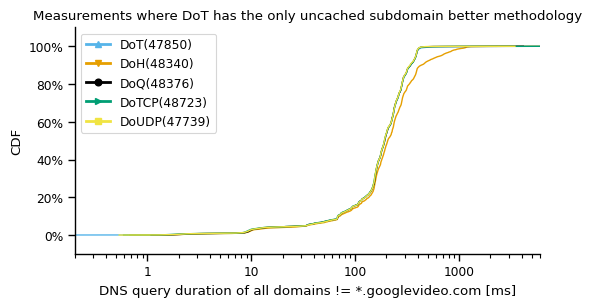

In [991]:
df_plt = pd.merge(df_query_non_googlevideo_all[df_query_non_googlevideo_all.msm_id.isin(msm_ids_where_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where DoT has the only uncached subdomain better methodology')

ax.set_xlabel('DNS query duration of all domains != *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-dot-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-dot-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT query
count    64829.000000
mean       182.124708
std        157.962086
min          0.066549
10%         11.665539
20%         65.852200
25%         91.523646
30%        121.478210
40%        155.635033
50%        177.750792
60%        203.107792
70%        237.109875
75%        255.871864
80%        277.578299
90%        330.809010
100%     10000.195225
max      10000.195225
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    64586.000000
mean       228.349005
std        227.826821
min          0.676884
10%         13.323406
20%         67.716334
25%        100.714213
30%        134.615257
40%        160.860067
50%        189.632235
60%        226.901558
70%        264.792656
75%        285.445628
80%        316.461357
90%        407.055447
100%      9549.029193
max       9549.029193
Name: duration, dtype: float64
DoQ query
count    64956.000000
mean       182.852299
std        133.314755
min          0.728822
10%         11.883223
20%         67.288738
25% 

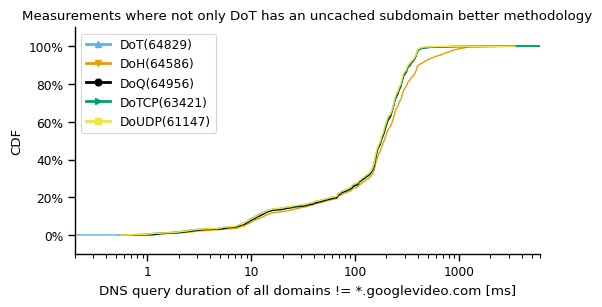

In [992]:
df_plt = pd.merge(df_query_non_googlevideo_all[~df_query_non_googlevideo_all.msm_id.isin(msm_ids_where_not_only_dot_is_uncached_set_based)], measurements[['msm_id', 'server']], on='msm_id')
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where not only DoT has an uncached subdomain better methodology')

ax.set_xlabel('DNS query duration of all domains != *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-dot-not-only-uncached-set-based-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-dot-not-only-uncached-set-based.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [993]:
dot_better

['103.232.207.3',
 '107.172.30.115',
 '118.163.170.2',
 '120.55.44.44',
 '129.154.226.9',
 '13.250.108.212',
 '138.2.72.170',
 '138.2.91.167',
 '139.59.106.60',
 '16.162.44.250',
 '167.99.37.126',
 '168.138.163.222',
 '168.138.50.5',
 '176.103.130.132',
 '176.103.130.136',
 '176.103.130.137',
 '176.103.130.149',
 '176.103.134.35',
 '176.103.134.5',
 '185.254.18.242',
 '188.116.27.94',
 '188.166.209.249',
 '188.227.86.112',
 '199.115.228.98',
 '20.24.142.152',
 '203.160.55.187',
 '204.44.76.45',
 '212.86.101.213',
 '217.160.68.68',
 '220.77.190.228',
 '23.239.29.136',
 '23.95.209.33',
 '31.31.202.109',
 '34.69.170.155',
 '35.241.97.81',
 '35.243.221.111',
 '37.1.195.86',
 '37.114.32.80',
 '38.242.12.100',
 '39.105.150.214',
 '45.155.39.173',
 '45.95.203.99',
 '46.137.195.96',
 '46.3.242.170',
 '47.254.64.251',
 '5.181.48.19',
 '51.158.105.226',
 '51.195.103.20',
 '51.38.176.180',
 '51.89.26.38',
 '54.249.180.176',
 '64.112.126.239',
 '8.210.148.24',
 '85.235.65.70',
 '89.58.10.169',
 '9

DoT query
count    9149.000000
mean      188.141363
std       120.058089
min         0.604537
10%        34.489127
20%        92.942566
25%       104.663878
30%       130.430132
40%       162.963222
50%       184.476052
60%       207.625818
70%       235.836093
75%       252.812975
80%       272.873326
90%       319.040239
100%     3397.164351
max      3397.164351
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    9121.000000
mean      195.434844
std       206.268133
min         0.757622
10%        28.275491
20%        86.725153
25%       100.222775
30%       121.090400
40%       156.252327
50%       176.248983
60%       202.280533
70%       231.972891
75%       246.969937
80%       268.369356
90%       319.153382
100%     4124.334013
max      4124.334013
Name: duration, dtype: float64
DoQ query
count    9105.000000
mean      173.884278
std       104.476472
min         0.753320
10%        25.798912
20%        79.301975
25%        96.814110
30%       117.273819
40

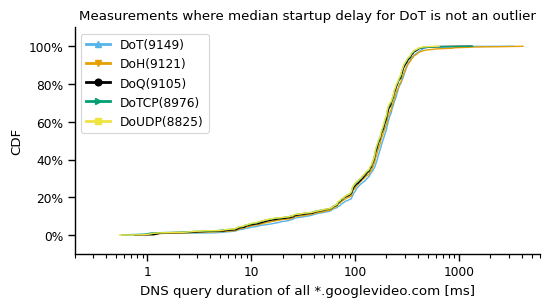

In [1041]:
df_plt = pd.merge(df_query_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[df_plt.server.isin(dot_better)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where median startup delay for DoT is not an outlier')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT query
count    16370.000000
mean       267.174617
std        186.516918
min          0.647283
10%         83.944162
20%        143.610144
25%        160.938441
30%        178.169378
40%        210.170699
50%        244.484347
60%        278.457128
70%        313.887726
75%        332.003745
80%        364.969011
90%        449.023619
100%      5785.545493
max       5785.545493
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    16258.000000
mean       216.997438
std        146.997808
min          0.760959
10%         55.557566
20%        109.715469
25%        133.064399
30%        150.320034
40%        175.811032
50%        201.776085
60%        234.409032
70%        265.801937
75%        283.242775
80%        301.722412
90%        373.161661
100%      3457.507077
max       3457.507077
Name: duration, dtype: float64
DoQ query
count    16305.000000
mean       203.641780
std        135.562856
min          0.760956
10%         47.398668
20%        102.997232
25% 

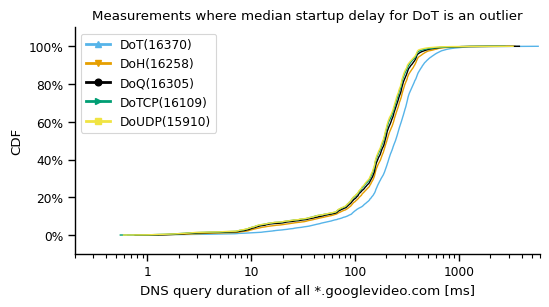

In [1042]:
df_plt = pd.merge(df_query_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[df_plt.server.isin(doh_better)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where median startup delay for DoT is an outlier')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-dot-worse-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-dot-worse.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT query
count    76857.000000
mean       168.497737
std        141.921531
min          0.561151
10%         24.203633
20%         76.604591
25%         93.511458
30%        112.599872
40%        148.129657
50%        165.103808
60%        189.243473
70%        210.914178
75%        231.314807
80%        245.102365
90%        289.358431
100%     10000.195225
max      10000.195225
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    76463.000000
mean       220.364805
std        228.885550
min          0.676884
10%         26.354657
20%         85.529569
25%         99.023938
30%        123.790312
40%        155.329983
50%        179.323606
60%        204.271903
70%        239.452385
75%        265.182257
80%        286.479107
90%        400.065208
100%      6221.029173
max       6221.029173
Name: duration, dtype: float64
DoQ query
count    76161.000000
mean       168.314913
std        103.037933
min          0.728822
10%         24.124887
20%         76.431947
25% 

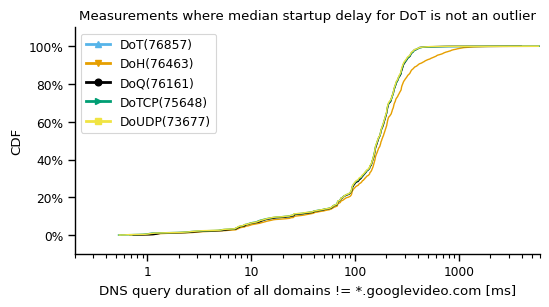

In [1043]:

df_plt = pd.merge(df_query_non_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[df_plt.server.isin(dot_better)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where median startup delay for DoT is not an outlier')

ax.set_xlabel('DNS query duration of all domains != *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT query
count    137555.000000
mean        185.110112
std         143.111238
min           0.066549
10%          36.429394
20%          93.508848
25%         110.818190
30%         130.308815
40%         155.085070
50%         179.434336
60%         201.929181
70%         235.416727
75%         250.774810
80%         267.976933
90%         311.266774
100%      10000.853438
max       10000.853438
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    137038.000000
mean        224.462210
std         193.236414
min           0.678089
10%          38.075421
20%          97.234673
25%         116.835781
30%         138.612440
40%         161.098989
50%         191.333788
60%         221.668510
70%         256.731538
75%         276.751127
80%         293.481742
90%         392.450009
100%       9549.029193
max        9549.029193
Name: duration, dtype: float64
DoQ query
count    137877.000000
mean        182.036254
std         113.346041
min           0.761824
10%       

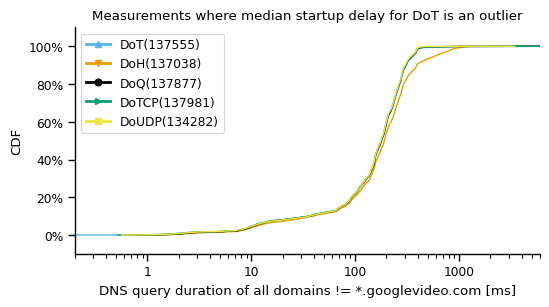

In [1044]:
df_plt = pd.merge(df_query_non_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[df_plt.server.isin(doh_better)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Measurements where median startup delay for DoT is an outlier')

ax.set_xlabel('DNS query duration of all domains != *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

if log:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-median-startup-delay-filter-dot-worse-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-non-googlevideo-median-startup-delay-filter-dot-worse.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [428]:
df_test = df_start_time.groupby(['vantagePoint','server', 'protocol']).agg(startup_delay=('startup_delay', 'median')).unstack().reset_index()
df_test.columns = [''.join(col).strip().replace('startup_delay', "", 1) for col in df_test.columns.values]

In [429]:
median_doh_better = 0
median_dot_better = 0
doh_better_vp = dict()
dot_better_vp = dict()
for vp in df_test.vantagePoint.unique():
    doh_better_vp[vp] = set()
    dot_better_vp[vp] = set()
for idx, row in df_test.iterrows():
    #if row['DoT'] > row['DoH']:
    if row['DoT']-row['DoH'] > 0.01 :
        median_doh_better = median_doh_better+1
        doh_better_vp[row['vantagePoint']].add(row['server'])
    else:
        median_dot_better = median_dot_better+1
        dot_better_vp[row['vantagePoint']].add(row['server'])
print(median_doh_better)
print(median_dot_better)
print(median_dot_better+median_doh_better)


1028
714
1742


In [430]:
running_set_doh = set()
running_set_dot = set()
for vp in df_test.vantagePoint.unique():
    if len(running_set_doh) == 0:
        running_set_doh = doh_better_vp[vp]
        running_set_dot = dot_better_vp[vp]
    else:
        running_set_doh = running_set_doh.intersection(doh_better_vp[vp])
        running_set_dot = running_set_dot.intersection(dot_better_vp[vp])
print(len(running_set_doh))
print(len(running_set_dot))

31
3


DoT query
count    22285.000000
mean       219.433354
std        144.679069
min          0.604537
10%         56.711417
20%        107.702735
25%        136.442164
30%        155.235389
40%        180.436931
50%        206.502522
60%        235.770968
70%        269.183600
75%        290.183722
80%        309.095364
90%        371.244668
100%      3455.151202
max       3455.151202
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    22123.000000
mean       201.821007
std        167.356823
min          0.757622
10%         41.585668
20%         95.091096
25%        115.370556
30%        139.651201
40%        162.530615
50%        188.620566
60%        213.683169
70%        245.988668
75%        264.569632
80%        283.247202
90%        336.084898
100%      4124.334013
max       4124.334013
Name: duration, dtype: float64
DoQ query
count    22161.000000
mean       186.497587
std        117.711489
min          0.753320
10%         35.802348
20%         92.656724
25% 

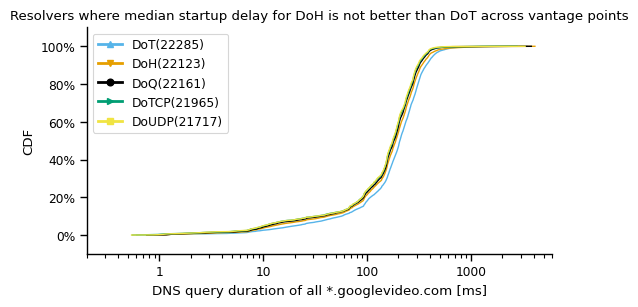

In [1131]:
df_plt = pd.merge(df_query_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[~df_plt.server.isin(running_set_doh)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median startup delay for DoH is not better than DoT across vantage points')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [431]:
resolvers_in_order_from_target_list = ["34.101.136.158", "20.24.25.74", "103.232.207.2", "103.232.207.3", "194.177.23.120", "130.61.24.160", "147.182.195.29", "8.210.148.24", "217.160.68.68", "141.95.140.195", "118.163.170.2", "13.124.186.64", "101.32.27.77", "47.243.57.44", "185.150.117.6", "46.3.242.170", "104.244.72.39", "119.23.190.32", "195.90.213.140", "192.3.127.219", "192.46.231.38", "43.154.154.162", "78.15.98.223", "185.212.57.244", "173.255.211.77", "168.138.53.111", "138.2.86.147", "176.103.130.134", "168.138.163.222", "92.38.241.36", "150.230.99.64", "15.184.189.254", "42.192.89.119", "173.255.211.87", "107.191.51.151", "85.214.195.112", "176.113.83.49", "164.92.237.199", "103.227.141.70", "138.2.79.62", "159.223.136.223", "168.138.169.197", "138.2.89.57", "144.24.175.202", "182.234.39.52", "135.125.236.23", "77.73.71.58", "23.94.120.177", "152.67.223.117", "104.168.11.116", "152.70.189.89", "43.128.20.252", "16.162.25.97", "52.229.189.143", "176.103.134.149", "51.75.162.101", "119.3.92.152", "185.229.251.250", "86.233.218.250", "160.16.123.42", "86.238.66.147", "3.9.43.184", "47.108.131.255", "176.103.134.150", "37.114.32.44", "107.172.103.160", "54.249.180.176", "45.12.19.254", "45.82.178.72", "176.103.134.134", "98.154.23.186", "147.189.137.111", "82.165.167.91", "138.2.91.167", "194.67.121.139", "178.62.207.252", "37.221.215.77", "157.119.101.122", "152.67.9.211", "144.22.147.217", "20.194.29.67", "37.114.32.22", "172.105.16.134", "13.250.108.212", "94.140.14.140", "158.101.139.156", "152.67.204.139", "139.59.106.60", "146.56.176.39", "109.205.178.178", "164.90.199.170", "185.177.218.107", "5.255.103.147", "51.89.26.38", "113.31.103.21", "168.138.36.90", "103.179.44.88", "185.232.170.153", "176.103.130.150", "45.67.32.107", "3.9.78.39", "180.93.137.1", "139.162.142.149", "46.232.251.76", "43.132.147.94", "5.1.84.150", "93.115.24.204", "138.2.84.109", "45.78.51.5", "134.122.42.163", "138.3.219.11", "176.103.130.131", "146.59.32.198", "176.103.130.149", "176.103.134.135", "62.109.2.197", "94.140.14.141", "103.192.236.242", "45.95.203.99", "80.85.136.144", "103.78.123.211", "45.79.151.58", "146.56.137.68", "45.146.255.31", "176.103.130.130", "80.209.236.92", "210.247.245.78", "89.208.251.213", "176.103.134.35", "199.101.171.125", "158.101.149.111", "104.238.154.123", "140.238.36.23", "50.116.59.251", "103.105.98.141", "103.124.95.99", "35.156.129.204", "23.95.209.33", "103.237.147.61", "173.82.243.163", "40.83.113.177", "80.91.176.168", "107.172.30.115", "20.24.142.152", "135.125.181.234", "37.235.49.163", "139.162.70.69", "106.12.119.30", "120.55.44.44", "93.115.24.205", "43.129.73.66", "37.114.32.80", "202.61.207.68", "34.159.55.202", "47.107.121.125", "160.251.96.67", "15.165.113.96", "185.254.18.242", "204.44.76.45", "221.154.186.148", "161.97.116.66", "51.38.176.180", "64.225.50.86", "164.92.136.119", "35.241.97.81", "185.180.206.110", "188.68.45.12", "38.242.12.100", "188.72.209.168", "195.34.241.205", "140.238.10.79", "192.3.73.139", "134.209.81.226", "146.56.184.134", "5.181.76.195", "47.91.45.44", "152.70.232.216", "150.230.103.62", "47.108.238.232", "193.123.252.172", "194.87.102.241", "23.239.29.136", "94.140.14.59", "94.140.14.49", "51.195.116.94", "188.166.237.128", "45.136.245.220", "36.91.73.210", "46.137.195.96", "103.179.45.33", "108.166.219.158", "188.154.194.83", "85.235.65.70", "141.147.45.208", "45.147.54.7", "104.199.26.56", "185.175.57.120", "152.69.204.173", "82.118.227.235", "92.246.84.75", "45.129.2.32", "129.154.226.9", "188.68.59.46", "52.169.109.90", "16.170.150.221", "103.192.236.244", "128.199.115.141", "185.121.25.64", "152.70.54.34", "158.101.178.190", "87.106.168.61", "5.255.100.5", "220.77.190.228", "67.205.154.232", "150.230.197.114", "51.195.103.20", "161.129.152.196", "5.181.48.19", "198.211.40.216", "123.195.161.145", "103.123.108.197", "146.56.112.4", "173.82.68.70", "199.115.228.98", "104.244.79.105", "89.58.10.169", "47.103.26.225", "154.0.173.6", "140.83.39.110", "132.226.232.79", "94.140.15.16", "176.102.36.61", "176.103.130.132", "35.243.221.111", "103.172.17.226", "212.86.101.213", "173.82.151.158", "31.44.0.4", "203.160.55.187", "167.99.37.126", "45.86.182.127", "51.15.75.165", "146.56.177.76", "188.165.4.138", "154.49.211.118", "146.56.160.153", "217.160.27.71", "45.55.104.59", "91.239.27.199", "198.244.209.255", "64.112.126.239", "176.103.134.4", "85.192.48.70", "176.103.134.5", "41.21.230.0", "192.3.253.106", "128.199.66.193", "67.198.131.72", "172.105.101.43", "210.16.120.48", "31.31.202.109", "138.2.72.170", "176.103.130.137", "94.140.15.15", "34.69.170.155", "52.233.72.204", "103.176.79.211", "193.201.126.42", "158.101.69.250", "150.230.147.64", "103.192.236.243", "188.227.86.112", "16.162.44.250", "172.104.183.19", "188.166.209.249", "51.158.105.226", "116.118.44.237", "176.103.134.34", "37.1.195.86", "94.140.14.14", "5.135.233.74", "218.251.80.123", "132.145.83.120", "112.213.39.133", "39.105.150.214", "37.114.32.99", "149.56.45.165", "152.70.70.91", "209.17.118.5", "140.238.42.214", "66.42.74.125", "185.200.34.171", "147.189.137.154", "188.116.27.94", "54.37.203.237", "176.103.130.136", "185.244.173.222", "167.99.236.104", "47.243.165.176", "152.70.210.231", "146.59.226.118", "47.254.64.251", "83.212.102.207", "47.243.237.126", "94.140.14.15", "103.172.17.225", "146.59.23.151", "45.155.39.173", "45.117.81.204", "192.26.105.29", "185.17.3.188", "168.138.50.5"]

In [432]:
df_heatmap_ = pd.DataFrame(index=df_test.vantagePoint.unique(), columns=resolvers_in_order_from_target_list)

In [433]:
for vp in df_test.vantagePoint.unique():
    resolvers_doh_better = doh_better_vp[vp]
    for resolver in resolvers_doh_better:
        df_heatmap_.loc[vp][resolver] = 0
    resolvers_dot_better = dot_better_vp[vp]
    for resolver in resolvers_dot_better:
        df_heatmap_.loc[vp][resolver] = 1
df_heatmap_

,34.101.136.158,20.24.25.74,103.232.207.2,103.232.207.3,194.177.23.120,130.61.24.160,147.182.195.29,8.210.148.24,217.160.68.68,141.95.140.195,...,83.212.102.207,47.243.237.126,94.140.14.15,103.172.17.225,146.59.23.151,45.155.39.173,45.117.81.204,192.26.105.29,185.17.3.188,168.138.50.5
Africa South,0,NaN,0,1,NaN,0,0,0,1,0,...,0,NaN,1,0,0,NaN,0,0,0,0
Asia Pacific Northeast,0,NaN,1,1,NaN,0,0,1,0,0,...,0,NaN,1,0,0,1,0,0,0,1
Asia Pacific Southeast,1,NaN,1,1,NaN,0,0,0,1,1,...,0,NaN,0,1,0,1,0,1,0,0
Europe Central,0,NaN,0,1,NaN,1,1,1,0,1,...,0,NaN,1,0,1,1,0,0,0,1
South America East,1,NaN,0,1,NaN,0,0,1,1,1,...,0,NaN,1,0,0,0,0,0,0,0
US East,1,NaN,1,1,NaN,0,0,1,1,0,...,0,NaN,1,1,1,1,0,0,0,1
US West,0,NaN,0,1,NaN,1,1,0,1,1,...,0,NaN,1,0,0,1,0,0,0,0


In [434]:
df_heatmap_.dropna(axis=1, how='all', inplace=True)

In [435]:
df_heatmap_.fillna(-1, inplace=True)

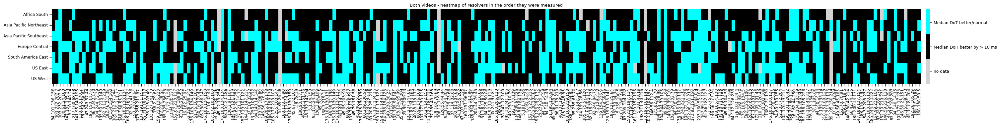

In [451]:
plt.figure(figsize = (40,3))
cmap = mpl.colors.LinearSegmentedColormap.from_list('Custom', ['lightgray', 'black', 'cyan'], 3)

ax = sns.heatmap(df_heatmap_, cmap=cmap, xticklabels=True, yticklabels=True, cbar_kws={"pad": 0.005})
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([-.65, 0, .65])
colorbar.set_ticklabels(['no data', 'Median DoH better by > 10 ms', 'Median DoT better/normal'])

ax.set_title('Both videos - heatmap of resolvers in the order they were measured')
plt.savefig('figures/heatmap-vp-server-dot-and-doh-outlier-based-on-median-startup-delay.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1116]:
len(df_heatmap_.transpose())

257

In [1121]:
df_start_time.domain.unique()

array(['aqz-KE-bpKQ', 'lqiN98z6Dak'], dtype=object)

aqz-KE-bpKQ
all vantage points:
1062
680
1742
intersection across vantage points:
26
5


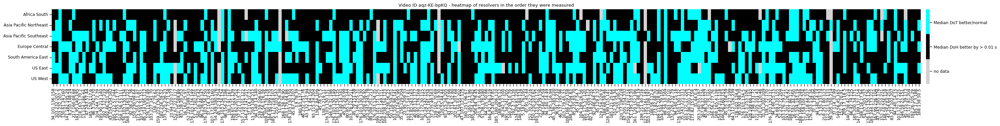

In [452]:
print('aqz-KE-bpKQ')
df_test = df_start_time[df_start_time.domain == 'aqz-KE-bpKQ'].groupby(['vantagePoint','server', 'protocol']).agg(startup_delay=('startup_delay', 'median')).unstack().reset_index()
df_test.columns = [''.join(col).strip().replace('startup_delay', "", 1) for col in df_test.columns.values]
median_doh_better = 0
median_dot_better = 0
doh_better_vp = dict()
dot_better_vp = dict()
for vp in df_test.vantagePoint.unique():
    doh_better_vp[vp] = set()
    dot_better_vp[vp] = set()
for idx, row in df_test.iterrows():
    #if row['DoT'] > row['DoH']:
    if row['DoT']-row['DoH'] > 0.01 :
        median_doh_better = median_doh_better+1
        doh_better_vp[row['vantagePoint']].add(row['server'])
    else:
        median_dot_better = median_dot_better+1
        dot_better_vp[row['vantagePoint']].add(row['server'])
print("all vantage points:")
print(median_doh_better)
print(median_dot_better)
print(median_dot_better+median_doh_better)
running_set_doh = set()
running_set_dot = set()
for vp in df_test.vantagePoint.unique():
    if len(running_set_doh) == 0:
        running_set_doh = doh_better_vp[vp]
        running_set_dot = dot_better_vp[vp]
    else:
        running_set_doh = running_set_doh.intersection(doh_better_vp[vp])
        running_set_dot = running_set_dot.intersection(dot_better_vp[vp])
print("intersection across vantage points:")
print(len(running_set_doh))
print(len(running_set_dot))
df_heatmap_first_video = pd.DataFrame(index=df_test.vantagePoint.unique(), columns=resolvers_in_order_from_target_list)
for vp in df_test.vantagePoint.unique():
    resolvers_doh_better = doh_better_vp[vp]
    for resolver in resolvers_doh_better:
        df_heatmap_first_video.loc[vp][resolver] = 0
    resolvers_dot_better = dot_better_vp[vp]
    for resolver in resolvers_dot_better:
        df_heatmap_first_video.loc[vp][resolver] = 1
df_heatmap_first_video.dropna(axis=1, how='all', inplace=True)
df_heatmap_first_video.fillna(-1, inplace=True)
plt.figure(figsize = (40,3))
cmap = mpl.colors.LinearSegmentedColormap.from_list('Custom', ['lightgray', 'black', 'cyan'], 3)

ax = sns.heatmap(df_heatmap_, cmap=cmap, xticklabels=True, yticklabels=True, cbar_kws={"pad": 0.005})
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([-.65, 0, .65])
colorbar.set_ticklabels(['no data', 'Median DoH better by > 0.01 s', 'Median DoT better/normal'])
ax.set_title('Video ID aqz-KE-bpKQ - heatmap of resolvers in the order they were measured')
plt.savefig('figures/heatmap-vp-server-dot-and-doh-outlier-based-on-median-startup-delay-aqz-KE-bpKQ.pdf', format='pdf', bbox_inches='tight')
plt.show()

lqiN98z6Dak
all vantage points:
977
765
1742
intersection across vantage points:
22
5


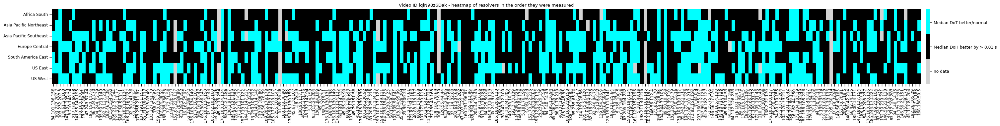

In [454]:
print('lqiN98z6Dak')
df_test = df_start_time[df_start_time.domain == 'lqiN98z6Dak'].groupby(['vantagePoint','server', 'protocol']).agg(startup_delay=('startup_delay', 'median')).unstack().reset_index()
df_test.columns = [''.join(col).strip().replace('startup_delay', "", 1) for col in df_test.columns.values]
median_doh_better = 0
median_dot_better = 0
doh_better_vp = dict()
dot_better_vp = dict()
for vp in df_test.vantagePoint.unique():
    doh_better_vp[vp] = set()
    dot_better_vp[vp] = set()
for idx, row in df_test.iterrows():
    #if row['DoT'] > row['DoH']:
    if row['DoT']-row['DoH'] > 0.01 :
        median_doh_better = median_doh_better+1
        doh_better_vp[row['vantagePoint']].add(row['server'])
    else:
        median_dot_better = median_dot_better+1
        dot_better_vp[row['vantagePoint']].add(row['server'])
print("all vantage points:")
print(median_doh_better)
print(median_dot_better)
print(median_dot_better+median_doh_better)
running_set_doh = set()
running_set_dot = set()
for vp in df_test.vantagePoint.unique():
    if len(running_set_doh) == 0:
        running_set_doh = doh_better_vp[vp]
        running_set_dot = dot_better_vp[vp]
    else:
        running_set_doh = running_set_doh.intersection(doh_better_vp[vp])
        running_set_dot = running_set_dot.intersection(dot_better_vp[vp])
print("intersection across vantage points:")
print(len(running_set_doh))
print(len(running_set_dot))
df_heatmap_first_video = pd.DataFrame(index=df_test.vantagePoint.unique(), columns=resolvers_in_order_from_target_list)
for vp in df_test.vantagePoint.unique():
    resolvers_doh_better = doh_better_vp[vp]
    for resolver in resolvers_doh_better:
        df_heatmap_first_video.loc[vp][resolver] = 0
    resolvers_dot_better = dot_better_vp[vp]
    for resolver in resolvers_dot_better:
        df_heatmap_first_video.loc[vp][resolver] = 1
df_heatmap_first_video.dropna(axis=1, how='all', inplace=True)
df_heatmap_first_video.fillna(-1, inplace=True)
plt.figure(figsize = (40,3))
cmap = mpl.colors.LinearSegmentedColormap.from_list('Custom', ['lightgray', 'black', 'cyan'], 3)

ax = sns.heatmap(df_heatmap_, cmap=cmap, xticklabels=True, yticklabels=True, cbar_kws={"pad": 0.005})
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([-.65, 0, .65])
colorbar.set_ticklabels(['no data', 'Median DoH better by > 0.01 s', 'Median DoT better/normal'])
ax.set_title('Video ID lqiN98z6Dak - heatmap of resolvers in the order they were measured')
plt.savefig('figures/heatmap-vp-server-dot-and-doh-outlier-based-on-median-startup-delay-lqiN98z6Dak.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1133]:
df_query_googlevideo_all

,msm_id,metric,metric_type,duration,base,metric_start,metric_end,protocol,domain
34,17915357-f2e4-81b4-acf7-b71255703ed8,DoT query duration for [;rr1---sn-woc7ln7y.goo...,query,424.240524,1.0,2022-04-18 00:00:25.013,2022-04-18 00:00:25.437,DoT,rr1---sn-woc7ln7y.googlevideo.com
66,8297db7d-70e2-96ab-3824-ef58929e52d6,DoH query (and likely handshake) duration for ...,lazy-init-handshake-and-query,412.037280,1.0,2022-04-18 00:00:55.250,2022-04-18 00:00:55.662,DoH,rr1---sn-woc7ln7y.googlevideo.com
100,fb06c88b-3fed-edba-5b29-27e4972a583a,DoQ query duration for [;rr1---sn-woc7ln7y.goo...,query,404.549131,1.0,2022-04-18 00:01:25.145,2022-04-18 00:01:25.550,DoQ,rr1---sn-woc7ln7y.googlevideo.com
147,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,DoTCP query duration for [;rr1---sn-woc7ln7y.g...,query,406.087791,1.0,2022-04-18 00:01:56.358,2022-04-18 00:01:56.764,DoTCP,rr1---sn-woc7ln7y.googlevideo.com
195,d94c98d2-b7ae-30cf-1b77-0d03406c2669,DoUDP query duration for [;rr1---sn-woc7ln7y.g...,query,406.127865,1.0,2022-04-18 00:02:24.437,2022-04-18 00:02:24.843,DoUDP,rr1---sn-woc7ln7y.googlevideo.com
234,56791d63-e17d-3cab-230c-54fe853c1f61,DoT query duration for [;rr4---sn-woc7ln7y.goo...,query,424.309729,1.0,2022-04-18 00:02:54.653,2022-04-18 00:02:55.077,DoT,rr4---sn-woc7ln7y.googlevideo.com
266,cbdcf805-b233-cc76-2836-09a1c01d347a,DoH query (and likely handshake) duration for ...,lazy-init-handshake-and-query,406.904727,1.0,2022-04-18 00:03:24.684,2022-04-18 00:03:25.091,DoH,rr4---sn-woc7ln7y.googlevideo.com
300,ce2a8412-3b21-5bc7-50a8-7ab8d74df195,DoQ query duration for [;rr4---sn-woc7ln7y.goo...,query,404.669421,1.0,2022-04-18 00:03:55.018,2022-04-18 00:03:55.423,DoQ,rr4---sn-woc7ln7y.googlevideo.com
347,92a81b81-1f99-7a2b-f22b-62682d1299d0,DoTCP query duration for [;rr4---sn-woc7ln7y.g...,query,405.190689,1.0,2022-04-18 00:04:26.547,2022-04-18 00:04:26.953,DoTCP,rr4---sn-woc7ln7y.googlevideo.com
395,352f07a3-9739-eeda-febf-5d3000a3ae5b,DoUDP query duration for [;rr4---sn-woc7ln7y.g...,query,406.737304,1.0,2022-04-18 00:04:54.645,2022-04-18 00:04:55.052,DoUDP,rr4---sn-woc7ln7y.googlevideo.com


all vantage points:
1410
332
1742
intersection across vantage points:
118
4
118


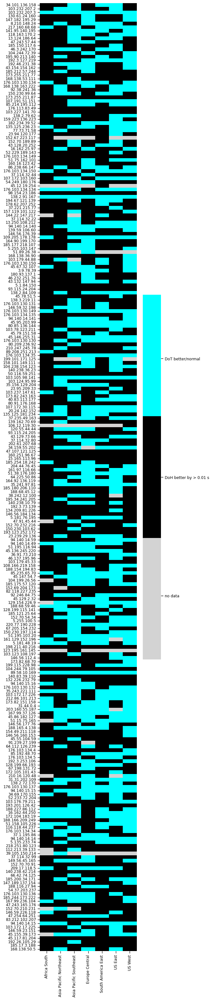

In [1180]:

df_test = pd.merge(df_query_googlevideo_all, measurements[['msm_id', 'vantagePoint', 'server']], on='msm_id').groupby(['vantagePoint','server', 'protocol']).agg(duration=('duration', 'median')).unstack().reset_index()
df_test.columns = [''.join(col).strip().replace('duration', "", 1) for col in df_test.columns.values]
median_doh_better = 0
median_dot_better = 0
doh_better_vp = dict()
dot_better_vp = dict()
for vp in df_test.vantagePoint.unique():
    doh_better_vp[vp] = set()
    dot_better_vp[vp] = set()
for idx, row in df_test.iterrows():
    #if row['DoT'] > row['DoH']:
    if row['DoT']-row['DoH'] > 0.01 :
        median_doh_better = median_doh_better+1
        doh_better_vp[row['vantagePoint']].add(row['server'])
    else:
        median_dot_better = median_dot_better+1
        dot_better_vp[row['vantagePoint']].add(row['server'])
print("all vantage points:")
print(median_doh_better)
print(median_dot_better)
print(median_dot_better+median_doh_better)
running_set_doh = set()
running_set_dot = set()
for vp in df_test.vantagePoint.unique():
    if len(running_set_doh) == 0:
        running_set_doh = doh_better_vp[vp]
    else:
        running_set_doh = running_set_doh.intersection(doh_better_vp[vp])
    if len(running_set_dot) == 0:
        running_set_dot = dot_better_vp[vp]
    else:
        running_set_dot = running_set_dot.intersection(dot_better_vp[vp])
print("intersection across vantage points:")
print(len(running_set_doh))
print(len(running_set_dot))
running_set_doh_across = set()
for server in df_test.server.unique():
    vps_doh_better = []
    for vp in df_test.vantagePoint.unique():
        dot_better_tmp = dot_better_vp[vp]
        doh_better_tmp = doh_better_vp[vp]
        if server in doh_better_tmp:
            vps_doh_better.append(vp)
    if len(vps_doh_better) == 7:
        running_set_doh_across.add(server)
print(len(running_set_doh_across))
df_heatmap_first_video = pd.DataFrame(index=df_test.vantagePoint.unique(), columns=resolvers_in_order_from_target_list)
for vp in df_test.vantagePoint.unique():
    resolvers_doh_better = doh_better_vp[vp]
    for resolver in resolvers_doh_better:
        df_heatmap_first_video.loc[vp][resolver] = 0
    resolvers_dot_better = dot_better_vp[vp]
    for resolver in resolvers_dot_better:
        df_heatmap_first_video.loc[vp][resolver] = 1
df_heatmap_first_video.dropna(axis=1, how='all', inplace=True)
df_heatmap_first_video.fillna(-1, inplace=True)
plt.figure(figsize = (5,40))
cmap = mpl.colors.LinearSegmentedColormap.from_list('Custom', ['lightgray', 'black', 'cyan'], 3)

ax = sns.heatmap(df_heatmap_.transpose(), cmap=cmap, xticklabels=True, yticklabels=True)
colorbar = ax.collections[0].colorbar
colorbar.set_ticks([-.65, 0, .65])
colorbar.set_ticklabels(['no data', 'DoH better by > 0.01 s', 'DoT better/normal'])
#plt.savefig('figures/heatmap-vp-server-dot-and-doh-outlier.pdf', format='pdf', bbox_inches='tight')

DoT query
count    13204.000000
mean       209.454499
std        136.061202
min          0.604537
10%         49.444894
20%         96.348608
25%        121.474143
30%        144.305223
40%        171.517700
50%        199.061070
60%        225.755701
70%        258.492601
75%        279.803080
80%        300.113396
90%        360.302783
100%      2314.246701
max       2314.246701
Name: duration, dtype: float64
DoH lazy-init-handshake-and-query
count    13044.000000
mean       203.726205
std        191.316379
min          0.757622
10%         40.731443
20%         92.695391
25%        108.458565
30%        135.265710
40%        160.589511
50%        187.510663
60%        210.057624
70%        240.694993
75%        261.359222
80%        281.098967
90%        337.384516
100%      4124.334013
max       4124.334013
Name: duration, dtype: float64
DoQ query
count    13164.000000
mean       183.494609
std        113.424952
min          0.753320
10%         38.476211
20%         89.624347
25% 

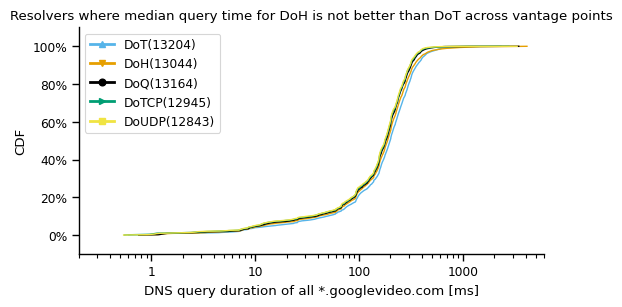

In [1138]:
df_plt = pd.merge(df_query_googlevideo_all, measurements[['msm_id', 'server']], on='msm_id')
df_plt = df_plt[~df_plt.server.isin(running_set_doh)].copy()
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_plt['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = 1
mrksize = 0
log=True
for col_val_ in legend_labels:
    for metric_type in df_plt.metric_type.unique():
        df_tmp = df_plt[(df_plt.protocol == col_val_) & (df_plt.metric_type == metric_type)]
        if len(df_tmp['duration']) == 0:
            continue
        sample_size[col_val_].append(str(len(df_tmp['duration'])))
        print(col_val_ + " " + metric_type)
        print(df_tmp['duration'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))

        dfplt = make_cdf(df_tmp['duration'])
        dfplt.plot(ax=ax, label=col_val_+" "+metric_type, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')


ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Resolvers where median query time for DoH is not better than DoT across vantage points')

ax.set_xlabel('DNS query duration of all *.googlevideo.com [ms]')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(0.2,6000)



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

#if log:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-query-all-vps-all-rlsv-all-googlevideo-median-startup-delay-filter.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoT
count    12187.000000
mean         0.776613
std          0.335902
min          0.238000
10%          0.410560
20%          0.502020
25%          0.550150
30%          0.591280
40%          0.661000
50%          0.722600
60%          0.791800
70%          0.867220
75%          0.913450
80%          0.972700
90%          1.183300
100%         3.353700
max          3.353700
Name: startup_delay, dtype: float64
DoH
count    12083.00000
mean         0.76528
std          0.35757
min          0.23680
10%          0.40602
20%          0.50180
25%          0.54540
30%          0.58236
40%          0.64744
50%          0.70970
60%          0.77322
70%          0.84530
75%          0.88625
80%          0.93860
90%          1.12746
100%         4.63340
max          4.63340
Name: startup_delay, dtype: float64
DoQ
count    12216.000000
mean         0.740653
std          0.310161
min          0.242500
10%          0.399000
20%          0.494100
25%          0.538200
30%          0.574800
40%      

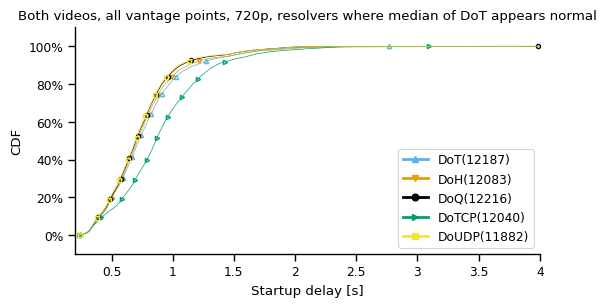

In [1141]:
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
legend_labels = df_start_time['protocol'].unique()
for legend_label in legend_labels:
    sample_size[legend_label] = []
lnwidth = .5
mrksize = 3
log=False
for col_val_ in legend_labels:
    sample_size[col_val_].append(str(len(df_start_time[(df_start_time['protocol'] == col_val_) & (~df_start_time.server.isin(running_set_doh))]['startup_delay'])))
    if len(df_start_time[(df_start_time['protocol'] == col_val_) & (~df_start_time.server.isin(running_set_doh))]['startup_delay']) == 0:
        continue
    cdf = Cdf.MakeCdfFromList(df_start_time[(df_start_time['protocol'] == col_val_) & (~df_start_time.server.isin(running_set_doh))]['startup_delay'])
    print(col_val_)
    print(df_start_time[(df_start_time['protocol'] == col_val_) & (~df_start_time.server.isin(running_set_doh))]['startup_delay'].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    ax.plot(cdf.xs, cdf.ps, label=col_val_,
                linestyle='-', linewidth=lnwidth, 
                markersize=mrksize, fillstyle='none', 
                markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
                color=colors[col_val_], marker=markers[col_val_]
            )
    #dfplt = make_cdf(df_tmp[df_tmp[col_name_] == col_val_][col_metric_])
    #dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], lw=lnwidth, logx=log)

    ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

    ax.spines['right'].set_color('none')
    ax.spines['top'].set_color('none')
    ax.yaxis.set_ticks_position('left')
    ax.xaxis.set_ticks_position('bottom')
    ax.spines['bottom'].set_position(('axes', -0.0))
    ax.spines['left'].set_position(('axes', -0.0))
    if log:
        ax.set_xscale('log')


    ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
    ax.tick_params(axis='x', which='minor', labelsize=6)
    ax.xaxis.set_tick_params(labelbottom=True, which='both')


    ax.set_title('Both videos, all vantage points, 720p, resolvers where median of DoT appears normal')

    ax.set_xlabel('Startup delay [s]')

    ax.set_ylabel("CDF")
    ax.set_ylim(-0.1,1.1)
    ax.set_xlim([0.2,4])



legend_elements = [mpl.lines.Line2D([0], [0], color=colors[legend_item], lw=2, label=legend_item+"("+",".join(sample_size[legend_item])+")", marker=markers[legend_item]) for legend_item in legend_labels]

plt.gca().legend(handles=legend_elements, loc='best')#loc='center', ncol=2, bbox_to_anchor=(0.5, -.5))

#if log:
#    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-dot-better-than-doh-log.pdf', format='pdf', bbox_inches='tight')
#else:
#    fig.savefig('figures/cdf-startup-delay-both-videos-all-vps-dot-better-than-doh.pdf', format='pdf', bbox_inches='tight')
plt.show()

In [1140]:
running_set_doh

{'103.123.108.197',
 '103.124.95.99',
 '103.172.17.225',
 '103.172.17.226',
 '103.179.45.33',
 '103.227.141.70',
 '103.232.207.2',
 '104.238.154.123',
 '104.244.72.39',
 '104.244.79.105',
 '109.205.178.178',
 '116.118.44.237',
 '128.199.66.193',
 '13.124.186.64',
 '130.61.24.160',
 '134.209.81.226',
 '135.125.181.234',
 '138.3.219.11',
 '139.162.70.69',
 '140.238.10.79',
 '140.238.36.23',
 '140.238.42.214',
 '140.83.39.110',
 '146.56.112.4',
 '146.56.160.153',
 '146.56.176.39',
 '146.56.177.76',
 '146.59.226.118',
 '147.189.137.154',
 '15.165.113.96',
 '150.230.103.62',
 '150.230.197.114',
 '150.230.99.64',
 '152.70.189.89',
 '152.70.54.34',
 '152.70.70.91',
 '154.49.211.118',
 '158.101.149.111',
 '160.251.96.67',
 '161.97.116.66',
 '164.90.199.170',
 '164.92.136.119',
 '167.99.236.104',
 '168.138.36.90',
 '168.138.50.5',
 '172.105.101.43',
 '173.255.211.77',
 '173.255.211.87',
 '173.82.243.163',
 '173.82.68.70',
 '176.103.134.149',
 '178.62.207.252',
 '185.121.25.64',
 '185.150.117.6'

In [1143]:
measurements[measurements.server.isin(running_set_doh)].server.nunique()

118

In [1144]:
measurements[~measurements.server.isin(running_set_doh)].server.nunique()

139

In [1146]:
df_asn_dot_better.index.nunique()

93

In [1147]:
df_asn_doh_better.index.nunique()

164

In [1167]:

df_asn_resolvers = pd.concat([df_asn_dot_better, df_asn_doh_better]).reset_index()

In [1168]:
df_asn_resolvers.index.nunique()

257

In [1169]:
df_asn_resolvers.rename(columns=lambda x: x.replace('index', 'server'), inplace=True)

In [1170]:
df_asn_resolvers[df_asn_resolvers.server.isin(running_set_doh)].asn.value_counts()

[(31898, 'ORACLE-BMC-31898')]                                                     20
[(14061, 'DIGITALOCEAN-ASN')]                                                      9
[(63949, 'LINODE-AP Linode')]                                                      7
[(16509, 'AMAZON-02')]                                                             5
[(197540, 'NETCUP-AS - netcup GmbH')]                                              5
[(49581, 'FERDINANDZINK - Ferdinand Zink trading as Tube-Hosting')]                4
[(16276, 'OVH - OVH SAS')]                                                         4
[(25820, 'IT7NET')]                                                                3
[(36352, 'AS-COLOCROSSING')]                                                       3
[(16125, 'CHERRYSERVERS1-AS - UAB Cherry Servers')]                                3
[(45102, 'ALIBABA-CN-NET Alibaba US Technology Co.')]                              3
[(35916, 'MULTA-ASN1')]                                          

In [1171]:
df_asn_resolvers[~df_asn_resolvers.server.isin(running_set_doh)].asn.value_counts()

[(199274, 'MNGTNET - Serveroid, LLC')]                                            16
[(31898, 'ORACLE-BMC-31898')]                                                     15
[(16276, 'OVH - OVH SAS')]                                                        11
[(212772, 'ADGUARD - AdGuard Software Limited')]                                   8
[(14061, 'DIGITALOCEAN-ASN')]                                                      6
[(36352, 'AS-COLOCROSSING')]                                                       4
[(16509, 'AMAZON-02')]                                                             4
[(132203, 'TENCENT-NET-AP-CN Tencent Building')]                                   4
[(396982, 'GOOGLE-CLOUD-PLATFORM')]                                                3
[(197540, 'NETCUP-AS - netcup GmbH')]                                              2
[(197695, 'AS-REGRU - "Domain names registrar REG.RU", Ltd')]                      2
[(15169, 'GOOGLE')]                                              

In [1173]:
for idx_rslv in range(len(resolvers_in_order_from_target_list)):
    rslv = resolvers_in_order_from_target_list[idx_rslv]
    if rslv in running_set_doh:
        print(str(idx_rslv)+', '+rslv)

0, 34.101.136.158
2, 103.232.207.2
5, 130.61.24.160
7, 8.210.148.24
11, 13.124.186.64
14, 185.150.117.6
16, 104.244.72.39
19, 192.3.127.219
23, 185.212.57.244
24, 173.255.211.77
29, 92.38.241.36
30, 150.230.99.64
33, 173.255.211.87
38, 103.227.141.70
50, 152.70.189.89
53, 52.229.189.143
54, 176.103.134.149
64, 37.114.32.44
66, 54.249.180.176
70, 98.154.23.186
75, 178.62.207.252
76, 37.221.215.77
81, 37.114.32.22
88, 146.56.176.39
89, 109.205.178.178
90, 164.90.199.170
92, 5.255.103.147
95, 168.138.36.90
100, 3.9.78.39
103, 46.232.251.76
105, 5.1.84.150
106, 93.115.24.204
108, 45.78.51.5
110, 138.3.219.11
121, 45.79.151.58
123, 45.146.255.31
125, 80.209.236.92
127, 89.208.251.213
130, 158.101.149.111
131, 104.238.154.123
132, 140.238.36.23
133, 50.116.59.251
135, 103.124.95.99
137, 23.95.209.33
139, 173.82.243.163
141, 80.91.176.168
144, 135.125.181.234
146, 139.162.70.69
149, 93.115.24.205
151, 37.114.32.80
152, 202.61.207.68
154, 47.107.121.125
155, 160.251.96.67
156, 15.165.113.96
16

In [1174]:
df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoQ')].groupby('msm_id').size().value_counts(normalize=True)

1    1.0
dtype: float64

In [1175]:
df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT') & ].groupby('msm_id').size().value_counts(normalize=True)

3    0.767615
4    0.097546
2    0.096101
5    0.021601
1    0.016286
6    0.000468
7    0.000340
8    0.000043
dtype: float64

In [649]:
df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoTCP')].groupby('msm_id').size().value_counts(normalize=True)

10    0.856992
11    0.074119
12    0.040118
4     0.011263
13    0.009956
2     0.005400
14    0.000970
3     0.000591
1     0.000211
18    0.000169
16    0.000127
19    0.000042
15    0.000042
dtype: float64

In [1176]:
df_dns_perf_metrics[(df_dns_perf_metrics.metric_type == 'handshake') & (df_dns_perf_metrics.protocol == 'DoT')]

,msm_id,metric,metric_type,duration,base,metric_start,metric_end,protocol,domain
15,17915357-f2e4-81b4-acf7-b71255703ed8,DoT TLS handshake duration from Apr 18 00:00:1...,handshake,410.623496,1.0,2022-04-18 00:00:15.756,2022-04-18 00:00:16.166,DoT,NaN
22,17915357-f2e4-81b4-acf7-b71255703ed8,DoT TLS handshake duration from Apr 18 00:00:2...,handshake,404.908345,1.0,2022-04-18 00:00:21.467,2022-04-18 00:00:21.872,DoT,NaN
23,17915357-f2e4-81b4-acf7-b71255703ed8,DoT TLS handshake duration from Apr 18 00:00:2...,handshake,406.867620,1.0,2022-04-18 00:00:21.499,2022-04-18 00:00:21.906,DoT,NaN
215,56791d63-e17d-3cab-230c-54fe853c1f61,DoT TLS handshake duration from Apr 18 00:02:4...,handshake,407.725031,1.0,2022-04-18 00:02:45.401,2022-04-18 00:02:45.808,DoT,NaN
222,56791d63-e17d-3cab-230c-54fe853c1f61,DoT TLS handshake duration from Apr 18 00:02:5...,handshake,404.597207,1.0,2022-04-18 00:02:51.113,2022-04-18 00:02:51.517,DoT,NaN
223,56791d63-e17d-3cab-230c-54fe853c1f61,DoT TLS handshake duration from Apr 18 00:02:5...,handshake,403.605647,1.0,2022-04-18 00:02:51.141,2022-04-18 00:02:51.544,DoT,NaN
415,c7b739f5-eb61-8ade-2446-0c01e5ec5bc9,DoT TLS handshake duration from Apr 18 00:05:2...,handshake,290.438900,1.0,2022-04-18 00:05:23.929,2022-04-18 00:05:24.220,DoT,NaN
422,c7b739f5-eb61-8ade-2446-0c01e5ec5bc9,DoT TLS handshake duration from Apr 18 00:05:2...,handshake,287.202270,1.0,2022-04-18 00:05:27.849,2022-04-18 00:05:28.136,DoT,NaN
423,c7b739f5-eb61-8ade-2446-0c01e5ec5bc9,DoT TLS handshake duration from Apr 18 00:05:2...,handshake,286.665995,1.0,2022-04-18 00:05:27.878,2022-04-18 00:05:28.165,DoT,NaN
615,0b5e43c3-1cfa-7ea9-8126-510d9e6f79a1,DoT TLS handshake duration from Apr 18 00:07:3...,handshake,290.984612,1.0,2022-04-18 00:07:33.318,2022-04-18 00:07:33.609,DoT,NaN


In [273]:
df_web_performance_metrics.head()

,msm_id,loadEventStart,py_time,js_time,resource_time_origin,protocol,server,domain,vantagePoint,timestamp,suggested_quality,player_width,player_height,start_time,play_time,video_ids,cacheWarming,error,player_dimensions
0,17915357-f2e4-81b4-acf7-b71255703ed8,7585.000000,1650240030862687634,1.650240e+12,1.650240e+12,DoT,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:15.296301,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
1,8297db7d-70e2-96ab-3824-ef58929e52d6,7621.100000,1650240061086062376,1.650240e+12,1.650240e+12,DoH,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:00:45.492315,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
2,fb06c88b-3fed-edba-5b29-27e4972a583a,7210.700001,1650240090999008606,1.650240e+12,1.650240e+12,DoQ,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:15.785073,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
3,1d2e67cb-91c8-112f-f2eb-1d9f3db0d4b2,7907.500000,1650240121703082035,1.650240e+12,1.650240e+12,DoTCP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:01:45.926083,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720
4,d94c98d2-b7ae-30cf-1b77-0d03406c2669,6790.100000,1650240150290185710,1.650240e+12,1.650240e+12,DoUDP,34.101.136.158,aqz-KE-bpKQ,Africa South,2022-04-18 00:02:15.537097,auto,1280,720,0,5,aqz-KE-bpKQ,0,,1280x720


In [381]:
df_diff_plt_udp = pd.DataFrame(columns = ['DoQ', 'DoT', 'DoH', 'DoTCP', 'vantagePoint', 'server', 'domain'])
for vp in df_web_performance_metrics.vantagePoint.unique():
    df_vp = df_web_performance_metrics[df_web_performance_metrics['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_udp = df_domain[df_domain['protocol'] == 'DoUDP'].copy()
            median_udp = df_udp['loadEventStart'].median()
            if median_udp is not np.nan:
                next_df_row = []
                for protocol in ['DoQ', 'DoT', 'DoH', 'DoTCP']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['loadEventStart'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_udp/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_plt_udp.columns)
                df_diff_plt_udp = df_diff_plt_udp.append(next_df_series, ignore_index=True)

In [382]:
df_diff_plt_https = pd.DataFrame(columns = ['DoQ', 'DoT', 'vantagePoint', 'server', 'domain'])
for vp in df_web_performance_metrics.vantagePoint.unique():
    df_vp = df_web_performance_metrics[df_web_performance_metrics['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_doh = df_domain[df_domain['protocol'] == 'DoH'].copy()
            median_doh = df_doh['loadEventStart'].median()
            if median_doh is not np.nan:
                next_df_row = []
                for protocol in ['DoQ', 'DoT']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['loadEventStart'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_doh/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_plt_https.columns)
                df_diff_plt_https = df_diff_plt_https.append(next_df_series, ignore_index=True)

In [383]:
df_diff_plt_quic = pd.DataFrame(columns = ['DoH', 'DoUDP', 'vantagePoint', 'server', 'domain'])
for vp in df_web_performance_metrics.vantagePoint.unique():
    df_vp = df_web_performance_metrics[df_web_performance_metrics['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_doq = df_domain[df_domain['protocol'] == 'DoQ'].copy()
            median_doq = df_doq['loadEventStart'].median()
            if median_doq is not np.nan:
                next_df_row = []
                for protocol in ['DoH', 'DoUDP']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['loadEventStart'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_doq/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_plt_quic.columns)
                df_diff_plt_quic = df_diff_plt_quic.append(next_df_series, ignore_index=True)

In [384]:
df_diff_startup_delay_udp = pd.DataFrame(columns = ['DoQ', 'DoT', 'DoH', 'DoTCP', 'vantagePoint', 'server', 'domain'])
for vp in df_start_time.vantagePoint.unique():
    df_vp = df_start_time[df_start_time['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_udp = df_domain[df_domain['protocol'] == 'DoUDP'].copy()
            median_udp = df_udp['startup_delay'].median()
            if median_udp is not np.nan:
                next_df_row = []
                for protocol in ['DoQ', 'DoT', 'DoH', 'DoTCP']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['startup_delay'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_udp/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_startup_delay_udp.columns)
                df_diff_startup_delay_udp = df_diff_startup_delay_udp.append(next_df_series, ignore_index=True)

In [385]:
df_diff_startup_delay_https = pd.DataFrame(columns = ['DoQ', 'DoT','vantagePoint', 'server', 'domain'])
for vp in df_start_time.vantagePoint.unique():
    df_vp = df_start_time[df_start_time['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_doh = df_domain[df_domain['protocol'] == 'DoH'].copy()
            median_doh = df_doh['startup_delay'].median()
            if median_doh is not np.nan:
                next_df_row = []
                for protocol in ['DoQ', 'DoT']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['startup_delay'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_doh/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_startup_delay_https.columns)
                df_diff_startup_delay_https = df_diff_startup_delay_https.append(next_df_series, ignore_index=True)

In [386]:
df_diff_startup_delay_quic = pd.DataFrame(columns = ['DoH', 'DoUDP','vantagePoint', 'server', 'domain'])
for vp in df_start_time.vantagePoint.unique():
    df_vp = df_start_time[df_start_time['vantagePoint'] == vp].copy()
    for server in df_vp['server'].unique():
        df_server = df_vp[df_vp['server'] == server].copy()
        for domain in df_server.domain.unique():
            df_domain = df_server[df_server['domain'] == domain].copy()
            df_doq = df_domain[df_domain['protocol'] == 'DoQ'].copy()
            median_doq = df_doq['startup_delay'].median()
            if median_doq is not np.nan:
                next_df_row = []
                for protocol in ['DoH', 'DoUDP']:
                    df_protocol = df_domain[df_domain['protocol'] == protocol].copy()
                    median_protocol = df_protocol['startup_delay'].median()
                    #minimize floating point errors I guess?
                    increase = (median_protocol/(median_doq/100))-100
                    if increase is np.nan:
                        increase = 0
                    next_df_row.append(increase)
                next_df_row.append(vp)
                next_df_row.append(server)
                next_df_row.append(domain)
                next_df_series = pd.Series(next_df_row, index = df_diff_startup_delay_quic.columns)
                df_diff_startup_delay_quic = df_diff_startup_delay_quic.append(next_df_series, ignore_index=True)

DoQ
count    3389.000000
mean        5.972861
std         6.973705
min       -61.997653
10%         1.506762
20%         3.356723
25%         4.021082
30%         4.475915
40%         5.183062
50%         5.709151
60%         6.291096
70%         7.061027
75%         7.687824
80%         8.551236
90%        11.254363
100%      148.546259
max       148.546259
Name: DoQ, dtype: float64
DoH
count    3382.000000
mean       12.438023
std        14.016438
min       -66.156258
10%         4.698209
20%         7.954594
25%         8.807262
30%         9.571752
40%        10.593650
50%        11.290280
60%        12.151793
70%        13.253953
75%        14.144560
80%        15.377255
90%        20.612226
100%      273.651439
max       273.651439
Name: DoH, dtype: float64
DoTCP
count    3396.000000
mean       12.178108
std         8.498036
min       -59.425924
10%         4.490726
20%         7.977227
25%         8.930952
30%         9.630015
40%        10.639583
50%        11.482629
60%       

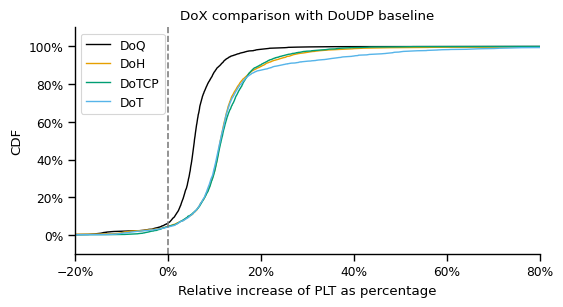

In [387]:
df_tmp = df_diff_plt_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ', 'DoH', 'DoTCP', 'DoT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    3441.000000
mean       -5.025732
std         8.784635
min       -73.123070
10%        -9.755064
20%        -7.486966
25%        -6.801454
30%        -6.237107
40%        -5.625125
50%        -5.093612
60%        -4.599261
70%        -3.955823
75%        -3.472432
80%        -2.821212
90%        -0.959461
100%      203.146895
max       203.146895
Name: DoQ, dtype: float64
DoT
count    3445.000000
mean        2.974895
std        32.982947
min       -71.832024
10%        -3.738897
20%        -1.713786
25%        -1.233211
30%        -0.876806
40%        -0.332826
50%         0.120399
60%         0.636895
70%         1.404690
75%         2.054438
80%         3.065947
90%         8.408718
100%     1176.664237
max      1176.664237
Name: DoT, dtype: float64


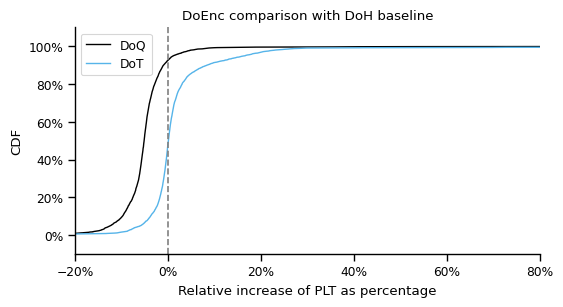

In [388]:
df_tmp = df_diff_plt_https
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ', 'DoT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoEnc comparison with DoH baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doh-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doh-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoH
count    3441.000000
mean        6.054270
std        11.370800
min       -67.012692
10%         0.968756
20%         2.903115
25%         3.597348
30%         4.118754
40%         4.820991
50%         5.366986
60%         5.960405
70%         6.651999
75%         7.297812
80%         8.092877
90%        10.809541
100%      272.066310
max       272.066310
Name: DoH, dtype: float64
DoUDP
count    3389.000000
mean       -5.236532
std         6.907462
min       -59.766041
10%       -10.115884
20%        -7.877604
25%        -7.138991
30%        -6.595329
40%        -5.918742
50%        -5.400810
60%        -4.927658
70%        -4.284159
75%        -3.865642
80%        -3.247707
90%        -1.484396
100%      163.141645
max       163.141645
Name: DoUDP, dtype: float64


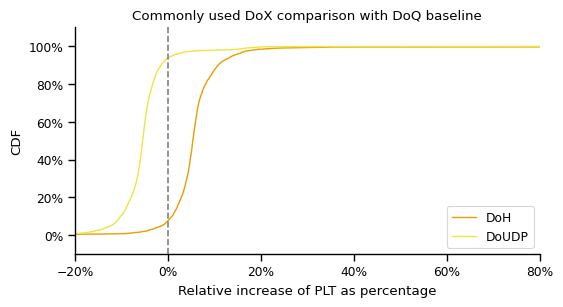

In [389]:
df_tmp = df_diff_plt_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoH', 'DoUDP']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Commonly used DoX comparison with DoQ baseline')

ax.set_xlabel('Relative increase of PLT as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/plt-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/plt-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    3389.000000
mean        1.335681
std         8.624678
min       -76.464584
10%        -6.205705
20%        -3.209955
25%        -2.268581
30%        -1.555972
40%        -0.426032
50%         0.655702
60%         1.808772
70%         3.161004
75%         3.990717
80%         5.063464
90%         9.588732
100%       88.194278
max        88.194278
Name: DoQ, dtype: float64
DoH
count    3382.000000
mean        4.388784
std        21.429976
min       -72.850083
10%        -5.538441
20%        -2.579707
25%        -1.664464
30%        -0.992212
40%         0.329117
50%         1.550953
60%         2.993974
70%         4.809080
75%         6.087812
80%         7.782560
90%        14.503641
100%      793.502867
max       793.502867
Name: DoH, dtype: float64
DoTCP
count    3396.000000
mean       22.337997
std        13.298155
min       -70.365744
10%         4.476184
20%        12.523097
25%        15.377550
30%        17.603393
40%        21.016855
50%        23.719432
60%       

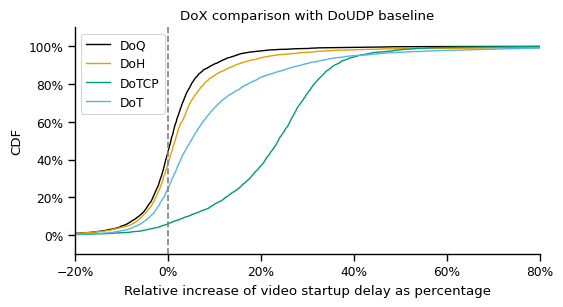

In [390]:
df_tmp = df_diff_startup_delay_udp
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ', 'DoH', 'DoTCP', 'DoT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')

ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoX comparison with DoUDP baseline')

ax.set_xlabel('Relative increase of video startup delay as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/startup-delay-rel-inc-doudp-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/startup-delay-rel-inc-doudp-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoQ
count    3441.000000
mean       -1.652329
std        10.379547
min       -86.907419
10%       -11.220987
20%        -6.442404
25%        -4.993950
30%        -3.874357
40%        -2.176929
50%        -0.865849
60%         0.455284
70%         1.730977
75%         2.551402
80%         3.356667
90%         6.554153
100%       92.117839
max        92.117839
Name: DoQ, dtype: float64
DoT
count    3445.000000
mean        6.126768
std        15.108774
min       -87.565909
10%        -4.642338
20%        -1.758111
25%        -0.785616
30%        -0.094893
40%         1.372314
50%         3.026650
60%         4.925841
70%         7.134847
75%         9.039096
80%        11.570473
90%        21.252072
100%      139.889829
max       139.889829
Name: DoT, dtype: float64


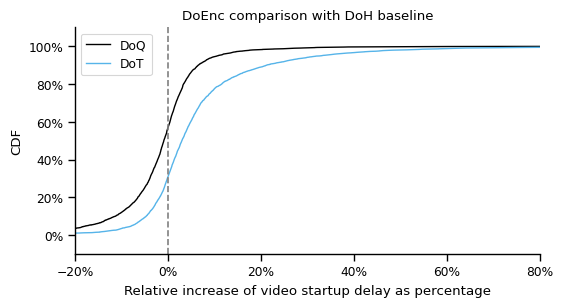

In [391]:
df_tmp = df_diff_startup_delay_https
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoQ', 'DoT']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('DoEnc comparison with DoH baseline')

ax.set_xlabel('Relative increase of video startup delay as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/startup-delay-rel-inc-doh-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/startup-delay-rel-inc-doh-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()

DoH
count    3441.000000
mean        3.328893
std        19.909231
min       -47.948613
10%        -6.151007
20%        -3.247654
25%        -2.487925
30%        -1.701524
40%        -0.453220
50%         0.873412
60%         2.225374
70%         4.030514
75%         5.256454
80%         6.886030
90%        12.639234
100%      663.791332
max       663.791332
Name: DoH, dtype: float64
DoUDP
count    3389.000000
mean       -0.589729
std         9.847675
min       -46.863422
10%        -8.749743
20%        -4.819433
25%        -3.837570
30%        -3.064146
40%        -1.776637
50%        -0.651431
60%         0.427855
70%         1.580565
75%         2.321240
80%         3.316410
90%         6.616293
100%      324.891568
max       324.891568
Name: DoUDP, dtype: float64


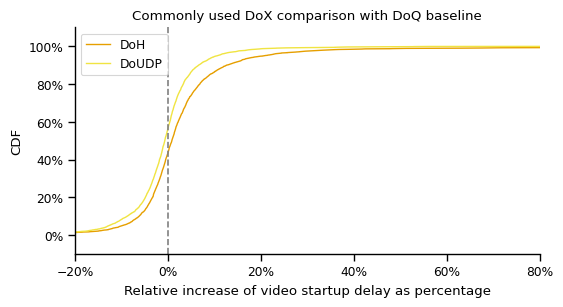

In [392]:
df_tmp = df_diff_startup_delay_quic
fig, ax = plt.subplots(1, 1, sharex='all', sharey='all', figsize=(6,3))
line_order = ['DoQ', 'DoH', 'DoT', 'DoTCP', 'DoUDP']
colors = dict(zip(line_order, ['C0','C1','C2','C3','C4','C5','C6','C7','C8','C9']))
markers = dict(zip(line_order, ['o','v','^','>','s','p','h','d','<','.']))
sample_size = dict()
columns = ['DoH', 'DoUDP']
lnwidth = 1
mrksize = 0
log=False
for col_val_ in columns:
    #cdf = Cdf.MakeCdfFromList(df_tmp[col_val_])
    print(col_val_)
    print(df_tmp[col_val_].describe([.1,.2,.3,.4,.5,.6,.7,.8,.9,1.,.25,.75]))
    #ax.plot(cdf.xs, cdf.ps, label=col_val_,
    #            linestyle='-', linewidth=lnwidth, 
    #            markersize=mrksize, fillstyle='none', 
    #            markevery=max(1, int(len(cdf.xs)/10)), drawstyle="default",
    #            color=colors[col_val_], marker=markers[col_val_]
    #        )
    dfplt = make_cdf(df_tmp[col_val_])
    dfplt.plot(ax=ax, label=col_val_, marker=markers[col_val_], markersize=mrksize, drawstyle="default", color=colors[col_val_], linestyle='-', linewidth=lnwidth, logx=log)

plt.axvline(x=0, color='gray', linestyle='--')
ax.yaxis.set_major_formatter(PercentFormatter(xmax = 1.0))

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.yaxis.set_ticks_position('left')
ax.xaxis.set_ticks_position('bottom')
ax.spines['bottom'].set_position(('axes', -0.0))
ax.spines['left'].set_position(('axes', -0.0))
if log:
    ax.set_xscale('log')

#ax.xaxis.set_major_formatter(ticker.StrMethodFormatter("{x:g}"))
#ax.xaxis.set_minor_formatter(ticker.StrMethodFormatter("{x:g}"))
ax.xaxis.set_major_formatter(ticker.PercentFormatter())
ax.xaxis.set_minor_formatter(ticker.PercentFormatter())

ax.tick_params(axis='x', which='minor', labelsize=6)
ax.xaxis.set_tick_params(labelbottom=True, which='both')


ax.set_title('Commonly used DoX comparison with DoQ baseline')

ax.set_xlabel('Relative increase of video startup delay as percentage')

ax.set_ylabel("CDF")
ax.set_ylim(-0.1,1.1)
ax.set_xlim(-20, 80)
ax.legend()


if log:
    fig.savefig('figures/startup-delay-rel-inc-doq-baseline-log.pdf', format='pdf', bbox_inches='tight')
else:
    fig.savefig('figures/startup-delay-rel-inc-doq-baseline.pdf', format='pdf', bbox_inches='tight')
plt.show()